# AI_campus_ProstateSeg 
# Module 10: Image Segmentation Using Softmax Classifier
### PANDA: Prostate cANcer graDe Assessment (PANDA) Challenge

In this module, we will develop a basic machine learning model to obtain segmentation results for the images. This model can serve as a baseline for more advanced models that use convolutions, such as U-Net, or transformers for image segmentation. Since each image can be represented as a (H, W, 3) tensor -- with three channels for R, G, and B -- we can feed in the RGB vectors that characterize each pixel into a softmax classifier, which outputs a probability distribution for that pixel to belong to each of the five possible classes. This type of a model ignores the spatial relationships and spatial distribution of the pixels in an image, effectively treating each pixel independently -- regardless of its position in the image, or with respect to the positions and types of neighboring pixels. 

### 1. Import the necessary packages

In [1]:
import os
import tifffile
import numpy as np
import matplotlib.pyplot as plt
import panda_utils as putil
import torch
import torch.nn as nn
import torch.nn.functional as F
import torchvision.transforms as transforms
import cv2

from PIL import Image
from typing import List, Set, Union, Optional, Dict, Tuple
from torch.utils.data import Dataset, DataLoader
from dataclass import ToyPANDASDataset
from torchvision.transforms import functional as Fv
from scipy.stats import entropy
from normalizers import ChannelWiseMinMaxNormalizer
from sklearn.cluster import MeanShift
from sklearn.preprocessing import MinMaxScaler

### 2. Define folder and subdirectory folder names

In [2]:
ROOT_FOLDER = "sample_data"
IMAGE_SUBFOLDER = "train_images"
MASK_SUBFOLDER = "train_label_masks"

image_dir = os.path.join(ROOT_FOLDER, IMAGE_SUBFOLDER)
mask_dir = os.path.join(ROOT_FOLDER, MASK_SUBFOLDER)

### 3. Create list of image and mask files and print contents

In [3]:
image_files = list(filter(lambda file: file != '.DS_Store', sorted(os.listdir(image_dir))))
mask_files = list(filter(lambda file: file != '.DS_Store', sorted(os.listdir(mask_dir))))

In [4]:
image_files

['0018ae58b01bdadc8e347995b69f99aa.tiff',
 '004dd32d9cd167d9cc31c13b704498af.tiff',
 '0068d4c7529e34fd4c9da863ce01a161.tiff',
 '006f6aa35a78965c92fffd1fbd53a058.tiff',
 '007433133235efc27a39f11df6940829.tiff',
 '0076bcb66e46fb485f5ba432b9a1fe8a.tiff',
 '008069b542b0439ed69b194674051964.tiff',
 '00928370e2dfeb8a507667ef1d4efcbb.tiff',
 '00951a7fad040bf7e90f32e81fc0746f.tiff',
 '00a26aaa82c959624d90dfb69fcf259c.tiff']

In [5]:
mask_files

['0018ae58b01bdadc8e347995b69f99aa_mask.tiff',
 '004dd32d9cd167d9cc31c13b704498af_mask.tiff',
 '0068d4c7529e34fd4c9da863ce01a161_mask.tiff',
 '006f6aa35a78965c92fffd1fbd53a058_mask.tiff',
 '007433133235efc27a39f11df6940829_mask.tiff',
 '0076bcb66e46fb485f5ba432b9a1fe8a_mask.tiff',
 '008069b542b0439ed69b194674051964_mask.tiff',
 '00928370e2dfeb8a507667ef1d4efcbb_mask.tiff',
 '00951a7fad040bf7e90f32e81fc0746f_mask.tiff',
 '00a26aaa82c959624d90dfb69fcf259c_mask.tiff']

### 4. Load and print out the dimensions of each of the image files contained in the image folder

In [6]:
for image_file in image_files:
    img = tifffile.imread(os.path.join(ROOT_FOLDER, IMAGE_SUBFOLDER, image_file))
    print(img.shape)

(25344, 5888, 3)
(22528, 8192, 3)
(10496, 6912, 3)
(7680, 2048, 3)
(24320, 9472, 3)
(14848, 11776, 3)
(8704, 23808, 3)
(36352, 10752, 3)
(8192, 11520, 3)
(20736, 18688, 3)


The images above follow a (H, W, 3) format with three channels for R, G, and B. We need to re-cast them into a N by 3 matrix where N corresponds to the number of pixels or points present in the image and 3 corresponds to R, G, and B values in a three-dimensional vector that represents each point or pixel. Sample a test image. 

In [7]:
test_image = tifffile.imread(os.path.join(ROOT_FOLDER, IMAGE_SUBFOLDER, image_files[0]))

Print shape of test image. 

In [8]:
test_image.shape

(25344, 5888, 3)

Apply re-shape operation to make tensor compatible with softmax classification model. 

In [9]:
print(f"Number of points or pixels present in the image: {test_image.shape[0] * test_image.shape[1]}")

Number of points or pixels present in the image: 149225472


In [10]:
reshaped_image = test_image.reshape(-1, 3)

Print dimensionality of reshaped image.

In [11]:
reshaped_image.shape

(149225472, 3)

Print length of reshaped_image

In [12]:
len(reshaped_image)

149225472

Print the first tensor (three-dimensional RGB vector that characterizes that pixel or point in image at the top left corner)

In [13]:
reshaped_image[0]

array([255, 255, 255], dtype=uint8)

Print the last tensor (three-dimensional RGB vector that characterizes that pixel or point in image at the bottom right corner)

In [14]:
reshaped_image[reshaped_image.shape[0] - 1]

array([255, 255, 255], dtype=uint8)

Print the middle point of the image. 

In [15]:
reshaped_image[reshaped_image.shape[0]//2]

array([244, 244, 244], dtype=uint8)

Overview of pytorch cross entropy function. In our softmax classifier, we are applying a neural network to the three-dimensional RGB pixel vector, and outputting a probability distribution over each of the six classes in the dataset as follows:

- 0: "background (non tissue) or unknown"
- 1: "stroma (connective tissue, non-epithelium tissue)"
- 2: "healthy (benign) epithelium"
- 3: "cancerous epithelium (Gleason 3)"
- 4: "cancerous epithelium (Gleason 4)"
- 5: "cancerous epithelium (Gleason 5)"

The cross entropy loss function in pytorch expects integer labels for each of the classes, instead of a one-hot distribution, which it internally re-casts the integer label into. Example:

In [16]:
loss_fn = nn.CrossEntropyLoss()

# Consider the following logits_batch, which is the output type for a softmax classifier
logits_batch = torch.tensor([[-1.0, 1.0, 2.0], 
                             [2.5, -0.5, 0.0], 
                             [0.8, 1.2, -2.3]])

# The target batch is represented as an integer array of class labels
target_batch = torch.tensor([2, 0, 1])

# The cross entropy loss function can be calculated as 
loss_batch = loss_fn(logits_batch, target_batch)

print(f"Loss (batch): {loss_batch.item():.4f}")

Loss (batch): 0.3346


We can re-create the above, under the hood, calculations of the cross entropy loss function as follows. First, apply the softmax function:

In [17]:
softmax_logits_batch = F.softmax(logits_batch)

/var/folders/70/hy2r56_j0wb9862yd1584x340000gn/T/ipykernel_6154/2134318188.py:1: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  softmax_logits_batch = F.softmax(logits_batch)


Print the logits batch after applying the softmax function row by row

In [18]:
softmax_logits_batch

tensor([[0.0351, 0.2595, 0.7054],
        [0.8835, 0.0440, 0.0725],
        [0.3942, 0.5881, 0.0178]])

Re-cast the target batch of integer labels ([2, 0, 1]) as a one hot vector, where there is a 1 located at the index indicated in the target_batch.

In [19]:
one_hot_sample_batch = torch.tensor([[0,0,1],
                                     [1,0,0],
                                     [0,1,0]])

Print the one hot sample batch.

In [20]:
one_hot_sample_batch

tensor([[0, 0, 1],
        [1, 0, 0],
        [0, 1, 0]])

Re-define the cross entropy loss function from earlier module. 

In [21]:
def ce_loss(true, predicted):
    
    assert len(true) == len(predicted)
    loss = 0.0
    
    for i in range(len(true)):
        loss += true[i]*np.log(predicted[i])
    
    return -loss

Apply the cross entropy loss function to the data row by row for the one hot sample batch and the softmax logits batch, and then compute the average. 

In [22]:
total_ce_loss = 0.0
for i in range(len(softmax_logits_batch)):
    total_ce_loss += ce_loss(one_hot_sample_batch[i].numpy(), softmax_logits_batch[i].numpy())
print(round(total_ce_loss/3, 4))

0.3346


The result above (0.3346) is the same as the one calculated by the cross entropy loss function in the pytorch module.

Write a dataset and dataloader class to fetch the image data on a pixel by pixel basis (casted as three-dimensional RGB vectors). The initial dataset and dataloader class was written to process the images on a tile by tile basis. 

In [23]:
# print list of mask files
mask_files

['0018ae58b01bdadc8e347995b69f99aa_mask.tiff',
 '004dd32d9cd167d9cc31c13b704498af_mask.tiff',
 '0068d4c7529e34fd4c9da863ce01a161_mask.tiff',
 '006f6aa35a78965c92fffd1fbd53a058_mask.tiff',
 '007433133235efc27a39f11df6940829_mask.tiff',
 '0076bcb66e46fb485f5ba432b9a1fe8a_mask.tiff',
 '008069b542b0439ed69b194674051964_mask.tiff',
 '00928370e2dfeb8a507667ef1d4efcbb_mask.tiff',
 '00951a7fad040bf7e90f32e81fc0746f_mask.tiff',
 '00a26aaa82c959624d90dfb69fcf259c_mask.tiff']

In [24]:
# print list of image files
image_files

['0018ae58b01bdadc8e347995b69f99aa.tiff',
 '004dd32d9cd167d9cc31c13b704498af.tiff',
 '0068d4c7529e34fd4c9da863ce01a161.tiff',
 '006f6aa35a78965c92fffd1fbd53a058.tiff',
 '007433133235efc27a39f11df6940829.tiff',
 '0076bcb66e46fb485f5ba432b9a1fe8a.tiff',
 '008069b542b0439ed69b194674051964.tiff',
 '00928370e2dfeb8a507667ef1d4efcbb.tiff',
 '00951a7fad040bf7e90f32e81fc0746f.tiff',
 '00a26aaa82c959624d90dfb69fcf259c.tiff']

In [26]:
# print number of image files
print(len(image_files))

10


Write dataset class to get images in terms of three-dimensional RGB vectors

In [33]:
class RGBImageDataset(Dataset):
    def __init__(self, 
                 mask_files: List[str],
                 image_files: List[str],
                 root_folder: str,
                 image_subfolder: str,
                 mask_subfolder: str):
        
        """
        Args:
            image_files (List[str]): List of image filenames
            mask_files (List[str]): List of mask filenames (masks should be ordered and each must be
            paired with the corresponding image files)
            root_folder (str): Root folder containing subfolders for images and mask files
            image_subfolder (str): Subfolder containing images within root folder 
            mask_subfolder (str): Subfolder containing masks within root folder
        """
        
        self.mask_files = mask_files
        self.image_files = image_files
        self.root_folder = root_folder
        self.image_subfolder = image_subfolder
        self.mask_subfolder = mask_subfolder
        self.masks = []
        self.images = []
        
        for i in range(len(self.mask_files)):
            
            mask_file = self.mask_files[i]
            image_file = self.image_files[i]
            
            mask = tifffile.imread(os.path.join(self.root_folder, self.mask_subfolder, mask_file))
            mask = mask[:, :, 0]
            
            image = tifffile.imread(os.path.join(self.root_folder, self.image_subfolder, image_file))
            flattened_mask = mask.reshape(-1, 1)
            reshaped_image = image.reshape(-1, 3)
            
            self.images.append(reshaped_image)
            self.masks.append(flattened_mask)
        
        self.images = np.vstack(self.images)
        self.masks = np.vstack(self.masks)
        
    def __len__(self):
        # return the length of the dataset, which is the total number of images contained in the images folder
        return len(self.images)
    
    def __getitem__(self, idx):
        # fetch one dataset item by index from the images and masks folder
        return self.images[idx], self.masks[idx]

Instantiate the dataset class and read only the first image and mask pair

In [34]:
rgb_dataset = RGBImageDataset(mask_files = mask_files[0:1],
                              image_files = image_files[0:1],
                              root_folder = ROOT_FOLDER,
                              image_subfolder = IMAGE_SUBFOLDER,
                              mask_subfolder = MASK_SUBFOLDER)

Print the length of the dataset, these are the number of three-dimensional RGB vectors available for training

In [37]:
len(rgb_dataset)

149225472

Print the first element (index 0) of the dataset, this is a three-dimensional RGB vector

In [39]:
rgb_dataset[0]

(array([255, 255, 255], dtype=uint8), array([0], dtype=uint8))

Instantiate the dataloader class with batch size of 128 and shuffling set to True

In [40]:
rgb_loader = DataLoader(rgb_dataset, 
                        batch_size=128, 
                        shuffle=True)

Print the length of the data loader, this will output the number of batches available for training

In [28]:
len(rgb_loader)

1165824

In order to examine the dimensionality of one of the batches and labels, start an iterator on the data loader. Using this iterator, we can fetch data on a batch by batch basis for both the images and the labels, which are the flattened masks

In [42]:
data_iter = iter(rgb_loader)

Call next on the data iterator in order to fetch batches of images and labels

In [43]:
image_batch, label_batch = next(data_iter)

Print the dimensionality of the image batch. This should be equal to the batch size and the dimensionality of the RGB vector which featurizes each pixel, which is 3

In [45]:
image_batch.shape

torch.Size([128, 3])

Print the dimensionality of the label batch. This should be equal to the batch size and 1, which is the integer label associated with the corresponding pixel in the image batch

In [32]:
label_batch.shape

torch.Size([128, 1])

In order to make the label tensor compatible with the cross entropy loss function, reshape it and drop one dimension

In [48]:
casted_label_batch = label_batch.view(-1)

Print the dimensionality of the casted label batch, this will be dimensionality of the label batch fed into the loss function

In [52]:
casted_label_batch.shape

torch.Size([128])

Print the casted label batch. This contains a list of integer class labels for the batch

In [56]:
casted_label_batch

tensor([1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0,
        0, 0, 0, 0, 1, 1, 0, 1, 0, 0, 1, 0, 1, 1, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0,
        1, 4, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 1, 0, 0, 0, 0, 4, 0, 4,
        0, 1, 0, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 0, 4, 0, 0, 0, 1, 4, 4, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0,
        0, 0, 0, 0, 0, 0, 0, 0], dtype=torch.uint8)

Print the type of the casted label batch

In [59]:
print(casted_label_batch.type())

torch.ByteTensor


Define a simple, multi-layer perceptron in order to process three-dimensional RGB vectors, which represent each pixel in an image, as inputs and finally process them to output a distribution over all classes that pixel could belong to. The inputs to define the neural network are the input size (size of the input feature vector, which is a three-dimensional RGB vector in this case), hidden size (the number of neurons in the single hidden layer), and output size (the number of neurons in the output layer, which is sixe in this case for each of the six classes in the segmentation mask: 0, 1, 2, 3, 4, 5, 6). 

In [60]:
class MLP(nn.Module):
    def __init__(self, input_size, hidden_size, output_size):
        super(MLP, self).__init__()
        self.fc1 = nn.Linear(input_size, hidden_size)
        self.fc2 = nn.Linear(hidden_size, output_size)
    
    def forward(self, x):
        x = torch.relu(self.fc1(x))
        x = self.fc2(x)
        return x

Instantiate the multi-layer perceptron model with input size of 3 (corresponding to the three-dimensional RGB vector), hidden size of 10 (corresponding to the number of neurons in the single hidden layer between the input layer and the output layer), output size of 6 (corresponding to the number of neurons in the output layer, which is the number of classes in the segmentation mask).

In [61]:
nn_segmenter = MLP(input_size = 3,
                   hidden_size = 10,
                   output_size = 6)

Pass the sampled image batch into the segmenter model after casting it to float32

In [62]:
output = nn_segmenter(image_batch.to(torch.float32))

Print the dimensionality of the output layer, which is the batch size times the number of classes. For each three-dimensional RGB vector passed into the model, tthe network returns a probability distribution over each of the six classes it could belong to.

In [63]:
output.shape

torch.Size([128, 6])

Instantiate the cross entropy loss function and calculate the loss between the neural network output and the casted label batch to verify correct functionality

In [65]:
loss_fn = nn.CrossEntropyLoss()
loss_batch = loss_fn(output, casted_label_batch)

Instantiate the model and run training for one epoch

In [66]:
# Instantiate the model
nn_segmenter = MLP(input_size=3, hidden_size=10, output_size=6)

# Set up the optimizer
optimizer = torch.optim.Adam(nn_segmenter.parameters(), lr=0.001)

# Define the loss function
loss_fn = nn.CrossEntropyLoss()

# List to store the loss at each step (epoch and batch)
epoch_losses = []
batch_losses = []

# Training loop

# Define the number of epochs to train
num_epochs = 1 
for epoch in range(num_epochs):
    epoch_loss = 0.0 
    
    # Set the model to training mode
    nn_segmenter.train() 

    for batch_idx, (image_batch, label_batch) in enumerate(rgb_loader):
        
        # Re-cast the label batch to make it compatible with cross entropy loss calculation
        casted_label_batch = label_batch.view(-1)
        
        # Zero the gradients from the previous step
        optimizer.zero_grad()

        # Forward pass through the model
        output = nn_segmenter(image_batch.to(torch.float32))

        # Compute the loss
        loss_batch = loss_fn(output, casted_label_batch)

        # Backpropagation to calculate gradients
        loss_batch.backward()

        # Update model parameters
        optimizer.step()

        # Update the running total loss for the epoch
        epoch_loss += loss_batch.item()
        
        # Append the loss to the batch losses
        batch_losses.append(loss_batch.item())

        # Print the loss at intervals of 25
        if batch_idx % 25 == 0:
            print(f"Epoch [{epoch+1}/{num_epochs}], Batch [{batch_idx+1}/{len(rgb_loader)}], Loss: {loss_batch.item()}")

    # Append the average loss for the epoch to the loss list
    avg_epoch_loss = epoch_loss / len(rgb_loader)
    losses.append(avg_epoch_loss)

    # Print average loss at the end of each epoch
    print(f"Epoch [{epoch+1}/{num_epochs}] Average Loss: {avg_epoch_loss}")

Epoch [1/1], Batch [1/1165824], Loss: 66.05721282958984
Epoch [1/1], Batch [26/1165824], Loss: 30.49155616760254
Epoch [1/1], Batch [51/1165824], Loss: 1.2422035932540894
Epoch [1/1], Batch [76/1165824], Loss: 1.5115362405776978
Epoch [1/1], Batch [101/1165824], Loss: 1.1774563789367676
Epoch [1/1], Batch [126/1165824], Loss: 0.4761655330657959
Epoch [1/1], Batch [151/1165824], Loss: 0.4647044539451599
Epoch [1/1], Batch [176/1165824], Loss: 0.5522868633270264
Epoch [1/1], Batch [201/1165824], Loss: 0.37625783681869507
Epoch [1/1], Batch [226/1165824], Loss: 0.43960830569267273
Epoch [1/1], Batch [251/1165824], Loss: 0.39127883315086365
Epoch [1/1], Batch [276/1165824], Loss: 0.322562575340271
Epoch [1/1], Batch [301/1165824], Loss: 0.3492666184902191
Epoch [1/1], Batch [326/1165824], Loss: 0.1768849790096283
Epoch [1/1], Batch [351/1165824], Loss: 0.27752822637557983
Epoch [1/1], Batch [376/1165824], Loss: 0.36019599437713623
Epoch [1/1], Batch [401/1165824], Loss: 0.2677297294139862


Epoch [1/1], Batch [3476/1165824], Loss: 0.23108363151550293
Epoch [1/1], Batch [3501/1165824], Loss: 0.22978892922401428
Epoch [1/1], Batch [3526/1165824], Loss: 0.30839377641677856
Epoch [1/1], Batch [3551/1165824], Loss: 0.43132075667381287
Epoch [1/1], Batch [3576/1165824], Loss: 0.22305747866630554
Epoch [1/1], Batch [3601/1165824], Loss: 0.2859085500240326
Epoch [1/1], Batch [3626/1165824], Loss: 0.34892749786376953
Epoch [1/1], Batch [3651/1165824], Loss: 0.2563439905643463
Epoch [1/1], Batch [3676/1165824], Loss: 0.33787718415260315
Epoch [1/1], Batch [3701/1165824], Loss: 0.2676689028739929
Epoch [1/1], Batch [3726/1165824], Loss: 0.32908111810684204
Epoch [1/1], Batch [3751/1165824], Loss: 0.17306871712207794
Epoch [1/1], Batch [3776/1165824], Loss: 0.23120978474617004
Epoch [1/1], Batch [3801/1165824], Loss: 0.3407326936721802
Epoch [1/1], Batch [3826/1165824], Loss: 0.28626230359077454
Epoch [1/1], Batch [3851/1165824], Loss: 0.24342654645442963
Epoch [1/1], Batch [3876/116

Epoch [1/1], Batch [6951/1165824], Loss: 0.22152332961559296
Epoch [1/1], Batch [6976/1165824], Loss: 0.39421185851097107
Epoch [1/1], Batch [7001/1165824], Loss: 0.35295814275741577
Epoch [1/1], Batch [7026/1165824], Loss: 0.26397156715393066
Epoch [1/1], Batch [7051/1165824], Loss: 0.38305866718292236
Epoch [1/1], Batch [7076/1165824], Loss: 0.19265872240066528
Epoch [1/1], Batch [7101/1165824], Loss: 0.32831883430480957
Epoch [1/1], Batch [7126/1165824], Loss: 0.287945032119751
Epoch [1/1], Batch [7151/1165824], Loss: 0.45097410678863525
Epoch [1/1], Batch [7176/1165824], Loss: 0.24744555354118347
Epoch [1/1], Batch [7201/1165824], Loss: 0.2871474027633667
Epoch [1/1], Batch [7226/1165824], Loss: 0.21678176522254944
Epoch [1/1], Batch [7251/1165824], Loss: 0.3078429102897644
Epoch [1/1], Batch [7276/1165824], Loss: 0.35736170411109924
Epoch [1/1], Batch [7301/1165824], Loss: 0.275001585483551
Epoch [1/1], Batch [7326/1165824], Loss: 0.3679809868335724
Epoch [1/1], Batch [7351/116582

Epoch [1/1], Batch [10401/1165824], Loss: 0.27244341373443604
Epoch [1/1], Batch [10426/1165824], Loss: 0.3116879463195801
Epoch [1/1], Batch [10451/1165824], Loss: 0.2498193234205246
Epoch [1/1], Batch [10476/1165824], Loss: 0.25307121872901917
Epoch [1/1], Batch [10501/1165824], Loss: 0.26003703474998474
Epoch [1/1], Batch [10526/1165824], Loss: 0.15210504829883575
Epoch [1/1], Batch [10551/1165824], Loss: 0.17086216807365417
Epoch [1/1], Batch [10576/1165824], Loss: 0.23816069960594177
Epoch [1/1], Batch [10601/1165824], Loss: 0.2142307609319687
Epoch [1/1], Batch [10626/1165824], Loss: 0.2916107773780823
Epoch [1/1], Batch [10651/1165824], Loss: 0.36799365282058716
Epoch [1/1], Batch [10676/1165824], Loss: 0.21423186361789703
Epoch [1/1], Batch [10701/1165824], Loss: 0.15899203717708588
Epoch [1/1], Batch [10726/1165824], Loss: 0.32592976093292236
Epoch [1/1], Batch [10751/1165824], Loss: 0.29724305868148804
Epoch [1/1], Batch [10776/1165824], Loss: 0.22175729274749756
Epoch [1/1],

Epoch [1/1], Batch [14001/1165824], Loss: 0.21606898307800293
Epoch [1/1], Batch [14026/1165824], Loss: 0.27248629927635193
Epoch [1/1], Batch [14051/1165824], Loss: 0.318436861038208
Epoch [1/1], Batch [14076/1165824], Loss: 0.29324689507484436
Epoch [1/1], Batch [14101/1165824], Loss: 0.30745670199394226
Epoch [1/1], Batch [14126/1165824], Loss: 0.19781433045864105
Epoch [1/1], Batch [14151/1165824], Loss: 0.35497966408729553
Epoch [1/1], Batch [14176/1165824], Loss: 0.3712429702281952
Epoch [1/1], Batch [14201/1165824], Loss: 0.2503904104232788
Epoch [1/1], Batch [14226/1165824], Loss: 0.3389418423175812
Epoch [1/1], Batch [14251/1165824], Loss: 0.2675863802433014
Epoch [1/1], Batch [14276/1165824], Loss: 0.42225146293640137
Epoch [1/1], Batch [14301/1165824], Loss: 0.3552897572517395
Epoch [1/1], Batch [14326/1165824], Loss: 0.17138426005840302
Epoch [1/1], Batch [14351/1165824], Loss: 0.28379741311073303
Epoch [1/1], Batch [14376/1165824], Loss: 0.24754299223423004
Epoch [1/1], Ba

Epoch [1/1], Batch [17601/1165824], Loss: 0.21107175946235657
Epoch [1/1], Batch [17626/1165824], Loss: 0.21959078311920166
Epoch [1/1], Batch [17651/1165824], Loss: 0.27807047963142395
Epoch [1/1], Batch [17676/1165824], Loss: 0.28928831219673157
Epoch [1/1], Batch [17701/1165824], Loss: 0.20621967315673828
Epoch [1/1], Batch [17726/1165824], Loss: 0.34589943289756775
Epoch [1/1], Batch [17751/1165824], Loss: 0.2367958128452301
Epoch [1/1], Batch [17776/1165824], Loss: 0.3526155352592468
Epoch [1/1], Batch [17801/1165824], Loss: 0.27183282375335693
Epoch [1/1], Batch [17826/1165824], Loss: 0.2394067496061325
Epoch [1/1], Batch [17851/1165824], Loss: 0.30335110425949097
Epoch [1/1], Batch [17876/1165824], Loss: 0.2490023523569107
Epoch [1/1], Batch [17901/1165824], Loss: 0.256385862827301
Epoch [1/1], Batch [17926/1165824], Loss: 0.31955617666244507
Epoch [1/1], Batch [17951/1165824], Loss: 0.3110373914241791
Epoch [1/1], Batch [17976/1165824], Loss: 0.32554659247398376
Epoch [1/1], Ba

Epoch [1/1], Batch [21201/1165824], Loss: 0.3401504158973694
Epoch [1/1], Batch [21226/1165824], Loss: 0.27042490243911743
Epoch [1/1], Batch [21251/1165824], Loss: 0.2945186495780945
Epoch [1/1], Batch [21276/1165824], Loss: 0.15838640928268433
Epoch [1/1], Batch [21301/1165824], Loss: 0.32236793637275696
Epoch [1/1], Batch [21326/1165824], Loss: 0.2608671486377716
Epoch [1/1], Batch [21351/1165824], Loss: 0.3668321669101715
Epoch [1/1], Batch [21376/1165824], Loss: 0.2473144233226776
Epoch [1/1], Batch [21401/1165824], Loss: 0.25941866636276245
Epoch [1/1], Batch [21426/1165824], Loss: 0.278795450925827
Epoch [1/1], Batch [21451/1165824], Loss: 0.3790097236633301
Epoch [1/1], Batch [21476/1165824], Loss: 0.3341929316520691
Epoch [1/1], Batch [21501/1165824], Loss: 0.3351741135120392
Epoch [1/1], Batch [21526/1165824], Loss: 0.20032981038093567
Epoch [1/1], Batch [21551/1165824], Loss: 0.27269241213798523
Epoch [1/1], Batch [21576/1165824], Loss: 0.2626101076602936
Epoch [1/1], Batch 

Epoch [1/1], Batch [24801/1165824], Loss: 0.3476628065109253
Epoch [1/1], Batch [24826/1165824], Loss: 0.3673020005226135
Epoch [1/1], Batch [24851/1165824], Loss: 0.28814876079559326
Epoch [1/1], Batch [24876/1165824], Loss: 0.3282024562358856
Epoch [1/1], Batch [24901/1165824], Loss: 0.35994985699653625
Epoch [1/1], Batch [24926/1165824], Loss: 0.34190407395362854
Epoch [1/1], Batch [24951/1165824], Loss: 0.20121313631534576
Epoch [1/1], Batch [24976/1165824], Loss: 0.3518471121788025
Epoch [1/1], Batch [25001/1165824], Loss: 0.27050238847732544
Epoch [1/1], Batch [25026/1165824], Loss: 0.21469460427761078
Epoch [1/1], Batch [25051/1165824], Loss: 0.33503174781799316
Epoch [1/1], Batch [25076/1165824], Loss: 0.23678195476531982
Epoch [1/1], Batch [25101/1165824], Loss: 0.29909181594848633
Epoch [1/1], Batch [25126/1165824], Loss: 0.2883360981941223
Epoch [1/1], Batch [25151/1165824], Loss: 0.19037505984306335
Epoch [1/1], Batch [25176/1165824], Loss: 0.2526383697986603
Epoch [1/1], B

Epoch [1/1], Batch [28401/1165824], Loss: 0.32500994205474854
Epoch [1/1], Batch [28426/1165824], Loss: 0.31676623225212097
Epoch [1/1], Batch [28451/1165824], Loss: 0.34534895420074463
Epoch [1/1], Batch [28476/1165824], Loss: 0.273197740316391
Epoch [1/1], Batch [28501/1165824], Loss: 0.13998451828956604
Epoch [1/1], Batch [28526/1165824], Loss: 0.23351924121379852
Epoch [1/1], Batch [28551/1165824], Loss: 0.28253063559532166
Epoch [1/1], Batch [28576/1165824], Loss: 0.245184987783432
Epoch [1/1], Batch [28601/1165824], Loss: 0.2540937066078186
Epoch [1/1], Batch [28626/1165824], Loss: 0.24291694164276123
Epoch [1/1], Batch [28651/1165824], Loss: 0.2398131638765335
Epoch [1/1], Batch [28676/1165824], Loss: 0.2593599557876587
Epoch [1/1], Batch [28701/1165824], Loss: 0.27101266384124756
Epoch [1/1], Batch [28726/1165824], Loss: 0.3640536069869995
Epoch [1/1], Batch [28751/1165824], Loss: 0.3372551500797272
Epoch [1/1], Batch [28776/1165824], Loss: 0.28786394000053406
Epoch [1/1], Batc

Epoch [1/1], Batch [32001/1165824], Loss: 0.19748398661613464
Epoch [1/1], Batch [32026/1165824], Loss: 0.27526405453681946
Epoch [1/1], Batch [32051/1165824], Loss: 0.241950124502182
Epoch [1/1], Batch [32076/1165824], Loss: 0.20894291996955872
Epoch [1/1], Batch [32101/1165824], Loss: 0.2536694407463074
Epoch [1/1], Batch [32126/1165824], Loss: 0.1417129635810852
Epoch [1/1], Batch [32151/1165824], Loss: 0.2211747020483017
Epoch [1/1], Batch [32176/1165824], Loss: 0.2198534607887268
Epoch [1/1], Batch [32201/1165824], Loss: 0.18465296924114227
Epoch [1/1], Batch [32226/1165824], Loss: 0.28767696022987366
Epoch [1/1], Batch [32251/1165824], Loss: 0.32500725984573364
Epoch [1/1], Batch [32276/1165824], Loss: 0.20974783599376678
Epoch [1/1], Batch [32301/1165824], Loss: 0.33656758069992065
Epoch [1/1], Batch [32326/1165824], Loss: 0.23805686831474304
Epoch [1/1], Batch [32351/1165824], Loss: 0.25597867369651794
Epoch [1/1], Batch [32376/1165824], Loss: 0.41715729236602783
Epoch [1/1], B

Epoch [1/1], Batch [35551/1165824], Loss: 0.2533722519874573
Epoch [1/1], Batch [35576/1165824], Loss: 0.28809091448783875
Epoch [1/1], Batch [35601/1165824], Loss: 0.08930142223834991
Epoch [1/1], Batch [35626/1165824], Loss: 0.24184444546699524
Epoch [1/1], Batch [35651/1165824], Loss: 0.1643001288175583
Epoch [1/1], Batch [35676/1165824], Loss: 0.1539594978094101
Epoch [1/1], Batch [35701/1165824], Loss: 0.21505290269851685
Epoch [1/1], Batch [35726/1165824], Loss: 0.24985069036483765
Epoch [1/1], Batch [35751/1165824], Loss: 0.17763878405094147
Epoch [1/1], Batch [35776/1165824], Loss: 0.24121175706386566
Epoch [1/1], Batch [35801/1165824], Loss: 0.19887223839759827
Epoch [1/1], Batch [35826/1165824], Loss: 0.17207852005958557
Epoch [1/1], Batch [35851/1165824], Loss: 0.24602510035037994
Epoch [1/1], Batch [35876/1165824], Loss: 0.14492519199848175
Epoch [1/1], Batch [35901/1165824], Loss: 0.22460415959358215
Epoch [1/1], Batch [35926/1165824], Loss: 0.2760612368583679
Epoch [1/1],

Epoch [1/1], Batch [39051/1165824], Loss: 0.17856688797473907
Epoch [1/1], Batch [39076/1165824], Loss: 0.21718434989452362
Epoch [1/1], Batch [39101/1165824], Loss: 0.3209623098373413
Epoch [1/1], Batch [39126/1165824], Loss: 0.29168906807899475
Epoch [1/1], Batch [39151/1165824], Loss: 0.23050743341445923
Epoch [1/1], Batch [39176/1165824], Loss: 0.32973939180374146
Epoch [1/1], Batch [39201/1165824], Loss: 0.2123471051454544
Epoch [1/1], Batch [39226/1165824], Loss: 0.40158528089523315
Epoch [1/1], Batch [39251/1165824], Loss: 0.27528560161590576
Epoch [1/1], Batch [39276/1165824], Loss: 0.33214282989501953
Epoch [1/1], Batch [39301/1165824], Loss: 0.23351359367370605
Epoch [1/1], Batch [39326/1165824], Loss: 0.19168081879615784
Epoch [1/1], Batch [39351/1165824], Loss: 0.24775061011314392
Epoch [1/1], Batch [39376/1165824], Loss: 0.17760881781578064
Epoch [1/1], Batch [39401/1165824], Loss: 0.2425929754972458
Epoch [1/1], Batch [39426/1165824], Loss: 0.30457764863967896
Epoch [1/1]

Epoch [1/1], Batch [42451/1165824], Loss: 0.3723219037055969
Epoch [1/1], Batch [42476/1165824], Loss: 0.23547565937042236
Epoch [1/1], Batch [42501/1165824], Loss: 0.30868443846702576
Epoch [1/1], Batch [42526/1165824], Loss: 0.26430413126945496
Epoch [1/1], Batch [42551/1165824], Loss: 0.15939241647720337
Epoch [1/1], Batch [42576/1165824], Loss: 0.3101171553134918
Epoch [1/1], Batch [42601/1165824], Loss: 0.2525118887424469
Epoch [1/1], Batch [42626/1165824], Loss: 0.2071336805820465
Epoch [1/1], Batch [42651/1165824], Loss: 0.23927253484725952
Epoch [1/1], Batch [42676/1165824], Loss: 0.2005457580089569
Epoch [1/1], Batch [42701/1165824], Loss: 0.26214954257011414
Epoch [1/1], Batch [42726/1165824], Loss: 0.3216498792171478
Epoch [1/1], Batch [42751/1165824], Loss: 0.35809609293937683
Epoch [1/1], Batch [42776/1165824], Loss: 0.219737246632576
Epoch [1/1], Batch [42801/1165824], Loss: 0.18071237206459045
Epoch [1/1], Batch [42826/1165824], Loss: 0.2231718748807907
Epoch [1/1], Batc

Epoch [1/1], Batch [46051/1165824], Loss: 0.23117946088314056
Epoch [1/1], Batch [46076/1165824], Loss: 0.2403496354818344
Epoch [1/1], Batch [46101/1165824], Loss: 0.2703138291835785
Epoch [1/1], Batch [46126/1165824], Loss: 0.2976488173007965
Epoch [1/1], Batch [46151/1165824], Loss: 0.1723281592130661
Epoch [1/1], Batch [46176/1165824], Loss: 0.2824976444244385
Epoch [1/1], Batch [46201/1165824], Loss: 0.2960298955440521
Epoch [1/1], Batch [46226/1165824], Loss: 0.2575354278087616
Epoch [1/1], Batch [46251/1165824], Loss: 0.21069130301475525
Epoch [1/1], Batch [46276/1165824], Loss: 0.2771705985069275
Epoch [1/1], Batch [46301/1165824], Loss: 0.23223502933979034
Epoch [1/1], Batch [46326/1165824], Loss: 0.2810661792755127
Epoch [1/1], Batch [46351/1165824], Loss: 0.336679071187973
Epoch [1/1], Batch [46376/1165824], Loss: 0.3130284547805786
Epoch [1/1], Batch [46401/1165824], Loss: 0.21980834007263184
Epoch [1/1], Batch [46426/1165824], Loss: 0.2758820354938507
Epoch [1/1], Batch [4

Epoch [1/1], Batch [49451/1165824], Loss: 0.239938884973526
Epoch [1/1], Batch [49476/1165824], Loss: 0.24435743689537048
Epoch [1/1], Batch [49501/1165824], Loss: 0.3103010952472687
Epoch [1/1], Batch [49526/1165824], Loss: 0.16104824841022491
Epoch [1/1], Batch [49551/1165824], Loss: 0.1889721155166626
Epoch [1/1], Batch [49576/1165824], Loss: 0.25824782252311707
Epoch [1/1], Batch [49601/1165824], Loss: 0.23089852929115295
Epoch [1/1], Batch [49626/1165824], Loss: 0.25203338265419006
Epoch [1/1], Batch [49651/1165824], Loss: 0.20351360738277435
Epoch [1/1], Batch [49676/1165824], Loss: 0.34036093950271606
Epoch [1/1], Batch [49701/1165824], Loss: 0.2781730592250824
Epoch [1/1], Batch [49726/1165824], Loss: 0.2598312199115753
Epoch [1/1], Batch [49751/1165824], Loss: 0.27449122071266174
Epoch [1/1], Batch [49776/1165824], Loss: 0.2457563728094101
Epoch [1/1], Batch [49801/1165824], Loss: 0.3074275851249695
Epoch [1/1], Batch [49826/1165824], Loss: 0.294581800699234
Epoch [1/1], Batch

Epoch [1/1], Batch [52901/1165824], Loss: 0.28640276193618774
Epoch [1/1], Batch [52926/1165824], Loss: 0.1873246133327484
Epoch [1/1], Batch [52951/1165824], Loss: 0.33876973390579224
Epoch [1/1], Batch [52976/1165824], Loss: 0.18921096622943878
Epoch [1/1], Batch [53001/1165824], Loss: 0.1883920431137085
Epoch [1/1], Batch [53026/1165824], Loss: 0.2304648607969284
Epoch [1/1], Batch [53051/1165824], Loss: 0.256813108921051
Epoch [1/1], Batch [53076/1165824], Loss: 0.27293288707733154
Epoch [1/1], Batch [53101/1165824], Loss: 0.122871533036232
Epoch [1/1], Batch [53126/1165824], Loss: 0.25495457649230957
Epoch [1/1], Batch [53151/1165824], Loss: 0.2319840043783188
Epoch [1/1], Batch [53176/1165824], Loss: 0.3070604205131531
Epoch [1/1], Batch [53201/1165824], Loss: 0.2614251375198364
Epoch [1/1], Batch [53226/1165824], Loss: 0.23025834560394287
Epoch [1/1], Batch [53251/1165824], Loss: 0.2921639382839203
Epoch [1/1], Batch [53276/1165824], Loss: 0.20306523144245148
Epoch [1/1], Batch 

Epoch [1/1], Batch [56376/1165824], Loss: 0.24914348125457764
Epoch [1/1], Batch [56401/1165824], Loss: 0.2956613004207611
Epoch [1/1], Batch [56426/1165824], Loss: 0.24513275921344757
Epoch [1/1], Batch [56451/1165824], Loss: 0.2085253745317459
Epoch [1/1], Batch [56476/1165824], Loss: 0.2706454396247864
Epoch [1/1], Batch [56501/1165824], Loss: 0.22898545861244202
Epoch [1/1], Batch [56526/1165824], Loss: 0.27421697974205017
Epoch [1/1], Batch [56551/1165824], Loss: 0.20288695394992828
Epoch [1/1], Batch [56576/1165824], Loss: 0.19094793498516083
Epoch [1/1], Batch [56601/1165824], Loss: 0.3075791895389557
Epoch [1/1], Batch [56626/1165824], Loss: 0.19819973409175873
Epoch [1/1], Batch [56651/1165824], Loss: 0.23647964000701904
Epoch [1/1], Batch [56676/1165824], Loss: 0.2856864929199219
Epoch [1/1], Batch [56701/1165824], Loss: 0.23707373440265656
Epoch [1/1], Batch [56726/1165824], Loss: 0.4894164204597473
Epoch [1/1], Batch [56751/1165824], Loss: 0.32627978920936584
Epoch [1/1], B

Epoch [1/1], Batch [59901/1165824], Loss: 0.1877211183309555
Epoch [1/1], Batch [59926/1165824], Loss: 0.19041994214057922
Epoch [1/1], Batch [59951/1165824], Loss: 0.2024349421262741
Epoch [1/1], Batch [59976/1165824], Loss: 0.16599202156066895
Epoch [1/1], Batch [60001/1165824], Loss: 0.2726192772388458
Epoch [1/1], Batch [60026/1165824], Loss: 0.2531029284000397
Epoch [1/1], Batch [60051/1165824], Loss: 0.32803574204444885
Epoch [1/1], Batch [60076/1165824], Loss: 0.13300827145576477
Epoch [1/1], Batch [60101/1165824], Loss: 0.23271767795085907
Epoch [1/1], Batch [60126/1165824], Loss: 0.2599336802959442
Epoch [1/1], Batch [60151/1165824], Loss: 0.36307457089424133
Epoch [1/1], Batch [60176/1165824], Loss: 0.16431578993797302
Epoch [1/1], Batch [60201/1165824], Loss: 0.3235899806022644
Epoch [1/1], Batch [60226/1165824], Loss: 0.30715957283973694
Epoch [1/1], Batch [60251/1165824], Loss: 0.23573437333106995
Epoch [1/1], Batch [60276/1165824], Loss: 0.1648915410041809
Epoch [1/1], Ba

Epoch [1/1], Batch [63451/1165824], Loss: 0.30078092217445374
Epoch [1/1], Batch [63476/1165824], Loss: 0.31051942706108093
Epoch [1/1], Batch [63501/1165824], Loss: 0.18786779046058655
Epoch [1/1], Batch [63526/1165824], Loss: 0.18396763503551483
Epoch [1/1], Batch [63551/1165824], Loss: 0.272123783826828
Epoch [1/1], Batch [63576/1165824], Loss: 0.2636862099170685
Epoch [1/1], Batch [63601/1165824], Loss: 0.2256726324558258
Epoch [1/1], Batch [63626/1165824], Loss: 0.21480248868465424
Epoch [1/1], Batch [63651/1165824], Loss: 0.14963123202323914
Epoch [1/1], Batch [63676/1165824], Loss: 0.28608042001724243
Epoch [1/1], Batch [63701/1165824], Loss: 0.17453907430171967
Epoch [1/1], Batch [63726/1165824], Loss: 0.2278968244791031
Epoch [1/1], Batch [63751/1165824], Loss: 0.2579500079154968
Epoch [1/1], Batch [63776/1165824], Loss: 0.19285394251346588
Epoch [1/1], Batch [63801/1165824], Loss: 0.21164152026176453
Epoch [1/1], Batch [63826/1165824], Loss: 0.15769051015377045
Epoch [1/1], B

Epoch [1/1], Batch [66951/1165824], Loss: 0.25570347905158997
Epoch [1/1], Batch [66976/1165824], Loss: 0.24191538989543915
Epoch [1/1], Batch [67001/1165824], Loss: 0.1502450555562973
Epoch [1/1], Batch [67026/1165824], Loss: 0.3242492377758026
Epoch [1/1], Batch [67051/1165824], Loss: 0.3134998679161072
Epoch [1/1], Batch [67076/1165824], Loss: 0.2487821727991104
Epoch [1/1], Batch [67101/1165824], Loss: 0.2444092333316803
Epoch [1/1], Batch [67126/1165824], Loss: 0.1950002759695053
Epoch [1/1], Batch [67151/1165824], Loss: 0.25031688809394836
Epoch [1/1], Batch [67176/1165824], Loss: 0.2252156287431717
Epoch [1/1], Batch [67201/1165824], Loss: 0.3347568213939667
Epoch [1/1], Batch [67226/1165824], Loss: 0.2886614501476288
Epoch [1/1], Batch [67251/1165824], Loss: 0.21908757090568542
Epoch [1/1], Batch [67276/1165824], Loss: 0.4245568811893463
Epoch [1/1], Batch [67301/1165824], Loss: 0.30146121978759766
Epoch [1/1], Batch [67326/1165824], Loss: 0.16487997770309448
Epoch [1/1], Batch

Epoch [1/1], Batch [70401/1165824], Loss: 0.29881536960601807
Epoch [1/1], Batch [70426/1165824], Loss: 0.3316815197467804
Epoch [1/1], Batch [70451/1165824], Loss: 0.22037619352340698
Epoch [1/1], Batch [70476/1165824], Loss: 0.21566680073738098
Epoch [1/1], Batch [70501/1165824], Loss: 0.21317021548748016
Epoch [1/1], Batch [70526/1165824], Loss: 0.2731119692325592
Epoch [1/1], Batch [70551/1165824], Loss: 0.32025665044784546
Epoch [1/1], Batch [70576/1165824], Loss: 0.17462489008903503
Epoch [1/1], Batch [70601/1165824], Loss: 0.1791159063577652
Epoch [1/1], Batch [70626/1165824], Loss: 0.2202901989221573
Epoch [1/1], Batch [70651/1165824], Loss: 0.1945018768310547
Epoch [1/1], Batch [70676/1165824], Loss: 0.3452014625072479
Epoch [1/1], Batch [70701/1165824], Loss: 0.2757411301136017
Epoch [1/1], Batch [70726/1165824], Loss: 0.2175178974866867
Epoch [1/1], Batch [70751/1165824], Loss: 0.24805881083011627
Epoch [1/1], Batch [70776/1165824], Loss: 0.1598518341779709
Epoch [1/1], Batc

Epoch [1/1], Batch [73926/1165824], Loss: 0.31130334734916687
Epoch [1/1], Batch [73951/1165824], Loss: 0.24616649746894836
Epoch [1/1], Batch [73976/1165824], Loss: 0.27975818514823914
Epoch [1/1], Batch [74001/1165824], Loss: 0.20201994478702545
Epoch [1/1], Batch [74026/1165824], Loss: 0.2943711280822754
Epoch [1/1], Batch [74051/1165824], Loss: 0.1880807876586914
Epoch [1/1], Batch [74076/1165824], Loss: 0.23022547364234924
Epoch [1/1], Batch [74101/1165824], Loss: 0.29053404927253723
Epoch [1/1], Batch [74126/1165824], Loss: 0.21214210987091064
Epoch [1/1], Batch [74151/1165824], Loss: 0.16426345705986023
Epoch [1/1], Batch [74176/1165824], Loss: 0.21578839421272278
Epoch [1/1], Batch [74201/1165824], Loss: 0.2576609253883362
Epoch [1/1], Batch [74226/1165824], Loss: 0.23072658479213715
Epoch [1/1], Batch [74251/1165824], Loss: 0.41804149746894836
Epoch [1/1], Batch [74276/1165824], Loss: 0.17830564081668854
Epoch [1/1], Batch [74301/1165824], Loss: 0.3127974569797516
Epoch [1/1],

Epoch [1/1], Batch [77301/1165824], Loss: 0.22202815115451813
Epoch [1/1], Batch [77326/1165824], Loss: 0.23331758379936218
Epoch [1/1], Batch [77351/1165824], Loss: 0.21128086745738983
Epoch [1/1], Batch [77376/1165824], Loss: 0.35732126235961914
Epoch [1/1], Batch [77401/1165824], Loss: 0.23306405544281006
Epoch [1/1], Batch [77426/1165824], Loss: 0.2997608184814453
Epoch [1/1], Batch [77451/1165824], Loss: 0.18516676127910614
Epoch [1/1], Batch [77476/1165824], Loss: 0.23726913332939148
Epoch [1/1], Batch [77501/1165824], Loss: 0.20415878295898438
Epoch [1/1], Batch [77526/1165824], Loss: 0.1964091658592224
Epoch [1/1], Batch [77551/1165824], Loss: 0.13765236735343933
Epoch [1/1], Batch [77576/1165824], Loss: 0.2301630675792694
Epoch [1/1], Batch [77601/1165824], Loss: 0.1540849208831787
Epoch [1/1], Batch [77626/1165824], Loss: 0.17104032635688782
Epoch [1/1], Batch [77651/1165824], Loss: 0.28239595890045166
Epoch [1/1], Batch [77676/1165824], Loss: 0.2476416826248169
Epoch [1/1], 

Epoch [1/1], Batch [80851/1165824], Loss: 0.18572187423706055
Epoch [1/1], Batch [80876/1165824], Loss: 0.2506861388683319
Epoch [1/1], Batch [80901/1165824], Loss: 0.31388166546821594
Epoch [1/1], Batch [80926/1165824], Loss: 0.29167571663856506
Epoch [1/1], Batch [80951/1165824], Loss: 0.2454269379377365
Epoch [1/1], Batch [80976/1165824], Loss: 0.18181203305721283
Epoch [1/1], Batch [81001/1165824], Loss: 0.22809043526649475
Epoch [1/1], Batch [81026/1165824], Loss: 0.37086039781570435
Epoch [1/1], Batch [81051/1165824], Loss: 0.27900615334510803
Epoch [1/1], Batch [81076/1165824], Loss: 0.23437081277370453
Epoch [1/1], Batch [81101/1165824], Loss: 0.27292951941490173
Epoch [1/1], Batch [81126/1165824], Loss: 0.22463807463645935
Epoch [1/1], Batch [81151/1165824], Loss: 0.3516143560409546
Epoch [1/1], Batch [81176/1165824], Loss: 0.2657974064350128
Epoch [1/1], Batch [81201/1165824], Loss: 0.19775132834911346
Epoch [1/1], Batch [81226/1165824], Loss: 0.20517098903656006
Epoch [1/1],

Epoch [1/1], Batch [84226/1165824], Loss: 0.2696533501148224
Epoch [1/1], Batch [84251/1165824], Loss: 0.19348713755607605
Epoch [1/1], Batch [84276/1165824], Loss: 0.25173643231391907
Epoch [1/1], Batch [84301/1165824], Loss: 0.16108006238937378
Epoch [1/1], Batch [84326/1165824], Loss: 0.22411474585533142
Epoch [1/1], Batch [84351/1165824], Loss: 0.24557314813137054
Epoch [1/1], Batch [84376/1165824], Loss: 0.2849229872226715
Epoch [1/1], Batch [84401/1165824], Loss: 0.1957530975341797
Epoch [1/1], Batch [84426/1165824], Loss: 0.2327399104833603
Epoch [1/1], Batch [84451/1165824], Loss: 0.19254016876220703
Epoch [1/1], Batch [84476/1165824], Loss: 0.25108107924461365
Epoch [1/1], Batch [84501/1165824], Loss: 0.23057375848293304
Epoch [1/1], Batch [84526/1165824], Loss: 0.20116648077964783
Epoch [1/1], Batch [84551/1165824], Loss: 0.17809978127479553
Epoch [1/1], Batch [84576/1165824], Loss: 0.32740649580955505
Epoch [1/1], Batch [84601/1165824], Loss: 0.2929578721523285
Epoch [1/1], 

Epoch [1/1], Batch [87601/1165824], Loss: 0.24869675934314728
Epoch [1/1], Batch [87626/1165824], Loss: 0.2354210913181305
Epoch [1/1], Batch [87651/1165824], Loss: 0.25437048077583313
Epoch [1/1], Batch [87676/1165824], Loss: 0.2572561502456665
Epoch [1/1], Batch [87701/1165824], Loss: 0.263594388961792
Epoch [1/1], Batch [87726/1165824], Loss: 0.17802546918392181
Epoch [1/1], Batch [87751/1165824], Loss: 0.17235052585601807
Epoch [1/1], Batch [87776/1165824], Loss: 0.22253715991973877
Epoch [1/1], Batch [87801/1165824], Loss: 0.35948532819747925
Epoch [1/1], Batch [87826/1165824], Loss: 0.2780218720436096
Epoch [1/1], Batch [87851/1165824], Loss: 0.28829386830329895
Epoch [1/1], Batch [87876/1165824], Loss: 0.2675960659980774
Epoch [1/1], Batch [87901/1165824], Loss: 0.2758796811103821
Epoch [1/1], Batch [87926/1165824], Loss: 0.13770845532417297
Epoch [1/1], Batch [87951/1165824], Loss: 0.1807750016450882
Epoch [1/1], Batch [87976/1165824], Loss: 0.1965659260749817
Epoch [1/1], Batc

Epoch [1/1], Batch [91026/1165824], Loss: 0.22649693489074707
Epoch [1/1], Batch [91051/1165824], Loss: 0.13807615637779236
Epoch [1/1], Batch [91076/1165824], Loss: 0.33076563477516174
Epoch [1/1], Batch [91101/1165824], Loss: 0.20534604787826538
Epoch [1/1], Batch [91126/1165824], Loss: 0.2569093704223633
Epoch [1/1], Batch [91151/1165824], Loss: 0.15035510063171387
Epoch [1/1], Batch [91176/1165824], Loss: 0.18669629096984863
Epoch [1/1], Batch [91201/1165824], Loss: 0.2810138761997223
Epoch [1/1], Batch [91226/1165824], Loss: 0.24373377859592438
Epoch [1/1], Batch [91251/1165824], Loss: 0.2728159725666046
Epoch [1/1], Batch [91276/1165824], Loss: 0.27803850173950195
Epoch [1/1], Batch [91301/1165824], Loss: 0.15950128436088562
Epoch [1/1], Batch [91326/1165824], Loss: 0.23373791575431824
Epoch [1/1], Batch [91351/1165824], Loss: 0.3027944564819336
Epoch [1/1], Batch [91376/1165824], Loss: 0.2449713945388794
Epoch [1/1], Batch [91401/1165824], Loss: 0.26625707745552063
Epoch [1/1], 

Epoch [1/1], Batch [94376/1165824], Loss: 0.21684564650058746
Epoch [1/1], Batch [94401/1165824], Loss: 0.16226358711719513
Epoch [1/1], Batch [94426/1165824], Loss: 0.33525925874710083
Epoch [1/1], Batch [94451/1165824], Loss: 0.1953974962234497
Epoch [1/1], Batch [94476/1165824], Loss: 0.13276119530200958
Epoch [1/1], Batch [94501/1165824], Loss: 0.2485300898551941
Epoch [1/1], Batch [94526/1165824], Loss: 0.31834596395492554
Epoch [1/1], Batch [94551/1165824], Loss: 0.2926906943321228
Epoch [1/1], Batch [94576/1165824], Loss: 0.1729736328125
Epoch [1/1], Batch [94601/1165824], Loss: 0.27357855439186096
Epoch [1/1], Batch [94626/1165824], Loss: 0.2472492903470993
Epoch [1/1], Batch [94651/1165824], Loss: 0.21520714461803436
Epoch [1/1], Batch [94676/1165824], Loss: 0.2724498212337494
Epoch [1/1], Batch [94701/1165824], Loss: 0.3867538571357727
Epoch [1/1], Batch [94726/1165824], Loss: 0.2780608832836151
Epoch [1/1], Batch [94751/1165824], Loss: 0.2811259329319
Epoch [1/1], Batch [947

Epoch [1/1], Batch [97976/1165824], Loss: 0.26033976674079895
Epoch [1/1], Batch [98001/1165824], Loss: 0.22405600547790527
Epoch [1/1], Batch [98026/1165824], Loss: 0.28562724590301514
Epoch [1/1], Batch [98051/1165824], Loss: 0.17932730913162231
Epoch [1/1], Batch [98076/1165824], Loss: 0.2519614100456238
Epoch [1/1], Batch [98101/1165824], Loss: 0.23875048756599426
Epoch [1/1], Batch [98126/1165824], Loss: 0.2731691300868988
Epoch [1/1], Batch [98151/1165824], Loss: 0.2783438563346863
Epoch [1/1], Batch [98176/1165824], Loss: 0.3626675307750702
Epoch [1/1], Batch [98201/1165824], Loss: 0.28641751408576965
Epoch [1/1], Batch [98226/1165824], Loss: 0.27077028155326843
Epoch [1/1], Batch [98251/1165824], Loss: 0.28839758038520813
Epoch [1/1], Batch [98276/1165824], Loss: 0.23553048074245453
Epoch [1/1], Batch [98301/1165824], Loss: 0.19939665496349335
Epoch [1/1], Batch [98326/1165824], Loss: 0.2312580794095993
Epoch [1/1], Batch [98351/1165824], Loss: 0.2578178346157074
Epoch [1/1], B

Epoch [1/1], Batch [101551/1165824], Loss: 0.29157906770706177
Epoch [1/1], Batch [101576/1165824], Loss: 0.32848817110061646
Epoch [1/1], Batch [101601/1165824], Loss: 0.17870862782001495
Epoch [1/1], Batch [101626/1165824], Loss: 0.3887876868247986
Epoch [1/1], Batch [101651/1165824], Loss: 0.2302834391593933
Epoch [1/1], Batch [101676/1165824], Loss: 0.2566307485103607
Epoch [1/1], Batch [101701/1165824], Loss: 0.28305715322494507
Epoch [1/1], Batch [101726/1165824], Loss: 0.20545896887779236
Epoch [1/1], Batch [101751/1165824], Loss: 0.21102994680404663
Epoch [1/1], Batch [101776/1165824], Loss: 0.2775208353996277
Epoch [1/1], Batch [101801/1165824], Loss: 0.22487947344779968
Epoch [1/1], Batch [101826/1165824], Loss: 0.32958295941352844
Epoch [1/1], Batch [101851/1165824], Loss: 0.1693105697631836
Epoch [1/1], Batch [101876/1165824], Loss: 0.2617189586162567
Epoch [1/1], Batch [101901/1165824], Loss: 0.33903178572654724
Epoch [1/1], Batch [101926/1165824], Loss: 0.1896733939647674

Epoch [1/1], Batch [104851/1165824], Loss: 0.17661502957344055
Epoch [1/1], Batch [104876/1165824], Loss: 0.37120670080184937
Epoch [1/1], Batch [104901/1165824], Loss: 0.22406511008739471
Epoch [1/1], Batch [104926/1165824], Loss: 0.3347485065460205
Epoch [1/1], Batch [104951/1165824], Loss: 0.23344138264656067
Epoch [1/1], Batch [104976/1165824], Loss: 0.20246273279190063
Epoch [1/1], Batch [105001/1165824], Loss: 0.26032280921936035
Epoch [1/1], Batch [105026/1165824], Loss: 0.3160132169723511
Epoch [1/1], Batch [105051/1165824], Loss: 0.21175020933151245
Epoch [1/1], Batch [105076/1165824], Loss: 0.23630088567733765
Epoch [1/1], Batch [105101/1165824], Loss: 0.2675366997718811
Epoch [1/1], Batch [105126/1165824], Loss: 0.2653284966945648
Epoch [1/1], Batch [105151/1165824], Loss: 0.3590012192726135
Epoch [1/1], Batch [105176/1165824], Loss: 0.1634446233510971
Epoch [1/1], Batch [105201/1165824], Loss: 0.23008191585540771
Epoch [1/1], Batch [105226/1165824], Loss: 0.2706226408481598

Epoch [1/1], Batch [108151/1165824], Loss: 0.293610155582428
Epoch [1/1], Batch [108176/1165824], Loss: 0.1905355304479599
Epoch [1/1], Batch [108201/1165824], Loss: 0.29833346605300903
Epoch [1/1], Batch [108226/1165824], Loss: 0.25608256459236145
Epoch [1/1], Batch [108251/1165824], Loss: 0.19936655461788177
Epoch [1/1], Batch [108276/1165824], Loss: 0.20448525249958038
Epoch [1/1], Batch [108301/1165824], Loss: 0.2253449559211731
Epoch [1/1], Batch [108326/1165824], Loss: 0.28402575850486755
Epoch [1/1], Batch [108351/1165824], Loss: 0.2418944239616394
Epoch [1/1], Batch [108376/1165824], Loss: 0.19753117859363556
Epoch [1/1], Batch [108401/1165824], Loss: 0.30138102173805237
Epoch [1/1], Batch [108426/1165824], Loss: 0.2972072958946228
Epoch [1/1], Batch [108451/1165824], Loss: 0.18897570669651031
Epoch [1/1], Batch [108476/1165824], Loss: 0.20539410412311554
Epoch [1/1], Batch [108501/1165824], Loss: 0.1943720430135727
Epoch [1/1], Batch [108526/1165824], Loss: 0.22771327197551727

Epoch [1/1], Batch [111701/1165824], Loss: 0.2648937404155731
Epoch [1/1], Batch [111726/1165824], Loss: 0.24108578264713287
Epoch [1/1], Batch [111751/1165824], Loss: 0.16108347475528717
Epoch [1/1], Batch [111776/1165824], Loss: 0.21824772655963898
Epoch [1/1], Batch [111801/1165824], Loss: 0.2216719090938568
Epoch [1/1], Batch [111826/1165824], Loss: 0.22232533991336823
Epoch [1/1], Batch [111851/1165824], Loss: 0.28895899653434753
Epoch [1/1], Batch [111876/1165824], Loss: 0.36341023445129395
Epoch [1/1], Batch [111901/1165824], Loss: 0.19326695799827576
Epoch [1/1], Batch [111926/1165824], Loss: 0.26412054896354675
Epoch [1/1], Batch [111951/1165824], Loss: 0.2504867911338806
Epoch [1/1], Batch [111976/1165824], Loss: 0.3338351249694824
Epoch [1/1], Batch [112001/1165824], Loss: 0.2243429571390152
Epoch [1/1], Batch [112026/1165824], Loss: 0.1504163295030594
Epoch [1/1], Batch [112051/1165824], Loss: 0.17923004925251007
Epoch [1/1], Batch [112076/1165824], Loss: 0.2869585156440735

Epoch [1/1], Batch [115201/1165824], Loss: 0.26380372047424316
Epoch [1/1], Batch [115226/1165824], Loss: 0.2853286564350128
Epoch [1/1], Batch [115251/1165824], Loss: 0.19937871396541595
Epoch [1/1], Batch [115276/1165824], Loss: 0.22119824588298798
Epoch [1/1], Batch [115301/1165824], Loss: 0.34222859144210815
Epoch [1/1], Batch [115326/1165824], Loss: 0.15907573699951172
Epoch [1/1], Batch [115351/1165824], Loss: 0.22539275884628296
Epoch [1/1], Batch [115376/1165824], Loss: 0.2568517029285431
Epoch [1/1], Batch [115401/1165824], Loss: 0.26053565740585327
Epoch [1/1], Batch [115426/1165824], Loss: 0.21823130548000336
Epoch [1/1], Batch [115451/1165824], Loss: 0.28134986758232117
Epoch [1/1], Batch [115476/1165824], Loss: 0.24390427768230438
Epoch [1/1], Batch [115501/1165824], Loss: 0.30173060297966003
Epoch [1/1], Batch [115526/1165824], Loss: 0.26156124472618103
Epoch [1/1], Batch [115551/1165824], Loss: 0.35379427671432495
Epoch [1/1], Batch [115576/1165824], Loss: 0.239711597561

Epoch [1/1], Batch [118601/1165824], Loss: 0.2614644169807434
Epoch [1/1], Batch [118626/1165824], Loss: 0.2735164165496826
Epoch [1/1], Batch [118651/1165824], Loss: 0.3322480022907257
Epoch [1/1], Batch [118676/1165824], Loss: 0.2606867253780365
Epoch [1/1], Batch [118701/1165824], Loss: 0.19543521106243134
Epoch [1/1], Batch [118726/1165824], Loss: 0.28427544236183167
Epoch [1/1], Batch [118751/1165824], Loss: 0.25704675912857056
Epoch [1/1], Batch [118776/1165824], Loss: 0.18363013863563538
Epoch [1/1], Batch [118801/1165824], Loss: 0.2782677710056305
Epoch [1/1], Batch [118826/1165824], Loss: 0.3550097942352295
Epoch [1/1], Batch [118851/1165824], Loss: 0.24386027455329895
Epoch [1/1], Batch [118876/1165824], Loss: 0.21145285665988922
Epoch [1/1], Batch [118901/1165824], Loss: 0.21532271802425385
Epoch [1/1], Batch [118926/1165824], Loss: 0.24700504541397095
Epoch [1/1], Batch [118951/1165824], Loss: 0.20686662197113037
Epoch [1/1], Batch [118976/1165824], Loss: 0.3306958973407745

Epoch [1/1], Batch [122101/1165824], Loss: 0.269466757774353
Epoch [1/1], Batch [122126/1165824], Loss: 0.2117796093225479
Epoch [1/1], Batch [122151/1165824], Loss: 0.11956921219825745
Epoch [1/1], Batch [122176/1165824], Loss: 0.13082531094551086
Epoch [1/1], Batch [122201/1165824], Loss: 0.2541419565677643
Epoch [1/1], Batch [122226/1165824], Loss: 0.19048409163951874
Epoch [1/1], Batch [122251/1165824], Loss: 0.19773732125759125
Epoch [1/1], Batch [122276/1165824], Loss: 0.30484452843666077
Epoch [1/1], Batch [122301/1165824], Loss: 0.16609181463718414
Epoch [1/1], Batch [122326/1165824], Loss: 0.24661770462989807
Epoch [1/1], Batch [122351/1165824], Loss: 0.28990939259529114
Epoch [1/1], Batch [122376/1165824], Loss: 0.3440457880496979
Epoch [1/1], Batch [122401/1165824], Loss: 0.25257569551467896
Epoch [1/1], Batch [122426/1165824], Loss: 0.241889089345932
Epoch [1/1], Batch [122451/1165824], Loss: 0.1921761929988861
Epoch [1/1], Batch [122476/1165824], Loss: 0.3268464207649231
E

Epoch [1/1], Batch [125626/1165824], Loss: 0.15087270736694336
Epoch [1/1], Batch [125651/1165824], Loss: 0.2113383263349533
Epoch [1/1], Batch [125676/1165824], Loss: 0.2531124949455261
Epoch [1/1], Batch [125701/1165824], Loss: 0.2302643209695816
Epoch [1/1], Batch [125726/1165824], Loss: 0.256546288728714
Epoch [1/1], Batch [125751/1165824], Loss: 0.20609769225120544
Epoch [1/1], Batch [125776/1165824], Loss: 0.20115907490253448
Epoch [1/1], Batch [125801/1165824], Loss: 0.20553427934646606
Epoch [1/1], Batch [125826/1165824], Loss: 0.27492669224739075
Epoch [1/1], Batch [125851/1165824], Loss: 0.1788918375968933
Epoch [1/1], Batch [125876/1165824], Loss: 0.216720312833786
Epoch [1/1], Batch [125901/1165824], Loss: 0.2657923996448517
Epoch [1/1], Batch [125926/1165824], Loss: 0.2938773036003113
Epoch [1/1], Batch [125951/1165824], Loss: 0.30066365003585815
Epoch [1/1], Batch [125976/1165824], Loss: 0.21555685997009277
Epoch [1/1], Batch [126001/1165824], Loss: 0.2743436098098755
Epo

Epoch [1/1], Batch [128976/1165824], Loss: 0.2525305151939392
Epoch [1/1], Batch [129001/1165824], Loss: 0.3006226122379303
Epoch [1/1], Batch [129026/1165824], Loss: 0.2859787046909332
Epoch [1/1], Batch [129051/1165824], Loss: 0.2561279833316803
Epoch [1/1], Batch [129076/1165824], Loss: 0.2145087569952011
Epoch [1/1], Batch [129101/1165824], Loss: 0.23362506926059723
Epoch [1/1], Batch [129126/1165824], Loss: 0.32936611771583557
Epoch [1/1], Batch [129151/1165824], Loss: 0.1748153418302536
Epoch [1/1], Batch [129176/1165824], Loss: 0.18176619708538055
Epoch [1/1], Batch [129201/1165824], Loss: 0.2306281477212906
Epoch [1/1], Batch [129226/1165824], Loss: 0.2871803939342499
Epoch [1/1], Batch [129251/1165824], Loss: 0.3003533184528351
Epoch [1/1], Batch [129276/1165824], Loss: 0.28634464740753174
Epoch [1/1], Batch [129301/1165824], Loss: 0.2650594115257263
Epoch [1/1], Batch [129326/1165824], Loss: 0.21028970181941986
Epoch [1/1], Batch [129351/1165824], Loss: 0.1804388165473938
Epo

Epoch [1/1], Batch [132326/1165824], Loss: 0.13850274682044983
Epoch [1/1], Batch [132351/1165824], Loss: 0.3594857156276703
Epoch [1/1], Batch [132376/1165824], Loss: 0.2717382609844208
Epoch [1/1], Batch [132401/1165824], Loss: 0.2516334652900696
Epoch [1/1], Batch [132426/1165824], Loss: 0.21976903080940247
Epoch [1/1], Batch [132451/1165824], Loss: 0.2635442912578583
Epoch [1/1], Batch [132476/1165824], Loss: 0.20739588141441345
Epoch [1/1], Batch [132501/1165824], Loss: 0.09607121348381042
Epoch [1/1], Batch [132526/1165824], Loss: 0.20581786334514618
Epoch [1/1], Batch [132551/1165824], Loss: 0.17824769020080566
Epoch [1/1], Batch [132576/1165824], Loss: 0.30099818110466003
Epoch [1/1], Batch [132601/1165824], Loss: 0.25583717226982117
Epoch [1/1], Batch [132626/1165824], Loss: 0.25366345047950745
Epoch [1/1], Batch [132651/1165824], Loss: 0.1877584010362625
Epoch [1/1], Batch [132676/1165824], Loss: 0.2229837030172348
Epoch [1/1], Batch [132701/1165824], Loss: 0.2839881777763366

Epoch [1/1], Batch [135626/1165824], Loss: 0.23700092732906342
Epoch [1/1], Batch [135651/1165824], Loss: 0.22317850589752197
Epoch [1/1], Batch [135676/1165824], Loss: 0.2575460374355316
Epoch [1/1], Batch [135701/1165824], Loss: 0.33753007650375366
Epoch [1/1], Batch [135726/1165824], Loss: 0.17642809450626373
Epoch [1/1], Batch [135751/1165824], Loss: 0.28377124667167664
Epoch [1/1], Batch [135776/1165824], Loss: 0.21625183522701263
Epoch [1/1], Batch [135801/1165824], Loss: 0.2453928142786026
Epoch [1/1], Batch [135826/1165824], Loss: 0.29100170731544495
Epoch [1/1], Batch [135851/1165824], Loss: 0.2159113734960556
Epoch [1/1], Batch [135876/1165824], Loss: 0.25252994894981384
Epoch [1/1], Batch [135901/1165824], Loss: 0.17591245472431183
Epoch [1/1], Batch [135926/1165824], Loss: 0.22382213175296783
Epoch [1/1], Batch [135951/1165824], Loss: 0.19593672454357147
Epoch [1/1], Batch [135976/1165824], Loss: 0.19325917959213257
Epoch [1/1], Batch [136001/1165824], Loss: 0.2540786266326

Epoch [1/1], Batch [139176/1165824], Loss: 0.25322261452674866
Epoch [1/1], Batch [139201/1165824], Loss: 0.2102247178554535
Epoch [1/1], Batch [139226/1165824], Loss: 0.24850799143314362
Epoch [1/1], Batch [139251/1165824], Loss: 0.261949360370636
Epoch [1/1], Batch [139276/1165824], Loss: 0.28442102670669556
Epoch [1/1], Batch [139301/1165824], Loss: 0.1699153482913971
Epoch [1/1], Batch [139326/1165824], Loss: 0.18941159546375275
Epoch [1/1], Batch [139351/1165824], Loss: 0.3064395785331726
Epoch [1/1], Batch [139376/1165824], Loss: 0.2863886058330536
Epoch [1/1], Batch [139401/1165824], Loss: 0.27385085821151733
Epoch [1/1], Batch [139426/1165824], Loss: 0.2117491215467453
Epoch [1/1], Batch [139451/1165824], Loss: 0.25623729825019836
Epoch [1/1], Batch [139476/1165824], Loss: 0.21772734820842743
Epoch [1/1], Batch [139501/1165824], Loss: 0.2441035807132721
Epoch [1/1], Batch [139526/1165824], Loss: 0.20257322490215302
Epoch [1/1], Batch [139551/1165824], Loss: 0.2424560934305191
E

Epoch [1/1], Batch [142476/1165824], Loss: 0.34275150299072266
Epoch [1/1], Batch [142501/1165824], Loss: 0.23705145716667175
Epoch [1/1], Batch [142526/1165824], Loss: 0.30195140838623047
Epoch [1/1], Batch [142551/1165824], Loss: 0.18282504379749298
Epoch [1/1], Batch [142576/1165824], Loss: 0.19317318499088287
Epoch [1/1], Batch [142601/1165824], Loss: 0.3079615533351898
Epoch [1/1], Batch [142626/1165824], Loss: 0.13453088700771332
Epoch [1/1], Batch [142651/1165824], Loss: 0.24238356947898865
Epoch [1/1], Batch [142676/1165824], Loss: 0.265379399061203
Epoch [1/1], Batch [142701/1165824], Loss: 0.2129758894443512
Epoch [1/1], Batch [142726/1165824], Loss: 0.31841087341308594
Epoch [1/1], Batch [142751/1165824], Loss: 0.23694337904453278
Epoch [1/1], Batch [142776/1165824], Loss: 0.2547144293785095
Epoch [1/1], Batch [142801/1165824], Loss: 0.2734810411930084
Epoch [1/1], Batch [142826/1165824], Loss: 0.18706049025058746
Epoch [1/1], Batch [142851/1165824], Loss: 0.2425678819417953

Epoch [1/1], Batch [145751/1165824], Loss: 0.2882154583930969
Epoch [1/1], Batch [145776/1165824], Loss: 0.3979025185108185
Epoch [1/1], Batch [145801/1165824], Loss: 0.2354567050933838
Epoch [1/1], Batch [145826/1165824], Loss: 0.28965428471565247
Epoch [1/1], Batch [145851/1165824], Loss: 0.18482406437397003
Epoch [1/1], Batch [145876/1165824], Loss: 0.39832019805908203
Epoch [1/1], Batch [145901/1165824], Loss: 0.30040714144706726
Epoch [1/1], Batch [145926/1165824], Loss: 0.16831041872501373
Epoch [1/1], Batch [145951/1165824], Loss: 0.2136034369468689
Epoch [1/1], Batch [145976/1165824], Loss: 0.24699440598487854
Epoch [1/1], Batch [146001/1165824], Loss: 0.28777065873146057
Epoch [1/1], Batch [146026/1165824], Loss: 0.19867317378520966
Epoch [1/1], Batch [146051/1165824], Loss: 0.2626432776451111
Epoch [1/1], Batch [146076/1165824], Loss: 0.2479439377784729
Epoch [1/1], Batch [146101/1165824], Loss: 0.15772245824337006
Epoch [1/1], Batch [146126/1165824], Loss: 0.1950087547302246

Epoch [1/1], Batch [149051/1165824], Loss: 0.206120565533638
Epoch [1/1], Batch [149076/1165824], Loss: 0.2222507745027542
Epoch [1/1], Batch [149101/1165824], Loss: 0.23331157863140106
Epoch [1/1], Batch [149126/1165824], Loss: 0.26932966709136963
Epoch [1/1], Batch [149151/1165824], Loss: 0.2855816185474396
Epoch [1/1], Batch [149176/1165824], Loss: 0.28244319558143616
Epoch [1/1], Batch [149201/1165824], Loss: 0.22496579587459564
Epoch [1/1], Batch [149226/1165824], Loss: 0.28367358446121216
Epoch [1/1], Batch [149251/1165824], Loss: 0.2432110607624054
Epoch [1/1], Batch [149276/1165824], Loss: 0.19305914640426636
Epoch [1/1], Batch [149301/1165824], Loss: 0.24435067176818848
Epoch [1/1], Batch [149326/1165824], Loss: 0.2951168119907379
Epoch [1/1], Batch [149351/1165824], Loss: 0.16250497102737427
Epoch [1/1], Batch [149376/1165824], Loss: 0.18458175659179688
Epoch [1/1], Batch [149401/1165824], Loss: 0.22981476783752441
Epoch [1/1], Batch [149426/1165824], Loss: 0.1960904747247696

Epoch [1/1], Batch [152351/1165824], Loss: 0.16103722155094147
Epoch [1/1], Batch [152376/1165824], Loss: 0.1715446263551712
Epoch [1/1], Batch [152401/1165824], Loss: 0.27229467034339905
Epoch [1/1], Batch [152426/1165824], Loss: 0.23671838641166687
Epoch [1/1], Batch [152451/1165824], Loss: 0.31259289383888245
Epoch [1/1], Batch [152476/1165824], Loss: 0.24848118424415588
Epoch [1/1], Batch [152501/1165824], Loss: 0.23048557341098785
Epoch [1/1], Batch [152526/1165824], Loss: 0.14032059907913208
Epoch [1/1], Batch [152551/1165824], Loss: 0.17195333540439606
Epoch [1/1], Batch [152576/1165824], Loss: 0.29688724875450134
Epoch [1/1], Batch [152601/1165824], Loss: 0.2779082953929901
Epoch [1/1], Batch [152626/1165824], Loss: 0.23106402158737183
Epoch [1/1], Batch [152651/1165824], Loss: 0.23171468079090118
Epoch [1/1], Batch [152676/1165824], Loss: 0.3045237958431244
Epoch [1/1], Batch [152701/1165824], Loss: 0.2124638855457306
Epoch [1/1], Batch [152726/1165824], Loss: 0.26109021902084

Epoch [1/1], Batch [155651/1165824], Loss: 0.257407546043396
Epoch [1/1], Batch [155676/1165824], Loss: 0.2121424376964569
Epoch [1/1], Batch [155701/1165824], Loss: 0.19225776195526123
Epoch [1/1], Batch [155726/1165824], Loss: 0.27421870827674866
Epoch [1/1], Batch [155751/1165824], Loss: 0.25602245330810547
Epoch [1/1], Batch [155776/1165824], Loss: 0.24933120608329773
Epoch [1/1], Batch [155801/1165824], Loss: 0.27129507064819336
Epoch [1/1], Batch [155826/1165824], Loss: 0.18637044727802277
Epoch [1/1], Batch [155851/1165824], Loss: 0.1760767102241516
Epoch [1/1], Batch [155876/1165824], Loss: 0.2210453301668167
Epoch [1/1], Batch [155901/1165824], Loss: 0.25134262442588806
Epoch [1/1], Batch [155926/1165824], Loss: 0.2313959300518036
Epoch [1/1], Batch [155951/1165824], Loss: 0.22907888889312744
Epoch [1/1], Batch [155976/1165824], Loss: 0.29875174164772034
Epoch [1/1], Batch [156001/1165824], Loss: 0.12024859338998795
Epoch [1/1], Batch [156026/1165824], Loss: 0.27057084441185
E

Epoch [1/1], Batch [158951/1165824], Loss: 0.15276017785072327
Epoch [1/1], Batch [158976/1165824], Loss: 0.2923873960971832
Epoch [1/1], Batch [159001/1165824], Loss: 0.3335108458995819
Epoch [1/1], Batch [159026/1165824], Loss: 0.23834538459777832
Epoch [1/1], Batch [159051/1165824], Loss: 0.14595697820186615
Epoch [1/1], Batch [159076/1165824], Loss: 0.2839151918888092
Epoch [1/1], Batch [159101/1165824], Loss: 0.1624562293291092
Epoch [1/1], Batch [159126/1165824], Loss: 0.2203877568244934
Epoch [1/1], Batch [159151/1165824], Loss: 0.2311360388994217
Epoch [1/1], Batch [159176/1165824], Loss: 0.22076226770877838
Epoch [1/1], Batch [159201/1165824], Loss: 0.1940590739250183
Epoch [1/1], Batch [159226/1165824], Loss: 0.3217504620552063
Epoch [1/1], Batch [159251/1165824], Loss: 0.20060504972934723
Epoch [1/1], Batch [159276/1165824], Loss: 0.22942273318767548
Epoch [1/1], Batch [159301/1165824], Loss: 0.2662582993507385
Epoch [1/1], Batch [159326/1165824], Loss: 0.33275556564331055
E

Epoch [1/1], Batch [162351/1165824], Loss: 0.22267837822437286
Epoch [1/1], Batch [162376/1165824], Loss: 0.22085848450660706
Epoch [1/1], Batch [162401/1165824], Loss: 0.19071386754512787
Epoch [1/1], Batch [162426/1165824], Loss: 0.29924723505973816
Epoch [1/1], Batch [162451/1165824], Loss: 0.1944640725851059
Epoch [1/1], Batch [162476/1165824], Loss: 0.2896476686000824
Epoch [1/1], Batch [162501/1165824], Loss: 0.21733936667442322
Epoch [1/1], Batch [162526/1165824], Loss: 0.2717348337173462
Epoch [1/1], Batch [162551/1165824], Loss: 0.2369053065776825
Epoch [1/1], Batch [162576/1165824], Loss: 0.2161310464143753
Epoch [1/1], Batch [162601/1165824], Loss: 0.3507636487483978
Epoch [1/1], Batch [162626/1165824], Loss: 0.2964194715023041
Epoch [1/1], Batch [162651/1165824], Loss: 0.21748270094394684
Epoch [1/1], Batch [162676/1165824], Loss: 0.18224495649337769
Epoch [1/1], Batch [162701/1165824], Loss: 0.3037993907928467
Epoch [1/1], Batch [162726/1165824], Loss: 0.31307750940322876


Epoch [1/1], Batch [165801/1165824], Loss: 0.2813827395439148
Epoch [1/1], Batch [165826/1165824], Loss: 0.28368160128593445
Epoch [1/1], Batch [165851/1165824], Loss: 0.3487871587276459
Epoch [1/1], Batch [165876/1165824], Loss: 0.20867808163166046
Epoch [1/1], Batch [165901/1165824], Loss: 0.2621825933456421
Epoch [1/1], Batch [165926/1165824], Loss: 0.24821338057518005
Epoch [1/1], Batch [165951/1165824], Loss: 0.26955270767211914
Epoch [1/1], Batch [165976/1165824], Loss: 0.2340094894170761
Epoch [1/1], Batch [166001/1165824], Loss: 0.3883077800273895
Epoch [1/1], Batch [166026/1165824], Loss: 0.1746881902217865
Epoch [1/1], Batch [166051/1165824], Loss: 0.13374675810337067
Epoch [1/1], Batch [166076/1165824], Loss: 0.16975721716880798
Epoch [1/1], Batch [166101/1165824], Loss: 0.16672451794147491
Epoch [1/1], Batch [166126/1165824], Loss: 0.24274997413158417
Epoch [1/1], Batch [166151/1165824], Loss: 0.1809530258178711
Epoch [1/1], Batch [166176/1165824], Loss: 0.2644612789154053


Epoch [1/1], Batch [169101/1165824], Loss: 0.2769526541233063
Epoch [1/1], Batch [169126/1165824], Loss: 0.24215532839298248
Epoch [1/1], Batch [169151/1165824], Loss: 0.2172028124332428
Epoch [1/1], Batch [169176/1165824], Loss: 0.3102058172225952
Epoch [1/1], Batch [169201/1165824], Loss: 0.17084969580173492
Epoch [1/1], Batch [169226/1165824], Loss: 0.256639301776886
Epoch [1/1], Batch [169251/1165824], Loss: 0.19117945432662964
Epoch [1/1], Batch [169276/1165824], Loss: 0.26499316096305847
Epoch [1/1], Batch [169301/1165824], Loss: 0.21486259996891022
Epoch [1/1], Batch [169326/1165824], Loss: 0.15705980360507965
Epoch [1/1], Batch [169351/1165824], Loss: 0.28893887996673584
Epoch [1/1], Batch [169376/1165824], Loss: 0.29869264364242554
Epoch [1/1], Batch [169401/1165824], Loss: 0.22050772607326508
Epoch [1/1], Batch [169426/1165824], Loss: 0.2790912389755249
Epoch [1/1], Batch [169451/1165824], Loss: 0.2169351726770401
Epoch [1/1], Batch [169476/1165824], Loss: 0.33577319979667664

Epoch [1/1], Batch [172401/1165824], Loss: 0.255674809217453
Epoch [1/1], Batch [172426/1165824], Loss: 0.17838729918003082
Epoch [1/1], Batch [172451/1165824], Loss: 0.22083991765975952
Epoch [1/1], Batch [172476/1165824], Loss: 0.33292073011398315
Epoch [1/1], Batch [172501/1165824], Loss: 0.22950327396392822
Epoch [1/1], Batch [172526/1165824], Loss: 0.27018237113952637
Epoch [1/1], Batch [172551/1165824], Loss: 0.1894700527191162
Epoch [1/1], Batch [172576/1165824], Loss: 0.22293145954608917
Epoch [1/1], Batch [172601/1165824], Loss: 0.27605363726615906
Epoch [1/1], Batch [172626/1165824], Loss: 0.18238376080989838
Epoch [1/1], Batch [172651/1165824], Loss: 0.27774855494499207
Epoch [1/1], Batch [172676/1165824], Loss: 0.32280227541923523
Epoch [1/1], Batch [172701/1165824], Loss: 0.27422329783439636
Epoch [1/1], Batch [172726/1165824], Loss: 0.16025874018669128
Epoch [1/1], Batch [172751/1165824], Loss: 0.3452441394329071
Epoch [1/1], Batch [172776/1165824], Loss: 0.31586360931396

Epoch [1/1], Batch [175701/1165824], Loss: 0.19264979660511017
Epoch [1/1], Batch [175726/1165824], Loss: 0.2923721373081207
Epoch [1/1], Batch [175751/1165824], Loss: 0.2216455638408661
Epoch [1/1], Batch [175776/1165824], Loss: 0.2552909851074219
Epoch [1/1], Batch [175801/1165824], Loss: 0.20927885174751282
Epoch [1/1], Batch [175826/1165824], Loss: 0.272526353597641
Epoch [1/1], Batch [175851/1165824], Loss: 0.2102247029542923
Epoch [1/1], Batch [175876/1165824], Loss: 0.13247288763523102
Epoch [1/1], Batch [175901/1165824], Loss: 0.20175506174564362
Epoch [1/1], Batch [175926/1165824], Loss: 0.3046761751174927
Epoch [1/1], Batch [175951/1165824], Loss: 0.25446030497550964
Epoch [1/1], Batch [175976/1165824], Loss: 0.2055523544549942
Epoch [1/1], Batch [176001/1165824], Loss: 0.24774740636348724
Epoch [1/1], Batch [176026/1165824], Loss: 0.23664435744285583
Epoch [1/1], Batch [176051/1165824], Loss: 0.2736763656139374
Epoch [1/1], Batch [176076/1165824], Loss: 0.29194626212120056
E

Epoch [1/1], Batch [179001/1165824], Loss: 0.19691793620586395
Epoch [1/1], Batch [179026/1165824], Loss: 0.24785126745700836
Epoch [1/1], Batch [179051/1165824], Loss: 0.266587495803833
Epoch [1/1], Batch [179076/1165824], Loss: 0.19001802802085876
Epoch [1/1], Batch [179101/1165824], Loss: 0.28324049711227417
Epoch [1/1], Batch [179126/1165824], Loss: 0.2652380168437958
Epoch [1/1], Batch [179151/1165824], Loss: 0.34179726243019104
Epoch [1/1], Batch [179176/1165824], Loss: 0.22836287319660187
Epoch [1/1], Batch [179201/1165824], Loss: 0.23169411718845367
Epoch [1/1], Batch [179226/1165824], Loss: 0.22111205756664276
Epoch [1/1], Batch [179251/1165824], Loss: 0.16749286651611328
Epoch [1/1], Batch [179276/1165824], Loss: 0.2113499641418457
Epoch [1/1], Batch [179301/1165824], Loss: 0.1860831379890442
Epoch [1/1], Batch [179326/1165824], Loss: 0.22449928522109985
Epoch [1/1], Batch [179351/1165824], Loss: 0.2713591158390045
Epoch [1/1], Batch [179376/1165824], Loss: 0.2334195375442505

Epoch [1/1], Batch [182301/1165824], Loss: 0.19680427014827728
Epoch [1/1], Batch [182326/1165824], Loss: 0.19365018606185913
Epoch [1/1], Batch [182351/1165824], Loss: 0.2737634778022766
Epoch [1/1], Batch [182376/1165824], Loss: 0.24648554623126984
Epoch [1/1], Batch [182401/1165824], Loss: 0.22127772867679596
Epoch [1/1], Batch [182426/1165824], Loss: 0.2230837643146515
Epoch [1/1], Batch [182451/1165824], Loss: 0.24475063383579254
Epoch [1/1], Batch [182476/1165824], Loss: 0.30724406242370605
Epoch [1/1], Batch [182501/1165824], Loss: 0.17409104108810425
Epoch [1/1], Batch [182526/1165824], Loss: 0.24808500707149506
Epoch [1/1], Batch [182551/1165824], Loss: 0.2271803915500641
Epoch [1/1], Batch [182576/1165824], Loss: 0.2764958441257477
Epoch [1/1], Batch [182601/1165824], Loss: 0.17339275777339935
Epoch [1/1], Batch [182626/1165824], Loss: 0.20259065926074982
Epoch [1/1], Batch [182651/1165824], Loss: 0.26187387108802795
Epoch [1/1], Batch [182676/1165824], Loss: 0.25321748852729

Epoch [1/1], Batch [185601/1165824], Loss: 0.2782736122608185
Epoch [1/1], Batch [185626/1165824], Loss: 0.2268439531326294
Epoch [1/1], Batch [185651/1165824], Loss: 0.24008429050445557
Epoch [1/1], Batch [185676/1165824], Loss: 0.278916597366333
Epoch [1/1], Batch [185701/1165824], Loss: 0.2787417769432068
Epoch [1/1], Batch [185726/1165824], Loss: 0.33086833357810974
Epoch [1/1], Batch [185751/1165824], Loss: 0.3011392056941986
Epoch [1/1], Batch [185776/1165824], Loss: 0.17305584251880646
Epoch [1/1], Batch [185801/1165824], Loss: 0.26329946517944336
Epoch [1/1], Batch [185826/1165824], Loss: 0.3312876522541046
Epoch [1/1], Batch [185851/1165824], Loss: 0.3312795162200928
Epoch [1/1], Batch [185876/1165824], Loss: 0.30410894751548767
Epoch [1/1], Batch [185901/1165824], Loss: 0.2579927444458008
Epoch [1/1], Batch [185926/1165824], Loss: 0.21842491626739502
Epoch [1/1], Batch [185951/1165824], Loss: 0.27368390560150146
Epoch [1/1], Batch [185976/1165824], Loss: 0.2633117139339447
Ep

Epoch [1/1], Batch [188901/1165824], Loss: 0.2276836484670639
Epoch [1/1], Batch [188926/1165824], Loss: 0.1629025638103485
Epoch [1/1], Batch [188951/1165824], Loss: 0.20603783428668976
Epoch [1/1], Batch [188976/1165824], Loss: 0.26052576303482056
Epoch [1/1], Batch [189001/1165824], Loss: 0.2884613275527954
Epoch [1/1], Batch [189026/1165824], Loss: 0.18015694618225098
Epoch [1/1], Batch [189051/1165824], Loss: 0.2555086314678192
Epoch [1/1], Batch [189076/1165824], Loss: 0.22131964564323425
Epoch [1/1], Batch [189101/1165824], Loss: 0.2713950276374817
Epoch [1/1], Batch [189126/1165824], Loss: 0.24584001302719116
Epoch [1/1], Batch [189151/1165824], Loss: 0.4048191010951996
Epoch [1/1], Batch [189176/1165824], Loss: 0.19029532372951508
Epoch [1/1], Batch [189201/1165824], Loss: 0.15550051629543304
Epoch [1/1], Batch [189226/1165824], Loss: 0.22587361931800842
Epoch [1/1], Batch [189251/1165824], Loss: 0.22235332429409027
Epoch [1/1], Batch [189276/1165824], Loss: 0.2814107835292816

Epoch [1/1], Batch [192201/1165824], Loss: 0.246770977973938
Epoch [1/1], Batch [192226/1165824], Loss: 0.13471545279026031
Epoch [1/1], Batch [192251/1165824], Loss: 0.2351236194372177
Epoch [1/1], Batch [192276/1165824], Loss: 0.2905081510543823
Epoch [1/1], Batch [192301/1165824], Loss: 0.2852792739868164
Epoch [1/1], Batch [192326/1165824], Loss: 0.2262493222951889
Epoch [1/1], Batch [192351/1165824], Loss: 0.2073175609111786
Epoch [1/1], Batch [192376/1165824], Loss: 0.1251293420791626
Epoch [1/1], Batch [192401/1165824], Loss: 0.241034135222435
Epoch [1/1], Batch [192426/1165824], Loss: 0.24512137472629547
Epoch [1/1], Batch [192451/1165824], Loss: 0.21349065005779266
Epoch [1/1], Batch [192476/1165824], Loss: 0.19210217893123627
Epoch [1/1], Batch [192501/1165824], Loss: 0.15966953337192535
Epoch [1/1], Batch [192526/1165824], Loss: 0.16857853531837463
Epoch [1/1], Batch [192551/1165824], Loss: 0.20887970924377441
Epoch [1/1], Batch [192576/1165824], Loss: 0.3501055836677551
Epo

Epoch [1/1], Batch [195501/1165824], Loss: 0.2749714255332947
Epoch [1/1], Batch [195526/1165824], Loss: 0.2632795572280884
Epoch [1/1], Batch [195551/1165824], Loss: 0.36712324619293213
Epoch [1/1], Batch [195576/1165824], Loss: 0.22504983842372894
Epoch [1/1], Batch [195601/1165824], Loss: 0.2252621203660965
Epoch [1/1], Batch [195626/1165824], Loss: 0.23414841294288635
Epoch [1/1], Batch [195651/1165824], Loss: 0.31759727001190186
Epoch [1/1], Batch [195676/1165824], Loss: 0.2016710638999939
Epoch [1/1], Batch [195701/1165824], Loss: 0.24125409126281738
Epoch [1/1], Batch [195726/1165824], Loss: 0.365132600069046
Epoch [1/1], Batch [195751/1165824], Loss: 0.16807153820991516
Epoch [1/1], Batch [195776/1165824], Loss: 0.23284707963466644
Epoch [1/1], Batch [195801/1165824], Loss: 0.211899995803833
Epoch [1/1], Batch [195826/1165824], Loss: 0.17511916160583496
Epoch [1/1], Batch [195851/1165824], Loss: 0.23727954924106598
Epoch [1/1], Batch [195876/1165824], Loss: 0.30749332904815674


Epoch [1/1], Batch [198801/1165824], Loss: 0.31370118260383606
Epoch [1/1], Batch [198826/1165824], Loss: 0.19352777302265167
Epoch [1/1], Batch [198851/1165824], Loss: 0.26022300124168396
Epoch [1/1], Batch [198876/1165824], Loss: 0.2455599009990692
Epoch [1/1], Batch [198901/1165824], Loss: 0.23525838553905487
Epoch [1/1], Batch [198926/1165824], Loss: 0.22178420424461365
Epoch [1/1], Batch [198951/1165824], Loss: 0.20450161397457123
Epoch [1/1], Batch [198976/1165824], Loss: 0.18853212893009186
Epoch [1/1], Batch [199001/1165824], Loss: 0.17929820716381073
Epoch [1/1], Batch [199026/1165824], Loss: 0.34465035796165466
Epoch [1/1], Batch [199051/1165824], Loss: 0.2633019983768463
Epoch [1/1], Batch [199076/1165824], Loss: 0.16461148858070374
Epoch [1/1], Batch [199101/1165824], Loss: 0.2489015907049179
Epoch [1/1], Batch [199126/1165824], Loss: 0.20361585915088654
Epoch [1/1], Batch [199151/1165824], Loss: 0.21166196465492249
Epoch [1/1], Batch [199176/1165824], Loss: 0.2699273526668

Epoch [1/1], Batch [202101/1165824], Loss: 0.17356882989406586
Epoch [1/1], Batch [202126/1165824], Loss: 0.17630533874034882
Epoch [1/1], Batch [202151/1165824], Loss: 0.2082870602607727
Epoch [1/1], Batch [202176/1165824], Loss: 0.3293990194797516
Epoch [1/1], Batch [202201/1165824], Loss: 0.18907029926776886
Epoch [1/1], Batch [202226/1165824], Loss: 0.1330312043428421
Epoch [1/1], Batch [202251/1165824], Loss: 0.28822439908981323
Epoch [1/1], Batch [202276/1165824], Loss: 0.29373830556869507
Epoch [1/1], Batch [202301/1165824], Loss: 0.227548286318779
Epoch [1/1], Batch [202326/1165824], Loss: 0.18922105431556702
Epoch [1/1], Batch [202351/1165824], Loss: 0.19226786494255066
Epoch [1/1], Batch [202376/1165824], Loss: 0.1810469627380371
Epoch [1/1], Batch [202401/1165824], Loss: 0.3042968213558197
Epoch [1/1], Batch [202426/1165824], Loss: 0.23041699826717377
Epoch [1/1], Batch [202451/1165824], Loss: 0.13556592166423798
Epoch [1/1], Batch [202476/1165824], Loss: 0.22603768110275269

Epoch [1/1], Batch [205401/1165824], Loss: 0.22974452376365662
Epoch [1/1], Batch [205426/1165824], Loss: 0.28267112374305725
Epoch [1/1], Batch [205451/1165824], Loss: 0.27532076835632324
Epoch [1/1], Batch [205476/1165824], Loss: 0.2595125138759613
Epoch [1/1], Batch [205501/1165824], Loss: 0.24008451402187347
Epoch [1/1], Batch [205526/1165824], Loss: 0.15449115633964539
Epoch [1/1], Batch [205551/1165824], Loss: 0.21502774953842163
Epoch [1/1], Batch [205576/1165824], Loss: 0.17507407069206238
Epoch [1/1], Batch [205601/1165824], Loss: 0.18482357263565063
Epoch [1/1], Batch [205626/1165824], Loss: 0.18133918941020966
Epoch [1/1], Batch [205651/1165824], Loss: 0.21012403070926666
Epoch [1/1], Batch [205676/1165824], Loss: 0.2437056601047516
Epoch [1/1], Batch [205701/1165824], Loss: 0.25000816583633423
Epoch [1/1], Batch [205726/1165824], Loss: 0.14135050773620605
Epoch [1/1], Batch [205751/1165824], Loss: 0.18466852605342865
Epoch [1/1], Batch [205776/1165824], Loss: 0.224797338247

Epoch [1/1], Batch [208701/1165824], Loss: 0.2148783653974533
Epoch [1/1], Batch [208726/1165824], Loss: 0.15533550083637238
Epoch [1/1], Batch [208751/1165824], Loss: 0.2448146641254425
Epoch [1/1], Batch [208776/1165824], Loss: 0.21570861339569092
Epoch [1/1], Batch [208801/1165824], Loss: 0.2340773046016693
Epoch [1/1], Batch [208826/1165824], Loss: 0.22237776219844818
Epoch [1/1], Batch [208851/1165824], Loss: 0.22476141154766083
Epoch [1/1], Batch [208876/1165824], Loss: 0.22508087754249573
Epoch [1/1], Batch [208901/1165824], Loss: 0.24174237251281738
Epoch [1/1], Batch [208926/1165824], Loss: 0.14808861911296844
Epoch [1/1], Batch [208951/1165824], Loss: 0.3074575662612915
Epoch [1/1], Batch [208976/1165824], Loss: 0.261415034532547
Epoch [1/1], Batch [209001/1165824], Loss: 0.16919830441474915
Epoch [1/1], Batch [209026/1165824], Loss: 0.23561397194862366
Epoch [1/1], Batch [209051/1165824], Loss: 0.2414250373840332
Epoch [1/1], Batch [209076/1165824], Loss: 0.1739535927772522


Epoch [1/1], Batch [212001/1165824], Loss: 0.20269916951656342
Epoch [1/1], Batch [212026/1165824], Loss: 0.1751311868429184
Epoch [1/1], Batch [212051/1165824], Loss: 0.19542552530765533
Epoch [1/1], Batch [212076/1165824], Loss: 0.2578573226928711
Epoch [1/1], Batch [212101/1165824], Loss: 0.2681598365306854
Epoch [1/1], Batch [212126/1165824], Loss: 0.1599241942167282
Epoch [1/1], Batch [212151/1165824], Loss: 0.24947841465473175
Epoch [1/1], Batch [212176/1165824], Loss: 0.1656692922115326
Epoch [1/1], Batch [212201/1165824], Loss: 0.3904625475406647
Epoch [1/1], Batch [212226/1165824], Loss: 0.26533764600753784
Epoch [1/1], Batch [212251/1165824], Loss: 0.2560930848121643
Epoch [1/1], Batch [212276/1165824], Loss: 0.3262808918952942
Epoch [1/1], Batch [212301/1165824], Loss: 0.1986086219549179
Epoch [1/1], Batch [212326/1165824], Loss: 0.2389724850654602
Epoch [1/1], Batch [212351/1165824], Loss: 0.2730794847011566
Epoch [1/1], Batch [212376/1165824], Loss: 0.18312665820121765
Epo

Epoch [1/1], Batch [215301/1165824], Loss: 0.21651281416416168
Epoch [1/1], Batch [215326/1165824], Loss: 0.31664153933525085
Epoch [1/1], Batch [215351/1165824], Loss: 0.30265235900878906
Epoch [1/1], Batch [215376/1165824], Loss: 0.18348456919193268
Epoch [1/1], Batch [215401/1165824], Loss: 0.24824562668800354
Epoch [1/1], Batch [215426/1165824], Loss: 0.279321551322937
Epoch [1/1], Batch [215451/1165824], Loss: 0.17929548025131226
Epoch [1/1], Batch [215476/1165824], Loss: 0.30231112241744995
Epoch [1/1], Batch [215501/1165824], Loss: 0.24823828041553497
Epoch [1/1], Batch [215526/1165824], Loss: 0.25582554936408997
Epoch [1/1], Batch [215551/1165824], Loss: 0.14104393124580383
Epoch [1/1], Batch [215576/1165824], Loss: 0.268663227558136
Epoch [1/1], Batch [215601/1165824], Loss: 0.21370582282543182
Epoch [1/1], Batch [215626/1165824], Loss: 0.28522953391075134
Epoch [1/1], Batch [215651/1165824], Loss: 0.18407131731510162
Epoch [1/1], Batch [215676/1165824], Loss: 0.21747830510139

Epoch [1/1], Batch [218601/1165824], Loss: 0.26026448607444763
Epoch [1/1], Batch [218626/1165824], Loss: 0.19152507185935974
Epoch [1/1], Batch [218651/1165824], Loss: 0.2129189521074295
Epoch [1/1], Batch [218676/1165824], Loss: 0.15785843133926392
Epoch [1/1], Batch [218701/1165824], Loss: 0.23645798861980438
Epoch [1/1], Batch [218726/1165824], Loss: 0.3625049591064453
Epoch [1/1], Batch [218751/1165824], Loss: 0.2665553092956543
Epoch [1/1], Batch [218776/1165824], Loss: 0.186767116189003
Epoch [1/1], Batch [218801/1165824], Loss: 0.2910795509815216
Epoch [1/1], Batch [218826/1165824], Loss: 0.219352588057518
Epoch [1/1], Batch [218851/1165824], Loss: 0.22754518687725067
Epoch [1/1], Batch [218876/1165824], Loss: 0.26807481050491333
Epoch [1/1], Batch [218901/1165824], Loss: 0.2800510823726654
Epoch [1/1], Batch [218926/1165824], Loss: 0.16525352001190186
Epoch [1/1], Batch [218951/1165824], Loss: 0.25765421986579895
Epoch [1/1], Batch [218976/1165824], Loss: 0.242543563246727
Epo

Epoch [1/1], Batch [221901/1165824], Loss: 0.20323365926742554
Epoch [1/1], Batch [221926/1165824], Loss: 0.2709100842475891
Epoch [1/1], Batch [221951/1165824], Loss: 0.22189992666244507
Epoch [1/1], Batch [221976/1165824], Loss: 0.12113442271947861
Epoch [1/1], Batch [222001/1165824], Loss: 0.2374974936246872
Epoch [1/1], Batch [222026/1165824], Loss: 0.17048919200897217
Epoch [1/1], Batch [222051/1165824], Loss: 0.15525974333286285
Epoch [1/1], Batch [222076/1165824], Loss: 0.23112308979034424
Epoch [1/1], Batch [222101/1165824], Loss: 0.1709383875131607
Epoch [1/1], Batch [222126/1165824], Loss: 0.2020854502916336
Epoch [1/1], Batch [222151/1165824], Loss: 0.22835148870944977
Epoch [1/1], Batch [222176/1165824], Loss: 0.2616881728172302
Epoch [1/1], Batch [222201/1165824], Loss: 0.3222251236438751
Epoch [1/1], Batch [222226/1165824], Loss: 0.31070271134376526
Epoch [1/1], Batch [222251/1165824], Loss: 0.22796785831451416
Epoch [1/1], Batch [222276/1165824], Loss: 0.2623895108699798

Epoch [1/1], Batch [225201/1165824], Loss: 0.2426426261663437
Epoch [1/1], Batch [225226/1165824], Loss: 0.26689115166664124
Epoch [1/1], Batch [225251/1165824], Loss: 0.23869949579238892
Epoch [1/1], Batch [225276/1165824], Loss: 0.2968505322933197
Epoch [1/1], Batch [225301/1165824], Loss: 0.36656057834625244
Epoch [1/1], Batch [225326/1165824], Loss: 0.25122272968292236
Epoch [1/1], Batch [225351/1165824], Loss: 0.25586146116256714
Epoch [1/1], Batch [225376/1165824], Loss: 0.25414732098579407
Epoch [1/1], Batch [225401/1165824], Loss: 0.2595839500427246
Epoch [1/1], Batch [225426/1165824], Loss: 0.25368964672088623
Epoch [1/1], Batch [225451/1165824], Loss: 0.3780028522014618
Epoch [1/1], Batch [225476/1165824], Loss: 0.2581145167350769
Epoch [1/1], Batch [225501/1165824], Loss: 0.20249277353286743
Epoch [1/1], Batch [225526/1165824], Loss: 0.3798975646495819
Epoch [1/1], Batch [225551/1165824], Loss: 0.2903730571269989
Epoch [1/1], Batch [225576/1165824], Loss: 0.27653101086616516

Epoch [1/1], Batch [228501/1165824], Loss: 0.17632992565631866
Epoch [1/1], Batch [228526/1165824], Loss: 0.21612608432769775
Epoch [1/1], Batch [228551/1165824], Loss: 0.2248861938714981
Epoch [1/1], Batch [228576/1165824], Loss: 0.22992336750030518
Epoch [1/1], Batch [228601/1165824], Loss: 0.20725005865097046
Epoch [1/1], Batch [228626/1165824], Loss: 0.27593010663986206
Epoch [1/1], Batch [228651/1165824], Loss: 0.23839187622070312
Epoch [1/1], Batch [228676/1165824], Loss: 0.20755630731582642
Epoch [1/1], Batch [228701/1165824], Loss: 0.19352251291275024
Epoch [1/1], Batch [228726/1165824], Loss: 0.1990966945886612
Epoch [1/1], Batch [228751/1165824], Loss: 0.19597211480140686
Epoch [1/1], Batch [228776/1165824], Loss: 0.29564616084098816
Epoch [1/1], Batch [228801/1165824], Loss: 0.20117434859275818
Epoch [1/1], Batch [228826/1165824], Loss: 0.2105054408311844
Epoch [1/1], Batch [228851/1165824], Loss: 0.23416195809841156
Epoch [1/1], Batch [228876/1165824], Loss: 0.2142436355352

Epoch [1/1], Batch [231776/1165824], Loss: 0.16414691507816315
Epoch [1/1], Batch [231801/1165824], Loss: 0.15093845129013062
Epoch [1/1], Batch [231826/1165824], Loss: 0.19585248827934265
Epoch [1/1], Batch [231851/1165824], Loss: 0.1962595283985138
Epoch [1/1], Batch [231876/1165824], Loss: 0.2997373044490814
Epoch [1/1], Batch [231901/1165824], Loss: 0.18323664367198944
Epoch [1/1], Batch [231926/1165824], Loss: 0.26234403252601624
Epoch [1/1], Batch [231951/1165824], Loss: 0.2854936718940735
Epoch [1/1], Batch [231976/1165824], Loss: 0.17588451504707336
Epoch [1/1], Batch [232001/1165824], Loss: 0.2590043246746063
Epoch [1/1], Batch [232026/1165824], Loss: 0.27140381932258606
Epoch [1/1], Batch [232051/1165824], Loss: 0.23122236132621765
Epoch [1/1], Batch [232076/1165824], Loss: 0.25465044379234314
Epoch [1/1], Batch [232101/1165824], Loss: 0.22511504590511322
Epoch [1/1], Batch [232126/1165824], Loss: 0.2247387319803238
Epoch [1/1], Batch [232151/1165824], Loss: 0.236608043313026

Epoch [1/1], Batch [235076/1165824], Loss: 0.38586464524269104
Epoch [1/1], Batch [235101/1165824], Loss: 0.23998858034610748
Epoch [1/1], Batch [235126/1165824], Loss: 0.338265597820282
Epoch [1/1], Batch [235151/1165824], Loss: 0.19783362746238708
Epoch [1/1], Batch [235176/1165824], Loss: 0.24893881380558014
Epoch [1/1], Batch [235201/1165824], Loss: 0.2648766040802002
Epoch [1/1], Batch [235226/1165824], Loss: 0.23426935076713562
Epoch [1/1], Batch [235251/1165824], Loss: 0.3034650683403015
Epoch [1/1], Batch [235276/1165824], Loss: 0.17414072155952454
Epoch [1/1], Batch [235301/1165824], Loss: 0.22757704555988312
Epoch [1/1], Batch [235326/1165824], Loss: 0.24539229273796082
Epoch [1/1], Batch [235351/1165824], Loss: 0.22622007131576538
Epoch [1/1], Batch [235376/1165824], Loss: 0.268268883228302
Epoch [1/1], Batch [235401/1165824], Loss: 0.17411528527736664
Epoch [1/1], Batch [235426/1165824], Loss: 0.14463560283184052
Epoch [1/1], Batch [235451/1165824], Loss: 0.2601464986801147

Epoch [1/1], Batch [238376/1165824], Loss: 0.23084697127342224
Epoch [1/1], Batch [238401/1165824], Loss: 0.16529697179794312
Epoch [1/1], Batch [238426/1165824], Loss: 0.2583281993865967
Epoch [1/1], Batch [238451/1165824], Loss: 0.251438170671463
Epoch [1/1], Batch [238476/1165824], Loss: 0.2970263361930847
Epoch [1/1], Batch [238501/1165824], Loss: 0.269685834646225
Epoch [1/1], Batch [238526/1165824], Loss: 0.22745788097381592
Epoch [1/1], Batch [238551/1165824], Loss: 0.20122361183166504
Epoch [1/1], Batch [238576/1165824], Loss: 0.23603960871696472
Epoch [1/1], Batch [238601/1165824], Loss: 0.2567337453365326
Epoch [1/1], Batch [238626/1165824], Loss: 0.31431615352630615
Epoch [1/1], Batch [238651/1165824], Loss: 0.3343363404273987
Epoch [1/1], Batch [238676/1165824], Loss: 0.2478877753019333
Epoch [1/1], Batch [238701/1165824], Loss: 0.25991567969322205
Epoch [1/1], Batch [238726/1165824], Loss: 0.2470937967300415
Epoch [1/1], Batch [238751/1165824], Loss: 0.3329191505908966
Epo

Epoch [1/1], Batch [241676/1165824], Loss: 0.2633231580257416
Epoch [1/1], Batch [241701/1165824], Loss: 0.20228667557239532
Epoch [1/1], Batch [241726/1165824], Loss: 0.2557751536369324
Epoch [1/1], Batch [241751/1165824], Loss: 0.2519861161708832
Epoch [1/1], Batch [241776/1165824], Loss: 0.28180432319641113
Epoch [1/1], Batch [241801/1165824], Loss: 0.19090592861175537
Epoch [1/1], Batch [241826/1165824], Loss: 0.26994308829307556
Epoch [1/1], Batch [241851/1165824], Loss: 0.35456526279449463
Epoch [1/1], Batch [241876/1165824], Loss: 0.20904746651649475
Epoch [1/1], Batch [241901/1165824], Loss: 0.2183130979537964
Epoch [1/1], Batch [241926/1165824], Loss: 0.3042307496070862
Epoch [1/1], Batch [241951/1165824], Loss: 0.23551277816295624
Epoch [1/1], Batch [241976/1165824], Loss: 0.24743898212909698
Epoch [1/1], Batch [242001/1165824], Loss: 0.26323556900024414
Epoch [1/1], Batch [242026/1165824], Loss: 0.23494619131088257
Epoch [1/1], Batch [242051/1165824], Loss: 0.327332615852355

Epoch [1/1], Batch [244951/1165824], Loss: 0.24859395623207092
Epoch [1/1], Batch [244976/1165824], Loss: 0.3239414393901825
Epoch [1/1], Batch [245001/1165824], Loss: 0.1961769163608551
Epoch [1/1], Batch [245026/1165824], Loss: 0.17219547927379608
Epoch [1/1], Batch [245051/1165824], Loss: 0.194752037525177
Epoch [1/1], Batch [245076/1165824], Loss: 0.2630218267440796
Epoch [1/1], Batch [245101/1165824], Loss: 0.275016188621521
Epoch [1/1], Batch [245126/1165824], Loss: 0.204585000872612
Epoch [1/1], Batch [245151/1165824], Loss: 0.23640254139900208
Epoch [1/1], Batch [245176/1165824], Loss: 0.24931228160858154
Epoch [1/1], Batch [245201/1165824], Loss: 0.3383185863494873
Epoch [1/1], Batch [245226/1165824], Loss: 0.19475901126861572
Epoch [1/1], Batch [245251/1165824], Loss: 0.1556650847196579
Epoch [1/1], Batch [245276/1165824], Loss: 0.20541386306285858
Epoch [1/1], Batch [245301/1165824], Loss: 0.26440855860710144
Epoch [1/1], Batch [245326/1165824], Loss: 0.23339976370334625
Epo

Epoch [1/1], Batch [248476/1165824], Loss: 0.22695931792259216
Epoch [1/1], Batch [248501/1165824], Loss: 0.3814134895801544
Epoch [1/1], Batch [248526/1165824], Loss: 0.29569217562675476
Epoch [1/1], Batch [248551/1165824], Loss: 0.24169503152370453
Epoch [1/1], Batch [248576/1165824], Loss: 0.3141350746154785
Epoch [1/1], Batch [248601/1165824], Loss: 0.3033149540424347
Epoch [1/1], Batch [248626/1165824], Loss: 0.21902170777320862
Epoch [1/1], Batch [248651/1165824], Loss: 0.2735404968261719
Epoch [1/1], Batch [248676/1165824], Loss: 0.29243791103363037
Epoch [1/1], Batch [248701/1165824], Loss: 0.11697398126125336
Epoch [1/1], Batch [248726/1165824], Loss: 0.20869353413581848
Epoch [1/1], Batch [248751/1165824], Loss: 0.22871732711791992
Epoch [1/1], Batch [248776/1165824], Loss: 0.21245059370994568
Epoch [1/1], Batch [248801/1165824], Loss: 0.25849613547325134
Epoch [1/1], Batch [248826/1165824], Loss: 0.2933630645275116
Epoch [1/1], Batch [248851/1165824], Loss: 0.165858402848243

Epoch [1/1], Batch [252051/1165824], Loss: 0.2313692569732666
Epoch [1/1], Batch [252076/1165824], Loss: 0.27403563261032104
Epoch [1/1], Batch [252101/1165824], Loss: 0.24513833224773407
Epoch [1/1], Batch [252126/1165824], Loss: 0.2561953067779541
Epoch [1/1], Batch [252151/1165824], Loss: 0.27885958552360535
Epoch [1/1], Batch [252176/1165824], Loss: 0.22123947739601135
Epoch [1/1], Batch [252201/1165824], Loss: 0.33651497960090637
Epoch [1/1], Batch [252226/1165824], Loss: 0.1908019781112671
Epoch [1/1], Batch [252251/1165824], Loss: 0.19706355035305023
Epoch [1/1], Batch [252276/1165824], Loss: 0.2883986532688141
Epoch [1/1], Batch [252301/1165824], Loss: 0.3985910713672638
Epoch [1/1], Batch [252326/1165824], Loss: 0.19845643639564514
Epoch [1/1], Batch [252351/1165824], Loss: 0.25527679920196533
Epoch [1/1], Batch [252376/1165824], Loss: 0.2346167415380478
Epoch [1/1], Batch [252401/1165824], Loss: 0.1985974758863449
Epoch [1/1], Batch [252426/1165824], Loss: 0.2465830296278
Epo

Epoch [1/1], Batch [255351/1165824], Loss: 0.1639447957277298
Epoch [1/1], Batch [255376/1165824], Loss: 0.26402655243873596
Epoch [1/1], Batch [255401/1165824], Loss: 0.2870129346847534
Epoch [1/1], Batch [255426/1165824], Loss: 0.3504156172275543
Epoch [1/1], Batch [255451/1165824], Loss: 0.15497051179409027
Epoch [1/1], Batch [255476/1165824], Loss: 0.3028874099254608
Epoch [1/1], Batch [255501/1165824], Loss: 0.2754512131214142
Epoch [1/1], Batch [255526/1165824], Loss: 0.22980469465255737
Epoch [1/1], Batch [255551/1165824], Loss: 0.1635323017835617
Epoch [1/1], Batch [255576/1165824], Loss: 0.29575246572494507
Epoch [1/1], Batch [255601/1165824], Loss: 0.36796095967292786
Epoch [1/1], Batch [255626/1165824], Loss: 0.21798068284988403
Epoch [1/1], Batch [255651/1165824], Loss: 0.15931390225887299
Epoch [1/1], Batch [255676/1165824], Loss: 0.22022664546966553
Epoch [1/1], Batch [255701/1165824], Loss: 0.24409091472625732
Epoch [1/1], Batch [255726/1165824], Loss: 0.2775030434131622

Epoch [1/1], Batch [258651/1165824], Loss: 0.2851197123527527
Epoch [1/1], Batch [258676/1165824], Loss: 0.21332310140132904
Epoch [1/1], Batch [258701/1165824], Loss: 0.21877938508987427
Epoch [1/1], Batch [258726/1165824], Loss: 0.2909477651119232
Epoch [1/1], Batch [258751/1165824], Loss: 0.1989021897315979
Epoch [1/1], Batch [258776/1165824], Loss: 0.22000832855701447
Epoch [1/1], Batch [258801/1165824], Loss: 0.17704199254512787
Epoch [1/1], Batch [258826/1165824], Loss: 0.17308558523654938
Epoch [1/1], Batch [258851/1165824], Loss: 0.2535655200481415
Epoch [1/1], Batch [258876/1165824], Loss: 0.24907764792442322
Epoch [1/1], Batch [258901/1165824], Loss: 0.2661951184272766
Epoch [1/1], Batch [258926/1165824], Loss: 0.13083355128765106
Epoch [1/1], Batch [258951/1165824], Loss: 0.3879563808441162
Epoch [1/1], Batch [258976/1165824], Loss: 0.2265825718641281
Epoch [1/1], Batch [259001/1165824], Loss: 0.24744388461112976
Epoch [1/1], Batch [259026/1165824], Loss: 0.2836674749851227


Epoch [1/1], Batch [261951/1165824], Loss: 0.21519283950328827
Epoch [1/1], Batch [261976/1165824], Loss: 0.27343064546585083
Epoch [1/1], Batch [262001/1165824], Loss: 0.26991328597068787
Epoch [1/1], Batch [262026/1165824], Loss: 0.2375200092792511
Epoch [1/1], Batch [262051/1165824], Loss: 0.2856183648109436
Epoch [1/1], Batch [262076/1165824], Loss: 0.2152155041694641
Epoch [1/1], Batch [262101/1165824], Loss: 0.18746663630008698
Epoch [1/1], Batch [262126/1165824], Loss: 0.3052396774291992
Epoch [1/1], Batch [262151/1165824], Loss: 0.28266099095344543
Epoch [1/1], Batch [262176/1165824], Loss: 0.1753634363412857
Epoch [1/1], Batch [262201/1165824], Loss: 0.2733604609966278
Epoch [1/1], Batch [262226/1165824], Loss: 0.18606379628181458
Epoch [1/1], Batch [262251/1165824], Loss: 0.22463811933994293
Epoch [1/1], Batch [262276/1165824], Loss: 0.2827741503715515
Epoch [1/1], Batch [262301/1165824], Loss: 0.24317604303359985
Epoch [1/1], Batch [262326/1165824], Loss: 0.1966051310300827


Epoch [1/1], Batch [265251/1165824], Loss: 0.24743759632110596
Epoch [1/1], Batch [265276/1165824], Loss: 0.25279515981674194
Epoch [1/1], Batch [265301/1165824], Loss: 0.22671398520469666
Epoch [1/1], Batch [265326/1165824], Loss: 0.26324447989463806
Epoch [1/1], Batch [265351/1165824], Loss: 0.11963212490081787
Epoch [1/1], Batch [265376/1165824], Loss: 0.2127665877342224
Epoch [1/1], Batch [265401/1165824], Loss: 0.31393522024154663
Epoch [1/1], Batch [265426/1165824], Loss: 0.20159627497196198
Epoch [1/1], Batch [265451/1165824], Loss: 0.20253770053386688
Epoch [1/1], Batch [265476/1165824], Loss: 0.11627864837646484
Epoch [1/1], Batch [265501/1165824], Loss: 0.32441526651382446
Epoch [1/1], Batch [265526/1165824], Loss: 0.18312111496925354
Epoch [1/1], Batch [265551/1165824], Loss: 0.20319151878356934
Epoch [1/1], Batch [265576/1165824], Loss: 0.2510926127433777
Epoch [1/1], Batch [265601/1165824], Loss: 0.2249089628458023
Epoch [1/1], Batch [265626/1165824], Loss: 0.2675324678421

Epoch [1/1], Batch [268551/1165824], Loss: 0.2227974534034729
Epoch [1/1], Batch [268576/1165824], Loss: 0.2333734929561615
Epoch [1/1], Batch [268601/1165824], Loss: 0.2590310573577881
Epoch [1/1], Batch [268626/1165824], Loss: 0.18673904240131378
Epoch [1/1], Batch [268651/1165824], Loss: 0.3023499846458435
Epoch [1/1], Batch [268676/1165824], Loss: 0.31883659958839417
Epoch [1/1], Batch [268701/1165824], Loss: 0.27193740010261536
Epoch [1/1], Batch [268726/1165824], Loss: 0.16897547245025635
Epoch [1/1], Batch [268751/1165824], Loss: 0.23260198533535004
Epoch [1/1], Batch [268776/1165824], Loss: 0.377368688583374
Epoch [1/1], Batch [268801/1165824], Loss: 0.21759194135665894
Epoch [1/1], Batch [268826/1165824], Loss: 0.2090454399585724
Epoch [1/1], Batch [268851/1165824], Loss: 0.17470955848693848
Epoch [1/1], Batch [268876/1165824], Loss: 0.28940966725349426
Epoch [1/1], Batch [268901/1165824], Loss: 0.29164406657218933
Epoch [1/1], Batch [268926/1165824], Loss: 0.24613381922245026

Epoch [1/1], Batch [271851/1165824], Loss: 0.22732886672019958
Epoch [1/1], Batch [271876/1165824], Loss: 0.3045218288898468
Epoch [1/1], Batch [271901/1165824], Loss: 0.3373247981071472
Epoch [1/1], Batch [271926/1165824], Loss: 0.31681355834007263
Epoch [1/1], Batch [271951/1165824], Loss: 0.2974519431591034
Epoch [1/1], Batch [271976/1165824], Loss: 0.24743926525115967
Epoch [1/1], Batch [272001/1165824], Loss: 0.21475432813167572
Epoch [1/1], Batch [272026/1165824], Loss: 0.2353897988796234
Epoch [1/1], Batch [272051/1165824], Loss: 0.24391591548919678
Epoch [1/1], Batch [272076/1165824], Loss: 0.2345564067363739
Epoch [1/1], Batch [272101/1165824], Loss: 0.19236381351947784
Epoch [1/1], Batch [272126/1165824], Loss: 0.24272491037845612
Epoch [1/1], Batch [272151/1165824], Loss: 0.23450081050395966
Epoch [1/1], Batch [272176/1165824], Loss: 0.2151244878768921
Epoch [1/1], Batch [272201/1165824], Loss: 0.2743929326534271
Epoch [1/1], Batch [272226/1165824], Loss: 0.2675500512123108


Epoch [1/1], Batch [275151/1165824], Loss: 0.2855641543865204
Epoch [1/1], Batch [275176/1165824], Loss: 0.21049344539642334
Epoch [1/1], Batch [275201/1165824], Loss: 0.2368614822626114
Epoch [1/1], Batch [275226/1165824], Loss: 0.1588108241558075
Epoch [1/1], Batch [275251/1165824], Loss: 0.2672024369239807
Epoch [1/1], Batch [275276/1165824], Loss: 0.2172604203224182
Epoch [1/1], Batch [275301/1165824], Loss: 0.25503337383270264
Epoch [1/1], Batch [275326/1165824], Loss: 0.19681359827518463
Epoch [1/1], Batch [275351/1165824], Loss: 0.26468366384506226
Epoch [1/1], Batch [275376/1165824], Loss: 0.3614412248134613
Epoch [1/1], Batch [275401/1165824], Loss: 0.1900821477174759
Epoch [1/1], Batch [275426/1165824], Loss: 0.23994377255439758
Epoch [1/1], Batch [275451/1165824], Loss: 0.26605573296546936
Epoch [1/1], Batch [275476/1165824], Loss: 0.2291170209646225
Epoch [1/1], Batch [275501/1165824], Loss: 0.217306986451149
Epoch [1/1], Batch [275526/1165824], Loss: 0.3744170665740967
Epo

Epoch [1/1], Batch [278451/1165824], Loss: 0.1864541620016098
Epoch [1/1], Batch [278476/1165824], Loss: 0.35892945528030396
Epoch [1/1], Batch [278501/1165824], Loss: 0.3371681571006775
Epoch [1/1], Batch [278526/1165824], Loss: 0.16702930629253387
Epoch [1/1], Batch [278551/1165824], Loss: 0.21218407154083252
Epoch [1/1], Batch [278576/1165824], Loss: 0.17372499406337738
Epoch [1/1], Batch [278601/1165824], Loss: 0.19510918855667114
Epoch [1/1], Batch [278626/1165824], Loss: 0.2821290194988251
Epoch [1/1], Batch [278651/1165824], Loss: 0.20575469732284546
Epoch [1/1], Batch [278676/1165824], Loss: 0.3655332624912262
Epoch [1/1], Batch [278701/1165824], Loss: 0.39550668001174927
Epoch [1/1], Batch [278726/1165824], Loss: 0.25705423951148987
Epoch [1/1], Batch [278751/1165824], Loss: 0.23233164846897125
Epoch [1/1], Batch [278776/1165824], Loss: 0.22380444407463074
Epoch [1/1], Batch [278801/1165824], Loss: 0.22184833884239197
Epoch [1/1], Batch [278826/1165824], Loss: 0.19051884114742

Epoch [1/1], Batch [281751/1165824], Loss: 0.23389029502868652
Epoch [1/1], Batch [281776/1165824], Loss: 0.2347766011953354
Epoch [1/1], Batch [281801/1165824], Loss: 0.3404712975025177
Epoch [1/1], Batch [281826/1165824], Loss: 0.17449484765529633
Epoch [1/1], Batch [281851/1165824], Loss: 0.2872241735458374
Epoch [1/1], Batch [281876/1165824], Loss: 0.29961326718330383
Epoch [1/1], Batch [281901/1165824], Loss: 0.2750260531902313
Epoch [1/1], Batch [281926/1165824], Loss: 0.17484575510025024
Epoch [1/1], Batch [281951/1165824], Loss: 0.22329969704151154
Epoch [1/1], Batch [281976/1165824], Loss: 0.19524013996124268
Epoch [1/1], Batch [282001/1165824], Loss: 0.19777213037014008
Epoch [1/1], Batch [282026/1165824], Loss: 0.27024155855178833
Epoch [1/1], Batch [282051/1165824], Loss: 0.2225375473499298
Epoch [1/1], Batch [282076/1165824], Loss: 0.19622650742530823
Epoch [1/1], Batch [282101/1165824], Loss: 0.22850434482097626
Epoch [1/1], Batch [282126/1165824], Loss: 0.264894723892211

Epoch [1/1], Batch [285051/1165824], Loss: 0.23281966149806976
Epoch [1/1], Batch [285076/1165824], Loss: 0.13736839592456818
Epoch [1/1], Batch [285101/1165824], Loss: 0.2949639558792114
Epoch [1/1], Batch [285126/1165824], Loss: 0.1289512813091278
Epoch [1/1], Batch [285151/1165824], Loss: 0.17942990362644196
Epoch [1/1], Batch [285176/1165824], Loss: 0.19964797794818878
Epoch [1/1], Batch [285201/1165824], Loss: 0.23583318293094635
Epoch [1/1], Batch [285226/1165824], Loss: 0.30355337262153625
Epoch [1/1], Batch [285251/1165824], Loss: 0.2827807068824768
Epoch [1/1], Batch [285276/1165824], Loss: 0.24601200222969055
Epoch [1/1], Batch [285301/1165824], Loss: 0.2332698404788971
Epoch [1/1], Batch [285326/1165824], Loss: 0.17819629609584808
Epoch [1/1], Batch [285351/1165824], Loss: 0.22610729932785034
Epoch [1/1], Batch [285376/1165824], Loss: 0.21429990231990814
Epoch [1/1], Batch [285401/1165824], Loss: 0.18092213571071625
Epoch [1/1], Batch [285426/1165824], Loss: 0.21117648482322

Epoch [1/1], Batch [288351/1165824], Loss: 0.2994101345539093
Epoch [1/1], Batch [288376/1165824], Loss: 0.2014969289302826
Epoch [1/1], Batch [288401/1165824], Loss: 0.20020318031311035
Epoch [1/1], Batch [288426/1165824], Loss: 0.18989308178424835
Epoch [1/1], Batch [288451/1165824], Loss: 0.1902259737253189
Epoch [1/1], Batch [288476/1165824], Loss: 0.2560611367225647
Epoch [1/1], Batch [288501/1165824], Loss: 0.18660622835159302
Epoch [1/1], Batch [288526/1165824], Loss: 0.34144294261932373
Epoch [1/1], Batch [288551/1165824], Loss: 0.22679433226585388
Epoch [1/1], Batch [288576/1165824], Loss: 0.16613620519638062
Epoch [1/1], Batch [288601/1165824], Loss: 0.32032179832458496
Epoch [1/1], Batch [288626/1165824], Loss: 0.1499362736940384
Epoch [1/1], Batch [288651/1165824], Loss: 0.4001140892505646
Epoch [1/1], Batch [288676/1165824], Loss: 0.4561307430267334
Epoch [1/1], Batch [288701/1165824], Loss: 0.15011321008205414
Epoch [1/1], Batch [288726/1165824], Loss: 0.276496946811676
E

Epoch [1/1], Batch [291651/1165824], Loss: 0.28143930435180664
Epoch [1/1], Batch [291676/1165824], Loss: 0.21003133058547974
Epoch [1/1], Batch [291701/1165824], Loss: 0.2154400795698166
Epoch [1/1], Batch [291726/1165824], Loss: 0.21780362725257874
Epoch [1/1], Batch [291751/1165824], Loss: 0.28072303533554077
Epoch [1/1], Batch [291776/1165824], Loss: 0.29927244782447815
Epoch [1/1], Batch [291801/1165824], Loss: 0.2548516094684601
Epoch [1/1], Batch [291826/1165824], Loss: 0.246240496635437
Epoch [1/1], Batch [291851/1165824], Loss: 0.2110671103000641
Epoch [1/1], Batch [291876/1165824], Loss: 0.3779577612876892
Epoch [1/1], Batch [291901/1165824], Loss: 0.22979721426963806
Epoch [1/1], Batch [291926/1165824], Loss: 0.15717639029026031
Epoch [1/1], Batch [291951/1165824], Loss: 0.2682620882987976
Epoch [1/1], Batch [291976/1165824], Loss: 0.235065296292305
Epoch [1/1], Batch [292001/1165824], Loss: 0.30801284313201904
Epoch [1/1], Batch [292026/1165824], Loss: 0.12891724705696106
E

Epoch [1/1], Batch [294951/1165824], Loss: 0.13083162903785706
Epoch [1/1], Batch [294976/1165824], Loss: 0.25859591364860535
Epoch [1/1], Batch [295001/1165824], Loss: 0.2529403567314148
Epoch [1/1], Batch [295026/1165824], Loss: 0.15635062754154205
Epoch [1/1], Batch [295051/1165824], Loss: 0.17249169945716858
Epoch [1/1], Batch [295076/1165824], Loss: 0.2618964612483978
Epoch [1/1], Batch [295101/1165824], Loss: 0.17561732232570648
Epoch [1/1], Batch [295126/1165824], Loss: 0.23202848434448242
Epoch [1/1], Batch [295151/1165824], Loss: 0.23818786442279816
Epoch [1/1], Batch [295176/1165824], Loss: 0.22356076538562775
Epoch [1/1], Batch [295201/1165824], Loss: 0.1640981137752533
Epoch [1/1], Batch [295226/1165824], Loss: 0.1973116099834442
Epoch [1/1], Batch [295251/1165824], Loss: 0.35700803995132446
Epoch [1/1], Batch [295276/1165824], Loss: 0.221665620803833
Epoch [1/1], Batch [295301/1165824], Loss: 0.18905794620513916
Epoch [1/1], Batch [295326/1165824], Loss: 0.2242674976587295

Epoch [1/1], Batch [298251/1165824], Loss: 0.34829840064048767
Epoch [1/1], Batch [298276/1165824], Loss: 0.1888960897922516
Epoch [1/1], Batch [298301/1165824], Loss: 0.1959301233291626
Epoch [1/1], Batch [298326/1165824], Loss: 0.1702791303396225
Epoch [1/1], Batch [298351/1165824], Loss: 0.14702926576137543
Epoch [1/1], Batch [298376/1165824], Loss: 0.22596661746501923
Epoch [1/1], Batch [298401/1165824], Loss: 0.30158135294914246
Epoch [1/1], Batch [298426/1165824], Loss: 0.2504163682460785
Epoch [1/1], Batch [298451/1165824], Loss: 0.26140525937080383
Epoch [1/1], Batch [298476/1165824], Loss: 0.23552848398685455
Epoch [1/1], Batch [298501/1165824], Loss: 0.256376713514328
Epoch [1/1], Batch [298526/1165824], Loss: 0.2642056941986084
Epoch [1/1], Batch [298551/1165824], Loss: 0.23161859810352325
Epoch [1/1], Batch [298576/1165824], Loss: 0.16254182159900665
Epoch [1/1], Batch [298601/1165824], Loss: 0.18679603934288025
Epoch [1/1], Batch [298626/1165824], Loss: 0.1686355173587799


Epoch [1/1], Batch [301551/1165824], Loss: 0.2763904631137848
Epoch [1/1], Batch [301576/1165824], Loss: 0.24352867901325226
Epoch [1/1], Batch [301601/1165824], Loss: 0.18285447359085083
Epoch [1/1], Batch [301626/1165824], Loss: 0.20751330256462097
Epoch [1/1], Batch [301651/1165824], Loss: 0.22554339468479156
Epoch [1/1], Batch [301676/1165824], Loss: 0.34253039956092834
Epoch [1/1], Batch [301701/1165824], Loss: 0.20798492431640625
Epoch [1/1], Batch [301726/1165824], Loss: 0.26562321186065674
Epoch [1/1], Batch [301751/1165824], Loss: 0.12478915601968765
Epoch [1/1], Batch [301776/1165824], Loss: 0.12339204549789429
Epoch [1/1], Batch [301801/1165824], Loss: 0.28332218527793884
Epoch [1/1], Batch [301826/1165824], Loss: 0.23853875696659088
Epoch [1/1], Batch [301851/1165824], Loss: 0.2351236194372177
Epoch [1/1], Batch [301876/1165824], Loss: 0.3597782850265503
Epoch [1/1], Batch [301901/1165824], Loss: 0.11914867907762527
Epoch [1/1], Batch [301926/1165824], Loss: 0.1632593423128

Epoch [1/1], Batch [304851/1165824], Loss: 0.12950946390628815
Epoch [1/1], Batch [304876/1165824], Loss: 0.2677682638168335
Epoch [1/1], Batch [304901/1165824], Loss: 0.2766336500644684
Epoch [1/1], Batch [304926/1165824], Loss: 0.2724311947822571
Epoch [1/1], Batch [304951/1165824], Loss: 0.22911441326141357
Epoch [1/1], Batch [304976/1165824], Loss: 0.2316509336233139
Epoch [1/1], Batch [305001/1165824], Loss: 0.30507373809814453
Epoch [1/1], Batch [305026/1165824], Loss: 0.2947534918785095
Epoch [1/1], Batch [305051/1165824], Loss: 0.2375572919845581
Epoch [1/1], Batch [305076/1165824], Loss: 0.275193989276886
Epoch [1/1], Batch [305101/1165824], Loss: 0.21524570882320404
Epoch [1/1], Batch [305126/1165824], Loss: 0.29212555289268494
Epoch [1/1], Batch [305151/1165824], Loss: 0.23882555961608887
Epoch [1/1], Batch [305176/1165824], Loss: 0.20195293426513672
Epoch [1/1], Batch [305201/1165824], Loss: 0.1605529487133026
Epoch [1/1], Batch [305226/1165824], Loss: 0.26569512486457825
E

Epoch [1/1], Batch [308151/1165824], Loss: 0.22450955212116241
Epoch [1/1], Batch [308176/1165824], Loss: 0.13303591310977936
Epoch [1/1], Batch [308201/1165824], Loss: 0.1708921641111374
Epoch [1/1], Batch [308226/1165824], Loss: 0.17050915956497192
Epoch [1/1], Batch [308251/1165824], Loss: 0.2574012279510498
Epoch [1/1], Batch [308276/1165824], Loss: 0.3642365038394928
Epoch [1/1], Batch [308301/1165824], Loss: 0.24851880967617035
Epoch [1/1], Batch [308326/1165824], Loss: 0.23486807942390442
Epoch [1/1], Batch [308351/1165824], Loss: 0.23178578913211823
Epoch [1/1], Batch [308376/1165824], Loss: 0.3162672519683838
Epoch [1/1], Batch [308401/1165824], Loss: 0.1879030466079712
Epoch [1/1], Batch [308426/1165824], Loss: 0.27667489647865295
Epoch [1/1], Batch [308451/1165824], Loss: 0.2544497549533844
Epoch [1/1], Batch [308476/1165824], Loss: 0.21277818083763123
Epoch [1/1], Batch [308501/1165824], Loss: 0.16820572316646576
Epoch [1/1], Batch [308526/1165824], Loss: 0.1935573816299438

Epoch [1/1], Batch [311451/1165824], Loss: 0.22276414930820465
Epoch [1/1], Batch [311476/1165824], Loss: 0.32293808460235596
Epoch [1/1], Batch [311501/1165824], Loss: 0.24519918859004974
Epoch [1/1], Batch [311526/1165824], Loss: 0.24972771108150482
Epoch [1/1], Batch [311551/1165824], Loss: 0.18726328015327454
Epoch [1/1], Batch [311576/1165824], Loss: 0.22817189991474152
Epoch [1/1], Batch [311601/1165824], Loss: 0.24518641829490662
Epoch [1/1], Batch [311626/1165824], Loss: 0.22927480936050415
Epoch [1/1], Batch [311651/1165824], Loss: 0.24781952798366547
Epoch [1/1], Batch [311676/1165824], Loss: 0.2625981867313385
Epoch [1/1], Batch [311701/1165824], Loss: 0.29256999492645264
Epoch [1/1], Batch [311726/1165824], Loss: 0.34577125310897827
Epoch [1/1], Batch [311751/1165824], Loss: 0.2881547510623932
Epoch [1/1], Batch [311776/1165824], Loss: 0.2201000601053238
Epoch [1/1], Batch [311801/1165824], Loss: 0.30173587799072266
Epoch [1/1], Batch [311826/1165824], Loss: 0.2551522850990

Epoch [1/1], Batch [315026/1165824], Loss: 0.23157092928886414
Epoch [1/1], Batch [315051/1165824], Loss: 0.2299368977546692
Epoch [1/1], Batch [315076/1165824], Loss: 0.1700349599123001
Epoch [1/1], Batch [315101/1165824], Loss: 0.18553245067596436
Epoch [1/1], Batch [315126/1165824], Loss: 0.27166303992271423
Epoch [1/1], Batch [315151/1165824], Loss: 0.3065667152404785
Epoch [1/1], Batch [315176/1165824], Loss: 0.22722090780735016
Epoch [1/1], Batch [315201/1165824], Loss: 0.21360962092876434
Epoch [1/1], Batch [315226/1165824], Loss: 0.28861087560653687
Epoch [1/1], Batch [315251/1165824], Loss: 0.20761311054229736
Epoch [1/1], Batch [315276/1165824], Loss: 0.18494372069835663
Epoch [1/1], Batch [315301/1165824], Loss: 0.279468297958374
Epoch [1/1], Batch [315326/1165824], Loss: 0.25806617736816406
Epoch [1/1], Batch [315351/1165824], Loss: 0.2900528609752655
Epoch [1/1], Batch [315376/1165824], Loss: 0.29318666458129883
Epoch [1/1], Batch [315401/1165824], Loss: 0.2657701373100281

Epoch [1/1], Batch [318326/1165824], Loss: 0.22687898576259613
Epoch [1/1], Batch [318351/1165824], Loss: 0.1877536028623581
Epoch [1/1], Batch [318376/1165824], Loss: 0.24482643604278564
Epoch [1/1], Batch [318401/1165824], Loss: 0.1907409429550171
Epoch [1/1], Batch [318426/1165824], Loss: 0.2234516441822052
Epoch [1/1], Batch [318451/1165824], Loss: 0.18493378162384033
Epoch [1/1], Batch [318476/1165824], Loss: 0.1456000804901123
Epoch [1/1], Batch [318501/1165824], Loss: 0.23023007810115814
Epoch [1/1], Batch [318526/1165824], Loss: 0.22088423371315002
Epoch [1/1], Batch [318551/1165824], Loss: 0.2558789551258087
Epoch [1/1], Batch [318576/1165824], Loss: 0.2887194752693176
Epoch [1/1], Batch [318601/1165824], Loss: 0.21756336092948914
Epoch [1/1], Batch [318626/1165824], Loss: 0.1264091432094574
Epoch [1/1], Batch [318651/1165824], Loss: 0.218978613615036
Epoch [1/1], Batch [318676/1165824], Loss: 0.24808698892593384
Epoch [1/1], Batch [318701/1165824], Loss: 0.3006601929664612
Ep

Epoch [1/1], Batch [321626/1165824], Loss: 0.26754772663116455
Epoch [1/1], Batch [321651/1165824], Loss: 0.2175671011209488
Epoch [1/1], Batch [321676/1165824], Loss: 0.3174212574958801
Epoch [1/1], Batch [321701/1165824], Loss: 0.204386368393898
Epoch [1/1], Batch [321726/1165824], Loss: 0.22627170383930206
Epoch [1/1], Batch [321751/1165824], Loss: 0.2210613638162613
Epoch [1/1], Batch [321776/1165824], Loss: 0.1505366861820221
Epoch [1/1], Batch [321801/1165824], Loss: 0.2644137740135193
Epoch [1/1], Batch [321826/1165824], Loss: 0.2335653156042099
Epoch [1/1], Batch [321851/1165824], Loss: 0.2629259526729584
Epoch [1/1], Batch [321876/1165824], Loss: 0.2251240462064743
Epoch [1/1], Batch [321901/1165824], Loss: 0.2425793558359146
Epoch [1/1], Batch [321926/1165824], Loss: 0.2979010045528412
Epoch [1/1], Batch [321951/1165824], Loss: 0.2762221097946167
Epoch [1/1], Batch [321976/1165824], Loss: 0.2267511487007141
Epoch [1/1], Batch [322001/1165824], Loss: 0.23889441788196564
Epoch 

Epoch [1/1], Batch [324926/1165824], Loss: 0.25175437331199646
Epoch [1/1], Batch [324951/1165824], Loss: 0.1241435706615448
Epoch [1/1], Batch [324976/1165824], Loss: 0.24774783849716187
Epoch [1/1], Batch [325001/1165824], Loss: 0.2077929973602295
Epoch [1/1], Batch [325026/1165824], Loss: 0.2338544875383377
Epoch [1/1], Batch [325051/1165824], Loss: 0.32802268862724304
Epoch [1/1], Batch [325076/1165824], Loss: 0.2836972773075104
Epoch [1/1], Batch [325101/1165824], Loss: 0.20179392397403717
Epoch [1/1], Batch [325126/1165824], Loss: 0.2126440554857254
Epoch [1/1], Batch [325151/1165824], Loss: 0.18494108319282532
Epoch [1/1], Batch [325176/1165824], Loss: 0.1937914937734604
Epoch [1/1], Batch [325201/1165824], Loss: 0.2187962383031845
Epoch [1/1], Batch [325226/1165824], Loss: 0.21919582784175873
Epoch [1/1], Batch [325251/1165824], Loss: 0.17556090652942657
Epoch [1/1], Batch [325276/1165824], Loss: 0.1797046959400177
Epoch [1/1], Batch [325301/1165824], Loss: 0.2730727195739746
E

Epoch [1/1], Batch [328226/1165824], Loss: 0.25977641344070435
Epoch [1/1], Batch [328251/1165824], Loss: 0.20192371308803558
Epoch [1/1], Batch [328276/1165824], Loss: 0.25719863176345825
Epoch [1/1], Batch [328301/1165824], Loss: 0.2809849679470062
Epoch [1/1], Batch [328326/1165824], Loss: 0.21134686470031738
Epoch [1/1], Batch [328351/1165824], Loss: 0.265155166387558
Epoch [1/1], Batch [328376/1165824], Loss: 0.227544903755188
Epoch [1/1], Batch [328401/1165824], Loss: 0.2833964228630066
Epoch [1/1], Batch [328426/1165824], Loss: 0.2705423831939697
Epoch [1/1], Batch [328451/1165824], Loss: 0.2731073200702667
Epoch [1/1], Batch [328476/1165824], Loss: 0.30042922496795654
Epoch [1/1], Batch [328501/1165824], Loss: 0.21013616025447845
Epoch [1/1], Batch [328526/1165824], Loss: 0.1878919154405594
Epoch [1/1], Batch [328551/1165824], Loss: 0.2377612143754959
Epoch [1/1], Batch [328576/1165824], Loss: 0.21022790670394897
Epoch [1/1], Batch [328601/1165824], Loss: 0.2745963931083679
Epo

Epoch [1/1], Batch [331526/1165824], Loss: 0.2156781107187271
Epoch [1/1], Batch [331551/1165824], Loss: 0.27065977454185486
Epoch [1/1], Batch [331576/1165824], Loss: 0.16174983978271484
Epoch [1/1], Batch [331601/1165824], Loss: 0.22221191227436066
Epoch [1/1], Batch [331626/1165824], Loss: 0.18277500569820404
Epoch [1/1], Batch [331651/1165824], Loss: 0.31891319155693054
Epoch [1/1], Batch [331676/1165824], Loss: 0.28424564003944397
Epoch [1/1], Batch [331701/1165824], Loss: 0.2161378115415573
Epoch [1/1], Batch [331726/1165824], Loss: 0.1709640622138977
Epoch [1/1], Batch [331751/1165824], Loss: 0.20504677295684814
Epoch [1/1], Batch [331776/1165824], Loss: 0.1962682604789734
Epoch [1/1], Batch [331801/1165824], Loss: 0.14898784458637238
Epoch [1/1], Batch [331826/1165824], Loss: 0.31665557622909546
Epoch [1/1], Batch [331851/1165824], Loss: 0.25702956318855286
Epoch [1/1], Batch [331876/1165824], Loss: 0.2142285704612732
Epoch [1/1], Batch [331901/1165824], Loss: 0.199078872799873

Epoch [1/1], Batch [334826/1165824], Loss: 0.2619844377040863
Epoch [1/1], Batch [334851/1165824], Loss: 0.381303608417511
Epoch [1/1], Batch [334876/1165824], Loss: 0.13463327288627625
Epoch [1/1], Batch [334901/1165824], Loss: 0.25958049297332764
Epoch [1/1], Batch [334926/1165824], Loss: 0.2649478018283844
Epoch [1/1], Batch [334951/1165824], Loss: 0.27960503101348877
Epoch [1/1], Batch [334976/1165824], Loss: 0.18525543808937073
Epoch [1/1], Batch [335001/1165824], Loss: 0.14134249091148376
Epoch [1/1], Batch [335026/1165824], Loss: 0.23826441168785095
Epoch [1/1], Batch [335051/1165824], Loss: 0.17662884294986725
Epoch [1/1], Batch [335076/1165824], Loss: 0.18811042606830597
Epoch [1/1], Batch [335101/1165824], Loss: 0.15132200717926025
Epoch [1/1], Batch [335126/1165824], Loss: 0.3157894015312195
Epoch [1/1], Batch [335151/1165824], Loss: 0.1530759036540985
Epoch [1/1], Batch [335176/1165824], Loss: 0.20461125671863556
Epoch [1/1], Batch [335201/1165824], Loss: 0.1706652939319610

Epoch [1/1], Batch [338126/1165824], Loss: 0.19917015731334686
Epoch [1/1], Batch [338151/1165824], Loss: 0.15488871932029724
Epoch [1/1], Batch [338176/1165824], Loss: 0.25610238313674927
Epoch [1/1], Batch [338201/1165824], Loss: 0.24264536798000336
Epoch [1/1], Batch [338226/1165824], Loss: 0.2294233739376068
Epoch [1/1], Batch [338251/1165824], Loss: 0.24503497779369354
Epoch [1/1], Batch [338276/1165824], Loss: 0.14962376654148102
Epoch [1/1], Batch [338301/1165824], Loss: 0.19109058380126953
Epoch [1/1], Batch [338326/1165824], Loss: 0.24695689976215363
Epoch [1/1], Batch [338351/1165824], Loss: 0.2660652697086334
Epoch [1/1], Batch [338376/1165824], Loss: 0.2893858253955841
Epoch [1/1], Batch [338401/1165824], Loss: 0.19438976049423218
Epoch [1/1], Batch [338426/1165824], Loss: 0.21372821927070618
Epoch [1/1], Batch [338451/1165824], Loss: 0.24249491095542908
Epoch [1/1], Batch [338476/1165824], Loss: 0.27969083189964294
Epoch [1/1], Batch [338501/1165824], Loss: 0.2961826622486

Epoch [1/1], Batch [341401/1165824], Loss: 0.2801934480667114
Epoch [1/1], Batch [341426/1165824], Loss: 0.18824121356010437
Epoch [1/1], Batch [341451/1165824], Loss: 0.2590370178222656
Epoch [1/1], Batch [341476/1165824], Loss: 0.21275578439235687
Epoch [1/1], Batch [341501/1165824], Loss: 0.3425005078315735
Epoch [1/1], Batch [341526/1165824], Loss: 0.25292494893074036
Epoch [1/1], Batch [341551/1165824], Loss: 0.2655382752418518
Epoch [1/1], Batch [341576/1165824], Loss: 0.1814994066953659
Epoch [1/1], Batch [341601/1165824], Loss: 0.30798354744911194
Epoch [1/1], Batch [341626/1165824], Loss: 0.23907414078712463
Epoch [1/1], Batch [341651/1165824], Loss: 0.15507327020168304
Epoch [1/1], Batch [341676/1165824], Loss: 0.15167967975139618
Epoch [1/1], Batch [341701/1165824], Loss: 0.23870894312858582
Epoch [1/1], Batch [341726/1165824], Loss: 0.2577521502971649
Epoch [1/1], Batch [341751/1165824], Loss: 0.2340467870235443
Epoch [1/1], Batch [341776/1165824], Loss: 0.3293105363845825


Epoch [1/1], Batch [344901/1165824], Loss: 0.1377435028553009
Epoch [1/1], Batch [344926/1165824], Loss: 0.22641630470752716
Epoch [1/1], Batch [344951/1165824], Loss: 0.18401019275188446
Epoch [1/1], Batch [344976/1165824], Loss: 0.25266945362091064
Epoch [1/1], Batch [345001/1165824], Loss: 0.19875045120716095
Epoch [1/1], Batch [345026/1165824], Loss: 0.22577902674674988
Epoch [1/1], Batch [345051/1165824], Loss: 0.24894168972969055
Epoch [1/1], Batch [345076/1165824], Loss: 0.2503294050693512
Epoch [1/1], Batch [345101/1165824], Loss: 0.28814855217933655
Epoch [1/1], Batch [345126/1165824], Loss: 0.19420938193798065
Epoch [1/1], Batch [345151/1165824], Loss: 0.23577657341957092
Epoch [1/1], Batch [345176/1165824], Loss: 0.24809704720973969
Epoch [1/1], Batch [345201/1165824], Loss: 0.3338432312011719
Epoch [1/1], Batch [345226/1165824], Loss: 0.252414733171463
Epoch [1/1], Batch [345251/1165824], Loss: 0.26213160157203674
Epoch [1/1], Batch [345276/1165824], Loss: 0.190722271800041

Epoch [1/1], Batch [348176/1165824], Loss: 0.1895703822374344
Epoch [1/1], Batch [348201/1165824], Loss: 0.20602519810199738
Epoch [1/1], Batch [348226/1165824], Loss: 0.23593756556510925
Epoch [1/1], Batch [348251/1165824], Loss: 0.14957815408706665
Epoch [1/1], Batch [348276/1165824], Loss: 0.2582778036594391
Epoch [1/1], Batch [348301/1165824], Loss: 0.20737843215465546
Epoch [1/1], Batch [348326/1165824], Loss: 0.40903282165527344
Epoch [1/1], Batch [348351/1165824], Loss: 0.23875096440315247
Epoch [1/1], Batch [348376/1165824], Loss: 0.24024637043476105
Epoch [1/1], Batch [348401/1165824], Loss: 0.241547629237175
Epoch [1/1], Batch [348426/1165824], Loss: 0.219095841050148
Epoch [1/1], Batch [348451/1165824], Loss: 0.22483888268470764
Epoch [1/1], Batch [348476/1165824], Loss: 0.14538763463497162
Epoch [1/1], Batch [348501/1165824], Loss: 0.22743414342403412
Epoch [1/1], Batch [348526/1165824], Loss: 0.20020481944084167
Epoch [1/1], Batch [348551/1165824], Loss: 0.2896938621997833

Epoch [1/1], Batch [351476/1165824], Loss: 0.24874094128608704
Epoch [1/1], Batch [351501/1165824], Loss: 0.2538309097290039
Epoch [1/1], Batch [351526/1165824], Loss: 0.17696532607078552
Epoch [1/1], Batch [351551/1165824], Loss: 0.22344441711902618
Epoch [1/1], Batch [351576/1165824], Loss: 0.16394537687301636
Epoch [1/1], Batch [351601/1165824], Loss: 0.19799232482910156
Epoch [1/1], Batch [351626/1165824], Loss: 0.22530457377433777
Epoch [1/1], Batch [351651/1165824], Loss: 0.1783706545829773
Epoch [1/1], Batch [351676/1165824], Loss: 0.28747931122779846
Epoch [1/1], Batch [351701/1165824], Loss: 0.3473874032497406
Epoch [1/1], Batch [351726/1165824], Loss: 0.22384580969810486
Epoch [1/1], Batch [351751/1165824], Loss: 0.3204396367073059
Epoch [1/1], Batch [351776/1165824], Loss: 0.26968491077423096
Epoch [1/1], Batch [351801/1165824], Loss: 0.1886669546365738
Epoch [1/1], Batch [351826/1165824], Loss: 0.275466650724411
Epoch [1/1], Batch [351851/1165824], Loss: 0.24392589926719666

Epoch [1/1], Batch [354776/1165824], Loss: 0.19211165606975555
Epoch [1/1], Batch [354801/1165824], Loss: 0.2780747413635254
Epoch [1/1], Batch [354826/1165824], Loss: 0.24795638024806976
Epoch [1/1], Batch [354851/1165824], Loss: 0.3000357151031494
Epoch [1/1], Batch [354876/1165824], Loss: 0.16156958043575287
Epoch [1/1], Batch [354901/1165824], Loss: 0.20727623999118805
Epoch [1/1], Batch [354926/1165824], Loss: 0.38597020506858826
Epoch [1/1], Batch [354951/1165824], Loss: 0.29226770997047424
Epoch [1/1], Batch [354976/1165824], Loss: 0.443355917930603
Epoch [1/1], Batch [355001/1165824], Loss: 0.2782756984233856
Epoch [1/1], Batch [355026/1165824], Loss: 0.2212550789117813
Epoch [1/1], Batch [355051/1165824], Loss: 0.32345637679100037
Epoch [1/1], Batch [355076/1165824], Loss: 0.13296997547149658
Epoch [1/1], Batch [355101/1165824], Loss: 0.37472888827323914
Epoch [1/1], Batch [355126/1165824], Loss: 0.25594019889831543
Epoch [1/1], Batch [355151/1165824], Loss: 0.2452384978532791

Epoch [1/1], Batch [358076/1165824], Loss: 0.26588043570518494
Epoch [1/1], Batch [358101/1165824], Loss: 0.39465147256851196
Epoch [1/1], Batch [358126/1165824], Loss: 0.2052808254957199
Epoch [1/1], Batch [358151/1165824], Loss: 0.22817330062389374
Epoch [1/1], Batch [358176/1165824], Loss: 0.2827294170856476
Epoch [1/1], Batch [358201/1165824], Loss: 0.32435834407806396
Epoch [1/1], Batch [358226/1165824], Loss: 0.20789861679077148
Epoch [1/1], Batch [358251/1165824], Loss: 0.21782274544239044
Epoch [1/1], Batch [358276/1165824], Loss: 0.18832528591156006
Epoch [1/1], Batch [358301/1165824], Loss: 0.24506275355815887
Epoch [1/1], Batch [358326/1165824], Loss: 0.22393929958343506
Epoch [1/1], Batch [358351/1165824], Loss: 0.27363643050193787
Epoch [1/1], Batch [358376/1165824], Loss: 0.2336765080690384
Epoch [1/1], Batch [358401/1165824], Loss: 0.26207974553108215
Epoch [1/1], Batch [358426/1165824], Loss: 0.21546271443367004
Epoch [1/1], Batch [358451/1165824], Loss: 0.2114245891571

Epoch [1/1], Batch [361376/1165824], Loss: 0.22398531436920166
Epoch [1/1], Batch [361401/1165824], Loss: 0.2149367481470108
Epoch [1/1], Batch [361426/1165824], Loss: 0.32220497727394104
Epoch [1/1], Batch [361451/1165824], Loss: 0.24864673614501953
Epoch [1/1], Batch [361476/1165824], Loss: 0.3008342385292053
Epoch [1/1], Batch [361501/1165824], Loss: 0.1957143396139145
Epoch [1/1], Batch [361526/1165824], Loss: 0.18024176359176636
Epoch [1/1], Batch [361551/1165824], Loss: 0.2368660867214203
Epoch [1/1], Batch [361576/1165824], Loss: 0.24522057175636292
Epoch [1/1], Batch [361601/1165824], Loss: 0.24425964057445526
Epoch [1/1], Batch [361626/1165824], Loss: 0.271687775850296
Epoch [1/1], Batch [361651/1165824], Loss: 0.1810625195503235
Epoch [1/1], Batch [361676/1165824], Loss: 0.2431240677833557
Epoch [1/1], Batch [361701/1165824], Loss: 0.3284047842025757
Epoch [1/1], Batch [361726/1165824], Loss: 0.1915195733308792
Epoch [1/1], Batch [361751/1165824], Loss: 0.1849026083946228
Epo

Epoch [1/1], Batch [364676/1165824], Loss: 0.16823796927928925
Epoch [1/1], Batch [364701/1165824], Loss: 0.2579805552959442
Epoch [1/1], Batch [364726/1165824], Loss: 0.22763033211231232
Epoch [1/1], Batch [364751/1165824], Loss: 0.21615338325500488
Epoch [1/1], Batch [364776/1165824], Loss: 0.22091002762317657
Epoch [1/1], Batch [364801/1165824], Loss: 0.21209263801574707
Epoch [1/1], Batch [364826/1165824], Loss: 0.25625768303871155
Epoch [1/1], Batch [364851/1165824], Loss: 0.22746972739696503
Epoch [1/1], Batch [364876/1165824], Loss: 0.22389967739582062
Epoch [1/1], Batch [364901/1165824], Loss: 0.246024489402771
Epoch [1/1], Batch [364926/1165824], Loss: 0.19545358419418335
Epoch [1/1], Batch [364951/1165824], Loss: 0.26745685935020447
Epoch [1/1], Batch [364976/1165824], Loss: 0.3088145852088928
Epoch [1/1], Batch [365001/1165824], Loss: 0.1819078028202057
Epoch [1/1], Batch [365026/1165824], Loss: 0.2407340556383133
Epoch [1/1], Batch [365051/1165824], Loss: 0.2490302175283432

Epoch [1/1], Batch [367976/1165824], Loss: 0.1560000777244568
Epoch [1/1], Batch [368001/1165824], Loss: 0.2752319276332855
Epoch [1/1], Batch [368026/1165824], Loss: 0.2275082916021347
Epoch [1/1], Batch [368051/1165824], Loss: 0.24457742273807526
Epoch [1/1], Batch [368076/1165824], Loss: 0.22269012033939362
Epoch [1/1], Batch [368101/1165824], Loss: 0.2719239294528961
Epoch [1/1], Batch [368126/1165824], Loss: 0.12088236212730408
Epoch [1/1], Batch [368151/1165824], Loss: 0.2019617259502411
Epoch [1/1], Batch [368176/1165824], Loss: 0.22566764056682587
Epoch [1/1], Batch [368201/1165824], Loss: 0.18131905794143677
Epoch [1/1], Batch [368226/1165824], Loss: 0.26741310954093933
Epoch [1/1], Batch [368251/1165824], Loss: 0.26982319355010986
Epoch [1/1], Batch [368276/1165824], Loss: 0.26080790162086487
Epoch [1/1], Batch [368301/1165824], Loss: 0.30487316846847534
Epoch [1/1], Batch [368326/1165824], Loss: 0.17652082443237305
Epoch [1/1], Batch [368351/1165824], Loss: 0.201158568263053

Epoch [1/1], Batch [371276/1165824], Loss: 0.2729925215244293
Epoch [1/1], Batch [371301/1165824], Loss: 0.24195851385593414
Epoch [1/1], Batch [371326/1165824], Loss: 0.17870372533798218
Epoch [1/1], Batch [371351/1165824], Loss: 0.13088908791542053
Epoch [1/1], Batch [371376/1165824], Loss: 0.23065616190433502
Epoch [1/1], Batch [371401/1165824], Loss: 0.20447571575641632
Epoch [1/1], Batch [371426/1165824], Loss: 0.20660509169101715
Epoch [1/1], Batch [371451/1165824], Loss: 0.21064762771129608
Epoch [1/1], Batch [371476/1165824], Loss: 0.23045259714126587
Epoch [1/1], Batch [371501/1165824], Loss: 0.22196348011493683
Epoch [1/1], Batch [371526/1165824], Loss: 0.2090538591146469
Epoch [1/1], Batch [371551/1165824], Loss: 0.2832377552986145
Epoch [1/1], Batch [371576/1165824], Loss: 0.2167547643184662
Epoch [1/1], Batch [371601/1165824], Loss: 0.13397973775863647
Epoch [1/1], Batch [371626/1165824], Loss: 0.20820926129817963
Epoch [1/1], Batch [371651/1165824], Loss: 0.16601049900054

Epoch [1/1], Batch [374576/1165824], Loss: 0.28229227662086487
Epoch [1/1], Batch [374601/1165824], Loss: 0.20933429896831512
Epoch [1/1], Batch [374626/1165824], Loss: 0.2559565603733063
Epoch [1/1], Batch [374651/1165824], Loss: 0.19405952095985413
Epoch [1/1], Batch [374676/1165824], Loss: 0.3070683479309082
Epoch [1/1], Batch [374701/1165824], Loss: 0.17109379172325134
Epoch [1/1], Batch [374726/1165824], Loss: 0.24408644437789917
Epoch [1/1], Batch [374751/1165824], Loss: 0.15278899669647217
Epoch [1/1], Batch [374776/1165824], Loss: 0.17970997095108032
Epoch [1/1], Batch [374801/1165824], Loss: 0.23122701048851013
Epoch [1/1], Batch [374826/1165824], Loss: 0.2108195424079895
Epoch [1/1], Batch [374851/1165824], Loss: 0.28277137875556946
Epoch [1/1], Batch [374876/1165824], Loss: 0.1349571794271469
Epoch [1/1], Batch [374901/1165824], Loss: 0.19771946966648102
Epoch [1/1], Batch [374926/1165824], Loss: 0.22853706777095795
Epoch [1/1], Batch [374951/1165824], Loss: 0.19550408422946

Epoch [1/1], Batch [377876/1165824], Loss: 0.14657607674598694
Epoch [1/1], Batch [377901/1165824], Loss: 0.3003886342048645
Epoch [1/1], Batch [377926/1165824], Loss: 0.3175363540649414
Epoch [1/1], Batch [377951/1165824], Loss: 0.16024050116539001
Epoch [1/1], Batch [377976/1165824], Loss: 0.18599660694599152
Epoch [1/1], Batch [378001/1165824], Loss: 0.25268834829330444
Epoch [1/1], Batch [378026/1165824], Loss: 0.3138868510723114
Epoch [1/1], Batch [378051/1165824], Loss: 0.14143520593643188
Epoch [1/1], Batch [378076/1165824], Loss: 0.24358268082141876
Epoch [1/1], Batch [378101/1165824], Loss: 0.34822580218315125
Epoch [1/1], Batch [378126/1165824], Loss: 0.27030161023139954
Epoch [1/1], Batch [378151/1165824], Loss: 0.26946598291397095
Epoch [1/1], Batch [378176/1165824], Loss: 0.14407488703727722
Epoch [1/1], Batch [378201/1165824], Loss: 0.22889141738414764
Epoch [1/1], Batch [378226/1165824], Loss: 0.18201541900634766
Epoch [1/1], Batch [378251/1165824], Loss: 0.1781543195247

Epoch [1/1], Batch [381176/1165824], Loss: 0.1727273017168045
Epoch [1/1], Batch [381201/1165824], Loss: 0.24114690721035004
Epoch [1/1], Batch [381226/1165824], Loss: 0.23967471718788147
Epoch [1/1], Batch [381251/1165824], Loss: 0.26239562034606934
Epoch [1/1], Batch [381276/1165824], Loss: 0.4193441569805145
Epoch [1/1], Batch [381301/1165824], Loss: 0.2851676046848297
Epoch [1/1], Batch [381326/1165824], Loss: 0.2830481231212616
Epoch [1/1], Batch [381351/1165824], Loss: 0.3033848702907562
Epoch [1/1], Batch [381376/1165824], Loss: 0.1741376370191574
Epoch [1/1], Batch [381401/1165824], Loss: 0.19933705031871796
Epoch [1/1], Batch [381426/1165824], Loss: 0.19635243713855743
Epoch [1/1], Batch [381451/1165824], Loss: 0.39236170053482056
Epoch [1/1], Batch [381476/1165824], Loss: 0.21466630697250366
Epoch [1/1], Batch [381501/1165824], Loss: 0.21261228621006012
Epoch [1/1], Batch [381526/1165824], Loss: 0.1312824785709381
Epoch [1/1], Batch [381551/1165824], Loss: 0.16932670772075653

Epoch [1/1], Batch [384476/1165824], Loss: 0.22992369532585144
Epoch [1/1], Batch [384501/1165824], Loss: 0.28769558668136597
Epoch [1/1], Batch [384526/1165824], Loss: 0.19688527286052704
Epoch [1/1], Batch [384551/1165824], Loss: 0.26979056000709534
Epoch [1/1], Batch [384576/1165824], Loss: 0.3174953758716583
Epoch [1/1], Batch [384601/1165824], Loss: 0.22018776834011078
Epoch [1/1], Batch [384626/1165824], Loss: 0.23083467781543732
Epoch [1/1], Batch [384651/1165824], Loss: 0.2468944936990738
Epoch [1/1], Batch [384676/1165824], Loss: 0.3043364882469177
Epoch [1/1], Batch [384701/1165824], Loss: 0.336164653301239
Epoch [1/1], Batch [384726/1165824], Loss: 0.27010971307754517
Epoch [1/1], Batch [384751/1165824], Loss: 0.151208758354187
Epoch [1/1], Batch [384776/1165824], Loss: 0.2179279923439026
Epoch [1/1], Batch [384801/1165824], Loss: 0.1962958425283432
Epoch [1/1], Batch [384826/1165824], Loss: 0.32292699813842773
Epoch [1/1], Batch [384851/1165824], Loss: 0.22162090241909027
E

Epoch [1/1], Batch [387776/1165824], Loss: 0.2322438359260559
Epoch [1/1], Batch [387801/1165824], Loss: 0.15290501713752747
Epoch [1/1], Batch [387826/1165824], Loss: 0.25125160813331604
Epoch [1/1], Batch [387851/1165824], Loss: 0.18606650829315186
Epoch [1/1], Batch [387876/1165824], Loss: 0.21819859743118286
Epoch [1/1], Batch [387901/1165824], Loss: 0.2876845896244049
Epoch [1/1], Batch [387926/1165824], Loss: 0.171722874045372
Epoch [1/1], Batch [387951/1165824], Loss: 0.2593114376068115
Epoch [1/1], Batch [387976/1165824], Loss: 0.1717643290758133
Epoch [1/1], Batch [388001/1165824], Loss: 0.3087804317474365
Epoch [1/1], Batch [388026/1165824], Loss: 0.19140619039535522
Epoch [1/1], Batch [388051/1165824], Loss: 0.27313530445098877
Epoch [1/1], Batch [388076/1165824], Loss: 0.22273297607898712
Epoch [1/1], Batch [388101/1165824], Loss: 0.17063650488853455
Epoch [1/1], Batch [388126/1165824], Loss: 0.2849555015563965
Epoch [1/1], Batch [388151/1165824], Loss: 0.28141412138938904


Epoch [1/1], Batch [391076/1165824], Loss: 0.2713873088359833
Epoch [1/1], Batch [391101/1165824], Loss: 0.2667616307735443
Epoch [1/1], Batch [391126/1165824], Loss: 0.27426064014434814
Epoch [1/1], Batch [391151/1165824], Loss: 0.24332638084888458
Epoch [1/1], Batch [391176/1165824], Loss: 0.19269470870494843
Epoch [1/1], Batch [391201/1165824], Loss: 0.21117421984672546
Epoch [1/1], Batch [391226/1165824], Loss: 0.2504284679889679
Epoch [1/1], Batch [391251/1165824], Loss: 0.2592715322971344
Epoch [1/1], Batch [391276/1165824], Loss: 0.15923890471458435
Epoch [1/1], Batch [391301/1165824], Loss: 0.21762897074222565
Epoch [1/1], Batch [391326/1165824], Loss: 0.2559831738471985
Epoch [1/1], Batch [391351/1165824], Loss: 0.1664680689573288
Epoch [1/1], Batch [391376/1165824], Loss: 0.1682163029909134
Epoch [1/1], Batch [391401/1165824], Loss: 0.2544170022010803
Epoch [1/1], Batch [391426/1165824], Loss: 0.1692274510860443
Epoch [1/1], Batch [391451/1165824], Loss: 0.1803010255098343
Ep

Epoch [1/1], Batch [394376/1165824], Loss: 0.20294296741485596
Epoch [1/1], Batch [394401/1165824], Loss: 0.22719639539718628
Epoch [1/1], Batch [394426/1165824], Loss: 0.21733638644218445
Epoch [1/1], Batch [394451/1165824], Loss: 0.2946770191192627
Epoch [1/1], Batch [394476/1165824], Loss: 0.23814839124679565
Epoch [1/1], Batch [394501/1165824], Loss: 0.26447102427482605
Epoch [1/1], Batch [394526/1165824], Loss: 0.24161699414253235
Epoch [1/1], Batch [394551/1165824], Loss: 0.21038585901260376
Epoch [1/1], Batch [394576/1165824], Loss: 0.264427125453949
Epoch [1/1], Batch [394601/1165824], Loss: 0.1515323966741562
Epoch [1/1], Batch [394626/1165824], Loss: 0.2810252606868744
Epoch [1/1], Batch [394651/1165824], Loss: 0.2883329391479492
Epoch [1/1], Batch [394676/1165824], Loss: 0.1985076516866684
Epoch [1/1], Batch [394701/1165824], Loss: 0.19202710688114166
Epoch [1/1], Batch [394726/1165824], Loss: 0.28606709837913513
Epoch [1/1], Batch [394751/1165824], Loss: 0.2622632682323456


Epoch [1/1], Batch [397676/1165824], Loss: 0.2799169719219208
Epoch [1/1], Batch [397701/1165824], Loss: 0.22899949550628662
Epoch [1/1], Batch [397726/1165824], Loss: 0.18499979376792908
Epoch [1/1], Batch [397751/1165824], Loss: 0.27069610357284546
Epoch [1/1], Batch [397776/1165824], Loss: 0.3060084581375122
Epoch [1/1], Batch [397801/1165824], Loss: 0.19881033897399902
Epoch [1/1], Batch [397826/1165824], Loss: 0.174190953373909
Epoch [1/1], Batch [397851/1165824], Loss: 0.2203904241323471
Epoch [1/1], Batch [397876/1165824], Loss: 0.17521260678768158
Epoch [1/1], Batch [397901/1165824], Loss: 0.2545606195926666
Epoch [1/1], Batch [397926/1165824], Loss: 0.18295134603977203
Epoch [1/1], Batch [397951/1165824], Loss: 0.27127787470817566
Epoch [1/1], Batch [397976/1165824], Loss: 0.2788892090320587
Epoch [1/1], Batch [398001/1165824], Loss: 0.18326136469841003
Epoch [1/1], Batch [398026/1165824], Loss: 0.12901578843593597
Epoch [1/1], Batch [398051/1165824], Loss: 0.17823386192321777

Epoch [1/1], Batch [400976/1165824], Loss: 0.14141400158405304
Epoch [1/1], Batch [401001/1165824], Loss: 0.29974234104156494
Epoch [1/1], Batch [401026/1165824], Loss: 0.30405861139297485
Epoch [1/1], Batch [401051/1165824], Loss: 0.1868857890367508
Epoch [1/1], Batch [401076/1165824], Loss: 0.2870558798313141
Epoch [1/1], Batch [401101/1165824], Loss: 0.3141089379787445
Epoch [1/1], Batch [401126/1165824], Loss: 0.2618034780025482
Epoch [1/1], Batch [401151/1165824], Loss: 0.22865062952041626
Epoch [1/1], Batch [401176/1165824], Loss: 0.21558286249637604
Epoch [1/1], Batch [401201/1165824], Loss: 0.14083656668663025
Epoch [1/1], Batch [401226/1165824], Loss: 0.25036975741386414
Epoch [1/1], Batch [401251/1165824], Loss: 0.19117559492588043
Epoch [1/1], Batch [401276/1165824], Loss: 0.23842784762382507
Epoch [1/1], Batch [401301/1165824], Loss: 0.17945919930934906
Epoch [1/1], Batch [401326/1165824], Loss: 0.26487746834754944
Epoch [1/1], Batch [401351/1165824], Loss: 0.22609370946884

Epoch [1/1], Batch [404551/1165824], Loss: 0.2510773241519928
Epoch [1/1], Batch [404576/1165824], Loss: 0.18099971115589142
Epoch [1/1], Batch [404601/1165824], Loss: 0.21369533240795135
Epoch [1/1], Batch [404626/1165824], Loss: 0.21046090126037598
Epoch [1/1], Batch [404651/1165824], Loss: 0.3725999891757965
Epoch [1/1], Batch [404676/1165824], Loss: 0.20135650038719177
Epoch [1/1], Batch [404701/1165824], Loss: 0.23796603083610535
Epoch [1/1], Batch [404726/1165824], Loss: 0.19366455078125
Epoch [1/1], Batch [404751/1165824], Loss: 0.12681148946285248
Epoch [1/1], Batch [404776/1165824], Loss: 0.21711914241313934
Epoch [1/1], Batch [404801/1165824], Loss: 0.20670722424983978
Epoch [1/1], Batch [404826/1165824], Loss: 0.23463784158229828
Epoch [1/1], Batch [404851/1165824], Loss: 0.157077357172966
Epoch [1/1], Batch [404876/1165824], Loss: 0.1483510434627533
Epoch [1/1], Batch [404901/1165824], Loss: 0.3416292369365692
Epoch [1/1], Batch [404926/1165824], Loss: 0.2355981171131134
Ep

Epoch [1/1], Batch [407851/1165824], Loss: 0.21717630326747894
Epoch [1/1], Batch [407876/1165824], Loss: 0.30653539299964905
Epoch [1/1], Batch [407901/1165824], Loss: 0.18452446162700653
Epoch [1/1], Batch [407926/1165824], Loss: 0.16157330572605133
Epoch [1/1], Batch [407951/1165824], Loss: 0.23200011253356934
Epoch [1/1], Batch [407976/1165824], Loss: 0.1739206314086914
Epoch [1/1], Batch [408001/1165824], Loss: 0.33808451890945435
Epoch [1/1], Batch [408026/1165824], Loss: 0.18359051644802094
Epoch [1/1], Batch [408051/1165824], Loss: 0.3352164030075073
Epoch [1/1], Batch [408076/1165824], Loss: 0.3350400924682617
Epoch [1/1], Batch [408101/1165824], Loss: 0.15084365010261536
Epoch [1/1], Batch [408126/1165824], Loss: 0.2911111116409302
Epoch [1/1], Batch [408151/1165824], Loss: 0.2188752144575119
Epoch [1/1], Batch [408176/1165824], Loss: 0.27008864283561707
Epoch [1/1], Batch [408201/1165824], Loss: 0.21620523929595947
Epoch [1/1], Batch [408226/1165824], Loss: 0.233889654278755

Epoch [1/1], Batch [411126/1165824], Loss: 0.24121126532554626
Epoch [1/1], Batch [411151/1165824], Loss: 0.12909209728240967
Epoch [1/1], Batch [411176/1165824], Loss: 0.3090965449810028
Epoch [1/1], Batch [411201/1165824], Loss: 0.24595507979393005
Epoch [1/1], Batch [411226/1165824], Loss: 0.18945102393627167
Epoch [1/1], Batch [411251/1165824], Loss: 0.29037365317344666
Epoch [1/1], Batch [411276/1165824], Loss: 0.20038673281669617
Epoch [1/1], Batch [411301/1165824], Loss: 0.18779538571834564
Epoch [1/1], Batch [411326/1165824], Loss: 0.1982116401195526
Epoch [1/1], Batch [411351/1165824], Loss: 0.2055739462375641
Epoch [1/1], Batch [411376/1165824], Loss: 0.20950894057750702
Epoch [1/1], Batch [411401/1165824], Loss: 0.15390971302986145
Epoch [1/1], Batch [411426/1165824], Loss: 0.1525438278913498
Epoch [1/1], Batch [411451/1165824], Loss: 0.26068803668022156
Epoch [1/1], Batch [411476/1165824], Loss: 0.16650231182575226
Epoch [1/1], Batch [411501/1165824], Loss: 0.26567202806472

Epoch [1/1], Batch [414601/1165824], Loss: 0.24931111931800842
Epoch [1/1], Batch [414626/1165824], Loss: 0.15674953162670135
Epoch [1/1], Batch [414651/1165824], Loss: 0.278105229139328
Epoch [1/1], Batch [414676/1165824], Loss: 0.19953107833862305
Epoch [1/1], Batch [414701/1165824], Loss: 0.20023487508296967
Epoch [1/1], Batch [414726/1165824], Loss: 0.3107345402240753
Epoch [1/1], Batch [414751/1165824], Loss: 0.1916288435459137
Epoch [1/1], Batch [414776/1165824], Loss: 0.1914517879486084
Epoch [1/1], Batch [414801/1165824], Loss: 0.2582165598869324
Epoch [1/1], Batch [414826/1165824], Loss: 0.17506395280361176
Epoch [1/1], Batch [414851/1165824], Loss: 0.19385862350463867
Epoch [1/1], Batch [414876/1165824], Loss: 0.23214198648929596
Epoch [1/1], Batch [414901/1165824], Loss: 0.299824059009552
Epoch [1/1], Batch [414926/1165824], Loss: 0.24762724339962006
Epoch [1/1], Batch [414951/1165824], Loss: 0.3041737377643585
Epoch [1/1], Batch [414976/1165824], Loss: 0.14754635095596313
E

Epoch [1/1], Batch [418151/1165824], Loss: 0.21679234504699707
Epoch [1/1], Batch [418176/1165824], Loss: 0.3031595051288605
Epoch [1/1], Batch [418201/1165824], Loss: 0.19544026255607605
Epoch [1/1], Batch [418226/1165824], Loss: 0.2588314712047577
Epoch [1/1], Batch [418251/1165824], Loss: 0.34738630056381226
Epoch [1/1], Batch [418276/1165824], Loss: 0.22145569324493408
Epoch [1/1], Batch [418301/1165824], Loss: 0.14707086980342865
Epoch [1/1], Batch [418326/1165824], Loss: 0.19542336463928223
Epoch [1/1], Batch [418351/1165824], Loss: 0.2747204899787903
Epoch [1/1], Batch [418376/1165824], Loss: 0.24525772035121918
Epoch [1/1], Batch [418401/1165824], Loss: 0.2135070264339447
Epoch [1/1], Batch [418426/1165824], Loss: 0.24787180125713348
Epoch [1/1], Batch [418451/1165824], Loss: 0.2543447017669678
Epoch [1/1], Batch [418476/1165824], Loss: 0.20072442293167114
Epoch [1/1], Batch [418501/1165824], Loss: 0.26622068881988525
Epoch [1/1], Batch [418526/1165824], Loss: 0.227244913578033

Epoch [1/1], Batch [421726/1165824], Loss: 0.35939571261405945
Epoch [1/1], Batch [421751/1165824], Loss: 0.21238696575164795
Epoch [1/1], Batch [421776/1165824], Loss: 0.21554410457611084
Epoch [1/1], Batch [421801/1165824], Loss: 0.22941792011260986
Epoch [1/1], Batch [421826/1165824], Loss: 0.23711615800857544
Epoch [1/1], Batch [421851/1165824], Loss: 0.25254979729652405
Epoch [1/1], Batch [421876/1165824], Loss: 0.2990460693836212
Epoch [1/1], Batch [421901/1165824], Loss: 0.239754319190979
Epoch [1/1], Batch [421926/1165824], Loss: 0.25237587094306946
Epoch [1/1], Batch [421951/1165824], Loss: 0.21713145077228546
Epoch [1/1], Batch [421976/1165824], Loss: 0.23645509779453278
Epoch [1/1], Batch [422001/1165824], Loss: 0.2479277104139328
Epoch [1/1], Batch [422026/1165824], Loss: 0.2713894844055176
Epoch [1/1], Batch [422051/1165824], Loss: 0.19128935039043427
Epoch [1/1], Batch [422076/1165824], Loss: 0.28081783652305603
Epoch [1/1], Batch [422101/1165824], Loss: 0.136047735810279

Epoch [1/1], Batch [425026/1165824], Loss: 0.12940357625484467
Epoch [1/1], Batch [425051/1165824], Loss: 0.223942369222641
Epoch [1/1], Batch [425076/1165824], Loss: 0.3218173086643219
Epoch [1/1], Batch [425101/1165824], Loss: 0.302472323179245
Epoch [1/1], Batch [425126/1165824], Loss: 0.2207690328359604
Epoch [1/1], Batch [425151/1165824], Loss: 0.2564466893672943
Epoch [1/1], Batch [425176/1165824], Loss: 0.17419567704200745
Epoch [1/1], Batch [425201/1165824], Loss: 0.168121799826622
Epoch [1/1], Batch [425226/1165824], Loss: 0.16091208159923553
Epoch [1/1], Batch [425251/1165824], Loss: 0.3217836916446686
Epoch [1/1], Batch [425276/1165824], Loss: 0.22115738689899445
Epoch [1/1], Batch [425301/1165824], Loss: 0.16127121448516846
Epoch [1/1], Batch [425326/1165824], Loss: 0.2369305044412613
Epoch [1/1], Batch [425351/1165824], Loss: 0.4076823592185974
Epoch [1/1], Batch [425376/1165824], Loss: 0.3538370132446289
Epoch [1/1], Batch [425401/1165824], Loss: 0.34468477964401245
Epoch

Epoch [1/1], Batch [428326/1165824], Loss: 0.15434503555297852
Epoch [1/1], Batch [428351/1165824], Loss: 0.2783294916152954
Epoch [1/1], Batch [428376/1165824], Loss: 0.2760002017021179
Epoch [1/1], Batch [428401/1165824], Loss: 0.2255549430847168
Epoch [1/1], Batch [428426/1165824], Loss: 0.24790024757385254
Epoch [1/1], Batch [428451/1165824], Loss: 0.2382015585899353
Epoch [1/1], Batch [428476/1165824], Loss: 0.14583544433116913
Epoch [1/1], Batch [428501/1165824], Loss: 0.18198895454406738
Epoch [1/1], Batch [428526/1165824], Loss: 0.2908986210823059
Epoch [1/1], Batch [428551/1165824], Loss: 0.15657326579093933
Epoch [1/1], Batch [428576/1165824], Loss: 0.21138276159763336
Epoch [1/1], Batch [428601/1165824], Loss: 0.28353551030158997
Epoch [1/1], Batch [428626/1165824], Loss: 0.2255612462759018
Epoch [1/1], Batch [428651/1165824], Loss: 0.188369020819664
Epoch [1/1], Batch [428676/1165824], Loss: 0.26691046357154846
Epoch [1/1], Batch [428701/1165824], Loss: 0.12128393352031708


Epoch [1/1], Batch [431626/1165824], Loss: 0.28680044412612915
Epoch [1/1], Batch [431651/1165824], Loss: 0.19867582619190216
Epoch [1/1], Batch [431676/1165824], Loss: 0.30326181650161743
Epoch [1/1], Batch [431701/1165824], Loss: 0.29942452907562256
Epoch [1/1], Batch [431726/1165824], Loss: 0.3086155652999878
Epoch [1/1], Batch [431751/1165824], Loss: 0.17927438020706177
Epoch [1/1], Batch [431776/1165824], Loss: 0.2744008004665375
Epoch [1/1], Batch [431801/1165824], Loss: 0.30907270312309265
Epoch [1/1], Batch [431826/1165824], Loss: 0.35653823614120483
Epoch [1/1], Batch [431851/1165824], Loss: 0.2311539202928543
Epoch [1/1], Batch [431876/1165824], Loss: 0.2589910328388214
Epoch [1/1], Batch [431901/1165824], Loss: 0.23772691190242767
Epoch [1/1], Batch [431926/1165824], Loss: 0.19481702148914337
Epoch [1/1], Batch [431951/1165824], Loss: 0.27664998173713684
Epoch [1/1], Batch [431976/1165824], Loss: 0.21697457134723663
Epoch [1/1], Batch [432001/1165824], Loss: 0.19412845373153

Epoch [1/1], Batch [434926/1165824], Loss: 0.21640169620513916
Epoch [1/1], Batch [434951/1165824], Loss: 0.2284700870513916
Epoch [1/1], Batch [434976/1165824], Loss: 0.15662582218647003
Epoch [1/1], Batch [435001/1165824], Loss: 0.22205421328544617
Epoch [1/1], Batch [435026/1165824], Loss: 0.28121665120124817
Epoch [1/1], Batch [435051/1165824], Loss: 0.3335613012313843
Epoch [1/1], Batch [435076/1165824], Loss: 0.2515677511692047
Epoch [1/1], Batch [435101/1165824], Loss: 0.23846367001533508
Epoch [1/1], Batch [435126/1165824], Loss: 0.1465485394001007
Epoch [1/1], Batch [435151/1165824], Loss: 0.13521724939346313
Epoch [1/1], Batch [435176/1165824], Loss: 0.31192296743392944
Epoch [1/1], Batch [435201/1165824], Loss: 0.27543938159942627
Epoch [1/1], Batch [435226/1165824], Loss: 0.16231153905391693
Epoch [1/1], Batch [435251/1165824], Loss: 0.19810402393341064
Epoch [1/1], Batch [435276/1165824], Loss: 0.4046400189399719
Epoch [1/1], Batch [435301/1165824], Loss: 0.276819169521331

Epoch [1/1], Batch [438226/1165824], Loss: 0.27333036065101624
Epoch [1/1], Batch [438251/1165824], Loss: 0.23075130581855774
Epoch [1/1], Batch [438276/1165824], Loss: 0.2046324461698532
Epoch [1/1], Batch [438301/1165824], Loss: 0.18649084866046906
Epoch [1/1], Batch [438326/1165824], Loss: 0.38181400299072266
Epoch [1/1], Batch [438351/1165824], Loss: 0.24216563999652863
Epoch [1/1], Batch [438376/1165824], Loss: 0.21205902099609375
Epoch [1/1], Batch [438401/1165824], Loss: 0.17465826869010925
Epoch [1/1], Batch [438426/1165824], Loss: 0.28014957904815674
Epoch [1/1], Batch [438451/1165824], Loss: 0.320982426404953
Epoch [1/1], Batch [438476/1165824], Loss: 0.3149840533733368
Epoch [1/1], Batch [438501/1165824], Loss: 0.2533566355705261
Epoch [1/1], Batch [438526/1165824], Loss: 0.18675360083580017
Epoch [1/1], Batch [438551/1165824], Loss: 0.25714775919914246
Epoch [1/1], Batch [438576/1165824], Loss: 0.21968862414360046
Epoch [1/1], Batch [438601/1165824], Loss: 0.207769617438316

Epoch [1/1], Batch [441801/1165824], Loss: 0.17600709199905396
Epoch [1/1], Batch [441826/1165824], Loss: 0.292175829410553
Epoch [1/1], Batch [441851/1165824], Loss: 0.2627655565738678
Epoch [1/1], Batch [441876/1165824], Loss: 0.2193811684846878
Epoch [1/1], Batch [441901/1165824], Loss: 0.16695624589920044
Epoch [1/1], Batch [441926/1165824], Loss: 0.2561803162097931
Epoch [1/1], Batch [441951/1165824], Loss: 0.20098017156124115
Epoch [1/1], Batch [441976/1165824], Loss: 0.22647005319595337
Epoch [1/1], Batch [442001/1165824], Loss: 0.24375225603580475
Epoch [1/1], Batch [442026/1165824], Loss: 0.28063806891441345
Epoch [1/1], Batch [442051/1165824], Loss: 0.17930103838443756
Epoch [1/1], Batch [442076/1165824], Loss: 0.1839170902967453
Epoch [1/1], Batch [442101/1165824], Loss: 0.15076275169849396
Epoch [1/1], Batch [442126/1165824], Loss: 0.23479188978672028
Epoch [1/1], Batch [442151/1165824], Loss: 0.2706979811191559
Epoch [1/1], Batch [442176/1165824], Loss: 0.22473594546318054

Epoch [1/1], Batch [445101/1165824], Loss: 0.2449827492237091
Epoch [1/1], Batch [445126/1165824], Loss: 0.2569369673728943
Epoch [1/1], Batch [445151/1165824], Loss: 0.20359979569911957
Epoch [1/1], Batch [445176/1165824], Loss: 0.2793464660644531
Epoch [1/1], Batch [445201/1165824], Loss: 0.2211492955684662
Epoch [1/1], Batch [445226/1165824], Loss: 0.26046082377433777
Epoch [1/1], Batch [445251/1165824], Loss: 0.1459531933069229
Epoch [1/1], Batch [445276/1165824], Loss: 0.3090454041957855
Epoch [1/1], Batch [445301/1165824], Loss: 0.26105761528015137
Epoch [1/1], Batch [445326/1165824], Loss: 0.2341056615114212
Epoch [1/1], Batch [445351/1165824], Loss: 0.15409676730632782
Epoch [1/1], Batch [445376/1165824], Loss: 0.2276494950056076
Epoch [1/1], Batch [445401/1165824], Loss: 0.20525792241096497
Epoch [1/1], Batch [445426/1165824], Loss: 0.22679831087589264
Epoch [1/1], Batch [445451/1165824], Loss: 0.23596426844596863
Epoch [1/1], Batch [445476/1165824], Loss: 0.22248418629169464


Epoch [1/1], Batch [448401/1165824], Loss: 0.2329959273338318
Epoch [1/1], Batch [448426/1165824], Loss: 0.20322200655937195
Epoch [1/1], Batch [448451/1165824], Loss: 0.1727161854505539
Epoch [1/1], Batch [448476/1165824], Loss: 0.19467821717262268
Epoch [1/1], Batch [448501/1165824], Loss: 0.34715700149536133
Epoch [1/1], Batch [448526/1165824], Loss: 0.1677740216255188
Epoch [1/1], Batch [448551/1165824], Loss: 0.3054504990577698
Epoch [1/1], Batch [448576/1165824], Loss: 0.23724807798862457
Epoch [1/1], Batch [448601/1165824], Loss: 0.13145358860492706
Epoch [1/1], Batch [448626/1165824], Loss: 0.4369076192378998
Epoch [1/1], Batch [448651/1165824], Loss: 0.30633535981178284
Epoch [1/1], Batch [448676/1165824], Loss: 0.14769914746284485
Epoch [1/1], Batch [448701/1165824], Loss: 0.2047550529241562
Epoch [1/1], Batch [448726/1165824], Loss: 0.18668673932552338
Epoch [1/1], Batch [448751/1165824], Loss: 0.2477627396583557
Epoch [1/1], Batch [448776/1165824], Loss: 0.2389826774597168


Epoch [1/1], Batch [451701/1165824], Loss: 0.2383100986480713
Epoch [1/1], Batch [451726/1165824], Loss: 0.20850378274917603
Epoch [1/1], Batch [451751/1165824], Loss: 0.2729969620704651
Epoch [1/1], Batch [451776/1165824], Loss: 0.31166625022888184
Epoch [1/1], Batch [451801/1165824], Loss: 0.249986469745636
Epoch [1/1], Batch [451826/1165824], Loss: 0.21359850466251373
Epoch [1/1], Batch [451851/1165824], Loss: 0.20267970860004425
Epoch [1/1], Batch [451876/1165824], Loss: 0.2719408869743347
Epoch [1/1], Batch [451901/1165824], Loss: 0.22886939346790314
Epoch [1/1], Batch [451926/1165824], Loss: 0.17259106040000916
Epoch [1/1], Batch [451951/1165824], Loss: 0.22536933422088623
Epoch [1/1], Batch [451976/1165824], Loss: 0.1894526332616806
Epoch [1/1], Batch [452001/1165824], Loss: 0.19860315322875977
Epoch [1/1], Batch [452026/1165824], Loss: 0.25838443636894226
Epoch [1/1], Batch [452051/1165824], Loss: 0.2262093424797058
Epoch [1/1], Batch [452076/1165824], Loss: 0.21905790269374847

Epoch [1/1], Batch [455001/1165824], Loss: 0.19647487998008728
Epoch [1/1], Batch [455026/1165824], Loss: 0.3268468976020813
Epoch [1/1], Batch [455051/1165824], Loss: 0.2486727386713028
Epoch [1/1], Batch [455076/1165824], Loss: 0.22855918109416962
Epoch [1/1], Batch [455101/1165824], Loss: 0.20983965694904327
Epoch [1/1], Batch [455126/1165824], Loss: 0.21663084626197815
Epoch [1/1], Batch [455151/1165824], Loss: 0.13259106874465942
Epoch [1/1], Batch [455176/1165824], Loss: 0.2752284109592438
Epoch [1/1], Batch [455201/1165824], Loss: 0.2711946368217468
Epoch [1/1], Batch [455226/1165824], Loss: 0.24972626566886902
Epoch [1/1], Batch [455251/1165824], Loss: 0.2865981459617615
Epoch [1/1], Batch [455276/1165824], Loss: 0.25382769107818604
Epoch [1/1], Batch [455301/1165824], Loss: 0.34512659907341003
Epoch [1/1], Batch [455326/1165824], Loss: 0.21513503789901733
Epoch [1/1], Batch [455351/1165824], Loss: 0.2495388686656952
Epoch [1/1], Batch [455376/1165824], Loss: 0.2930504679679870

Epoch [1/1], Batch [458301/1165824], Loss: 0.2337218075990677
Epoch [1/1], Batch [458326/1165824], Loss: 0.22462311387062073
Epoch [1/1], Batch [458351/1165824], Loss: 0.1743614822626114
Epoch [1/1], Batch [458376/1165824], Loss: 0.28797009587287903
Epoch [1/1], Batch [458401/1165824], Loss: 0.23951303958892822
Epoch [1/1], Batch [458426/1165824], Loss: 0.1114468052983284
Epoch [1/1], Batch [458451/1165824], Loss: 0.18683892488479614
Epoch [1/1], Batch [458476/1165824], Loss: 0.22172030806541443
Epoch [1/1], Batch [458501/1165824], Loss: 0.2352607399225235
Epoch [1/1], Batch [458526/1165824], Loss: 0.2322201281785965
Epoch [1/1], Batch [458551/1165824], Loss: 0.22196555137634277
Epoch [1/1], Batch [458576/1165824], Loss: 0.27656081318855286
Epoch [1/1], Batch [458601/1165824], Loss: 0.27180254459381104
Epoch [1/1], Batch [458626/1165824], Loss: 0.2928224205970764
Epoch [1/1], Batch [458651/1165824], Loss: 0.19766376912593842
Epoch [1/1], Batch [458676/1165824], Loss: 0.1618651896715164

Epoch [1/1], Batch [461601/1165824], Loss: 0.21677255630493164
Epoch [1/1], Batch [461626/1165824], Loss: 0.2818279266357422
Epoch [1/1], Batch [461651/1165824], Loss: 0.1820811927318573
Epoch [1/1], Batch [461676/1165824], Loss: 0.34355634450912476
Epoch [1/1], Batch [461701/1165824], Loss: 0.16495513916015625
Epoch [1/1], Batch [461726/1165824], Loss: 0.19821122288703918
Epoch [1/1], Batch [461751/1165824], Loss: 0.27072063088417053
Epoch [1/1], Batch [461776/1165824], Loss: 0.2829854190349579
Epoch [1/1], Batch [461801/1165824], Loss: 0.2708626687526703
Epoch [1/1], Batch [461826/1165824], Loss: 0.22834248840808868
Epoch [1/1], Batch [461851/1165824], Loss: 0.17895284295082092
Epoch [1/1], Batch [461876/1165824], Loss: 0.19565783441066742
Epoch [1/1], Batch [461901/1165824], Loss: 0.2149493247270584
Epoch [1/1], Batch [461926/1165824], Loss: 0.2287127524614334
Epoch [1/1], Batch [461951/1165824], Loss: 0.2957310378551483
Epoch [1/1], Batch [461976/1165824], Loss: 0.24386723339557648

Epoch [1/1], Batch [464901/1165824], Loss: 0.2944788336753845
Epoch [1/1], Batch [464926/1165824], Loss: 0.2833714485168457
Epoch [1/1], Batch [464951/1165824], Loss: 0.3280109763145447
Epoch [1/1], Batch [464976/1165824], Loss: 0.21727922558784485
Epoch [1/1], Batch [465001/1165824], Loss: 0.24684543907642365
Epoch [1/1], Batch [465026/1165824], Loss: 0.20475761592388153
Epoch [1/1], Batch [465051/1165824], Loss: 0.22391849756240845
Epoch [1/1], Batch [465076/1165824], Loss: 0.28076472878456116
Epoch [1/1], Batch [465101/1165824], Loss: 0.21955549716949463
Epoch [1/1], Batch [465126/1165824], Loss: 0.32074981927871704
Epoch [1/1], Batch [465151/1165824], Loss: 0.26011714339256287
Epoch [1/1], Batch [465176/1165824], Loss: 0.22790667414665222
Epoch [1/1], Batch [465201/1165824], Loss: 0.2574877440929413
Epoch [1/1], Batch [465226/1165824], Loss: 0.18761789798736572
Epoch [1/1], Batch [465251/1165824], Loss: 0.2143002301454544
Epoch [1/1], Batch [465276/1165824], Loss: 0.260002881288528

Epoch [1/1], Batch [468201/1165824], Loss: 0.22909079492092133
Epoch [1/1], Batch [468226/1165824], Loss: 0.17157994210720062
Epoch [1/1], Batch [468251/1165824], Loss: 0.2568470239639282
Epoch [1/1], Batch [468276/1165824], Loss: 0.17729732394218445
Epoch [1/1], Batch [468301/1165824], Loss: 0.24441130459308624
Epoch [1/1], Batch [468326/1165824], Loss: 0.25925078988075256
Epoch [1/1], Batch [468351/1165824], Loss: 0.2538423538208008
Epoch [1/1], Batch [468376/1165824], Loss: 0.28628256916999817
Epoch [1/1], Batch [468401/1165824], Loss: 0.15113769471645355
Epoch [1/1], Batch [468426/1165824], Loss: 0.22470736503601074
Epoch [1/1], Batch [468451/1165824], Loss: 0.25177982449531555
Epoch [1/1], Batch [468476/1165824], Loss: 0.223057821393013
Epoch [1/1], Batch [468501/1165824], Loss: 0.19483207166194916
Epoch [1/1], Batch [468526/1165824], Loss: 0.19879016280174255
Epoch [1/1], Batch [468551/1165824], Loss: 0.20732718706130981
Epoch [1/1], Batch [468576/1165824], Loss: 0.13229897618293

Epoch [1/1], Batch [471476/1165824], Loss: 0.29417526721954346
Epoch [1/1], Batch [471501/1165824], Loss: 0.26748785376548767
Epoch [1/1], Batch [471526/1165824], Loss: 0.21732264757156372
Epoch [1/1], Batch [471551/1165824], Loss: 0.22378018498420715
Epoch [1/1], Batch [471576/1165824], Loss: 0.2667151391506195
Epoch [1/1], Batch [471601/1165824], Loss: 0.2820853590965271
Epoch [1/1], Batch [471626/1165824], Loss: 0.2660016715526581
Epoch [1/1], Batch [471651/1165824], Loss: 0.21613994240760803
Epoch [1/1], Batch [471676/1165824], Loss: 0.2899649739265442
Epoch [1/1], Batch [471701/1165824], Loss: 0.19234295189380646
Epoch [1/1], Batch [471726/1165824], Loss: 0.174063578248024
Epoch [1/1], Batch [471751/1165824], Loss: 0.21723192930221558
Epoch [1/1], Batch [471776/1165824], Loss: 0.25283825397491455
Epoch [1/1], Batch [471801/1165824], Loss: 0.21086931228637695
Epoch [1/1], Batch [471826/1165824], Loss: 0.1674615889787674
Epoch [1/1], Batch [471851/1165824], Loss: 0.20259250700473785

Epoch [1/1], Batch [474776/1165824], Loss: 0.20806550979614258
Epoch [1/1], Batch [474801/1165824], Loss: 0.19803428649902344
Epoch [1/1], Batch [474826/1165824], Loss: 0.2968589663505554
Epoch [1/1], Batch [474851/1165824], Loss: 0.16501246392726898
Epoch [1/1], Batch [474876/1165824], Loss: 0.2377350777387619
Epoch [1/1], Batch [474901/1165824], Loss: 0.22104990482330322
Epoch [1/1], Batch [474926/1165824], Loss: 0.23242801427841187
Epoch [1/1], Batch [474951/1165824], Loss: 0.24135112762451172
Epoch [1/1], Batch [474976/1165824], Loss: 0.15361399948596954
Epoch [1/1], Batch [475001/1165824], Loss: 0.2519603669643402
Epoch [1/1], Batch [475026/1165824], Loss: 0.384311318397522
Epoch [1/1], Batch [475051/1165824], Loss: 0.2047560065984726
Epoch [1/1], Batch [475076/1165824], Loss: 0.1810372918844223
Epoch [1/1], Batch [475101/1165824], Loss: 0.21449920535087585
Epoch [1/1], Batch [475126/1165824], Loss: 0.25223711133003235
Epoch [1/1], Batch [475151/1165824], Loss: 0.2048925757408142


Epoch [1/1], Batch [478076/1165824], Loss: 0.16138513386249542
Epoch [1/1], Batch [478101/1165824], Loss: 0.14537684619426727
Epoch [1/1], Batch [478126/1165824], Loss: 0.25713077187538147
Epoch [1/1], Batch [478151/1165824], Loss: 0.1925855427980423
Epoch [1/1], Batch [478176/1165824], Loss: 0.20697806775569916
Epoch [1/1], Batch [478201/1165824], Loss: 0.2602318823337555
Epoch [1/1], Batch [478226/1165824], Loss: 0.301739901304245
Epoch [1/1], Batch [478251/1165824], Loss: 0.1746537685394287
Epoch [1/1], Batch [478276/1165824], Loss: 0.22806186974048615
Epoch [1/1], Batch [478301/1165824], Loss: 0.3792218863964081
Epoch [1/1], Batch [478326/1165824], Loss: 0.23563294112682343
Epoch [1/1], Batch [478351/1165824], Loss: 0.2483515441417694
Epoch [1/1], Batch [478376/1165824], Loss: 0.2506345212459564
Epoch [1/1], Batch [478401/1165824], Loss: 0.22088631987571716
Epoch [1/1], Batch [478426/1165824], Loss: 0.2853960692882538
Epoch [1/1], Batch [478451/1165824], Loss: 0.2820345163345337
Ep

Epoch [1/1], Batch [481376/1165824], Loss: 0.2159285992383957
Epoch [1/1], Batch [481401/1165824], Loss: 0.3088319003582001
Epoch [1/1], Batch [481426/1165824], Loss: 0.2962406575679779
Epoch [1/1], Batch [481451/1165824], Loss: 0.2429925948381424
Epoch [1/1], Batch [481476/1165824], Loss: 0.2643239200115204
Epoch [1/1], Batch [481501/1165824], Loss: 0.22528821229934692
Epoch [1/1], Batch [481526/1165824], Loss: 0.3112078607082367
Epoch [1/1], Batch [481551/1165824], Loss: 0.23742665350437164
Epoch [1/1], Batch [481576/1165824], Loss: 0.2603036165237427
Epoch [1/1], Batch [481601/1165824], Loss: 0.20586004853248596
Epoch [1/1], Batch [481626/1165824], Loss: 0.14090019464492798
Epoch [1/1], Batch [481651/1165824], Loss: 0.27354198694229126
Epoch [1/1], Batch [481676/1165824], Loss: 0.2009618878364563
Epoch [1/1], Batch [481701/1165824], Loss: 0.18045315146446228
Epoch [1/1], Batch [481726/1165824], Loss: 0.20042231678962708
Epoch [1/1], Batch [481751/1165824], Loss: 0.2711181044578552
E

Epoch [1/1], Batch [484651/1165824], Loss: 0.11616696417331696
Epoch [1/1], Batch [484676/1165824], Loss: 0.2044350653886795
Epoch [1/1], Batch [484701/1165824], Loss: 0.21918563544750214
Epoch [1/1], Batch [484726/1165824], Loss: 0.16400040686130524
Epoch [1/1], Batch [484751/1165824], Loss: 0.24524961411952972
Epoch [1/1], Batch [484776/1165824], Loss: 0.22941768169403076
Epoch [1/1], Batch [484801/1165824], Loss: 0.30244457721710205
Epoch [1/1], Batch [484826/1165824], Loss: 0.18309476971626282
Epoch [1/1], Batch [484851/1165824], Loss: 0.2524365484714508
Epoch [1/1], Batch [484876/1165824], Loss: 0.2031247615814209
Epoch [1/1], Batch [484901/1165824], Loss: 0.1441378891468048
Epoch [1/1], Batch [484926/1165824], Loss: 0.19302646815776825
Epoch [1/1], Batch [484951/1165824], Loss: 0.19213218986988068
Epoch [1/1], Batch [484976/1165824], Loss: 0.31765303015708923
Epoch [1/1], Batch [485001/1165824], Loss: 0.1492798775434494
Epoch [1/1], Batch [485026/1165824], Loss: 0.246744602918624

Epoch [1/1], Batch [487951/1165824], Loss: 0.21106189489364624
Epoch [1/1], Batch [487976/1165824], Loss: 0.21181082725524902
Epoch [1/1], Batch [488001/1165824], Loss: 0.2656114101409912
Epoch [1/1], Batch [488026/1165824], Loss: 0.25304940342903137
Epoch [1/1], Batch [488051/1165824], Loss: 0.16670848429203033
Epoch [1/1], Batch [488076/1165824], Loss: 0.2423248440027237
Epoch [1/1], Batch [488101/1165824], Loss: 0.2602362632751465
Epoch [1/1], Batch [488126/1165824], Loss: 0.23642268776893616
Epoch [1/1], Batch [488151/1165824], Loss: 0.3892151117324829
Epoch [1/1], Batch [488176/1165824], Loss: 0.19730405509471893
Epoch [1/1], Batch [488201/1165824], Loss: 0.3409566879272461
Epoch [1/1], Batch [488226/1165824], Loss: 0.17238686978816986
Epoch [1/1], Batch [488251/1165824], Loss: 0.1777038723230362
Epoch [1/1], Batch [488276/1165824], Loss: 0.2485639601945877
Epoch [1/1], Batch [488301/1165824], Loss: 0.1836046278476715
Epoch [1/1], Batch [488326/1165824], Loss: 0.21843263506889343


Epoch [1/1], Batch [491251/1165824], Loss: 0.2540246546268463
Epoch [1/1], Batch [491276/1165824], Loss: 0.21005499362945557
Epoch [1/1], Batch [491301/1165824], Loss: 0.2510666251182556
Epoch [1/1], Batch [491326/1165824], Loss: 0.2548222243785858
Epoch [1/1], Batch [491351/1165824], Loss: 0.22348594665527344
Epoch [1/1], Batch [491376/1165824], Loss: 0.17210444808006287
Epoch [1/1], Batch [491401/1165824], Loss: 0.19628386199474335
Epoch [1/1], Batch [491426/1165824], Loss: 0.22473128139972687
Epoch [1/1], Batch [491451/1165824], Loss: 0.2539388835430145
Epoch [1/1], Batch [491476/1165824], Loss: 0.22218556702136993
Epoch [1/1], Batch [491501/1165824], Loss: 0.28917068243026733
Epoch [1/1], Batch [491526/1165824], Loss: 0.35892003774642944
Epoch [1/1], Batch [491551/1165824], Loss: 0.19690673053264618
Epoch [1/1], Batch [491576/1165824], Loss: 0.23354531824588776
Epoch [1/1], Batch [491601/1165824], Loss: 0.17976564168930054
Epoch [1/1], Batch [491626/1165824], Loss: 0.19587883353233

Epoch [1/1], Batch [494551/1165824], Loss: 0.1559281051158905
Epoch [1/1], Batch [494576/1165824], Loss: 0.26743823289871216
Epoch [1/1], Batch [494601/1165824], Loss: 0.33346593379974365
Epoch [1/1], Batch [494626/1165824], Loss: 0.2289441078901291
Epoch [1/1], Batch [494651/1165824], Loss: 0.1896527260541916
Epoch [1/1], Batch [494676/1165824], Loss: 0.16588908433914185
Epoch [1/1], Batch [494701/1165824], Loss: 0.2828773260116577
Epoch [1/1], Batch [494726/1165824], Loss: 0.23051881790161133
Epoch [1/1], Batch [494751/1165824], Loss: 0.20082451403141022
Epoch [1/1], Batch [494776/1165824], Loss: 0.19488094747066498
Epoch [1/1], Batch [494801/1165824], Loss: 0.2989650368690491
Epoch [1/1], Batch [494826/1165824], Loss: 0.2245839536190033
Epoch [1/1], Batch [494851/1165824], Loss: 0.17706629633903503
Epoch [1/1], Batch [494876/1165824], Loss: 0.17342150211334229
Epoch [1/1], Batch [494901/1165824], Loss: 0.19206969439983368
Epoch [1/1], Batch [494926/1165824], Loss: 0.1293029934167862

Epoch [1/1], Batch [497851/1165824], Loss: 0.16385436058044434
Epoch [1/1], Batch [497876/1165824], Loss: 0.31334805488586426
Epoch [1/1], Batch [497901/1165824], Loss: 0.21295464038848877
Epoch [1/1], Batch [497926/1165824], Loss: 0.20833630859851837
Epoch [1/1], Batch [497951/1165824], Loss: 0.28207162022590637
Epoch [1/1], Batch [497976/1165824], Loss: 0.22523850202560425
Epoch [1/1], Batch [498001/1165824], Loss: 0.3051990568637848
Epoch [1/1], Batch [498026/1165824], Loss: 0.26224884390830994
Epoch [1/1], Batch [498051/1165824], Loss: 0.16518659889698029
Epoch [1/1], Batch [498076/1165824], Loss: 0.22746501863002777
Epoch [1/1], Batch [498101/1165824], Loss: 0.24941988289356232
Epoch [1/1], Batch [498126/1165824], Loss: 0.2933579385280609
Epoch [1/1], Batch [498151/1165824], Loss: 0.29593223333358765
Epoch [1/1], Batch [498176/1165824], Loss: 0.19064219295978546
Epoch [1/1], Batch [498201/1165824], Loss: 0.18759307265281677
Epoch [1/1], Batch [498226/1165824], Loss: 0.147197321057

Epoch [1/1], Batch [501276/1165824], Loss: 0.22046254575252533
Epoch [1/1], Batch [501301/1165824], Loss: 0.17552988231182098
Epoch [1/1], Batch [501326/1165824], Loss: 0.2579202950000763
Epoch [1/1], Batch [501351/1165824], Loss: 0.2016914337873459
Epoch [1/1], Batch [501376/1165824], Loss: 0.20412969589233398
Epoch [1/1], Batch [501401/1165824], Loss: 0.16545584797859192
Epoch [1/1], Batch [501426/1165824], Loss: 0.24299761652946472
Epoch [1/1], Batch [501451/1165824], Loss: 0.2988440692424774
Epoch [1/1], Batch [501476/1165824], Loss: 0.23011872172355652
Epoch [1/1], Batch [501501/1165824], Loss: 0.20834584534168243
Epoch [1/1], Batch [501526/1165824], Loss: 0.3635236322879791
Epoch [1/1], Batch [501551/1165824], Loss: 0.295026957988739
Epoch [1/1], Batch [501576/1165824], Loss: 0.21925628185272217
Epoch [1/1], Batch [501601/1165824], Loss: 0.26455721259117126
Epoch [1/1], Batch [501626/1165824], Loss: 0.2405024617910385
Epoch [1/1], Batch [501651/1165824], Loss: 0.17124636471271515

Epoch [1/1], Batch [504576/1165824], Loss: 0.19836033880710602
Epoch [1/1], Batch [504601/1165824], Loss: 0.18217769265174866
Epoch [1/1], Batch [504626/1165824], Loss: 0.24353447556495667
Epoch [1/1], Batch [504651/1165824], Loss: 0.22158655524253845
Epoch [1/1], Batch [504676/1165824], Loss: 0.20173652470111847
Epoch [1/1], Batch [504701/1165824], Loss: 0.22511562705039978
Epoch [1/1], Batch [504726/1165824], Loss: 0.35265615582466125
Epoch [1/1], Batch [504751/1165824], Loss: 0.3006640076637268
Epoch [1/1], Batch [504776/1165824], Loss: 0.2249312400817871
Epoch [1/1], Batch [504801/1165824], Loss: 0.10512452572584152
Epoch [1/1], Batch [504826/1165824], Loss: 0.3138967752456665
Epoch [1/1], Batch [504851/1165824], Loss: 0.2534773349761963
Epoch [1/1], Batch [504876/1165824], Loss: 0.21124209463596344
Epoch [1/1], Batch [504901/1165824], Loss: 0.29286032915115356
Epoch [1/1], Batch [504926/1165824], Loss: 0.2199518233537674
Epoch [1/1], Batch [504951/1165824], Loss: 0.223582491278648

Epoch [1/1], Batch [507851/1165824], Loss: 0.21611139178276062
Epoch [1/1], Batch [507876/1165824], Loss: 0.23787178099155426
Epoch [1/1], Batch [507901/1165824], Loss: 0.2809598445892334
Epoch [1/1], Batch [507926/1165824], Loss: 0.20614662766456604
Epoch [1/1], Batch [507951/1165824], Loss: 0.3111320734024048
Epoch [1/1], Batch [507976/1165824], Loss: 0.24891261756420135
Epoch [1/1], Batch [508001/1165824], Loss: 0.09987778961658478
Epoch [1/1], Batch [508026/1165824], Loss: 0.32822707295417786
Epoch [1/1], Batch [508051/1165824], Loss: 0.1647837907075882
Epoch [1/1], Batch [508076/1165824], Loss: 0.23718789219856262
Epoch [1/1], Batch [508101/1165824], Loss: 0.2948788106441498
Epoch [1/1], Batch [508126/1165824], Loss: 0.16155843436717987
Epoch [1/1], Batch [508151/1165824], Loss: 0.24147647619247437
Epoch [1/1], Batch [508176/1165824], Loss: 0.14504654705524445
Epoch [1/1], Batch [508201/1165824], Loss: 0.21953152120113373
Epoch [1/1], Batch [508226/1165824], Loss: 0.28306674957275

Epoch [1/1], Batch [511151/1165824], Loss: 0.18955375254154205
Epoch [1/1], Batch [511176/1165824], Loss: 0.2175261229276657
Epoch [1/1], Batch [511201/1165824], Loss: 0.31743961572647095
Epoch [1/1], Batch [511226/1165824], Loss: 0.31712982058525085
Epoch [1/1], Batch [511251/1165824], Loss: 0.24677088856697083
Epoch [1/1], Batch [511276/1165824], Loss: 0.2533780038356781
Epoch [1/1], Batch [511301/1165824], Loss: 0.2174258828163147
Epoch [1/1], Batch [511326/1165824], Loss: 0.17783164978027344
Epoch [1/1], Batch [511351/1165824], Loss: 0.24759812653064728
Epoch [1/1], Batch [511376/1165824], Loss: 0.2274223119020462
Epoch [1/1], Batch [511401/1165824], Loss: 0.30592668056488037
Epoch [1/1], Batch [511426/1165824], Loss: 0.2612138092517853
Epoch [1/1], Batch [511451/1165824], Loss: 0.3074265718460083
Epoch [1/1], Batch [511476/1165824], Loss: 0.18902616202831268
Epoch [1/1], Batch [511501/1165824], Loss: 0.3380454182624817
Epoch [1/1], Batch [511526/1165824], Loss: 0.19587740302085876

Epoch [1/1], Batch [514451/1165824], Loss: 0.2305973321199417
Epoch [1/1], Batch [514476/1165824], Loss: 0.19486132264137268
Epoch [1/1], Batch [514501/1165824], Loss: 0.15486519038677216
Epoch [1/1], Batch [514526/1165824], Loss: 0.21352528035640717
Epoch [1/1], Batch [514551/1165824], Loss: 0.25474369525909424
Epoch [1/1], Batch [514576/1165824], Loss: 0.17115460336208344
Epoch [1/1], Batch [514601/1165824], Loss: 0.2477882355451584
Epoch [1/1], Batch [514626/1165824], Loss: 0.2218785285949707
Epoch [1/1], Batch [514651/1165824], Loss: 0.1795109659433365
Epoch [1/1], Batch [514676/1165824], Loss: 0.18408364057540894
Epoch [1/1], Batch [514701/1165824], Loss: 0.2635369598865509
Epoch [1/1], Batch [514726/1165824], Loss: 0.17827202379703522
Epoch [1/1], Batch [514751/1165824], Loss: 0.34587201476097107
Epoch [1/1], Batch [514776/1165824], Loss: 0.2754083275794983
Epoch [1/1], Batch [514801/1165824], Loss: 0.21083953976631165
Epoch [1/1], Batch [514826/1165824], Loss: 0.1742933392524719

Epoch [1/1], Batch [517726/1165824], Loss: 0.3983596861362457
Epoch [1/1], Batch [517751/1165824], Loss: 0.24829687178134918
Epoch [1/1], Batch [517776/1165824], Loss: 0.2085762768983841
Epoch [1/1], Batch [517801/1165824], Loss: 0.21232300996780396
Epoch [1/1], Batch [517826/1165824], Loss: 0.24295133352279663
Epoch [1/1], Batch [517851/1165824], Loss: 0.2755487263202667
Epoch [1/1], Batch [517876/1165824], Loss: 0.3456372618675232
Epoch [1/1], Batch [517901/1165824], Loss: 0.23093923926353455
Epoch [1/1], Batch [517926/1165824], Loss: 0.25830715894699097
Epoch [1/1], Batch [517951/1165824], Loss: 0.17959092557430267
Epoch [1/1], Batch [517976/1165824], Loss: 0.2416786104440689
Epoch [1/1], Batch [518001/1165824], Loss: 0.19532504677772522
Epoch [1/1], Batch [518026/1165824], Loss: 0.3265070915222168
Epoch [1/1], Batch [518051/1165824], Loss: 0.2490946501493454
Epoch [1/1], Batch [518076/1165824], Loss: 0.33096325397491455
Epoch [1/1], Batch [518101/1165824], Loss: 0.15595585107803345

Epoch [1/1], Batch [521026/1165824], Loss: 0.19027294218540192
Epoch [1/1], Batch [521051/1165824], Loss: 0.20646440982818604
Epoch [1/1], Batch [521076/1165824], Loss: 0.19455216825008392
Epoch [1/1], Batch [521101/1165824], Loss: 0.26064708828926086
Epoch [1/1], Batch [521126/1165824], Loss: 0.16777533292770386
Epoch [1/1], Batch [521151/1165824], Loss: 0.2435435950756073
Epoch [1/1], Batch [521176/1165824], Loss: 0.3156414031982422
Epoch [1/1], Batch [521201/1165824], Loss: 0.19971232116222382
Epoch [1/1], Batch [521226/1165824], Loss: 0.2376738041639328
Epoch [1/1], Batch [521251/1165824], Loss: 0.20566493272781372
Epoch [1/1], Batch [521276/1165824], Loss: 0.29167187213897705
Epoch [1/1], Batch [521301/1165824], Loss: 0.3277800977230072
Epoch [1/1], Batch [521326/1165824], Loss: 0.3083467185497284
Epoch [1/1], Batch [521351/1165824], Loss: 0.25307217240333557
Epoch [1/1], Batch [521376/1165824], Loss: 0.18644970655441284
Epoch [1/1], Batch [521401/1165824], Loss: 0.231293201446533

Epoch [1/1], Batch [524326/1165824], Loss: 0.2300577014684677
Epoch [1/1], Batch [524351/1165824], Loss: 0.1910872608423233
Epoch [1/1], Batch [524376/1165824], Loss: 0.24796880781650543
Epoch [1/1], Batch [524401/1165824], Loss: 0.29582664370536804
Epoch [1/1], Batch [524426/1165824], Loss: 0.19912996888160706
Epoch [1/1], Batch [524451/1165824], Loss: 0.2969544231891632
Epoch [1/1], Batch [524476/1165824], Loss: 0.39161720871925354
Epoch [1/1], Batch [524501/1165824], Loss: 0.1964033544063568
Epoch [1/1], Batch [524526/1165824], Loss: 0.2529566287994385
Epoch [1/1], Batch [524551/1165824], Loss: 0.21490344405174255
Epoch [1/1], Batch [524576/1165824], Loss: 0.21042320132255554
Epoch [1/1], Batch [524601/1165824], Loss: 0.19461627304553986
Epoch [1/1], Batch [524626/1165824], Loss: 0.2641355097293854
Epoch [1/1], Batch [524651/1165824], Loss: 0.1390649974346161
Epoch [1/1], Batch [524676/1165824], Loss: 0.2575695812702179
Epoch [1/1], Batch [524701/1165824], Loss: 0.23626360297203064


Epoch [1/1], Batch [527626/1165824], Loss: 0.2147674560546875
Epoch [1/1], Batch [527651/1165824], Loss: 0.22693124413490295
Epoch [1/1], Batch [527676/1165824], Loss: 0.24386215209960938
Epoch [1/1], Batch [527701/1165824], Loss: 0.3210926651954651
Epoch [1/1], Batch [527726/1165824], Loss: 0.235080748796463
Epoch [1/1], Batch [527751/1165824], Loss: 0.21590319275856018
Epoch [1/1], Batch [527776/1165824], Loss: 0.18320612609386444
Epoch [1/1], Batch [527801/1165824], Loss: 0.25466862320899963
Epoch [1/1], Batch [527826/1165824], Loss: 0.25192949175834656
Epoch [1/1], Batch [527851/1165824], Loss: 0.3955937623977661
Epoch [1/1], Batch [527876/1165824], Loss: 0.31435638666152954
Epoch [1/1], Batch [527901/1165824], Loss: 0.16108731925487518
Epoch [1/1], Batch [527926/1165824], Loss: 0.13924531638622284
Epoch [1/1], Batch [527951/1165824], Loss: 0.24475212395191193
Epoch [1/1], Batch [527976/1165824], Loss: 0.2968761622905731
Epoch [1/1], Batch [528001/1165824], Loss: 0.2658482789993286

Epoch [1/1], Batch [530926/1165824], Loss: 0.14615319669246674
Epoch [1/1], Batch [530951/1165824], Loss: 0.2615862786769867
Epoch [1/1], Batch [530976/1165824], Loss: 0.26815763115882874
Epoch [1/1], Batch [531001/1165824], Loss: 0.2407347708940506
Epoch [1/1], Batch [531026/1165824], Loss: 0.34901800751686096
Epoch [1/1], Batch [531051/1165824], Loss: 0.19316209852695465
Epoch [1/1], Batch [531076/1165824], Loss: 0.29460039734840393
Epoch [1/1], Batch [531101/1165824], Loss: 0.24144336581230164
Epoch [1/1], Batch [531126/1165824], Loss: 0.2998245358467102
Epoch [1/1], Batch [531151/1165824], Loss: 0.22938431799411774
Epoch [1/1], Batch [531176/1165824], Loss: 0.24842868745326996
Epoch [1/1], Batch [531201/1165824], Loss: 0.25195348262786865
Epoch [1/1], Batch [531226/1165824], Loss: 0.24184173345565796
Epoch [1/1], Batch [531251/1165824], Loss: 0.23974329233169556
Epoch [1/1], Batch [531276/1165824], Loss: 0.18432855606079102
Epoch [1/1], Batch [531301/1165824], Loss: 0.2239405363798

Epoch [1/1], Batch [534226/1165824], Loss: 0.188066765666008
Epoch [1/1], Batch [534251/1165824], Loss: 0.18037332594394684
Epoch [1/1], Batch [534276/1165824], Loss: 0.1899591088294983
Epoch [1/1], Batch [534301/1165824], Loss: 0.2837832570075989
Epoch [1/1], Batch [534326/1165824], Loss: 0.19729182124137878
Epoch [1/1], Batch [534351/1165824], Loss: 0.18015962839126587
Epoch [1/1], Batch [534376/1165824], Loss: 0.19688546657562256
Epoch [1/1], Batch [534401/1165824], Loss: 0.23150911927223206
Epoch [1/1], Batch [534426/1165824], Loss: 0.22401219606399536
Epoch [1/1], Batch [534451/1165824], Loss: 0.23782353103160858
Epoch [1/1], Batch [534476/1165824], Loss: 0.2598833441734314
Epoch [1/1], Batch [534501/1165824], Loss: 0.24486961960792542
Epoch [1/1], Batch [534526/1165824], Loss: 0.12072603404521942
Epoch [1/1], Batch [534551/1165824], Loss: 0.23424823582172394
Epoch [1/1], Batch [534576/1165824], Loss: 0.23945146799087524
Epoch [1/1], Batch [534601/1165824], Loss: 0.197680726647377

Epoch [1/1], Batch [537526/1165824], Loss: 0.28053340315818787
Epoch [1/1], Batch [537551/1165824], Loss: 0.1825905740261078
Epoch [1/1], Batch [537576/1165824], Loss: 0.29163673520088196
Epoch [1/1], Batch [537601/1165824], Loss: 0.238890141248703
Epoch [1/1], Batch [537626/1165824], Loss: 0.23644424974918365
Epoch [1/1], Batch [537651/1165824], Loss: 0.22336232662200928
Epoch [1/1], Batch [537676/1165824], Loss: 0.20082049071788788
Epoch [1/1], Batch [537701/1165824], Loss: 0.18284979462623596
Epoch [1/1], Batch [537726/1165824], Loss: 0.17367030680179596
Epoch [1/1], Batch [537751/1165824], Loss: 0.16035713255405426
Epoch [1/1], Batch [537776/1165824], Loss: 0.22596392035484314
Epoch [1/1], Batch [537801/1165824], Loss: 0.1659805029630661
Epoch [1/1], Batch [537826/1165824], Loss: 0.16219334304332733
Epoch [1/1], Batch [537851/1165824], Loss: 0.14134177565574646
Epoch [1/1], Batch [537876/1165824], Loss: 0.2826758623123169
Epoch [1/1], Batch [537901/1165824], Loss: 0.197416573762893

Epoch [1/1], Batch [540826/1165824], Loss: 0.2959612309932709
Epoch [1/1], Batch [540851/1165824], Loss: 0.20316363871097565
Epoch [1/1], Batch [540876/1165824], Loss: 0.33372634649276733
Epoch [1/1], Batch [540901/1165824], Loss: 0.15000851452350616
Epoch [1/1], Batch [540926/1165824], Loss: 0.2395315319299698
Epoch [1/1], Batch [540951/1165824], Loss: 0.1811012178659439
Epoch [1/1], Batch [540976/1165824], Loss: 0.21406975388526917
Epoch [1/1], Batch [541001/1165824], Loss: 0.16769950091838837
Epoch [1/1], Batch [541026/1165824], Loss: 0.20953504741191864
Epoch [1/1], Batch [541051/1165824], Loss: 0.12866806983947754
Epoch [1/1], Batch [541076/1165824], Loss: 0.19667258858680725
Epoch [1/1], Batch [541101/1165824], Loss: 0.23290304839611053
Epoch [1/1], Batch [541126/1165824], Loss: 0.1706472635269165
Epoch [1/1], Batch [541151/1165824], Loss: 0.19471339881420135
Epoch [1/1], Batch [541176/1165824], Loss: 0.30843448638916016
Epoch [1/1], Batch [541201/1165824], Loss: 0.21084418892860

Epoch [1/1], Batch [544126/1165824], Loss: 0.27738335728645325
Epoch [1/1], Batch [544151/1165824], Loss: 0.22199822962284088
Epoch [1/1], Batch [544176/1165824], Loss: 0.2523011565208435
Epoch [1/1], Batch [544201/1165824], Loss: 0.26804500818252563
Epoch [1/1], Batch [544226/1165824], Loss: 0.4103875160217285
Epoch [1/1], Batch [544251/1165824], Loss: 0.2834664583206177
Epoch [1/1], Batch [544276/1165824], Loss: 0.23037584125995636
Epoch [1/1], Batch [544301/1165824], Loss: 0.16612672805786133
Epoch [1/1], Batch [544326/1165824], Loss: 0.22168168425559998
Epoch [1/1], Batch [544351/1165824], Loss: 0.22827738523483276
Epoch [1/1], Batch [544376/1165824], Loss: 0.13915538787841797
Epoch [1/1], Batch [544401/1165824], Loss: 0.2316700667142868
Epoch [1/1], Batch [544426/1165824], Loss: 0.1560172736644745
Epoch [1/1], Batch [544451/1165824], Loss: 0.2839357852935791
Epoch [1/1], Batch [544476/1165824], Loss: 0.21542495489120483
Epoch [1/1], Batch [544501/1165824], Loss: 0.2413294762372970

Epoch [1/1], Batch [547426/1165824], Loss: 0.20222721993923187
Epoch [1/1], Batch [547451/1165824], Loss: 0.19608141481876373
Epoch [1/1], Batch [547476/1165824], Loss: 0.2793591618537903
Epoch [1/1], Batch [547501/1165824], Loss: 0.16755780577659607
Epoch [1/1], Batch [547526/1165824], Loss: 0.1841001659631729
Epoch [1/1], Batch [547551/1165824], Loss: 0.212178036570549
Epoch [1/1], Batch [547576/1165824], Loss: 0.25992637872695923
Epoch [1/1], Batch [547601/1165824], Loss: 0.25604724884033203
Epoch [1/1], Batch [547626/1165824], Loss: 0.2125743329524994
Epoch [1/1], Batch [547651/1165824], Loss: 0.17286978662014008
Epoch [1/1], Batch [547676/1165824], Loss: 0.24709060788154602
Epoch [1/1], Batch [547701/1165824], Loss: 0.29435914754867554
Epoch [1/1], Batch [547726/1165824], Loss: 0.28339308500289917
Epoch [1/1], Batch [547751/1165824], Loss: 0.28783246874809265
Epoch [1/1], Batch [547776/1165824], Loss: 0.2579823434352875
Epoch [1/1], Batch [547801/1165824], Loss: 0.1474278271198272

Epoch [1/1], Batch [550726/1165824], Loss: 0.19023802876472473
Epoch [1/1], Batch [550751/1165824], Loss: 0.2258608192205429
Epoch [1/1], Batch [550776/1165824], Loss: 0.32747092843055725
Epoch [1/1], Batch [550801/1165824], Loss: 0.3395688235759735
Epoch [1/1], Batch [550826/1165824], Loss: 0.3198663890361786
Epoch [1/1], Batch [550851/1165824], Loss: 0.1796460896730423
Epoch [1/1], Batch [550876/1165824], Loss: 0.13434496521949768
Epoch [1/1], Batch [550901/1165824], Loss: 0.23529501259326935
Epoch [1/1], Batch [550926/1165824], Loss: 0.25757622718811035
Epoch [1/1], Batch [550951/1165824], Loss: 0.2235773354768753
Epoch [1/1], Batch [550976/1165824], Loss: 0.1980312466621399
Epoch [1/1], Batch [551001/1165824], Loss: 0.12692484259605408
Epoch [1/1], Batch [551026/1165824], Loss: 0.19142676889896393
Epoch [1/1], Batch [551051/1165824], Loss: 0.20716993510723114
Epoch [1/1], Batch [551076/1165824], Loss: 0.20779897272586823
Epoch [1/1], Batch [551101/1165824], Loss: 0.2061318904161453

Epoch [1/1], Batch [554026/1165824], Loss: 0.23899944126605988
Epoch [1/1], Batch [554051/1165824], Loss: 0.20825161039829254
Epoch [1/1], Batch [554076/1165824], Loss: 0.3051665425300598
Epoch [1/1], Batch [554101/1165824], Loss: 0.27554696798324585
Epoch [1/1], Batch [554126/1165824], Loss: 0.1897105574607849
Epoch [1/1], Batch [554151/1165824], Loss: 0.16753369569778442
Epoch [1/1], Batch [554176/1165824], Loss: 0.38580459356307983
Epoch [1/1], Batch [554201/1165824], Loss: 0.15059196949005127
Epoch [1/1], Batch [554226/1165824], Loss: 0.17971466481685638
Epoch [1/1], Batch [554251/1165824], Loss: 0.16463898122310638
Epoch [1/1], Batch [554276/1165824], Loss: 0.24255256354808807
Epoch [1/1], Batch [554301/1165824], Loss: 0.21787789463996887
Epoch [1/1], Batch [554326/1165824], Loss: 0.2401200830936432
Epoch [1/1], Batch [554351/1165824], Loss: 0.2865772247314453
Epoch [1/1], Batch [554376/1165824], Loss: 0.1702873855829239
Epoch [1/1], Batch [554401/1165824], Loss: 0.340188920497894

Epoch [1/1], Batch [557326/1165824], Loss: 0.14509326219558716
Epoch [1/1], Batch [557351/1165824], Loss: 0.23627044260501862
Epoch [1/1], Batch [557376/1165824], Loss: 0.1845662146806717
Epoch [1/1], Batch [557401/1165824], Loss: 0.22766844928264618
Epoch [1/1], Batch [557426/1165824], Loss: 0.2037772387266159
Epoch [1/1], Batch [557451/1165824], Loss: 0.23036889731884003
Epoch [1/1], Batch [557476/1165824], Loss: 0.19679442048072815
Epoch [1/1], Batch [557501/1165824], Loss: 0.1869804859161377
Epoch [1/1], Batch [557526/1165824], Loss: 0.20210301876068115
Epoch [1/1], Batch [557551/1165824], Loss: 0.3375103175640106
Epoch [1/1], Batch [557576/1165824], Loss: 0.21300651133060455
Epoch [1/1], Batch [557601/1165824], Loss: 0.3096829354763031
Epoch [1/1], Batch [557626/1165824], Loss: 0.22524066269397736
Epoch [1/1], Batch [557651/1165824], Loss: 0.2167671024799347
Epoch [1/1], Batch [557676/1165824], Loss: 0.1859089583158493
Epoch [1/1], Batch [557701/1165824], Loss: 0.16638776659965515

Epoch [1/1], Batch [560626/1165824], Loss: 0.22158236801624298
Epoch [1/1], Batch [560651/1165824], Loss: 0.18770469725131989
Epoch [1/1], Batch [560676/1165824], Loss: 0.23687465488910675
Epoch [1/1], Batch [560701/1165824], Loss: 0.28683751821517944
Epoch [1/1], Batch [560726/1165824], Loss: 0.21379800140857697
Epoch [1/1], Batch [560751/1165824], Loss: 0.2246037721633911
Epoch [1/1], Batch [560776/1165824], Loss: 0.1357700675725937
Epoch [1/1], Batch [560801/1165824], Loss: 0.27366867661476135
Epoch [1/1], Batch [560826/1165824], Loss: 0.22704875469207764
Epoch [1/1], Batch [560851/1165824], Loss: 0.3075801730155945
Epoch [1/1], Batch [560876/1165824], Loss: 0.1317492574453354
Epoch [1/1], Batch [560901/1165824], Loss: 0.2448607236146927
Epoch [1/1], Batch [560926/1165824], Loss: 0.3014654517173767
Epoch [1/1], Batch [560951/1165824], Loss: 0.12649932503700256
Epoch [1/1], Batch [560976/1165824], Loss: 0.2175838053226471
Epoch [1/1], Batch [561001/1165824], Loss: 0.16009841859340668

Epoch [1/1], Batch [563926/1165824], Loss: 0.21092040836811066
Epoch [1/1], Batch [563951/1165824], Loss: 0.1621009111404419
Epoch [1/1], Batch [563976/1165824], Loss: 0.21507832407951355
Epoch [1/1], Batch [564001/1165824], Loss: 0.24754172563552856
Epoch [1/1], Batch [564026/1165824], Loss: 0.24490751326084137
Epoch [1/1], Batch [564051/1165824], Loss: 0.18968290090560913
Epoch [1/1], Batch [564076/1165824], Loss: 0.361570805311203
Epoch [1/1], Batch [564101/1165824], Loss: 0.31082063913345337
Epoch [1/1], Batch [564126/1165824], Loss: 0.1765279322862625
Epoch [1/1], Batch [564151/1165824], Loss: 0.2574881613254547
Epoch [1/1], Batch [564176/1165824], Loss: 0.2611205279827118
Epoch [1/1], Batch [564201/1165824], Loss: 0.31673917174339294
Epoch [1/1], Batch [564226/1165824], Loss: 0.26623961329460144
Epoch [1/1], Batch [564251/1165824], Loss: 0.3112332820892334
Epoch [1/1], Batch [564276/1165824], Loss: 0.13026998937129974
Epoch [1/1], Batch [564301/1165824], Loss: 0.23648537695407867

Epoch [1/1], Batch [567226/1165824], Loss: 0.3031690716743469
Epoch [1/1], Batch [567251/1165824], Loss: 0.2796555459499359
Epoch [1/1], Batch [567276/1165824], Loss: 0.18936631083488464
Epoch [1/1], Batch [567301/1165824], Loss: 0.2798078954219818
Epoch [1/1], Batch [567326/1165824], Loss: 0.2200171798467636
Epoch [1/1], Batch [567351/1165824], Loss: 0.13096624612808228
Epoch [1/1], Batch [567376/1165824], Loss: 0.21140286326408386
Epoch [1/1], Batch [567401/1165824], Loss: 0.16981039941310883
Epoch [1/1], Batch [567426/1165824], Loss: 0.2383241355419159
Epoch [1/1], Batch [567451/1165824], Loss: 0.3538019061088562
Epoch [1/1], Batch [567476/1165824], Loss: 0.3443754017353058
Epoch [1/1], Batch [567501/1165824], Loss: 0.20459896326065063
Epoch [1/1], Batch [567526/1165824], Loss: 0.2561418414115906
Epoch [1/1], Batch [567551/1165824], Loss: 0.1715887188911438
Epoch [1/1], Batch [567576/1165824], Loss: 0.26001209020614624
Epoch [1/1], Batch [567601/1165824], Loss: 0.15229561924934387
E

Epoch [1/1], Batch [570526/1165824], Loss: 0.21829816699028015
Epoch [1/1], Batch [570551/1165824], Loss: 0.2116437554359436
Epoch [1/1], Batch [570576/1165824], Loss: 0.270092248916626
Epoch [1/1], Batch [570601/1165824], Loss: 0.28003445267677307
Epoch [1/1], Batch [570626/1165824], Loss: 0.25174373388290405
Epoch [1/1], Batch [570651/1165824], Loss: 0.16377680003643036
Epoch [1/1], Batch [570676/1165824], Loss: 0.24393342435359955
Epoch [1/1], Batch [570701/1165824], Loss: 0.22526350617408752
Epoch [1/1], Batch [570726/1165824], Loss: 0.35610902309417725
Epoch [1/1], Batch [570751/1165824], Loss: 0.13599596917629242
Epoch [1/1], Batch [570776/1165824], Loss: 0.22388425469398499
Epoch [1/1], Batch [570801/1165824], Loss: 0.20303845405578613
Epoch [1/1], Batch [570826/1165824], Loss: 0.33606427907943726
Epoch [1/1], Batch [570851/1165824], Loss: 0.3072876036167145
Epoch [1/1], Batch [570876/1165824], Loss: 0.3208118975162506
Epoch [1/1], Batch [570901/1165824], Loss: 0.116811849176883

Epoch [1/1], Batch [573826/1165824], Loss: 0.24054251611232758
Epoch [1/1], Batch [573851/1165824], Loss: 0.18160344660282135
Epoch [1/1], Batch [573876/1165824], Loss: 0.2758617699146271
Epoch [1/1], Batch [573901/1165824], Loss: 0.3299603760242462
Epoch [1/1], Batch [573926/1165824], Loss: 0.23902928829193115
Epoch [1/1], Batch [573951/1165824], Loss: 0.21312321722507477
Epoch [1/1], Batch [573976/1165824], Loss: 0.221343994140625
Epoch [1/1], Batch [574001/1165824], Loss: 0.2602267563343048
Epoch [1/1], Batch [574026/1165824], Loss: 0.1844354271888733
Epoch [1/1], Batch [574051/1165824], Loss: 0.1629357635974884
Epoch [1/1], Batch [574076/1165824], Loss: 0.21771125495433807
Epoch [1/1], Batch [574101/1165824], Loss: 0.20094165205955505
Epoch [1/1], Batch [574126/1165824], Loss: 0.23123396933078766
Epoch [1/1], Batch [574151/1165824], Loss: 0.26731258630752563
Epoch [1/1], Batch [574176/1165824], Loss: 0.18636161088943481
Epoch [1/1], Batch [574201/1165824], Loss: 0.25508466362953186

Epoch [1/1], Batch [577101/1165824], Loss: 0.18778100609779358
Epoch [1/1], Batch [577126/1165824], Loss: 0.32197460532188416
Epoch [1/1], Batch [577151/1165824], Loss: 0.19868887960910797
Epoch [1/1], Batch [577176/1165824], Loss: 0.2861577868461609
Epoch [1/1], Batch [577201/1165824], Loss: 0.2521069049835205
Epoch [1/1], Batch [577226/1165824], Loss: 0.21891044080257416
Epoch [1/1], Batch [577251/1165824], Loss: 0.13655948638916016
Epoch [1/1], Batch [577276/1165824], Loss: 0.25096216797828674
Epoch [1/1], Batch [577301/1165824], Loss: 0.27695131301879883
Epoch [1/1], Batch [577326/1165824], Loss: 0.13713756203651428
Epoch [1/1], Batch [577351/1165824], Loss: 0.20519113540649414
Epoch [1/1], Batch [577376/1165824], Loss: 0.2639461159706116
Epoch [1/1], Batch [577401/1165824], Loss: 0.269760400056839
Epoch [1/1], Batch [577426/1165824], Loss: 0.2558166980743408
Epoch [1/1], Batch [577451/1165824], Loss: 0.19507592916488647
Epoch [1/1], Batch [577476/1165824], Loss: 0.1967850029468536

Epoch [1/1], Batch [580376/1165824], Loss: 0.2553843855857849
Epoch [1/1], Batch [580401/1165824], Loss: 0.28654608130455017
Epoch [1/1], Batch [580426/1165824], Loss: 0.2925468385219574
Epoch [1/1], Batch [580451/1165824], Loss: 0.19927182793617249
Epoch [1/1], Batch [580476/1165824], Loss: 0.17136147618293762
Epoch [1/1], Batch [580501/1165824], Loss: 0.3419334292411804
Epoch [1/1], Batch [580526/1165824], Loss: 0.20723490417003632
Epoch [1/1], Batch [580551/1165824], Loss: 0.2316906601190567
Epoch [1/1], Batch [580576/1165824], Loss: 0.14481781423091888
Epoch [1/1], Batch [580601/1165824], Loss: 0.22264444828033447
Epoch [1/1], Batch [580626/1165824], Loss: 0.14094975590705872
Epoch [1/1], Batch [580651/1165824], Loss: 0.16608218848705292
Epoch [1/1], Batch [580676/1165824], Loss: 0.24415366351604462
Epoch [1/1], Batch [580701/1165824], Loss: 0.32579493522644043
Epoch [1/1], Batch [580726/1165824], Loss: 0.17236749827861786
Epoch [1/1], Batch [580751/1165824], Loss: 0.22970712184906

Epoch [1/1], Batch [583801/1165824], Loss: 0.2145448923110962
Epoch [1/1], Batch [583826/1165824], Loss: 0.184322789311409
Epoch [1/1], Batch [583851/1165824], Loss: 0.21238672733306885
Epoch [1/1], Batch [583876/1165824], Loss: 0.22078640758991241
Epoch [1/1], Batch [583901/1165824], Loss: 0.1751861721277237
Epoch [1/1], Batch [583926/1165824], Loss: 0.24473105370998383
Epoch [1/1], Batch [583951/1165824], Loss: 0.1302298605442047
Epoch [1/1], Batch [583976/1165824], Loss: 0.24338394403457642
Epoch [1/1], Batch [584001/1165824], Loss: 0.2870767414569855
Epoch [1/1], Batch [584026/1165824], Loss: 0.24513019621372223
Epoch [1/1], Batch [584051/1165824], Loss: 0.22097435593605042
Epoch [1/1], Batch [584076/1165824], Loss: 0.2372344583272934
Epoch [1/1], Batch [584101/1165824], Loss: 0.2192891538143158
Epoch [1/1], Batch [584126/1165824], Loss: 0.21703343093395233
Epoch [1/1], Batch [584151/1165824], Loss: 0.32592877745628357
Epoch [1/1], Batch [584176/1165824], Loss: 0.1498110443353653
E

Epoch [1/1], Batch [587326/1165824], Loss: 0.17277869582176208
Epoch [1/1], Batch [587351/1165824], Loss: 0.17321985960006714
Epoch [1/1], Batch [587376/1165824], Loss: 0.26986822485923767
Epoch [1/1], Batch [587401/1165824], Loss: 0.25633639097213745
Epoch [1/1], Batch [587426/1165824], Loss: 0.22040152549743652
Epoch [1/1], Batch [587451/1165824], Loss: 0.14218567311763763
Epoch [1/1], Batch [587476/1165824], Loss: 0.3652016818523407
Epoch [1/1], Batch [587501/1165824], Loss: 0.18470412492752075
Epoch [1/1], Batch [587526/1165824], Loss: 0.20034395158290863
Epoch [1/1], Batch [587551/1165824], Loss: 0.18706414103507996
Epoch [1/1], Batch [587576/1165824], Loss: 0.2673327326774597
Epoch [1/1], Batch [587601/1165824], Loss: 0.27018067240715027
Epoch [1/1], Batch [587626/1165824], Loss: 0.17922431230545044
Epoch [1/1], Batch [587651/1165824], Loss: 0.19347122311592102
Epoch [1/1], Batch [587676/1165824], Loss: 0.2603833079338074
Epoch [1/1], Batch [587701/1165824], Loss: 0.2028303444385

Epoch [1/1], Batch [590601/1165824], Loss: 0.3406163454055786
Epoch [1/1], Batch [590626/1165824], Loss: 0.2772406339645386
Epoch [1/1], Batch [590651/1165824], Loss: 0.1773531138896942
Epoch [1/1], Batch [590676/1165824], Loss: 0.2578969895839691
Epoch [1/1], Batch [590701/1165824], Loss: 0.276827871799469
Epoch [1/1], Batch [590726/1165824], Loss: 0.15795324742794037
Epoch [1/1], Batch [590751/1165824], Loss: 0.36492720246315
Epoch [1/1], Batch [590776/1165824], Loss: 0.2104954570531845
Epoch [1/1], Batch [590801/1165824], Loss: 0.20603302121162415
Epoch [1/1], Batch [590826/1165824], Loss: 0.22003771364688873
Epoch [1/1], Batch [590851/1165824], Loss: 0.19434870779514313
Epoch [1/1], Batch [590876/1165824], Loss: 0.19045716524124146
Epoch [1/1], Batch [590901/1165824], Loss: 0.22330787777900696
Epoch [1/1], Batch [590926/1165824], Loss: 0.3390456438064575
Epoch [1/1], Batch [590951/1165824], Loss: 0.24576188623905182
Epoch [1/1], Batch [590976/1165824], Loss: 0.2524917721748352
Epoc

Epoch [1/1], Batch [594151/1165824], Loss: 0.19546376168727875
Epoch [1/1], Batch [594176/1165824], Loss: 0.23485067486763
Epoch [1/1], Batch [594201/1165824], Loss: 0.17951199412345886
Epoch [1/1], Batch [594226/1165824], Loss: 0.12417012453079224
Epoch [1/1], Batch [594251/1165824], Loss: 0.17611292004585266
Epoch [1/1], Batch [594276/1165824], Loss: 0.24929988384246826
Epoch [1/1], Batch [594301/1165824], Loss: 0.1823943704366684
Epoch [1/1], Batch [594326/1165824], Loss: 0.22611501812934875
Epoch [1/1], Batch [594351/1165824], Loss: 0.31291207671165466
Epoch [1/1], Batch [594376/1165824], Loss: 0.17427599430084229
Epoch [1/1], Batch [594401/1165824], Loss: 0.24132518470287323
Epoch [1/1], Batch [594426/1165824], Loss: 0.17085795104503632
Epoch [1/1], Batch [594451/1165824], Loss: 0.16400738060474396
Epoch [1/1], Batch [594476/1165824], Loss: 0.23320314288139343
Epoch [1/1], Batch [594501/1165824], Loss: 0.16060617566108704
Epoch [1/1], Batch [594526/1165824], Loss: 0.29765465855598

Epoch [1/1], Batch [597451/1165824], Loss: 0.30243736505508423
Epoch [1/1], Batch [597476/1165824], Loss: 0.14203771948814392
Epoch [1/1], Batch [597501/1165824], Loss: 0.1827583760023117
Epoch [1/1], Batch [597526/1165824], Loss: 0.24793829023838043
Epoch [1/1], Batch [597551/1165824], Loss: 0.2812877595424652
Epoch [1/1], Batch [597576/1165824], Loss: 0.2836528420448303
Epoch [1/1], Batch [597601/1165824], Loss: 0.1855071634054184
Epoch [1/1], Batch [597626/1165824], Loss: 0.26195403933525085
Epoch [1/1], Batch [597651/1165824], Loss: 0.2509622573852539
Epoch [1/1], Batch [597676/1165824], Loss: 0.29844990372657776
Epoch [1/1], Batch [597701/1165824], Loss: 0.19913898408412933
Epoch [1/1], Batch [597726/1165824], Loss: 0.2274092584848404
Epoch [1/1], Batch [597751/1165824], Loss: 0.27475711703300476
Epoch [1/1], Batch [597776/1165824], Loss: 0.24007418751716614
Epoch [1/1], Batch [597801/1165824], Loss: 0.27422165870666504
Epoch [1/1], Batch [597826/1165824], Loss: 0.3174635767936706

Epoch [1/1], Batch [600751/1165824], Loss: 0.18065787851810455
Epoch [1/1], Batch [600776/1165824], Loss: 0.2706109285354614
Epoch [1/1], Batch [600801/1165824], Loss: 0.3216021656990051
Epoch [1/1], Batch [600826/1165824], Loss: 0.1586221307516098
Epoch [1/1], Batch [600851/1165824], Loss: 0.2652924060821533
Epoch [1/1], Batch [600876/1165824], Loss: 0.1807418018579483
Epoch [1/1], Batch [600901/1165824], Loss: 0.17598487436771393
Epoch [1/1], Batch [600926/1165824], Loss: 0.20698121190071106
Epoch [1/1], Batch [600951/1165824], Loss: 0.17643946409225464
Epoch [1/1], Batch [600976/1165824], Loss: 0.23426446318626404
Epoch [1/1], Batch [601001/1165824], Loss: 0.3234074115753174
Epoch [1/1], Batch [601026/1165824], Loss: 0.20702742040157318
Epoch [1/1], Batch [601051/1165824], Loss: 0.2224278301000595
Epoch [1/1], Batch [601076/1165824], Loss: 0.2239471673965454
Epoch [1/1], Batch [601101/1165824], Loss: 0.17330749332904816
Epoch [1/1], Batch [601126/1165824], Loss: 0.16660965979099274


Epoch [1/1], Batch [604051/1165824], Loss: 0.17451390624046326
Epoch [1/1], Batch [604076/1165824], Loss: 0.2013806849718094
Epoch [1/1], Batch [604101/1165824], Loss: 0.24312810599803925
Epoch [1/1], Batch [604126/1165824], Loss: 0.29872870445251465
Epoch [1/1], Batch [604151/1165824], Loss: 0.23380255699157715
Epoch [1/1], Batch [604176/1165824], Loss: 0.27709800004959106
Epoch [1/1], Batch [604201/1165824], Loss: 0.27500081062316895
Epoch [1/1], Batch [604226/1165824], Loss: 0.2986650764942169
Epoch [1/1], Batch [604251/1165824], Loss: 0.18213869631290436
Epoch [1/1], Batch [604276/1165824], Loss: 0.312456876039505
Epoch [1/1], Batch [604301/1165824], Loss: 0.19450640678405762
Epoch [1/1], Batch [604326/1165824], Loss: 0.20231693983078003
Epoch [1/1], Batch [604351/1165824], Loss: 0.344519704580307
Epoch [1/1], Batch [604376/1165824], Loss: 0.3560529351234436
Epoch [1/1], Batch [604401/1165824], Loss: 0.26581278443336487
Epoch [1/1], Batch [604426/1165824], Loss: 0.16687574982643127

Epoch [1/1], Batch [607351/1165824], Loss: 0.23599272966384888
Epoch [1/1], Batch [607376/1165824], Loss: 0.24989905953407288
Epoch [1/1], Batch [607401/1165824], Loss: 0.1352263242006302
Epoch [1/1], Batch [607426/1165824], Loss: 0.2640742361545563
Epoch [1/1], Batch [607451/1165824], Loss: 0.19553408026695251
Epoch [1/1], Batch [607476/1165824], Loss: 0.1310918927192688
Epoch [1/1], Batch [607501/1165824], Loss: 0.2296106517314911
Epoch [1/1], Batch [607526/1165824], Loss: 0.29347652196884155
Epoch [1/1], Batch [607551/1165824], Loss: 0.3010944426059723
Epoch [1/1], Batch [607576/1165824], Loss: 0.22156649827957153
Epoch [1/1], Batch [607601/1165824], Loss: 0.25627681612968445
Epoch [1/1], Batch [607626/1165824], Loss: 0.2646923065185547
Epoch [1/1], Batch [607651/1165824], Loss: 0.13782988488674164
Epoch [1/1], Batch [607676/1165824], Loss: 0.22561877965927124
Epoch [1/1], Batch [607701/1165824], Loss: 0.3567463159561157
Epoch [1/1], Batch [607726/1165824], Loss: 0.2925635278224945


Epoch [1/1], Batch [610651/1165824], Loss: 0.21891380846500397
Epoch [1/1], Batch [610676/1165824], Loss: 0.21122795343399048
Epoch [1/1], Batch [610701/1165824], Loss: 0.1866264045238495
Epoch [1/1], Batch [610726/1165824], Loss: 0.21701669692993164
Epoch [1/1], Batch [610751/1165824], Loss: 0.358415812253952
Epoch [1/1], Batch [610776/1165824], Loss: 0.2002723067998886
Epoch [1/1], Batch [610801/1165824], Loss: 0.22886322438716888
Epoch [1/1], Batch [610826/1165824], Loss: 0.19484497606754303
Epoch [1/1], Batch [610851/1165824], Loss: 0.2209937572479248
Epoch [1/1], Batch [610876/1165824], Loss: 0.17583100497722626
Epoch [1/1], Batch [610901/1165824], Loss: 0.18480396270751953
Epoch [1/1], Batch [610926/1165824], Loss: 0.1815536916255951
Epoch [1/1], Batch [610951/1165824], Loss: 0.22096028923988342
Epoch [1/1], Batch [610976/1165824], Loss: 0.2460789978504181
Epoch [1/1], Batch [611001/1165824], Loss: 0.2512771487236023
Epoch [1/1], Batch [611026/1165824], Loss: 0.31751149892807007


Epoch [1/1], Batch [613951/1165824], Loss: 0.22044874727725983
Epoch [1/1], Batch [613976/1165824], Loss: 0.1567859798669815
Epoch [1/1], Batch [614001/1165824], Loss: 0.30819013714790344
Epoch [1/1], Batch [614026/1165824], Loss: 0.21601668000221252
Epoch [1/1], Batch [614051/1165824], Loss: 0.21429650485515594
Epoch [1/1], Batch [614076/1165824], Loss: 0.2019873559474945
Epoch [1/1], Batch [614101/1165824], Loss: 0.2457035481929779
Epoch [1/1], Batch [614126/1165824], Loss: 0.18162111937999725
Epoch [1/1], Batch [614151/1165824], Loss: 0.21874281764030457
Epoch [1/1], Batch [614176/1165824], Loss: 0.18396613001823425
Epoch [1/1], Batch [614201/1165824], Loss: 0.15564857423305511
Epoch [1/1], Batch [614226/1165824], Loss: 0.19463962316513062
Epoch [1/1], Batch [614251/1165824], Loss: 0.22024855017662048
Epoch [1/1], Batch [614276/1165824], Loss: 0.2753724157810211
Epoch [1/1], Batch [614301/1165824], Loss: 0.24592909216880798
Epoch [1/1], Batch [614326/1165824], Loss: 0.28312939405441

Epoch [1/1], Batch [617251/1165824], Loss: 0.2602149248123169
Epoch [1/1], Batch [617276/1165824], Loss: 0.25003549456596375
Epoch [1/1], Batch [617301/1165824], Loss: 0.2995079755783081
Epoch [1/1], Batch [617326/1165824], Loss: 0.21471330523490906
Epoch [1/1], Batch [617351/1165824], Loss: 0.16907383501529694
Epoch [1/1], Batch [617376/1165824], Loss: 0.19846303761005402
Epoch [1/1], Batch [617401/1165824], Loss: 0.2311665415763855
Epoch [1/1], Batch [617426/1165824], Loss: 0.22353911399841309
Epoch [1/1], Batch [617451/1165824], Loss: 0.1897648572921753
Epoch [1/1], Batch [617476/1165824], Loss: 0.2612844407558441
Epoch [1/1], Batch [617501/1165824], Loss: 0.19908985495567322
Epoch [1/1], Batch [617526/1165824], Loss: 0.12024112790822983
Epoch [1/1], Batch [617551/1165824], Loss: 0.23313197493553162
Epoch [1/1], Batch [617576/1165824], Loss: 0.18166561424732208
Epoch [1/1], Batch [617601/1165824], Loss: 0.2067725509405136
Epoch [1/1], Batch [617626/1165824], Loss: 0.2126098722219467

Epoch [1/1], Batch [620551/1165824], Loss: 0.17600032687187195
Epoch [1/1], Batch [620576/1165824], Loss: 0.2389392852783203
Epoch [1/1], Batch [620601/1165824], Loss: 0.24778498709201813
Epoch [1/1], Batch [620626/1165824], Loss: 0.19186697900295258
Epoch [1/1], Batch [620651/1165824], Loss: 0.17063559591770172
Epoch [1/1], Batch [620676/1165824], Loss: 0.2613852620124817
Epoch [1/1], Batch [620701/1165824], Loss: 0.34051117300987244
Epoch [1/1], Batch [620726/1165824], Loss: 0.19297760725021362
Epoch [1/1], Batch [620751/1165824], Loss: 0.19225889444351196
Epoch [1/1], Batch [620776/1165824], Loss: 0.25148123502731323
Epoch [1/1], Batch [620801/1165824], Loss: 0.21787312626838684
Epoch [1/1], Batch [620826/1165824], Loss: 0.19884437322616577
Epoch [1/1], Batch [620851/1165824], Loss: 0.23244422674179077
Epoch [1/1], Batch [620876/1165824], Loss: 0.3714554011821747
Epoch [1/1], Batch [620901/1165824], Loss: 0.1639547497034073
Epoch [1/1], Batch [620926/1165824], Loss: 0.30658096075057

Epoch [1/1], Batch [623851/1165824], Loss: 0.24462279677391052
Epoch [1/1], Batch [623876/1165824], Loss: 0.20163759589195251
Epoch [1/1], Batch [623901/1165824], Loss: 0.20671135187149048
Epoch [1/1], Batch [623926/1165824], Loss: 0.22369807958602905
Epoch [1/1], Batch [623951/1165824], Loss: 0.25767624378204346
Epoch [1/1], Batch [623976/1165824], Loss: 0.3652395009994507
Epoch [1/1], Batch [624001/1165824], Loss: 0.2128191739320755
Epoch [1/1], Batch [624026/1165824], Loss: 0.25991392135620117
Epoch [1/1], Batch [624051/1165824], Loss: 0.2193344086408615
Epoch [1/1], Batch [624076/1165824], Loss: 0.253301739692688
Epoch [1/1], Batch [624101/1165824], Loss: 0.14458635449409485
Epoch [1/1], Batch [624126/1165824], Loss: 0.20650474727153778
Epoch [1/1], Batch [624151/1165824], Loss: 0.21752694249153137
Epoch [1/1], Batch [624176/1165824], Loss: 0.1845923811197281
Epoch [1/1], Batch [624201/1165824], Loss: 0.2040511816740036
Epoch [1/1], Batch [624226/1165824], Loss: 0.1613643318414688


Epoch [1/1], Batch [627151/1165824], Loss: 0.27301859855651855
Epoch [1/1], Batch [627176/1165824], Loss: 0.1674751192331314
Epoch [1/1], Batch [627201/1165824], Loss: 0.211302250623703
Epoch [1/1], Batch [627226/1165824], Loss: 0.23803338408470154
Epoch [1/1], Batch [627251/1165824], Loss: 0.20495517551898956
Epoch [1/1], Batch [627276/1165824], Loss: 0.15407541394233704
Epoch [1/1], Batch [627301/1165824], Loss: 0.2507806122303009
Epoch [1/1], Batch [627326/1165824], Loss: 0.1837773472070694
Epoch [1/1], Batch [627351/1165824], Loss: 0.2639646530151367
Epoch [1/1], Batch [627376/1165824], Loss: 0.20248053967952728
Epoch [1/1], Batch [627401/1165824], Loss: 0.24641405045986176
Epoch [1/1], Batch [627426/1165824], Loss: 0.1463279277086258
Epoch [1/1], Batch [627451/1165824], Loss: 0.23524586856365204
Epoch [1/1], Batch [627476/1165824], Loss: 0.28089815378189087
Epoch [1/1], Batch [627501/1165824], Loss: 0.21476106345653534
Epoch [1/1], Batch [627526/1165824], Loss: 0.2717169225215912


Epoch [1/1], Batch [630451/1165824], Loss: 0.23310542106628418
Epoch [1/1], Batch [630476/1165824], Loss: 0.2790794372558594
Epoch [1/1], Batch [630501/1165824], Loss: 0.21506433188915253
Epoch [1/1], Batch [630526/1165824], Loss: 0.19028393924236298
Epoch [1/1], Batch [630551/1165824], Loss: 0.20163893699645996
Epoch [1/1], Batch [630576/1165824], Loss: 0.31181731820106506
Epoch [1/1], Batch [630601/1165824], Loss: 0.1953592598438263
Epoch [1/1], Batch [630626/1165824], Loss: 0.2697705328464508
Epoch [1/1], Batch [630651/1165824], Loss: 0.20604050159454346
Epoch [1/1], Batch [630676/1165824], Loss: 0.19884881377220154
Epoch [1/1], Batch [630701/1165824], Loss: 0.13312606513500214
Epoch [1/1], Batch [630726/1165824], Loss: 0.2556242346763611
Epoch [1/1], Batch [630751/1165824], Loss: 0.28374183177948
Epoch [1/1], Batch [630776/1165824], Loss: 0.1697533279657364
Epoch [1/1], Batch [630801/1165824], Loss: 0.24137233197689056
Epoch [1/1], Batch [630826/1165824], Loss: 0.14249877631664276


Epoch [1/1], Batch [633751/1165824], Loss: 0.27999696135520935
Epoch [1/1], Batch [633776/1165824], Loss: 0.21841490268707275
Epoch [1/1], Batch [633801/1165824], Loss: 0.26011449098587036
Epoch [1/1], Batch [633826/1165824], Loss: 0.35152024030685425
Epoch [1/1], Batch [633851/1165824], Loss: 0.21557287871837616
Epoch [1/1], Batch [633876/1165824], Loss: 0.19670817255973816
Epoch [1/1], Batch [633901/1165824], Loss: 0.17299781739711761
Epoch [1/1], Batch [633926/1165824], Loss: 0.174651101231575
Epoch [1/1], Batch [633951/1165824], Loss: 0.36278530955314636
Epoch [1/1], Batch [633976/1165824], Loss: 0.17443083226680756
Epoch [1/1], Batch [634001/1165824], Loss: 0.2561117112636566
Epoch [1/1], Batch [634026/1165824], Loss: 0.19819943606853485
Epoch [1/1], Batch [634051/1165824], Loss: 0.2458392083644867
Epoch [1/1], Batch [634076/1165824], Loss: 0.2280847430229187
Epoch [1/1], Batch [634101/1165824], Loss: 0.2936709225177765
Epoch [1/1], Batch [634126/1165824], Loss: 0.2339693158864975

Epoch [1/1], Batch [637051/1165824], Loss: 0.21927033364772797
Epoch [1/1], Batch [637076/1165824], Loss: 0.14914871752262115
Epoch [1/1], Batch [637101/1165824], Loss: 0.21853242814540863
Epoch [1/1], Batch [637126/1165824], Loss: 0.19812913239002228
Epoch [1/1], Batch [637151/1165824], Loss: 0.2464548498392105
Epoch [1/1], Batch [637176/1165824], Loss: 0.1791088581085205
Epoch [1/1], Batch [637201/1165824], Loss: 0.3626665472984314
Epoch [1/1], Batch [637226/1165824], Loss: 0.23255568742752075
Epoch [1/1], Batch [637251/1165824], Loss: 0.2919885218143463
Epoch [1/1], Batch [637276/1165824], Loss: 0.2988068163394928
Epoch [1/1], Batch [637301/1165824], Loss: 0.19850043952465057
Epoch [1/1], Batch [637326/1165824], Loss: 0.16666290163993835
Epoch [1/1], Batch [637351/1165824], Loss: 0.2220405787229538
Epoch [1/1], Batch [637376/1165824], Loss: 0.23546765744686127
Epoch [1/1], Batch [637401/1165824], Loss: 0.26809045672416687
Epoch [1/1], Batch [637426/1165824], Loss: 0.0998487025499343

Epoch [1/1], Batch [640351/1165824], Loss: 0.2587583661079407
Epoch [1/1], Batch [640376/1165824], Loss: 0.2537616193294525
Epoch [1/1], Batch [640401/1165824], Loss: 0.134852796792984
Epoch [1/1], Batch [640426/1165824], Loss: 0.15318547189235687
Epoch [1/1], Batch [640451/1165824], Loss: 0.3030751347541809
Epoch [1/1], Batch [640476/1165824], Loss: 0.32541054487228394
Epoch [1/1], Batch [640501/1165824], Loss: 0.228427454829216
Epoch [1/1], Batch [640526/1165824], Loss: 0.17638783156871796
Epoch [1/1], Batch [640551/1165824], Loss: 0.2259967029094696
Epoch [1/1], Batch [640576/1165824], Loss: 0.28930285573005676
Epoch [1/1], Batch [640601/1165824], Loss: 0.16818472743034363
Epoch [1/1], Batch [640626/1165824], Loss: 0.22197222709655762
Epoch [1/1], Batch [640651/1165824], Loss: 0.2644466757774353
Epoch [1/1], Batch [640676/1165824], Loss: 0.33886367082595825
Epoch [1/1], Batch [640701/1165824], Loss: 0.3085063099861145
Epoch [1/1], Batch [640726/1165824], Loss: 0.26353898644447327
Ep

Epoch [1/1], Batch [643651/1165824], Loss: 0.14597325026988983
Epoch [1/1], Batch [643676/1165824], Loss: 0.1757388859987259
Epoch [1/1], Batch [643701/1165824], Loss: 0.26590782403945923
Epoch [1/1], Batch [643726/1165824], Loss: 0.2012433409690857
Epoch [1/1], Batch [643751/1165824], Loss: 0.2278323769569397
Epoch [1/1], Batch [643776/1165824], Loss: 0.3193996846675873
Epoch [1/1], Batch [643801/1165824], Loss: 0.14190205931663513
Epoch [1/1], Batch [643826/1165824], Loss: 0.19519445300102234
Epoch [1/1], Batch [643851/1165824], Loss: 0.2598668336868286
Epoch [1/1], Batch [643876/1165824], Loss: 0.26301655173301697
Epoch [1/1], Batch [643901/1165824], Loss: 0.20038817822933197
Epoch [1/1], Batch [643926/1165824], Loss: 0.2433381974697113
Epoch [1/1], Batch [643951/1165824], Loss: 0.1415078043937683
Epoch [1/1], Batch [643976/1165824], Loss: 0.26218971610069275
Epoch [1/1], Batch [644001/1165824], Loss: 0.1723511666059494
Epoch [1/1], Batch [644026/1165824], Loss: 0.1712965965270996
E

Epoch [1/1], Batch [646951/1165824], Loss: 0.15227730572223663
Epoch [1/1], Batch [646976/1165824], Loss: 0.19871145486831665
Epoch [1/1], Batch [647001/1165824], Loss: 0.20659679174423218
Epoch [1/1], Batch [647026/1165824], Loss: 0.2811967432498932
Epoch [1/1], Batch [647051/1165824], Loss: 0.28349870443344116
Epoch [1/1], Batch [647076/1165824], Loss: 0.17349137365818024
Epoch [1/1], Batch [647101/1165824], Loss: 0.3860991895198822
Epoch [1/1], Batch [647126/1165824], Loss: 0.19003860652446747
Epoch [1/1], Batch [647151/1165824], Loss: 0.21216341853141785
Epoch [1/1], Batch [647176/1165824], Loss: 0.19384577870368958
Epoch [1/1], Batch [647201/1165824], Loss: 0.19659928977489471
Epoch [1/1], Batch [647226/1165824], Loss: 0.14439232647418976
Epoch [1/1], Batch [647251/1165824], Loss: 0.29560238122940063
Epoch [1/1], Batch [647276/1165824], Loss: 0.23434290289878845
Epoch [1/1], Batch [647301/1165824], Loss: 0.23249876499176025
Epoch [1/1], Batch [647326/1165824], Loss: 0.209572672843

Epoch [1/1], Batch [650251/1165824], Loss: 0.18405897915363312
Epoch [1/1], Batch [650276/1165824], Loss: 0.24917170405387878
Epoch [1/1], Batch [650301/1165824], Loss: 0.19340211153030396
Epoch [1/1], Batch [650326/1165824], Loss: 0.324209988117218
Epoch [1/1], Batch [650351/1165824], Loss: 0.3294881284236908
Epoch [1/1], Batch [650376/1165824], Loss: 0.3321097493171692
Epoch [1/1], Batch [650401/1165824], Loss: 0.21725642681121826
Epoch [1/1], Batch [650426/1165824], Loss: 0.27395421266555786
Epoch [1/1], Batch [650451/1165824], Loss: 0.23540641367435455
Epoch [1/1], Batch [650476/1165824], Loss: 0.20558565855026245
Epoch [1/1], Batch [650501/1165824], Loss: 0.22091001272201538
Epoch [1/1], Batch [650526/1165824], Loss: 0.23482884466648102
Epoch [1/1], Batch [650551/1165824], Loss: 0.22283971309661865
Epoch [1/1], Batch [650576/1165824], Loss: 0.30639204382896423
Epoch [1/1], Batch [650601/1165824], Loss: 0.28396305441856384
Epoch [1/1], Batch [650626/1165824], Loss: 0.24179856479167

Epoch [1/1], Batch [653526/1165824], Loss: 0.2918161451816559
Epoch [1/1], Batch [653551/1165824], Loss: 0.22312244772911072
Epoch [1/1], Batch [653576/1165824], Loss: 0.177710622549057
Epoch [1/1], Batch [653601/1165824], Loss: 0.2467489093542099
Epoch [1/1], Batch [653626/1165824], Loss: 0.2341412603855133
Epoch [1/1], Batch [653651/1165824], Loss: 0.2647043466567993
Epoch [1/1], Batch [653676/1165824], Loss: 0.23688113689422607
Epoch [1/1], Batch [653701/1165824], Loss: 0.18901510536670685
Epoch [1/1], Batch [653726/1165824], Loss: 0.2625083029270172
Epoch [1/1], Batch [653751/1165824], Loss: 0.35819631814956665
Epoch [1/1], Batch [653776/1165824], Loss: 0.16411888599395752
Epoch [1/1], Batch [653801/1165824], Loss: 0.28866124153137207
Epoch [1/1], Batch [653826/1165824], Loss: 0.15380458533763885
Epoch [1/1], Batch [653851/1165824], Loss: 0.2382516860961914
Epoch [1/1], Batch [653876/1165824], Loss: 0.11054664105176926
Epoch [1/1], Batch [653901/1165824], Loss: 0.3022237718105316
E

Epoch [1/1], Batch [656801/1165824], Loss: 0.24963495135307312
Epoch [1/1], Batch [656826/1165824], Loss: 0.2556306719779968
Epoch [1/1], Batch [656851/1165824], Loss: 0.2678701877593994
Epoch [1/1], Batch [656876/1165824], Loss: 0.2193232774734497
Epoch [1/1], Batch [656901/1165824], Loss: 0.2690759003162384
Epoch [1/1], Batch [656926/1165824], Loss: 0.21245507895946503
Epoch [1/1], Batch [656951/1165824], Loss: 0.2626838684082031
Epoch [1/1], Batch [656976/1165824], Loss: 0.2490745633840561
Epoch [1/1], Batch [657001/1165824], Loss: 0.23017539083957672
Epoch [1/1], Batch [657026/1165824], Loss: 0.2934107184410095
Epoch [1/1], Batch [657051/1165824], Loss: 0.18753185868263245
Epoch [1/1], Batch [657076/1165824], Loss: 0.2283945232629776
Epoch [1/1], Batch [657101/1165824], Loss: 0.174943745136261
Epoch [1/1], Batch [657126/1165824], Loss: 0.21048244833946228
Epoch [1/1], Batch [657151/1165824], Loss: 0.1359756588935852
Epoch [1/1], Batch [657176/1165824], Loss: 0.3088161051273346
Epoc

Epoch [1/1], Batch [660101/1165824], Loss: 0.3476855754852295
Epoch [1/1], Batch [660126/1165824], Loss: 0.14439816772937775
Epoch [1/1], Batch [660151/1165824], Loss: 0.11917126923799515
Epoch [1/1], Batch [660176/1165824], Loss: 0.21790635585784912
Epoch [1/1], Batch [660201/1165824], Loss: 0.15536503493785858
Epoch [1/1], Batch [660226/1165824], Loss: 0.149350106716156
Epoch [1/1], Batch [660251/1165824], Loss: 0.166106715798378
Epoch [1/1], Batch [660276/1165824], Loss: 0.23751330375671387
Epoch [1/1], Batch [660301/1165824], Loss: 0.2237546294927597
Epoch [1/1], Batch [660326/1165824], Loss: 0.21627743542194366
Epoch [1/1], Batch [660351/1165824], Loss: 0.22539231181144714
Epoch [1/1], Batch [660376/1165824], Loss: 0.2746795415878296
Epoch [1/1], Batch [660401/1165824], Loss: 0.19747881591320038
Epoch [1/1], Batch [660426/1165824], Loss: 0.21638359129428864
Epoch [1/1], Batch [660451/1165824], Loss: 0.23788033425807953
Epoch [1/1], Batch [660476/1165824], Loss: 0.253852903842926
E

Epoch [1/1], Batch [663401/1165824], Loss: 0.13743489980697632
Epoch [1/1], Batch [663426/1165824], Loss: 0.2688939869403839
Epoch [1/1], Batch [663451/1165824], Loss: 0.3209109306335449
Epoch [1/1], Batch [663476/1165824], Loss: 0.1678881198167801
Epoch [1/1], Batch [663501/1165824], Loss: 0.16923606395721436
Epoch [1/1], Batch [663526/1165824], Loss: 0.26844269037246704
Epoch [1/1], Batch [663551/1165824], Loss: 0.2840210199356079
Epoch [1/1], Batch [663576/1165824], Loss: 0.12130661308765411
Epoch [1/1], Batch [663601/1165824], Loss: 0.2217721790075302
Epoch [1/1], Batch [663626/1165824], Loss: 0.27770188450813293
Epoch [1/1], Batch [663651/1165824], Loss: 0.1943843960762024
Epoch [1/1], Batch [663676/1165824], Loss: 0.2491750717163086
Epoch [1/1], Batch [663701/1165824], Loss: 0.1978052854537964
Epoch [1/1], Batch [663726/1165824], Loss: 0.16534489393234253
Epoch [1/1], Batch [663751/1165824], Loss: 0.23815655708312988
Epoch [1/1], Batch [663776/1165824], Loss: 0.28729796409606934


Epoch [1/1], Batch [666701/1165824], Loss: 0.12645317614078522
Epoch [1/1], Batch [666726/1165824], Loss: 0.23259592056274414
Epoch [1/1], Batch [666751/1165824], Loss: 0.27991461753845215
Epoch [1/1], Batch [666776/1165824], Loss: 0.2743680775165558
Epoch [1/1], Batch [666801/1165824], Loss: 0.21311986446380615
Epoch [1/1], Batch [666826/1165824], Loss: 0.2912353277206421
Epoch [1/1], Batch [666851/1165824], Loss: 0.2699260413646698
Epoch [1/1], Batch [666876/1165824], Loss: 0.28440460562705994
Epoch [1/1], Batch [666901/1165824], Loss: 0.26735275983810425
Epoch [1/1], Batch [666926/1165824], Loss: 0.2612360417842865
Epoch [1/1], Batch [666951/1165824], Loss: 0.28845176100730896
Epoch [1/1], Batch [666976/1165824], Loss: 0.23300212621688843
Epoch [1/1], Batch [667001/1165824], Loss: 0.2309616208076477
Epoch [1/1], Batch [667026/1165824], Loss: 0.24923555552959442
Epoch [1/1], Batch [667051/1165824], Loss: 0.25209951400756836
Epoch [1/1], Batch [667076/1165824], Loss: 0.190101176500320

Epoch [1/1], Batch [670051/1165824], Loss: 0.2772614359855652
Epoch [1/1], Batch [670076/1165824], Loss: 0.14819255471229553
Epoch [1/1], Batch [670101/1165824], Loss: 0.19696801900863647
Epoch [1/1], Batch [670126/1165824], Loss: 0.20950546860694885
Epoch [1/1], Batch [670151/1165824], Loss: 0.19528715312480927
Epoch [1/1], Batch [670176/1165824], Loss: 0.2018405646085739
Epoch [1/1], Batch [670201/1165824], Loss: 0.3341251015663147
Epoch [1/1], Batch [670226/1165824], Loss: 0.25823846459388733
Epoch [1/1], Batch [670251/1165824], Loss: 0.3309493064880371
Epoch [1/1], Batch [670276/1165824], Loss: 0.23336997628211975
Epoch [1/1], Batch [670301/1165824], Loss: 0.1787228137254715
Epoch [1/1], Batch [670326/1165824], Loss: 0.15304169058799744
Epoch [1/1], Batch [670351/1165824], Loss: 0.2099601924419403
Epoch [1/1], Batch [670376/1165824], Loss: 0.28115299344062805
Epoch [1/1], Batch [670401/1165824], Loss: 0.3951781094074249
Epoch [1/1], Batch [670426/1165824], Loss: 0.1938629448413849


Epoch [1/1], Batch [673351/1165824], Loss: 0.2663668692111969
Epoch [1/1], Batch [673376/1165824], Loss: 0.21049214899539948
Epoch [1/1], Batch [673401/1165824], Loss: 0.2776269018650055
Epoch [1/1], Batch [673426/1165824], Loss: 0.19817115366458893
Epoch [1/1], Batch [673451/1165824], Loss: 0.19277037680149078
Epoch [1/1], Batch [673476/1165824], Loss: 0.12044423818588257
Epoch [1/1], Batch [673501/1165824], Loss: 0.21787674725055695
Epoch [1/1], Batch [673526/1165824], Loss: 0.2326972633600235
Epoch [1/1], Batch [673551/1165824], Loss: 0.21618956327438354
Epoch [1/1], Batch [673576/1165824], Loss: 0.20536749064922333
Epoch [1/1], Batch [673601/1165824], Loss: 0.2331988364458084
Epoch [1/1], Batch [673626/1165824], Loss: 0.16170959174633026
Epoch [1/1], Batch [673651/1165824], Loss: 0.2689605951309204
Epoch [1/1], Batch [673676/1165824], Loss: 0.2775953412055969
Epoch [1/1], Batch [673701/1165824], Loss: 0.16302047669887543
Epoch [1/1], Batch [673726/1165824], Loss: 0.1284886300563812

Epoch [1/1], Batch [676651/1165824], Loss: 0.2792290151119232
Epoch [1/1], Batch [676676/1165824], Loss: 0.12412122637033463
Epoch [1/1], Batch [676701/1165824], Loss: 0.28725212812423706
Epoch [1/1], Batch [676726/1165824], Loss: 0.1914525330066681
Epoch [1/1], Batch [676751/1165824], Loss: 0.18897195160388947
Epoch [1/1], Batch [676776/1165824], Loss: 0.17254865169525146
Epoch [1/1], Batch [676801/1165824], Loss: 0.43619945645332336
Epoch [1/1], Batch [676826/1165824], Loss: 0.12198133766651154
Epoch [1/1], Batch [676851/1165824], Loss: 0.18495354056358337
Epoch [1/1], Batch [676876/1165824], Loss: 0.10799751430749893
Epoch [1/1], Batch [676901/1165824], Loss: 0.22137291729450226
Epoch [1/1], Batch [676926/1165824], Loss: 0.22843828797340393
Epoch [1/1], Batch [676951/1165824], Loss: 0.215227410197258
Epoch [1/1], Batch [676976/1165824], Loss: 0.16099326312541962
Epoch [1/1], Batch [677001/1165824], Loss: 0.22315427660942078
Epoch [1/1], Batch [677026/1165824], Loss: 0.21754117310047

Epoch [1/1], Batch [679951/1165824], Loss: 0.18937675654888153
Epoch [1/1], Batch [679976/1165824], Loss: 0.23343180119991302
Epoch [1/1], Batch [680001/1165824], Loss: 0.26466143131256104
Epoch [1/1], Batch [680026/1165824], Loss: 0.23517684638500214
Epoch [1/1], Batch [680051/1165824], Loss: 0.23082999885082245
Epoch [1/1], Batch [680076/1165824], Loss: 0.2780754864215851
Epoch [1/1], Batch [680101/1165824], Loss: 0.22164110839366913
Epoch [1/1], Batch [680126/1165824], Loss: 0.18142852187156677
Epoch [1/1], Batch [680151/1165824], Loss: 0.21886906027793884
Epoch [1/1], Batch [680176/1165824], Loss: 0.20432494580745697
Epoch [1/1], Batch [680201/1165824], Loss: 0.3143358826637268
Epoch [1/1], Batch [680226/1165824], Loss: 0.18410108983516693
Epoch [1/1], Batch [680251/1165824], Loss: 0.17570245265960693
Epoch [1/1], Batch [680276/1165824], Loss: 0.1884738653898239
Epoch [1/1], Batch [680301/1165824], Loss: 0.22138498723506927
Epoch [1/1], Batch [680326/1165824], Loss: 0.2353547960519

Epoch [1/1], Batch [683251/1165824], Loss: 0.21877577900886536
Epoch [1/1], Batch [683276/1165824], Loss: 0.12203973531723022
Epoch [1/1], Batch [683301/1165824], Loss: 0.24524429440498352
Epoch [1/1], Batch [683326/1165824], Loss: 0.1638786345720291
Epoch [1/1], Batch [683351/1165824], Loss: 0.20451149344444275
Epoch [1/1], Batch [683376/1165824], Loss: 0.1715274304151535
Epoch [1/1], Batch [683401/1165824], Loss: 0.2051447480916977
Epoch [1/1], Batch [683426/1165824], Loss: 0.16871172189712524
Epoch [1/1], Batch [683451/1165824], Loss: 0.24642696976661682
Epoch [1/1], Batch [683476/1165824], Loss: 0.16968582570552826
Epoch [1/1], Batch [683501/1165824], Loss: 0.16892270743846893
Epoch [1/1], Batch [683526/1165824], Loss: 0.264334499835968
Epoch [1/1], Batch [683551/1165824], Loss: 0.20147337019443512
Epoch [1/1], Batch [683576/1165824], Loss: 0.21650803089141846
Epoch [1/1], Batch [683601/1165824], Loss: 0.1966651827096939
Epoch [1/1], Batch [683626/1165824], Loss: 0.3857158124446869

Epoch [1/1], Batch [686526/1165824], Loss: 0.1708987057209015
Epoch [1/1], Batch [686551/1165824], Loss: 0.20013819634914398
Epoch [1/1], Batch [686576/1165824], Loss: 0.2368544191122055
Epoch [1/1], Batch [686601/1165824], Loss: 0.10006100684404373
Epoch [1/1], Batch [686626/1165824], Loss: 0.2528606057167053
Epoch [1/1], Batch [686651/1165824], Loss: 0.12554197013378143
Epoch [1/1], Batch [686676/1165824], Loss: 0.20215779542922974
Epoch [1/1], Batch [686701/1165824], Loss: 0.25059834122657776
Epoch [1/1], Batch [686726/1165824], Loss: 0.2035721093416214
Epoch [1/1], Batch [686751/1165824], Loss: 0.16409547626972198
Epoch [1/1], Batch [686776/1165824], Loss: 0.27499401569366455
Epoch [1/1], Batch [686801/1165824], Loss: 0.24748344719409943
Epoch [1/1], Batch [686826/1165824], Loss: 0.1954357922077179
Epoch [1/1], Batch [686851/1165824], Loss: 0.24277032911777496
Epoch [1/1], Batch [686876/1165824], Loss: 0.25597259402275085
Epoch [1/1], Batch [686901/1165824], Loss: 0.291362076997756

Epoch [1/1], Batch [689826/1165824], Loss: 0.2586652934551239
Epoch [1/1], Batch [689851/1165824], Loss: 0.24510641396045685
Epoch [1/1], Batch [689876/1165824], Loss: 0.2437392920255661
Epoch [1/1], Batch [689901/1165824], Loss: 0.17217323184013367
Epoch [1/1], Batch [689926/1165824], Loss: 0.2574304938316345
Epoch [1/1], Batch [689951/1165824], Loss: 0.21770527958869934
Epoch [1/1], Batch [689976/1165824], Loss: 0.2808229327201843
Epoch [1/1], Batch [690001/1165824], Loss: 0.24534204602241516
Epoch [1/1], Batch [690026/1165824], Loss: 0.3553861975669861
Epoch [1/1], Batch [690051/1165824], Loss: 0.40932998061180115
Epoch [1/1], Batch [690076/1165824], Loss: 0.4041804373264313
Epoch [1/1], Batch [690101/1165824], Loss: 0.16349922120571136
Epoch [1/1], Batch [690126/1165824], Loss: 0.2676619589328766
Epoch [1/1], Batch [690151/1165824], Loss: 0.198611781001091
Epoch [1/1], Batch [690176/1165824], Loss: 0.20492053031921387
Epoch [1/1], Batch [690201/1165824], Loss: 0.18029054999351501
E

Epoch [1/1], Batch [693126/1165824], Loss: 0.28193527460098267
Epoch [1/1], Batch [693151/1165824], Loss: 0.1667032688856125
Epoch [1/1], Batch [693176/1165824], Loss: 0.20699627697467804
Epoch [1/1], Batch [693201/1165824], Loss: 0.24261750280857086
Epoch [1/1], Batch [693226/1165824], Loss: 0.19017675518989563
Epoch [1/1], Batch [693251/1165824], Loss: 0.21328619122505188
Epoch [1/1], Batch [693276/1165824], Loss: 0.17879661917686462
Epoch [1/1], Batch [693301/1165824], Loss: 0.18362681567668915
Epoch [1/1], Batch [693326/1165824], Loss: 0.2551676332950592
Epoch [1/1], Batch [693351/1165824], Loss: 0.25323837995529175
Epoch [1/1], Batch [693376/1165824], Loss: 0.2178920954465866
Epoch [1/1], Batch [693401/1165824], Loss: 0.182988703250885
Epoch [1/1], Batch [693426/1165824], Loss: 0.14643847942352295
Epoch [1/1], Batch [693451/1165824], Loss: 0.3063596785068512
Epoch [1/1], Batch [693476/1165824], Loss: 0.2311743199825287
Epoch [1/1], Batch [693501/1165824], Loss: 0.2044084221124649


Epoch [1/1], Batch [696426/1165824], Loss: 0.18899193406105042
Epoch [1/1], Batch [696451/1165824], Loss: 0.2514825165271759
Epoch [1/1], Batch [696476/1165824], Loss: 0.28281012177467346
Epoch [1/1], Batch [696501/1165824], Loss: 0.3307112753391266
Epoch [1/1], Batch [696526/1165824], Loss: 0.2401142120361328
Epoch [1/1], Batch [696551/1165824], Loss: 0.2037753015756607
Epoch [1/1], Batch [696576/1165824], Loss: 0.35514113306999207
Epoch [1/1], Batch [696601/1165824], Loss: 0.15769578516483307
Epoch [1/1], Batch [696626/1165824], Loss: 0.183042511343956
Epoch [1/1], Batch [696651/1165824], Loss: 0.17519433796405792
Epoch [1/1], Batch [696676/1165824], Loss: 0.21899771690368652
Epoch [1/1], Batch [696701/1165824], Loss: 0.20087701082229614
Epoch [1/1], Batch [696726/1165824], Loss: 0.2460993379354477
Epoch [1/1], Batch [696751/1165824], Loss: 0.11849521845579147
Epoch [1/1], Batch [696776/1165824], Loss: 0.23918980360031128
Epoch [1/1], Batch [696801/1165824], Loss: 0.1517179310321808


Epoch [1/1], Batch [699726/1165824], Loss: 0.13401156663894653
Epoch [1/1], Batch [699751/1165824], Loss: 0.20074357092380524
Epoch [1/1], Batch [699776/1165824], Loss: 0.18970362842082977
Epoch [1/1], Batch [699801/1165824], Loss: 0.2463381141424179
Epoch [1/1], Batch [699826/1165824], Loss: 0.2390739619731903
Epoch [1/1], Batch [699851/1165824], Loss: 0.19586002826690674
Epoch [1/1], Batch [699876/1165824], Loss: 0.229964017868042
Epoch [1/1], Batch [699901/1165824], Loss: 0.21508969366550446
Epoch [1/1], Batch [699926/1165824], Loss: 0.14443367719650269
Epoch [1/1], Batch [699951/1165824], Loss: 0.23992908000946045
Epoch [1/1], Batch [699976/1165824], Loss: 0.23362582921981812
Epoch [1/1], Batch [700001/1165824], Loss: 0.19276459515094757
Epoch [1/1], Batch [700026/1165824], Loss: 0.20820976793766022
Epoch [1/1], Batch [700051/1165824], Loss: 0.15784667432308197
Epoch [1/1], Batch [700076/1165824], Loss: 0.24915483593940735
Epoch [1/1], Batch [700101/1165824], Loss: 0.25338488817214

Epoch [1/1], Batch [703026/1165824], Loss: 0.16478806734085083
Epoch [1/1], Batch [703051/1165824], Loss: 0.3055378496646881
Epoch [1/1], Batch [703076/1165824], Loss: 0.2361462563276291
Epoch [1/1], Batch [703101/1165824], Loss: 0.23690734803676605
Epoch [1/1], Batch [703126/1165824], Loss: 0.19717299938201904
Epoch [1/1], Batch [703151/1165824], Loss: 0.2105538696050644
Epoch [1/1], Batch [703176/1165824], Loss: 0.3147927224636078
Epoch [1/1], Batch [703201/1165824], Loss: 0.25354111194610596
Epoch [1/1], Batch [703226/1165824], Loss: 0.17289741337299347
Epoch [1/1], Batch [703251/1165824], Loss: 0.3397406339645386
Epoch [1/1], Batch [703276/1165824], Loss: 0.25334516167640686
Epoch [1/1], Batch [703301/1165824], Loss: 0.20900589227676392
Epoch [1/1], Batch [703326/1165824], Loss: 0.23388642072677612
Epoch [1/1], Batch [703351/1165824], Loss: 0.16645406186580658
Epoch [1/1], Batch [703376/1165824], Loss: 0.2894681394100189
Epoch [1/1], Batch [703401/1165824], Loss: 0.2229877412319183

Epoch [1/1], Batch [706326/1165824], Loss: 0.19519495964050293
Epoch [1/1], Batch [706351/1165824], Loss: 0.2644575238227844
Epoch [1/1], Batch [706376/1165824], Loss: 0.290546178817749
Epoch [1/1], Batch [706401/1165824], Loss: 0.2610045373439789
Epoch [1/1], Batch [706426/1165824], Loss: 0.2132563591003418
Epoch [1/1], Batch [706451/1165824], Loss: 0.23541207611560822
Epoch [1/1], Batch [706476/1165824], Loss: 0.19394341111183167
Epoch [1/1], Batch [706501/1165824], Loss: 0.16217434406280518
Epoch [1/1], Batch [706526/1165824], Loss: 0.23202456533908844
Epoch [1/1], Batch [706551/1165824], Loss: 0.1864262968301773
Epoch [1/1], Batch [706576/1165824], Loss: 0.1856689155101776
Epoch [1/1], Batch [706601/1165824], Loss: 0.23266810178756714
Epoch [1/1], Batch [706626/1165824], Loss: 0.2584073543548584
Epoch [1/1], Batch [706651/1165824], Loss: 0.16819250583648682
Epoch [1/1], Batch [706676/1165824], Loss: 0.3295307159423828
Epoch [1/1], Batch [706701/1165824], Loss: 0.19868524372577667
E

Epoch [1/1], Batch [709626/1165824], Loss: 0.26949068903923035
Epoch [1/1], Batch [709651/1165824], Loss: 0.18613284826278687
Epoch [1/1], Batch [709676/1165824], Loss: 0.19209124147891998
Epoch [1/1], Batch [709701/1165824], Loss: 0.18095767498016357
Epoch [1/1], Batch [709726/1165824], Loss: 0.16772671043872833
Epoch [1/1], Batch [709751/1165824], Loss: 0.1791650503873825
Epoch [1/1], Batch [709776/1165824], Loss: 0.22009073197841644
Epoch [1/1], Batch [709801/1165824], Loss: 0.259722501039505
Epoch [1/1], Batch [709826/1165824], Loss: 0.19633938372135162
Epoch [1/1], Batch [709851/1165824], Loss: 0.21198177337646484
Epoch [1/1], Batch [709876/1165824], Loss: 0.19365954399108887
Epoch [1/1], Batch [709901/1165824], Loss: 0.160785511136055
Epoch [1/1], Batch [709926/1165824], Loss: 0.2867007255554199
Epoch [1/1], Batch [709951/1165824], Loss: 0.27232983708381653
Epoch [1/1], Batch [709976/1165824], Loss: 0.2342948317527771
Epoch [1/1], Batch [710001/1165824], Loss: 0.22084717452526093

Epoch [1/1], Batch [712926/1165824], Loss: 0.26210424304008484
Epoch [1/1], Batch [712951/1165824], Loss: 0.16287833452224731
Epoch [1/1], Batch [712976/1165824], Loss: 0.12984412908554077
Epoch [1/1], Batch [713001/1165824], Loss: 0.3187597095966339
Epoch [1/1], Batch [713026/1165824], Loss: 0.20817707479000092
Epoch [1/1], Batch [713051/1165824], Loss: 0.3515762388706207
Epoch [1/1], Batch [713076/1165824], Loss: 0.15788652002811432
Epoch [1/1], Batch [713101/1165824], Loss: 0.2586662769317627
Epoch [1/1], Batch [713126/1165824], Loss: 0.22361449897289276
Epoch [1/1], Batch [713151/1165824], Loss: 0.16904570162296295
Epoch [1/1], Batch [713176/1165824], Loss: 0.2728637158870697
Epoch [1/1], Batch [713201/1165824], Loss: 0.24928642809391022
Epoch [1/1], Batch [713226/1165824], Loss: 0.319460391998291
Epoch [1/1], Batch [713251/1165824], Loss: 0.3055225908756256
Epoch [1/1], Batch [713276/1165824], Loss: 0.19590935111045837
Epoch [1/1], Batch [713301/1165824], Loss: 0.2180205136537552


Epoch [1/1], Batch [716226/1165824], Loss: 0.17145875096321106
Epoch [1/1], Batch [716251/1165824], Loss: 0.15954545140266418
Epoch [1/1], Batch [716276/1165824], Loss: 0.29888248443603516
Epoch [1/1], Batch [716301/1165824], Loss: 0.25191619992256165
Epoch [1/1], Batch [716326/1165824], Loss: 0.20752783119678497
Epoch [1/1], Batch [716351/1165824], Loss: 0.27181294560432434
Epoch [1/1], Batch [716376/1165824], Loss: 0.27706673741340637
Epoch [1/1], Batch [716401/1165824], Loss: 0.21048982441425323
Epoch [1/1], Batch [716426/1165824], Loss: 0.2721019387245178
Epoch [1/1], Batch [716451/1165824], Loss: 0.24068543314933777
Epoch [1/1], Batch [716476/1165824], Loss: 0.23092763125896454
Epoch [1/1], Batch [716501/1165824], Loss: 0.2774345576763153
Epoch [1/1], Batch [716526/1165824], Loss: 0.20371724665164948
Epoch [1/1], Batch [716551/1165824], Loss: 0.13565504550933838
Epoch [1/1], Batch [716576/1165824], Loss: 0.24219316244125366
Epoch [1/1], Batch [716601/1165824], Loss: 0.332225590944

Epoch [1/1], Batch [719526/1165824], Loss: 0.19706767797470093
Epoch [1/1], Batch [719551/1165824], Loss: 0.25082266330718994
Epoch [1/1], Batch [719576/1165824], Loss: 0.31523698568344116
Epoch [1/1], Batch [719601/1165824], Loss: 0.28463444113731384
Epoch [1/1], Batch [719626/1165824], Loss: 0.21528540551662445
Epoch [1/1], Batch [719651/1165824], Loss: 0.27348288893699646
Epoch [1/1], Batch [719676/1165824], Loss: 0.237078458070755
Epoch [1/1], Batch [719701/1165824], Loss: 0.21549366414546967
Epoch [1/1], Batch [719726/1165824], Loss: 0.19002963602542877
Epoch [1/1], Batch [719751/1165824], Loss: 0.14354835450649261
Epoch [1/1], Batch [719776/1165824], Loss: 0.18044616281986237
Epoch [1/1], Batch [719801/1165824], Loss: 0.2105516940355301
Epoch [1/1], Batch [719826/1165824], Loss: 0.34746143221855164
Epoch [1/1], Batch [719851/1165824], Loss: 0.19558680057525635
Epoch [1/1], Batch [719876/1165824], Loss: 0.17312340438365936
Epoch [1/1], Batch [719901/1165824], Loss: 0.2399402111768

Epoch [1/1], Batch [722826/1165824], Loss: 0.1710594892501831
Epoch [1/1], Batch [722851/1165824], Loss: 0.24234873056411743
Epoch [1/1], Batch [722876/1165824], Loss: 0.3041384816169739
Epoch [1/1], Batch [722901/1165824], Loss: 0.21969537436962128
Epoch [1/1], Batch [722926/1165824], Loss: 0.2515760064125061
Epoch [1/1], Batch [722951/1165824], Loss: 0.2011260837316513
Epoch [1/1], Batch [722976/1165824], Loss: 0.2142113447189331
Epoch [1/1], Batch [723001/1165824], Loss: 0.21758563816547394
Epoch [1/1], Batch [723026/1165824], Loss: 0.2246900349855423
Epoch [1/1], Batch [723051/1165824], Loss: 0.13456250727176666
Epoch [1/1], Batch [723076/1165824], Loss: 0.22518545389175415
Epoch [1/1], Batch [723101/1165824], Loss: 0.3464048504829407
Epoch [1/1], Batch [723126/1165824], Loss: 0.3176063895225525
Epoch [1/1], Batch [723151/1165824], Loss: 0.26224014163017273
Epoch [1/1], Batch [723176/1165824], Loss: 0.3044130802154541
Epoch [1/1], Batch [723201/1165824], Loss: 0.2559954524040222
Ep

Epoch [1/1], Batch [726126/1165824], Loss: 0.24056176841259003
Epoch [1/1], Batch [726151/1165824], Loss: 0.31029918789863586
Epoch [1/1], Batch [726176/1165824], Loss: 0.24201105535030365
Epoch [1/1], Batch [726201/1165824], Loss: 0.1988532394170761
Epoch [1/1], Batch [726226/1165824], Loss: 0.1686052829027176
Epoch [1/1], Batch [726251/1165824], Loss: 0.1920502483844757
Epoch [1/1], Batch [726276/1165824], Loss: 0.20962966978549957
Epoch [1/1], Batch [726301/1165824], Loss: 0.26689252257347107
Epoch [1/1], Batch [726326/1165824], Loss: 0.2582489848136902
Epoch [1/1], Batch [726351/1165824], Loss: 0.23653902113437653
Epoch [1/1], Batch [726376/1165824], Loss: 0.42575880885124207
Epoch [1/1], Batch [726401/1165824], Loss: 0.20352673530578613
Epoch [1/1], Batch [726426/1165824], Loss: 0.20098018646240234
Epoch [1/1], Batch [726451/1165824], Loss: 0.22695499658584595
Epoch [1/1], Batch [726476/1165824], Loss: 0.17194382846355438
Epoch [1/1], Batch [726501/1165824], Loss: 0.30222839117050

Epoch [1/1], Batch [729426/1165824], Loss: 0.23015674948692322
Epoch [1/1], Batch [729451/1165824], Loss: 0.22876834869384766
Epoch [1/1], Batch [729476/1165824], Loss: 0.22760438919067383
Epoch [1/1], Batch [729501/1165824], Loss: 0.20300596952438354
Epoch [1/1], Batch [729526/1165824], Loss: 0.20950061082839966
Epoch [1/1], Batch [729551/1165824], Loss: 0.28585317730903625
Epoch [1/1], Batch [729576/1165824], Loss: 0.3182726502418518
Epoch [1/1], Batch [729601/1165824], Loss: 0.24063849449157715
Epoch [1/1], Batch [729626/1165824], Loss: 0.3932943046092987
Epoch [1/1], Batch [729651/1165824], Loss: 0.23812004923820496
Epoch [1/1], Batch [729676/1165824], Loss: 0.2753570079803467
Epoch [1/1], Batch [729701/1165824], Loss: 0.16258378326892853
Epoch [1/1], Batch [729726/1165824], Loss: 0.2105015069246292
Epoch [1/1], Batch [729751/1165824], Loss: 0.18451370298862457
Epoch [1/1], Batch [729776/1165824], Loss: 0.24718819558620453
Epoch [1/1], Batch [729801/1165824], Loss: 0.24945704638957

Epoch [1/1], Batch [732726/1165824], Loss: 0.2509321868419647
Epoch [1/1], Batch [732751/1165824], Loss: 0.26920950412750244
Epoch [1/1], Batch [732776/1165824], Loss: 0.19765067100524902
Epoch [1/1], Batch [732801/1165824], Loss: 0.26217886805534363
Epoch [1/1], Batch [732826/1165824], Loss: 0.2105293720960617
Epoch [1/1], Batch [732851/1165824], Loss: 0.22390230000019073
Epoch [1/1], Batch [732876/1165824], Loss: 0.19285762310028076
Epoch [1/1], Batch [732901/1165824], Loss: 0.18582837283611298
Epoch [1/1], Batch [732926/1165824], Loss: 0.21992211043834686
Epoch [1/1], Batch [732951/1165824], Loss: 0.17145337164402008
Epoch [1/1], Batch [732976/1165824], Loss: 0.19872607290744781
Epoch [1/1], Batch [733001/1165824], Loss: 0.23346015810966492
Epoch [1/1], Batch [733026/1165824], Loss: 0.1972983479499817
Epoch [1/1], Batch [733051/1165824], Loss: 0.23075497150421143
Epoch [1/1], Batch [733076/1165824], Loss: 0.2931458652019501
Epoch [1/1], Batch [733101/1165824], Loss: 0.20469115674495

Epoch [1/1], Batch [736026/1165824], Loss: 0.4890318810939789
Epoch [1/1], Batch [736051/1165824], Loss: 0.3393699526786804
Epoch [1/1], Batch [736076/1165824], Loss: 0.20762507617473602
Epoch [1/1], Batch [736101/1165824], Loss: 0.34769660234451294
Epoch [1/1], Batch [736126/1165824], Loss: 0.28682664036750793
Epoch [1/1], Batch [736151/1165824], Loss: 0.13708320260047913
Epoch [1/1], Batch [736176/1165824], Loss: 0.18430577218532562
Epoch [1/1], Batch [736201/1165824], Loss: 0.31663990020751953
Epoch [1/1], Batch [736226/1165824], Loss: 0.20691126585006714
Epoch [1/1], Batch [736251/1165824], Loss: 0.25588127970695496
Epoch [1/1], Batch [736276/1165824], Loss: 0.1549922078847885
Epoch [1/1], Batch [736301/1165824], Loss: 0.22604487836360931
Epoch [1/1], Batch [736326/1165824], Loss: 0.20881909132003784
Epoch [1/1], Batch [736351/1165824], Loss: 0.23495735228061676
Epoch [1/1], Batch [736376/1165824], Loss: 0.29156386852264404
Epoch [1/1], Batch [736401/1165824], Loss: 0.2118183672428

Epoch [1/1], Batch [739326/1165824], Loss: 0.21365568041801453
Epoch [1/1], Batch [739351/1165824], Loss: 0.2596614360809326
Epoch [1/1], Batch [739376/1165824], Loss: 0.24072036147117615
Epoch [1/1], Batch [739401/1165824], Loss: 0.2460593730211258
Epoch [1/1], Batch [739426/1165824], Loss: 0.1770908236503601
Epoch [1/1], Batch [739451/1165824], Loss: 0.2229454219341278
Epoch [1/1], Batch [739476/1165824], Loss: 0.29679352045059204
Epoch [1/1], Batch [739501/1165824], Loss: 0.1772758811712265
Epoch [1/1], Batch [739526/1165824], Loss: 0.2763115167617798
Epoch [1/1], Batch [739551/1165824], Loss: 0.2719622850418091
Epoch [1/1], Batch [739576/1165824], Loss: 0.1992795318365097
Epoch [1/1], Batch [739601/1165824], Loss: 0.26250237226486206
Epoch [1/1], Batch [739626/1165824], Loss: 0.30938130617141724
Epoch [1/1], Batch [739651/1165824], Loss: 0.24708782136440277
Epoch [1/1], Batch [739676/1165824], Loss: 0.19681456685066223
Epoch [1/1], Batch [739701/1165824], Loss: 0.12816423177719116


Epoch [1/1], Batch [742626/1165824], Loss: 0.18076364696025848
Epoch [1/1], Batch [742651/1165824], Loss: 0.1947195827960968
Epoch [1/1], Batch [742676/1165824], Loss: 0.13222670555114746
Epoch [1/1], Batch [742701/1165824], Loss: 0.19682109355926514
Epoch [1/1], Batch [742726/1165824], Loss: 0.18673957884311676
Epoch [1/1], Batch [742751/1165824], Loss: 0.2221790999174118
Epoch [1/1], Batch [742776/1165824], Loss: 0.2587570250034332
Epoch [1/1], Batch [742801/1165824], Loss: 0.35125526785850525
Epoch [1/1], Batch [742826/1165824], Loss: 0.22446568310260773
Epoch [1/1], Batch [742851/1165824], Loss: 0.2151109278202057
Epoch [1/1], Batch [742876/1165824], Loss: 0.20598849654197693
Epoch [1/1], Batch [742901/1165824], Loss: 0.14691534638404846
Epoch [1/1], Batch [742926/1165824], Loss: 0.20679904520511627
Epoch [1/1], Batch [742951/1165824], Loss: 0.312447190284729
Epoch [1/1], Batch [742976/1165824], Loss: 0.2812332212924957
Epoch [1/1], Batch [743001/1165824], Loss: 0.19071578979492188

Epoch [1/1], Batch [745926/1165824], Loss: 0.31592679023742676
Epoch [1/1], Batch [745951/1165824], Loss: 0.26269909739494324
Epoch [1/1], Batch [745976/1165824], Loss: 0.31731992959976196
Epoch [1/1], Batch [746001/1165824], Loss: 0.2577061951160431
Epoch [1/1], Batch [746026/1165824], Loss: 0.308278352022171
Epoch [1/1], Batch [746051/1165824], Loss: 0.2124553769826889
Epoch [1/1], Batch [746076/1165824], Loss: 0.2301143854856491
Epoch [1/1], Batch [746101/1165824], Loss: 0.23931720852851868
Epoch [1/1], Batch [746126/1165824], Loss: 0.2271651327610016
Epoch [1/1], Batch [746151/1165824], Loss: 0.21821889281272888
Epoch [1/1], Batch [746176/1165824], Loss: 0.2258012741804123
Epoch [1/1], Batch [746201/1165824], Loss: 0.28817257285118103
Epoch [1/1], Batch [746226/1165824], Loss: 0.14505772292613983
Epoch [1/1], Batch [746251/1165824], Loss: 0.2802649438381195
Epoch [1/1], Batch [746276/1165824], Loss: 0.2825593948364258
Epoch [1/1], Batch [746301/1165824], Loss: 0.26329195499420166
E

Epoch [1/1], Batch [749226/1165824], Loss: 0.18752823770046234
Epoch [1/1], Batch [749251/1165824], Loss: 0.28962868452072144
Epoch [1/1], Batch [749276/1165824], Loss: 0.29175132513046265
Epoch [1/1], Batch [749301/1165824], Loss: 0.13109897077083588
Epoch [1/1], Batch [749326/1165824], Loss: 0.19987714290618896
Epoch [1/1], Batch [749351/1165824], Loss: 0.27751612663269043
Epoch [1/1], Batch [749376/1165824], Loss: 0.24288514256477356
Epoch [1/1], Batch [749401/1165824], Loss: 0.21404512226581573
Epoch [1/1], Batch [749426/1165824], Loss: 0.17763470113277435
Epoch [1/1], Batch [749451/1165824], Loss: 0.2051583230495453
Epoch [1/1], Batch [749476/1165824], Loss: 0.1809132695198059
Epoch [1/1], Batch [749501/1165824], Loss: 0.26236289739608765
Epoch [1/1], Batch [749526/1165824], Loss: 0.26367247104644775
Epoch [1/1], Batch [749551/1165824], Loss: 0.18716111779212952
Epoch [1/1], Batch [749576/1165824], Loss: 0.2067125141620636
Epoch [1/1], Batch [749601/1165824], Loss: 0.1327592134475

Epoch [1/1], Batch [752501/1165824], Loss: 0.24380837380886078
Epoch [1/1], Batch [752526/1165824], Loss: 0.24122290313243866
Epoch [1/1], Batch [752551/1165824], Loss: 0.18520280718803406
Epoch [1/1], Batch [752576/1165824], Loss: 0.22386886179447174
Epoch [1/1], Batch [752601/1165824], Loss: 0.2854424715042114
Epoch [1/1], Batch [752626/1165824], Loss: 0.22341570258140564
Epoch [1/1], Batch [752651/1165824], Loss: 0.23936714231967926
Epoch [1/1], Batch [752676/1165824], Loss: 0.259836345911026
Epoch [1/1], Batch [752701/1165824], Loss: 0.2130613923072815
Epoch [1/1], Batch [752726/1165824], Loss: 0.250092476606369
Epoch [1/1], Batch [752751/1165824], Loss: 0.25768497586250305
Epoch [1/1], Batch [752776/1165824], Loss: 0.2581041157245636
Epoch [1/1], Batch [752801/1165824], Loss: 0.2243465632200241
Epoch [1/1], Batch [752826/1165824], Loss: 0.25268760323524475
Epoch [1/1], Batch [752851/1165824], Loss: 0.20610933005809784
Epoch [1/1], Batch [752876/1165824], Loss: 0.24380582571029663


Epoch [1/1], Batch [755901/1165824], Loss: 0.3123118579387665
Epoch [1/1], Batch [755926/1165824], Loss: 0.31582850217819214
Epoch [1/1], Batch [755951/1165824], Loss: 0.1875532865524292
Epoch [1/1], Batch [755976/1165824], Loss: 0.34690067172050476
Epoch [1/1], Batch [756001/1165824], Loss: 0.2645057737827301
Epoch [1/1], Batch [756026/1165824], Loss: 0.22137635946273804
Epoch [1/1], Batch [756051/1165824], Loss: 0.2726990878582001
Epoch [1/1], Batch [756076/1165824], Loss: 0.2793920040130615
Epoch [1/1], Batch [756101/1165824], Loss: 0.17844581604003906
Epoch [1/1], Batch [756126/1165824], Loss: 0.20667313039302826
Epoch [1/1], Batch [756151/1165824], Loss: 0.16519565880298615
Epoch [1/1], Batch [756176/1165824], Loss: 0.34768393635749817
Epoch [1/1], Batch [756201/1165824], Loss: 0.3204951882362366
Epoch [1/1], Batch [756226/1165824], Loss: 0.16417476534843445
Epoch [1/1], Batch [756251/1165824], Loss: 0.298076331615448
Epoch [1/1], Batch [756276/1165824], Loss: 0.21443775296211243


Epoch [1/1], Batch [759201/1165824], Loss: 0.15602657198905945
Epoch [1/1], Batch [759226/1165824], Loss: 0.23871184885501862
Epoch [1/1], Batch [759251/1165824], Loss: 0.18972952663898468
Epoch [1/1], Batch [759276/1165824], Loss: 0.17048588395118713
Epoch [1/1], Batch [759301/1165824], Loss: 0.1565980613231659
Epoch [1/1], Batch [759326/1165824], Loss: 0.2801547348499298
Epoch [1/1], Batch [759351/1165824], Loss: 0.2697106599807739
Epoch [1/1], Batch [759376/1165824], Loss: 0.23142988979816437
Epoch [1/1], Batch [759401/1165824], Loss: 0.3595724403858185
Epoch [1/1], Batch [759426/1165824], Loss: 0.27490898966789246
Epoch [1/1], Batch [759451/1165824], Loss: 0.2930334806442261
Epoch [1/1], Batch [759476/1165824], Loss: 0.33077362179756165
Epoch [1/1], Batch [759501/1165824], Loss: 0.2834538519382477
Epoch [1/1], Batch [759526/1165824], Loss: 0.22878272831439972
Epoch [1/1], Batch [759551/1165824], Loss: 0.1935775727033615
Epoch [1/1], Batch [759576/1165824], Loss: 0.1828242689371109


Epoch [1/1], Batch [762501/1165824], Loss: 0.25440531969070435
Epoch [1/1], Batch [762526/1165824], Loss: 0.27137061953544617
Epoch [1/1], Batch [762551/1165824], Loss: 0.29017066955566406
Epoch [1/1], Batch [762576/1165824], Loss: 0.22592607140541077
Epoch [1/1], Batch [762601/1165824], Loss: 0.2302333563566208
Epoch [1/1], Batch [762626/1165824], Loss: 0.3253905773162842
Epoch [1/1], Batch [762651/1165824], Loss: 0.27492034435272217
Epoch [1/1], Batch [762676/1165824], Loss: 0.19694286584854126
Epoch [1/1], Batch [762701/1165824], Loss: 0.1837926059961319
Epoch [1/1], Batch [762726/1165824], Loss: 0.22813135385513306
Epoch [1/1], Batch [762751/1165824], Loss: 0.16584420204162598
Epoch [1/1], Batch [762776/1165824], Loss: 0.21724386513233185
Epoch [1/1], Batch [762801/1165824], Loss: 0.18210914731025696
Epoch [1/1], Batch [762826/1165824], Loss: 0.18670661747455597
Epoch [1/1], Batch [762851/1165824], Loss: 0.34546929597854614
Epoch [1/1], Batch [762876/1165824], Loss: 0.2340576946735

Epoch [1/1], Batch [765776/1165824], Loss: 0.289395809173584
Epoch [1/1], Batch [765801/1165824], Loss: 0.33710166811943054
Epoch [1/1], Batch [765826/1165824], Loss: 0.24018210172653198
Epoch [1/1], Batch [765851/1165824], Loss: 0.323653906583786
Epoch [1/1], Batch [765876/1165824], Loss: 0.20737679302692413
Epoch [1/1], Batch [765901/1165824], Loss: 0.297156423330307
Epoch [1/1], Batch [765926/1165824], Loss: 0.25608763098716736
Epoch [1/1], Batch [765951/1165824], Loss: 0.16825656592845917
Epoch [1/1], Batch [765976/1165824], Loss: 0.20188432931900024
Epoch [1/1], Batch [766001/1165824], Loss: 0.267212450504303
Epoch [1/1], Batch [766026/1165824], Loss: 0.2781372368335724
Epoch [1/1], Batch [766051/1165824], Loss: 0.35773223638534546
Epoch [1/1], Batch [766076/1165824], Loss: 0.1871035248041153
Epoch [1/1], Batch [766101/1165824], Loss: 0.3052113354206085
Epoch [1/1], Batch [766126/1165824], Loss: 0.2666548192501068
Epoch [1/1], Batch [766151/1165824], Loss: 0.2624933123588562
Epoch

Epoch [1/1], Batch [769076/1165824], Loss: 0.20675425231456757
Epoch [1/1], Batch [769101/1165824], Loss: 0.24331630766391754
Epoch [1/1], Batch [769126/1165824], Loss: 0.1899401694536209
Epoch [1/1], Batch [769151/1165824], Loss: 0.23220041394233704
Epoch [1/1], Batch [769176/1165824], Loss: 0.15392884612083435
Epoch [1/1], Batch [769201/1165824], Loss: 0.1475854068994522
Epoch [1/1], Batch [769226/1165824], Loss: 0.28572383522987366
Epoch [1/1], Batch [769251/1165824], Loss: 0.2575274109840393
Epoch [1/1], Batch [769276/1165824], Loss: 0.1736127734184265
Epoch [1/1], Batch [769301/1165824], Loss: 0.24364958703517914
Epoch [1/1], Batch [769326/1165824], Loss: 0.15808887779712677
Epoch [1/1], Batch [769351/1165824], Loss: 0.2977304756641388
Epoch [1/1], Batch [769376/1165824], Loss: 0.1702345609664917
Epoch [1/1], Batch [769401/1165824], Loss: 0.21288910508155823
Epoch [1/1], Batch [769426/1165824], Loss: 0.30931681394577026
Epoch [1/1], Batch [769451/1165824], Loss: 0.323226660490036


Epoch [1/1], Batch [772376/1165824], Loss: 0.31963080167770386
Epoch [1/1], Batch [772401/1165824], Loss: 0.25250792503356934
Epoch [1/1], Batch [772426/1165824], Loss: 0.22509793937206268
Epoch [1/1], Batch [772451/1165824], Loss: 0.21021594107151031
Epoch [1/1], Batch [772476/1165824], Loss: 0.327079176902771
Epoch [1/1], Batch [772501/1165824], Loss: 0.2153652161359787
Epoch [1/1], Batch [772526/1165824], Loss: 0.17011800408363342
Epoch [1/1], Batch [772551/1165824], Loss: 0.22687222063541412
Epoch [1/1], Batch [772576/1165824], Loss: 0.22196348011493683
Epoch [1/1], Batch [772601/1165824], Loss: 0.136381596326828
Epoch [1/1], Batch [772626/1165824], Loss: 0.18509991466999054
Epoch [1/1], Batch [772651/1165824], Loss: 0.17656242847442627
Epoch [1/1], Batch [772676/1165824], Loss: 0.2313910871744156
Epoch [1/1], Batch [772701/1165824], Loss: 0.18905910849571228
Epoch [1/1], Batch [772726/1165824], Loss: 0.1550906002521515
Epoch [1/1], Batch [772751/1165824], Loss: 0.27415743470191956

Epoch [1/1], Batch [775651/1165824], Loss: 0.2876203954219818
Epoch [1/1], Batch [775676/1165824], Loss: 0.20104366540908813
Epoch [1/1], Batch [775701/1165824], Loss: 0.22438254952430725
Epoch [1/1], Batch [775726/1165824], Loss: 0.24913914501667023
Epoch [1/1], Batch [775751/1165824], Loss: 0.32060226798057556
Epoch [1/1], Batch [775776/1165824], Loss: 0.17578962445259094
Epoch [1/1], Batch [775801/1165824], Loss: 0.16760049760341644
Epoch [1/1], Batch [775826/1165824], Loss: 0.19288823008537292
Epoch [1/1], Batch [775851/1165824], Loss: 0.19327881932258606
Epoch [1/1], Batch [775876/1165824], Loss: 0.22935308516025543
Epoch [1/1], Batch [775901/1165824], Loss: 0.23313510417938232
Epoch [1/1], Batch [775926/1165824], Loss: 0.21276195347309113
Epoch [1/1], Batch [775951/1165824], Loss: 0.29359331727027893
Epoch [1/1], Batch [775976/1165824], Loss: 0.40684774518013
Epoch [1/1], Batch [776001/1165824], Loss: 0.26771101355552673
Epoch [1/1], Batch [776026/1165824], Loss: 0.27784189581871

Epoch [1/1], Batch [778951/1165824], Loss: 0.2590622901916504
Epoch [1/1], Batch [778976/1165824], Loss: 0.06261076778173447
Epoch [1/1], Batch [779001/1165824], Loss: 0.20271866023540497
Epoch [1/1], Batch [779026/1165824], Loss: 0.1928151547908783
Epoch [1/1], Batch [779051/1165824], Loss: 0.19498172402381897
Epoch [1/1], Batch [779076/1165824], Loss: 0.23677858710289001
Epoch [1/1], Batch [779101/1165824], Loss: 0.10647545009851456
Epoch [1/1], Batch [779126/1165824], Loss: 0.19397743046283722
Epoch [1/1], Batch [779151/1165824], Loss: 0.25460508465766907
Epoch [1/1], Batch [779176/1165824], Loss: 0.2258114367723465
Epoch [1/1], Batch [779201/1165824], Loss: 0.18164199590682983
Epoch [1/1], Batch [779226/1165824], Loss: 0.1735762506723404
Epoch [1/1], Batch [779251/1165824], Loss: 0.20015263557434082
Epoch [1/1], Batch [779276/1165824], Loss: 0.21387828886508942
Epoch [1/1], Batch [779301/1165824], Loss: 0.27166977524757385
Epoch [1/1], Batch [779326/1165824], Loss: 0.22358298301696

Epoch [1/1], Batch [782251/1165824], Loss: 0.4083752930164337
Epoch [1/1], Batch [782276/1165824], Loss: 0.34145888686180115
Epoch [1/1], Batch [782301/1165824], Loss: 0.18904249370098114
Epoch [1/1], Batch [782326/1165824], Loss: 0.156581312417984
Epoch [1/1], Batch [782351/1165824], Loss: 0.1352253258228302
Epoch [1/1], Batch [782376/1165824], Loss: 0.22206783294677734
Epoch [1/1], Batch [782401/1165824], Loss: 0.2650972008705139
Epoch [1/1], Batch [782426/1165824], Loss: 0.2127819061279297
Epoch [1/1], Batch [782451/1165824], Loss: 0.3586982190608978
Epoch [1/1], Batch [782476/1165824], Loss: 0.21459977328777313
Epoch [1/1], Batch [782501/1165824], Loss: 0.20595663785934448
Epoch [1/1], Batch [782526/1165824], Loss: 0.32968729734420776
Epoch [1/1], Batch [782551/1165824], Loss: 0.18628773093223572
Epoch [1/1], Batch [782576/1165824], Loss: 0.18816140294075012
Epoch [1/1], Batch [782601/1165824], Loss: 0.33538293838500977
Epoch [1/1], Batch [782626/1165824], Loss: 0.22760894894599915

Epoch [1/1], Batch [785551/1165824], Loss: 0.24260586500167847
Epoch [1/1], Batch [785576/1165824], Loss: 0.1913318783044815
Epoch [1/1], Batch [785601/1165824], Loss: 0.2777371406555176
Epoch [1/1], Batch [785626/1165824], Loss: 0.17978647351264954
Epoch [1/1], Batch [785651/1165824], Loss: 0.24681846797466278
Epoch [1/1], Batch [785676/1165824], Loss: 0.13147081434726715
Epoch [1/1], Batch [785701/1165824], Loss: 0.17799396812915802
Epoch [1/1], Batch [785726/1165824], Loss: 0.20567066967487335
Epoch [1/1], Batch [785751/1165824], Loss: 0.21424752473831177
Epoch [1/1], Batch [785776/1165824], Loss: 0.21731533110141754
Epoch [1/1], Batch [785801/1165824], Loss: 0.33486294746398926
Epoch [1/1], Batch [785826/1165824], Loss: 0.24311476945877075
Epoch [1/1], Batch [785851/1165824], Loss: 0.1894969642162323
Epoch [1/1], Batch [785876/1165824], Loss: 0.1341671347618103
Epoch [1/1], Batch [785901/1165824], Loss: 0.1561916023492813
Epoch [1/1], Batch [785926/1165824], Loss: 0.232892319560050

Epoch [1/1], Batch [788851/1165824], Loss: 0.15141765773296356
Epoch [1/1], Batch [788876/1165824], Loss: 0.23237022757530212
Epoch [1/1], Batch [788901/1165824], Loss: 0.174936905503273
Epoch [1/1], Batch [788926/1165824], Loss: 0.2965508699417114
Epoch [1/1], Batch [788951/1165824], Loss: 0.14703036844730377
Epoch [1/1], Batch [788976/1165824], Loss: 0.14056120812892914
Epoch [1/1], Batch [789001/1165824], Loss: 0.15366165339946747
Epoch [1/1], Batch [789026/1165824], Loss: 0.2361290007829666
Epoch [1/1], Batch [789051/1165824], Loss: 0.316029816865921
Epoch [1/1], Batch [789076/1165824], Loss: 0.21869835257530212
Epoch [1/1], Batch [789101/1165824], Loss: 0.22577494382858276
Epoch [1/1], Batch [789126/1165824], Loss: 0.2619570791721344
Epoch [1/1], Batch [789151/1165824], Loss: 0.17101259529590607
Epoch [1/1], Batch [789176/1165824], Loss: 0.24464744329452515
Epoch [1/1], Batch [789201/1165824], Loss: 0.22943049669265747
Epoch [1/1], Batch [789226/1165824], Loss: 0.18768267333507538

Epoch [1/1], Batch [792151/1165824], Loss: 0.24568618834018707
Epoch [1/1], Batch [792176/1165824], Loss: 0.2617524266242981
Epoch [1/1], Batch [792201/1165824], Loss: 0.3235397934913635
Epoch [1/1], Batch [792226/1165824], Loss: 0.24008998274803162
Epoch [1/1], Batch [792251/1165824], Loss: 0.22714920341968536
Epoch [1/1], Batch [792276/1165824], Loss: 0.20960190892219543
Epoch [1/1], Batch [792301/1165824], Loss: 0.3152608871459961
Epoch [1/1], Batch [792326/1165824], Loss: 0.14856497943401337
Epoch [1/1], Batch [792351/1165824], Loss: 0.2123689502477646
Epoch [1/1], Batch [792376/1165824], Loss: 0.2542678117752075
Epoch [1/1], Batch [792401/1165824], Loss: 0.23917004466056824
Epoch [1/1], Batch [792426/1165824], Loss: 0.19865263998508453
Epoch [1/1], Batch [792451/1165824], Loss: 0.18872478604316711
Epoch [1/1], Batch [792476/1165824], Loss: 0.1692516803741455
Epoch [1/1], Batch [792501/1165824], Loss: 0.2616049647331238
Epoch [1/1], Batch [792526/1165824], Loss: 0.18165315687656403

Epoch [1/1], Batch [795451/1165824], Loss: 0.3056747317314148
Epoch [1/1], Batch [795476/1165824], Loss: 0.2334691733121872
Epoch [1/1], Batch [795501/1165824], Loss: 0.3064934015274048
Epoch [1/1], Batch [795526/1165824], Loss: 0.1925330013036728
Epoch [1/1], Batch [795551/1165824], Loss: 0.327993243932724
Epoch [1/1], Batch [795576/1165824], Loss: 0.1651347577571869
Epoch [1/1], Batch [795601/1165824], Loss: 0.2380397617816925
Epoch [1/1], Batch [795626/1165824], Loss: 0.24495141208171844
Epoch [1/1], Batch [795651/1165824], Loss: 0.33723899722099304
Epoch [1/1], Batch [795676/1165824], Loss: 0.2166726142168045
Epoch [1/1], Batch [795701/1165824], Loss: 0.24518468976020813
Epoch [1/1], Batch [795726/1165824], Loss: 0.20793837308883667
Epoch [1/1], Batch [795751/1165824], Loss: 0.2990250289440155
Epoch [1/1], Batch [795776/1165824], Loss: 0.22199274599552155
Epoch [1/1], Batch [795801/1165824], Loss: 0.2607177495956421
Epoch [1/1], Batch [795826/1165824], Loss: 0.12951382994651794
Epo

Epoch [1/1], Batch [798751/1165824], Loss: 0.16871435940265656
Epoch [1/1], Batch [798776/1165824], Loss: 0.2195131629705429
Epoch [1/1], Batch [798801/1165824], Loss: 0.2174191176891327
Epoch [1/1], Batch [798826/1165824], Loss: 0.3045441210269928
Epoch [1/1], Batch [798851/1165824], Loss: 0.26962751150131226
Epoch [1/1], Batch [798876/1165824], Loss: 0.34937822818756104
Epoch [1/1], Batch [798901/1165824], Loss: 0.273927241563797
Epoch [1/1], Batch [798926/1165824], Loss: 0.18951159715652466
Epoch [1/1], Batch [798951/1165824], Loss: 0.3252752721309662
Epoch [1/1], Batch [798976/1165824], Loss: 0.2936418652534485
Epoch [1/1], Batch [799001/1165824], Loss: 0.24100126326084137
Epoch [1/1], Batch [799026/1165824], Loss: 0.22620747983455658
Epoch [1/1], Batch [799051/1165824], Loss: 0.3480265438556671
Epoch [1/1], Batch [799076/1165824], Loss: 0.2741987109184265
Epoch [1/1], Batch [799101/1165824], Loss: 0.18432168662548065
Epoch [1/1], Batch [799126/1165824], Loss: 0.1780150979757309
Ep

Epoch [1/1], Batch [802051/1165824], Loss: 0.20799313485622406
Epoch [1/1], Batch [802076/1165824], Loss: 0.20572492480278015
Epoch [1/1], Batch [802101/1165824], Loss: 0.12235263735055923
Epoch [1/1], Batch [802126/1165824], Loss: 0.3229934573173523
Epoch [1/1], Batch [802151/1165824], Loss: 0.26703205704689026
Epoch [1/1], Batch [802176/1165824], Loss: 0.23585158586502075
Epoch [1/1], Batch [802201/1165824], Loss: 0.20451641082763672
Epoch [1/1], Batch [802226/1165824], Loss: 0.21453239023685455
Epoch [1/1], Batch [802251/1165824], Loss: 0.1306612491607666
Epoch [1/1], Batch [802276/1165824], Loss: 0.17577004432678223
Epoch [1/1], Batch [802301/1165824], Loss: 0.24591045081615448
Epoch [1/1], Batch [802326/1165824], Loss: 0.22265584766864777
Epoch [1/1], Batch [802351/1165824], Loss: 0.274298757314682
Epoch [1/1], Batch [802376/1165824], Loss: 0.15707865357398987
Epoch [1/1], Batch [802401/1165824], Loss: 0.17980946600437164
Epoch [1/1], Batch [802426/1165824], Loss: 0.19724811613559

Epoch [1/1], Batch [805351/1165824], Loss: 0.21851252019405365
Epoch [1/1], Batch [805376/1165824], Loss: 0.2291882187128067
Epoch [1/1], Batch [805401/1165824], Loss: 0.2900165319442749
Epoch [1/1], Batch [805426/1165824], Loss: 0.20588885247707367
Epoch [1/1], Batch [805451/1165824], Loss: 0.2001153528690338
Epoch [1/1], Batch [805476/1165824], Loss: 0.3688402771949768
Epoch [1/1], Batch [805501/1165824], Loss: 0.20532286167144775
Epoch [1/1], Batch [805526/1165824], Loss: 0.14071239531040192
Epoch [1/1], Batch [805551/1165824], Loss: 0.27142268419265747
Epoch [1/1], Batch [805576/1165824], Loss: 0.24164517223834991
Epoch [1/1], Batch [805601/1165824], Loss: 0.2040347307920456
Epoch [1/1], Batch [805626/1165824], Loss: 0.18761849403381348
Epoch [1/1], Batch [805651/1165824], Loss: 0.24501144886016846
Epoch [1/1], Batch [805676/1165824], Loss: 0.21408741176128387
Epoch [1/1], Batch [805701/1165824], Loss: 0.20895087718963623
Epoch [1/1], Batch [805726/1165824], Loss: 0.289376854896545

Epoch [1/1], Batch [808651/1165824], Loss: 0.24924211204051971
Epoch [1/1], Batch [808676/1165824], Loss: 0.24760164320468903
Epoch [1/1], Batch [808701/1165824], Loss: 0.2925098240375519
Epoch [1/1], Batch [808726/1165824], Loss: 0.19880273938179016
Epoch [1/1], Batch [808751/1165824], Loss: 0.13447660207748413
Epoch [1/1], Batch [808776/1165824], Loss: 0.32411786913871765
Epoch [1/1], Batch [808801/1165824], Loss: 0.24544543027877808
Epoch [1/1], Batch [808826/1165824], Loss: 0.29231902956962585
Epoch [1/1], Batch [808851/1165824], Loss: 0.2556968033313751
Epoch [1/1], Batch [808876/1165824], Loss: 0.1769016981124878
Epoch [1/1], Batch [808901/1165824], Loss: 0.30277493596076965
Epoch [1/1], Batch [808926/1165824], Loss: 0.22956733405590057
Epoch [1/1], Batch [808951/1165824], Loss: 0.20162570476531982
Epoch [1/1], Batch [808976/1165824], Loss: 0.2796719968318939
Epoch [1/1], Batch [809001/1165824], Loss: 0.29298290610313416
Epoch [1/1], Batch [809026/1165824], Loss: 0.19999447464942

Epoch [1/1], Batch [811951/1165824], Loss: 0.2607552409172058
Epoch [1/1], Batch [811976/1165824], Loss: 0.22671616077423096
Epoch [1/1], Batch [812001/1165824], Loss: 0.25416088104248047
Epoch [1/1], Batch [812026/1165824], Loss: 0.3141215145587921
Epoch [1/1], Batch [812051/1165824], Loss: 0.2411414384841919
Epoch [1/1], Batch [812076/1165824], Loss: 0.18957477807998657
Epoch [1/1], Batch [812101/1165824], Loss: 0.22935858368873596
Epoch [1/1], Batch [812126/1165824], Loss: 0.34800055623054504
Epoch [1/1], Batch [812151/1165824], Loss: 0.1703079789876938
Epoch [1/1], Batch [812176/1165824], Loss: 0.23093140125274658
Epoch [1/1], Batch [812201/1165824], Loss: 0.35309115052223206
Epoch [1/1], Batch [812226/1165824], Loss: 0.2728354334831238
Epoch [1/1], Batch [812251/1165824], Loss: 0.2112824022769928
Epoch [1/1], Batch [812276/1165824], Loss: 0.27357158064842224
Epoch [1/1], Batch [812301/1165824], Loss: 0.32078754901885986
Epoch [1/1], Batch [812326/1165824], Loss: 0.33559650182724
E

Epoch [1/1], Batch [815251/1165824], Loss: 0.27283862233161926
Epoch [1/1], Batch [815276/1165824], Loss: 0.352406769990921
Epoch [1/1], Batch [815301/1165824], Loss: 0.22675007581710815
Epoch [1/1], Batch [815326/1165824], Loss: 0.19547487795352936
Epoch [1/1], Batch [815351/1165824], Loss: 0.16573210060596466
Epoch [1/1], Batch [815376/1165824], Loss: 0.2900860011577606
Epoch [1/1], Batch [815401/1165824], Loss: 0.3312634229660034
Epoch [1/1], Batch [815426/1165824], Loss: 0.22506459057331085
Epoch [1/1], Batch [815451/1165824], Loss: 0.3079156279563904
Epoch [1/1], Batch [815476/1165824], Loss: 0.1897611767053604
Epoch [1/1], Batch [815501/1165824], Loss: 0.2809518277645111
Epoch [1/1], Batch [815526/1165824], Loss: 0.20526064932346344
Epoch [1/1], Batch [815551/1165824], Loss: 0.16748450696468353
Epoch [1/1], Batch [815576/1165824], Loss: 0.13920444250106812
Epoch [1/1], Batch [815601/1165824], Loss: 0.2803342640399933
Epoch [1/1], Batch [815626/1165824], Loss: 0.22971202433109283


Epoch [1/1], Batch [818551/1165824], Loss: 0.2416255623102188
Epoch [1/1], Batch [818576/1165824], Loss: 0.2046176642179489
Epoch [1/1], Batch [818601/1165824], Loss: 0.2002660483121872
Epoch [1/1], Batch [818626/1165824], Loss: 0.18922655284404755
Epoch [1/1], Batch [818651/1165824], Loss: 0.23631100356578827
Epoch [1/1], Batch [818676/1165824], Loss: 0.186021089553833
Epoch [1/1], Batch [818701/1165824], Loss: 0.3018936812877655
Epoch [1/1], Batch [818726/1165824], Loss: 0.2519516944885254
Epoch [1/1], Batch [818751/1165824], Loss: 0.3116041123867035
Epoch [1/1], Batch [818776/1165824], Loss: 0.09125826507806778
Epoch [1/1], Batch [818801/1165824], Loss: 0.20289748907089233
Epoch [1/1], Batch [818826/1165824], Loss: 0.25262221693992615
Epoch [1/1], Batch [818851/1165824], Loss: 0.2133498191833496
Epoch [1/1], Batch [818876/1165824], Loss: 0.20901337265968323
Epoch [1/1], Batch [818901/1165824], Loss: 0.24249717593193054
Epoch [1/1], Batch [818926/1165824], Loss: 0.2410741150379181
Ep

Epoch [1/1], Batch [822126/1165824], Loss: 0.16410276293754578
Epoch [1/1], Batch [822151/1165824], Loss: 0.24291087687015533
Epoch [1/1], Batch [822176/1165824], Loss: 0.11343005299568176
Epoch [1/1], Batch [822201/1165824], Loss: 0.2198764979839325
Epoch [1/1], Batch [822226/1165824], Loss: 0.16683407127857208
Epoch [1/1], Batch [822251/1165824], Loss: 0.221107617020607
Epoch [1/1], Batch [822276/1165824], Loss: 0.2010926753282547
Epoch [1/1], Batch [822301/1165824], Loss: 0.1871606558561325
Epoch [1/1], Batch [822326/1165824], Loss: 0.26145103573799133
Epoch [1/1], Batch [822351/1165824], Loss: 0.17291365563869476
Epoch [1/1], Batch [822376/1165824], Loss: 0.21119602024555206
Epoch [1/1], Batch [822401/1165824], Loss: 0.24436913430690765
Epoch [1/1], Batch [822426/1165824], Loss: 0.3088656961917877
Epoch [1/1], Batch [822451/1165824], Loss: 0.1164790689945221
Epoch [1/1], Batch [822476/1165824], Loss: 0.19233794510364532
Epoch [1/1], Batch [822501/1165824], Loss: 0.24281775951385498

Epoch [1/1], Batch [825401/1165824], Loss: 0.17373676598072052
Epoch [1/1], Batch [825426/1165824], Loss: 0.3286007344722748
Epoch [1/1], Batch [825451/1165824], Loss: 0.2608138620853424
Epoch [1/1], Batch [825476/1165824], Loss: 0.2798095643520355
Epoch [1/1], Batch [825501/1165824], Loss: 0.21242205798625946
Epoch [1/1], Batch [825526/1165824], Loss: 0.31676656007766724
Epoch [1/1], Batch [825551/1165824], Loss: 0.2266579568386078
Epoch [1/1], Batch [825576/1165824], Loss: 0.17255529761314392
Epoch [1/1], Batch [825601/1165824], Loss: 0.19601735472679138
Epoch [1/1], Batch [825626/1165824], Loss: 0.20791393518447876
Epoch [1/1], Batch [825651/1165824], Loss: 0.16523899137973785
Epoch [1/1], Batch [825676/1165824], Loss: 0.22141334414482117
Epoch [1/1], Batch [825701/1165824], Loss: 0.2504623532295227
Epoch [1/1], Batch [825726/1165824], Loss: 0.2315501570701599
Epoch [1/1], Batch [825751/1165824], Loss: 0.1858144998550415
Epoch [1/1], Batch [825776/1165824], Loss: 0.19417119026184082

Epoch [1/1], Batch [828701/1165824], Loss: 0.23945601284503937
Epoch [1/1], Batch [828726/1165824], Loss: 0.2451775074005127
Epoch [1/1], Batch [828751/1165824], Loss: 0.24854880571365356
Epoch [1/1], Batch [828776/1165824], Loss: 0.13021913170814514
Epoch [1/1], Batch [828801/1165824], Loss: 0.19105492532253265
Epoch [1/1], Batch [828826/1165824], Loss: 0.19725129008293152
Epoch [1/1], Batch [828851/1165824], Loss: 0.32486391067504883
Epoch [1/1], Batch [828876/1165824], Loss: 0.156945139169693
Epoch [1/1], Batch [828901/1165824], Loss: 0.30413639545440674
Epoch [1/1], Batch [828926/1165824], Loss: 0.23022110760211945
Epoch [1/1], Batch [828951/1165824], Loss: 0.2735847532749176
Epoch [1/1], Batch [828976/1165824], Loss: 0.2819031774997711
Epoch [1/1], Batch [829001/1165824], Loss: 0.2654464542865753
Epoch [1/1], Batch [829026/1165824], Loss: 0.23804597556591034
Epoch [1/1], Batch [829051/1165824], Loss: 0.2215210497379303
Epoch [1/1], Batch [829076/1165824], Loss: 0.23296843469142914

Epoch [1/1], Batch [832001/1165824], Loss: 0.2856639325618744
Epoch [1/1], Batch [832026/1165824], Loss: 0.255204975605011
Epoch [1/1], Batch [832051/1165824], Loss: 0.2596599757671356
Epoch [1/1], Batch [832076/1165824], Loss: 0.2576087713241577
Epoch [1/1], Batch [832101/1165824], Loss: 0.14102894067764282
Epoch [1/1], Batch [832126/1165824], Loss: 0.1457408368587494
Epoch [1/1], Batch [832151/1165824], Loss: 0.1669168472290039
Epoch [1/1], Batch [832176/1165824], Loss: 0.25321653485298157
Epoch [1/1], Batch [832201/1165824], Loss: 0.1744239628314972
Epoch [1/1], Batch [832226/1165824], Loss: 0.21540717780590057
Epoch [1/1], Batch [832251/1165824], Loss: 0.19268719851970673
Epoch [1/1], Batch [832276/1165824], Loss: 0.22383800148963928
Epoch [1/1], Batch [832301/1165824], Loss: 0.1456782966852188
Epoch [1/1], Batch [832326/1165824], Loss: 0.20832614600658417
Epoch [1/1], Batch [832351/1165824], Loss: 0.19689561426639557
Epoch [1/1], Batch [832376/1165824], Loss: 0.27921876311302185
E

Epoch [1/1], Batch [835301/1165824], Loss: 0.18281204998493195
Epoch [1/1], Batch [835326/1165824], Loss: 0.1375109702348709
Epoch [1/1], Batch [835351/1165824], Loss: 0.1894635707139969
Epoch [1/1], Batch [835376/1165824], Loss: 0.2357087880373001
Epoch [1/1], Batch [835401/1165824], Loss: 0.2885138988494873
Epoch [1/1], Batch [835426/1165824], Loss: 0.28605467081069946
Epoch [1/1], Batch [835451/1165824], Loss: 0.2223503440618515
Epoch [1/1], Batch [835476/1165824], Loss: 0.15494972467422485
Epoch [1/1], Batch [835501/1165824], Loss: 0.13796378672122955
Epoch [1/1], Batch [835526/1165824], Loss: 0.2551019489765167
Epoch [1/1], Batch [835551/1165824], Loss: 0.17583641409873962
Epoch [1/1], Batch [835576/1165824], Loss: 0.20094417035579681
Epoch [1/1], Batch [835601/1165824], Loss: 0.24278560280799866
Epoch [1/1], Batch [835626/1165824], Loss: 0.27034783363342285
Epoch [1/1], Batch [835651/1165824], Loss: 0.22189737856388092
Epoch [1/1], Batch [835676/1165824], Loss: 0.3045477569103241

Epoch [1/1], Batch [838726/1165824], Loss: 0.20228199660778046
Epoch [1/1], Batch [838751/1165824], Loss: 0.17267082631587982
Epoch [1/1], Batch [838776/1165824], Loss: 0.21155010163784027
Epoch [1/1], Batch [838801/1165824], Loss: 0.24824337661266327
Epoch [1/1], Batch [838826/1165824], Loss: 0.3322896957397461
Epoch [1/1], Batch [838851/1165824], Loss: 0.2040104866027832
Epoch [1/1], Batch [838876/1165824], Loss: 0.18168283998966217
Epoch [1/1], Batch [838901/1165824], Loss: 0.2581629753112793
Epoch [1/1], Batch [838926/1165824], Loss: 0.16639000177383423
Epoch [1/1], Batch [838951/1165824], Loss: 0.23120757937431335
Epoch [1/1], Batch [838976/1165824], Loss: 0.24499434232711792
Epoch [1/1], Batch [839001/1165824], Loss: 0.1843925267457962
Epoch [1/1], Batch [839026/1165824], Loss: 0.20562085509300232
Epoch [1/1], Batch [839051/1165824], Loss: 0.3082444965839386
Epoch [1/1], Batch [839076/1165824], Loss: 0.20405207574367523
Epoch [1/1], Batch [839101/1165824], Loss: 0.298760056495666

Epoch [1/1], Batch [842026/1165824], Loss: 0.2335277497768402
Epoch [1/1], Batch [842051/1165824], Loss: 0.2963576018810272
Epoch [1/1], Batch [842076/1165824], Loss: 0.13936853408813477
Epoch [1/1], Batch [842101/1165824], Loss: 0.3299853503704071
Epoch [1/1], Batch [842126/1165824], Loss: 0.30231571197509766
Epoch [1/1], Batch [842151/1165824], Loss: 0.2973591685295105
Epoch [1/1], Batch [842176/1165824], Loss: 0.2701440453529358
Epoch [1/1], Batch [842201/1165824], Loss: 0.22378431260585785
Epoch [1/1], Batch [842226/1165824], Loss: 0.2730010747909546
Epoch [1/1], Batch [842251/1165824], Loss: 0.23368319869041443
Epoch [1/1], Batch [842276/1165824], Loss: 0.24131536483764648
Epoch [1/1], Batch [842301/1165824], Loss: 0.27163347601890564
Epoch [1/1], Batch [842326/1165824], Loss: 0.14741258323192596
Epoch [1/1], Batch [842351/1165824], Loss: 0.16362802684307098
Epoch [1/1], Batch [842376/1165824], Loss: 0.39412984251976013
Epoch [1/1], Batch [842401/1165824], Loss: 0.2272293865680694

Epoch [1/1], Batch [845326/1165824], Loss: 0.2104620337486267
Epoch [1/1], Batch [845351/1165824], Loss: 0.2695060670375824
Epoch [1/1], Batch [845376/1165824], Loss: 0.21225425601005554
Epoch [1/1], Batch [845401/1165824], Loss: 0.30086806416511536
Epoch [1/1], Batch [845426/1165824], Loss: 0.2023254632949829
Epoch [1/1], Batch [845451/1165824], Loss: 0.20596639811992645
Epoch [1/1], Batch [845476/1165824], Loss: 0.24509556591510773
Epoch [1/1], Batch [845501/1165824], Loss: 0.20937705039978027
Epoch [1/1], Batch [845526/1165824], Loss: 0.18452084064483643
Epoch [1/1], Batch [845551/1165824], Loss: 0.2010127156972885
Epoch [1/1], Batch [845576/1165824], Loss: 0.20736482739448547
Epoch [1/1], Batch [845601/1165824], Loss: 0.1992643028497696
Epoch [1/1], Batch [845626/1165824], Loss: 0.1796959638595581
Epoch [1/1], Batch [845651/1165824], Loss: 0.23733383417129517
Epoch [1/1], Batch [845676/1165824], Loss: 0.34264472126960754
Epoch [1/1], Batch [845701/1165824], Loss: 0.1847795248031616

Epoch [1/1], Batch [848626/1165824], Loss: 0.17632196843624115
Epoch [1/1], Batch [848651/1165824], Loss: 0.21321135759353638
Epoch [1/1], Batch [848676/1165824], Loss: 0.21866567432880402
Epoch [1/1], Batch [848701/1165824], Loss: 0.16285768151283264
Epoch [1/1], Batch [848726/1165824], Loss: 0.22733457386493683
Epoch [1/1], Batch [848751/1165824], Loss: 0.30460742115974426
Epoch [1/1], Batch [848776/1165824], Loss: 0.17557145655155182
Epoch [1/1], Batch [848801/1165824], Loss: 0.20196475088596344
Epoch [1/1], Batch [848826/1165824], Loss: 0.2401234209537506
Epoch [1/1], Batch [848851/1165824], Loss: 0.2431039959192276
Epoch [1/1], Batch [848876/1165824], Loss: 0.20897218585014343
Epoch [1/1], Batch [848901/1165824], Loss: 0.190656378865242
Epoch [1/1], Batch [848926/1165824], Loss: 0.15812146663665771
Epoch [1/1], Batch [848951/1165824], Loss: 0.21765142679214478
Epoch [1/1], Batch [848976/1165824], Loss: 0.2127005010843277
Epoch [1/1], Batch [849001/1165824], Loss: 0.294243901968002

Epoch [1/1], Batch [851901/1165824], Loss: 0.1368444412946701
Epoch [1/1], Batch [851926/1165824], Loss: 0.2358722686767578
Epoch [1/1], Batch [851951/1165824], Loss: 0.17800521850585938
Epoch [1/1], Batch [851976/1165824], Loss: 0.2869977056980133
Epoch [1/1], Batch [852001/1165824], Loss: 0.21415838599205017
Epoch [1/1], Batch [852026/1165824], Loss: 0.1857207715511322
Epoch [1/1], Batch [852051/1165824], Loss: 0.35181352496147156
Epoch [1/1], Batch [852076/1165824], Loss: 0.2740589678287506
Epoch [1/1], Batch [852101/1165824], Loss: 0.17668180167675018
Epoch [1/1], Batch [852126/1165824], Loss: 0.26091140508651733
Epoch [1/1], Batch [852151/1165824], Loss: 0.18706470727920532
Epoch [1/1], Batch [852176/1165824], Loss: 0.20582491159439087
Epoch [1/1], Batch [852201/1165824], Loss: 0.254194438457489
Epoch [1/1], Batch [852226/1165824], Loss: 0.3057476580142975
Epoch [1/1], Batch [852251/1165824], Loss: 0.1857963353395462
Epoch [1/1], Batch [852276/1165824], Loss: 0.22445932030677795
E

Epoch [1/1], Batch [855201/1165824], Loss: 0.20575599372386932
Epoch [1/1], Batch [855226/1165824], Loss: 0.18988849222660065
Epoch [1/1], Batch [855251/1165824], Loss: 0.11875253915786743
Epoch [1/1], Batch [855276/1165824], Loss: 0.25969791412353516
Epoch [1/1], Batch [855301/1165824], Loss: 0.18453748524188995
Epoch [1/1], Batch [855326/1165824], Loss: 0.25493529438972473
Epoch [1/1], Batch [855351/1165824], Loss: 0.3514441251754761
Epoch [1/1], Batch [855376/1165824], Loss: 0.2424052357673645
Epoch [1/1], Batch [855401/1165824], Loss: 0.21903358399868011
Epoch [1/1], Batch [855426/1165824], Loss: 0.33423158526420593
Epoch [1/1], Batch [855451/1165824], Loss: 0.24244852364063263
Epoch [1/1], Batch [855476/1165824], Loss: 0.2791946232318878
Epoch [1/1], Batch [855501/1165824], Loss: 0.2492554783821106
Epoch [1/1], Batch [855526/1165824], Loss: 0.20270369946956635
Epoch [1/1], Batch [855551/1165824], Loss: 0.1892620027065277
Epoch [1/1], Batch [855576/1165824], Loss: 0.136820942163467

Epoch [1/1], Batch [858501/1165824], Loss: 0.26687970757484436
Epoch [1/1], Batch [858526/1165824], Loss: 0.299232542514801
Epoch [1/1], Batch [858551/1165824], Loss: 0.3262486159801483
Epoch [1/1], Batch [858576/1165824], Loss: 0.13483500480651855
Epoch [1/1], Batch [858601/1165824], Loss: 0.24325671792030334
Epoch [1/1], Batch [858626/1165824], Loss: 0.22232720255851746
Epoch [1/1], Batch [858651/1165824], Loss: 0.20127686858177185
Epoch [1/1], Batch [858676/1165824], Loss: 0.2587089538574219
Epoch [1/1], Batch [858701/1165824], Loss: 0.14150157570838928
Epoch [1/1], Batch [858726/1165824], Loss: 0.2065800577402115
Epoch [1/1], Batch [858751/1165824], Loss: 0.233396977186203
Epoch [1/1], Batch [858776/1165824], Loss: 0.24628376960754395
Epoch [1/1], Batch [858801/1165824], Loss: 0.18831995129585266
Epoch [1/1], Batch [858826/1165824], Loss: 0.23568585515022278
Epoch [1/1], Batch [858851/1165824], Loss: 0.18195796012878418
Epoch [1/1], Batch [858876/1165824], Loss: 0.2090834230184555


Epoch [1/1], Batch [861801/1165824], Loss: 0.1950807124376297
Epoch [1/1], Batch [861826/1165824], Loss: 0.289955735206604
Epoch [1/1], Batch [861851/1165824], Loss: 0.2131863832473755
Epoch [1/1], Batch [861876/1165824], Loss: 0.18763704597949982
Epoch [1/1], Batch [861901/1165824], Loss: 0.23720087110996246
Epoch [1/1], Batch [861926/1165824], Loss: 0.20994891226291656
Epoch [1/1], Batch [861951/1165824], Loss: 0.1525774449110031
Epoch [1/1], Batch [861976/1165824], Loss: 0.1595020890235901
Epoch [1/1], Batch [862001/1165824], Loss: 0.24538910388946533
Epoch [1/1], Batch [862026/1165824], Loss: 0.26297834515571594
Epoch [1/1], Batch [862051/1165824], Loss: 0.28403133153915405
Epoch [1/1], Batch [862076/1165824], Loss: 0.12650363147258759
Epoch [1/1], Batch [862101/1165824], Loss: 0.2016739547252655
Epoch [1/1], Batch [862126/1165824], Loss: 0.28989917039871216
Epoch [1/1], Batch [862151/1165824], Loss: 0.23081165552139282
Epoch [1/1], Batch [862176/1165824], Loss: 0.31113308668136597

Epoch [1/1], Batch [865101/1165824], Loss: 0.3057008385658264
Epoch [1/1], Batch [865126/1165824], Loss: 0.2143399566411972
Epoch [1/1], Batch [865151/1165824], Loss: 0.15197184681892395
Epoch [1/1], Batch [865176/1165824], Loss: 0.1807890385389328
Epoch [1/1], Batch [865201/1165824], Loss: 0.20481015741825104
Epoch [1/1], Batch [865226/1165824], Loss: 0.21506981551647186
Epoch [1/1], Batch [865251/1165824], Loss: 0.2524212598800659
Epoch [1/1], Batch [865276/1165824], Loss: 0.25265106558799744
Epoch [1/1], Batch [865301/1165824], Loss: 0.17535679042339325
Epoch [1/1], Batch [865326/1165824], Loss: 0.23900264501571655
Epoch [1/1], Batch [865351/1165824], Loss: 0.1730118691921234
Epoch [1/1], Batch [865376/1165824], Loss: 0.2412894070148468
Epoch [1/1], Batch [865401/1165824], Loss: 0.27687713503837585
Epoch [1/1], Batch [865426/1165824], Loss: 0.3243158161640167
Epoch [1/1], Batch [865451/1165824], Loss: 0.2643970251083374
Epoch [1/1], Batch [865476/1165824], Loss: 0.14057259261608124


Epoch [1/1], Batch [868401/1165824], Loss: 0.237965926527977
Epoch [1/1], Batch [868426/1165824], Loss: 0.28617778420448303
Epoch [1/1], Batch [868451/1165824], Loss: 0.2135002166032791
Epoch [1/1], Batch [868476/1165824], Loss: 0.27861690521240234
Epoch [1/1], Batch [868501/1165824], Loss: 0.2268991321325302
Epoch [1/1], Batch [868526/1165824], Loss: 0.15896914899349213
Epoch [1/1], Batch [868551/1165824], Loss: 0.23778198659420013
Epoch [1/1], Batch [868576/1165824], Loss: 0.2556399405002594
Epoch [1/1], Batch [868601/1165824], Loss: 0.156297966837883
Epoch [1/1], Batch [868626/1165824], Loss: 0.24509179592132568
Epoch [1/1], Batch [868651/1165824], Loss: 0.3746975064277649
Epoch [1/1], Batch [868676/1165824], Loss: 0.10933026671409607
Epoch [1/1], Batch [868701/1165824], Loss: 0.22172178328037262
Epoch [1/1], Batch [868726/1165824], Loss: 0.3190099895000458
Epoch [1/1], Batch [868751/1165824], Loss: 0.19427230954170227
Epoch [1/1], Batch [868776/1165824], Loss: 0.318360298871994
Epo

Epoch [1/1], Batch [871701/1165824], Loss: 0.18370391428470612
Epoch [1/1], Batch [871726/1165824], Loss: 0.30590879917144775
Epoch [1/1], Batch [871751/1165824], Loss: 0.13094674050807953
Epoch [1/1], Batch [871776/1165824], Loss: 0.2241789847612381
Epoch [1/1], Batch [871801/1165824], Loss: 0.2609345316886902
Epoch [1/1], Batch [871826/1165824], Loss: 0.2327321618795395
Epoch [1/1], Batch [871851/1165824], Loss: 0.2242198884487152
Epoch [1/1], Batch [871876/1165824], Loss: 0.24414479732513428
Epoch [1/1], Batch [871901/1165824], Loss: 0.2754831910133362
Epoch [1/1], Batch [871926/1165824], Loss: 0.223821222782135
Epoch [1/1], Batch [871951/1165824], Loss: 0.24889343976974487
Epoch [1/1], Batch [871976/1165824], Loss: 0.2804073691368103
Epoch [1/1], Batch [872001/1165824], Loss: 0.2056741565465927
Epoch [1/1], Batch [872026/1165824], Loss: 0.19855999946594238
Epoch [1/1], Batch [872051/1165824], Loss: 0.22177830338478088
Epoch [1/1], Batch [872076/1165824], Loss: 0.2087332159280777
Ep

Epoch [1/1], Batch [875001/1165824], Loss: 0.2047622948884964
Epoch [1/1], Batch [875026/1165824], Loss: 0.22346697747707367
Epoch [1/1], Batch [875051/1165824], Loss: 0.2548620104789734
Epoch [1/1], Batch [875076/1165824], Loss: 0.2180071771144867
Epoch [1/1], Batch [875101/1165824], Loss: 0.17601637542247772
Epoch [1/1], Batch [875126/1165824], Loss: 0.2690922021865845
Epoch [1/1], Batch [875151/1165824], Loss: 0.1995953917503357
Epoch [1/1], Batch [875176/1165824], Loss: 0.19680717587471008
Epoch [1/1], Batch [875201/1165824], Loss: 0.2736963927745819
Epoch [1/1], Batch [875226/1165824], Loss: 0.2863355278968811
Epoch [1/1], Batch [875251/1165824], Loss: 0.29264888167381287
Epoch [1/1], Batch [875276/1165824], Loss: 0.16513675451278687
Epoch [1/1], Batch [875301/1165824], Loss: 0.23427049815654755
Epoch [1/1], Batch [875326/1165824], Loss: 0.2067815214395523
Epoch [1/1], Batch [875351/1165824], Loss: 0.20609289407730103
Epoch [1/1], Batch [875376/1165824], Loss: 0.22326160967350006


Epoch [1/1], Batch [878301/1165824], Loss: 0.13203264772891998
Epoch [1/1], Batch [878326/1165824], Loss: 0.19344009459018707
Epoch [1/1], Batch [878351/1165824], Loss: 0.2323722392320633
Epoch [1/1], Batch [878376/1165824], Loss: 0.19942781329154968
Epoch [1/1], Batch [878401/1165824], Loss: 0.2400069385766983
Epoch [1/1], Batch [878426/1165824], Loss: 0.23006673157215118
Epoch [1/1], Batch [878451/1165824], Loss: 0.21787378191947937
Epoch [1/1], Batch [878476/1165824], Loss: 0.18340107798576355
Epoch [1/1], Batch [878501/1165824], Loss: 0.2516840398311615
Epoch [1/1], Batch [878526/1165824], Loss: 0.19599083065986633
Epoch [1/1], Batch [878551/1165824], Loss: 0.1911894530057907
Epoch [1/1], Batch [878576/1165824], Loss: 0.2485145926475525
Epoch [1/1], Batch [878601/1165824], Loss: 0.2837977409362793
Epoch [1/1], Batch [878626/1165824], Loss: 0.22261005640029907
Epoch [1/1], Batch [878651/1165824], Loss: 0.18971703946590424
Epoch [1/1], Batch [878676/1165824], Loss: 0.2131000161170959

Epoch [1/1], Batch [881876/1165824], Loss: 0.20487366616725922
Epoch [1/1], Batch [881901/1165824], Loss: 0.2864864766597748
Epoch [1/1], Batch [881926/1165824], Loss: 0.24478381872177124
Epoch [1/1], Batch [881951/1165824], Loss: 0.38300520181655884
Epoch [1/1], Batch [881976/1165824], Loss: 0.19826774299144745
Epoch [1/1], Batch [882001/1165824], Loss: 0.28178226947784424
Epoch [1/1], Batch [882026/1165824], Loss: 0.16997788846492767
Epoch [1/1], Batch [882051/1165824], Loss: 0.19586902856826782
Epoch [1/1], Batch [882076/1165824], Loss: 0.33555349707603455
Epoch [1/1], Batch [882101/1165824], Loss: 0.22177033126354218
Epoch [1/1], Batch [882126/1165824], Loss: 0.2944263219833374
Epoch [1/1], Batch [882151/1165824], Loss: 0.29405084252357483
Epoch [1/1], Batch [882176/1165824], Loss: 0.13640882074832916
Epoch [1/1], Batch [882201/1165824], Loss: 0.23475892841815948
Epoch [1/1], Batch [882226/1165824], Loss: 0.18128296732902527
Epoch [1/1], Batch [882251/1165824], Loss: 0.257926404476

Epoch [1/1], Batch [885151/1165824], Loss: 0.2429705411195755
Epoch [1/1], Batch [885176/1165824], Loss: 0.23433439433574677
Epoch [1/1], Batch [885201/1165824], Loss: 0.1444898247718811
Epoch [1/1], Batch [885226/1165824], Loss: 0.21668273210525513
Epoch [1/1], Batch [885251/1165824], Loss: 0.17768755555152893
Epoch [1/1], Batch [885276/1165824], Loss: 0.15994860231876373
Epoch [1/1], Batch [885301/1165824], Loss: 0.18169862031936646
Epoch [1/1], Batch [885326/1165824], Loss: 0.19080334901809692
Epoch [1/1], Batch [885351/1165824], Loss: 0.2931245267391205
Epoch [1/1], Batch [885376/1165824], Loss: 0.2122204452753067
Epoch [1/1], Batch [885401/1165824], Loss: 0.19532893598079681
Epoch [1/1], Batch [885426/1165824], Loss: 0.23731572926044464
Epoch [1/1], Batch [885451/1165824], Loss: 0.19013449549674988
Epoch [1/1], Batch [885476/1165824], Loss: 0.24572622776031494
Epoch [1/1], Batch [885501/1165824], Loss: 0.2000146210193634
Epoch [1/1], Batch [885526/1165824], Loss: 0.327540218830108

Epoch [1/1], Batch [888451/1165824], Loss: 0.26820769906044006
Epoch [1/1], Batch [888476/1165824], Loss: 0.24110503494739532
Epoch [1/1], Batch [888501/1165824], Loss: 0.19657571613788605
Epoch [1/1], Batch [888526/1165824], Loss: 0.27344852685928345
Epoch [1/1], Batch [888551/1165824], Loss: 0.2038433849811554
Epoch [1/1], Batch [888576/1165824], Loss: 0.16282328963279724
Epoch [1/1], Batch [888601/1165824], Loss: 0.2634744942188263
Epoch [1/1], Batch [888626/1165824], Loss: 0.19821268320083618
Epoch [1/1], Batch [888651/1165824], Loss: 0.26701852679252625
Epoch [1/1], Batch [888676/1165824], Loss: 0.21431604027748108
Epoch [1/1], Batch [888701/1165824], Loss: 0.2418917566537857
Epoch [1/1], Batch [888726/1165824], Loss: 0.19757217168807983
Epoch [1/1], Batch [888751/1165824], Loss: 0.22420650720596313
Epoch [1/1], Batch [888776/1165824], Loss: 0.18496008217334747
Epoch [1/1], Batch [888801/1165824], Loss: 0.12497328221797943
Epoch [1/1], Batch [888826/1165824], Loss: 0.3702314198017

Epoch [1/1], Batch [891751/1165824], Loss: 0.2933264672756195
Epoch [1/1], Batch [891776/1165824], Loss: 0.35060176253318787
Epoch [1/1], Batch [891801/1165824], Loss: 0.1913682222366333
Epoch [1/1], Batch [891826/1165824], Loss: 0.2485203593969345
Epoch [1/1], Batch [891851/1165824], Loss: 0.27908897399902344
Epoch [1/1], Batch [891876/1165824], Loss: 0.2597475051879883
Epoch [1/1], Batch [891901/1165824], Loss: 0.21907611191272736
Epoch [1/1], Batch [891926/1165824], Loss: 0.2556113004684448
Epoch [1/1], Batch [891951/1165824], Loss: 0.23149879276752472
Epoch [1/1], Batch [891976/1165824], Loss: 0.20909732580184937
Epoch [1/1], Batch [892001/1165824], Loss: 0.30156683921813965
Epoch [1/1], Batch [892026/1165824], Loss: 0.17549389600753784
Epoch [1/1], Batch [892051/1165824], Loss: 0.1999814212322235
Epoch [1/1], Batch [892076/1165824], Loss: 0.25044283270835876
Epoch [1/1], Batch [892101/1165824], Loss: 0.2201930284500122
Epoch [1/1], Batch [892126/1165824], Loss: 0.22142015397548676

Epoch [1/1], Batch [895051/1165824], Loss: 0.3161289393901825
Epoch [1/1], Batch [895076/1165824], Loss: 0.152785062789917
Epoch [1/1], Batch [895101/1165824], Loss: 0.21835915744304657
Epoch [1/1], Batch [895126/1165824], Loss: 0.31417274475097656
Epoch [1/1], Batch [895151/1165824], Loss: 0.2474689781665802
Epoch [1/1], Batch [895176/1165824], Loss: 0.13019633293151855
Epoch [1/1], Batch [895201/1165824], Loss: 0.23436987400054932
Epoch [1/1], Batch [895226/1165824], Loss: 0.306627094745636
Epoch [1/1], Batch [895251/1165824], Loss: 0.2365446239709854
Epoch [1/1], Batch [895276/1165824], Loss: 0.19658443331718445
Epoch [1/1], Batch [895301/1165824], Loss: 0.2091691493988037
Epoch [1/1], Batch [895326/1165824], Loss: 0.18440788984298706
Epoch [1/1], Batch [895351/1165824], Loss: 0.3287702798843384
Epoch [1/1], Batch [895376/1165824], Loss: 0.23806151747703552
Epoch [1/1], Batch [895401/1165824], Loss: 0.361476868391037
Epoch [1/1], Batch [895426/1165824], Loss: 0.25910019874572754
Epo

Epoch [1/1], Batch [898351/1165824], Loss: 0.29664918780326843
Epoch [1/1], Batch [898376/1165824], Loss: 0.26187247037887573
Epoch [1/1], Batch [898401/1165824], Loss: 0.22883136570453644
Epoch [1/1], Batch [898426/1165824], Loss: 0.13250204920768738
Epoch [1/1], Batch [898451/1165824], Loss: 0.26205679774284363
Epoch [1/1], Batch [898476/1165824], Loss: 0.29226240515708923
Epoch [1/1], Batch [898501/1165824], Loss: 0.26135027408599854
Epoch [1/1], Batch [898526/1165824], Loss: 0.2621009647846222
Epoch [1/1], Batch [898551/1165824], Loss: 0.17356863617897034
Epoch [1/1], Batch [898576/1165824], Loss: 0.1672573983669281
Epoch [1/1], Batch [898601/1165824], Loss: 0.3950999975204468
Epoch [1/1], Batch [898626/1165824], Loss: 0.254590779542923
Epoch [1/1], Batch [898651/1165824], Loss: 0.1897362768650055
Epoch [1/1], Batch [898676/1165824], Loss: 0.24809038639068604
Epoch [1/1], Batch [898701/1165824], Loss: 0.22755166888237
Epoch [1/1], Batch [898726/1165824], Loss: 0.261246919631958
Epo

Epoch [1/1], Batch [901651/1165824], Loss: 0.2500922679901123
Epoch [1/1], Batch [901676/1165824], Loss: 0.21136990189552307
Epoch [1/1], Batch [901701/1165824], Loss: 0.370564341545105
Epoch [1/1], Batch [901726/1165824], Loss: 0.18448597192764282
Epoch [1/1], Batch [901751/1165824], Loss: 0.16018472611904144
Epoch [1/1], Batch [901776/1165824], Loss: 0.1625906080007553
Epoch [1/1], Batch [901801/1165824], Loss: 0.282931387424469
Epoch [1/1], Batch [901826/1165824], Loss: 0.18887169659137726
Epoch [1/1], Batch [901851/1165824], Loss: 0.223958820104599
Epoch [1/1], Batch [901876/1165824], Loss: 0.1594141721725464
Epoch [1/1], Batch [901901/1165824], Loss: 0.17006400227546692
Epoch [1/1], Batch [901926/1165824], Loss: 0.19533640146255493
Epoch [1/1], Batch [901951/1165824], Loss: 0.31459519267082214
Epoch [1/1], Batch [901976/1165824], Loss: 0.3528960943222046
Epoch [1/1], Batch [902001/1165824], Loss: 0.17185208201408386
Epoch [1/1], Batch [902026/1165824], Loss: 0.2997508645057678
Epo

Epoch [1/1], Batch [904951/1165824], Loss: 0.2892512083053589
Epoch [1/1], Batch [904976/1165824], Loss: 0.19941604137420654
Epoch [1/1], Batch [905001/1165824], Loss: 0.16967521607875824
Epoch [1/1], Batch [905026/1165824], Loss: 0.26949700713157654
Epoch [1/1], Batch [905051/1165824], Loss: 0.2145657241344452
Epoch [1/1], Batch [905076/1165824], Loss: 0.10052020847797394
Epoch [1/1], Batch [905101/1165824], Loss: 0.2211642861366272
Epoch [1/1], Batch [905126/1165824], Loss: 0.16005486249923706
Epoch [1/1], Batch [905151/1165824], Loss: 0.21219445765018463
Epoch [1/1], Batch [905176/1165824], Loss: 0.11264292150735855
Epoch [1/1], Batch [905201/1165824], Loss: 0.24170665442943573
Epoch [1/1], Batch [905226/1165824], Loss: 0.2405979186296463
Epoch [1/1], Batch [905251/1165824], Loss: 0.2665805220603943
Epoch [1/1], Batch [905276/1165824], Loss: 0.18026092648506165
Epoch [1/1], Batch [905301/1165824], Loss: 0.2198571264743805
Epoch [1/1], Batch [905326/1165824], Loss: 0.2255256325006485

Epoch [1/1], Batch [908251/1165824], Loss: 0.3226925730705261
Epoch [1/1], Batch [908276/1165824], Loss: 0.2349436730146408
Epoch [1/1], Batch [908301/1165824], Loss: 0.2810463607311249
Epoch [1/1], Batch [908326/1165824], Loss: 0.12350952625274658
Epoch [1/1], Batch [908351/1165824], Loss: 0.286876916885376
Epoch [1/1], Batch [908376/1165824], Loss: 0.1464516669511795
Epoch [1/1], Batch [908401/1165824], Loss: 0.251588374376297
Epoch [1/1], Batch [908426/1165824], Loss: 0.3463572859764099
Epoch [1/1], Batch [908451/1165824], Loss: 0.2000333070755005
Epoch [1/1], Batch [908476/1165824], Loss: 0.22956085205078125
Epoch [1/1], Batch [908501/1165824], Loss: 0.28478485345840454
Epoch [1/1], Batch [908526/1165824], Loss: 0.1742897778749466
Epoch [1/1], Batch [908551/1165824], Loss: 0.21543042361736298
Epoch [1/1], Batch [908576/1165824], Loss: 0.20534667372703552
Epoch [1/1], Batch [908601/1165824], Loss: 0.18581338226795197
Epoch [1/1], Batch [908626/1165824], Loss: 0.24207784235477448
Epo

Epoch [1/1], Batch [911526/1165824], Loss: 0.31995683908462524
Epoch [1/1], Batch [911551/1165824], Loss: 0.2843083441257477
Epoch [1/1], Batch [911576/1165824], Loss: 0.17455576360225677
Epoch [1/1], Batch [911601/1165824], Loss: 0.15545843541622162
Epoch [1/1], Batch [911626/1165824], Loss: 0.18540170788764954
Epoch [1/1], Batch [911651/1165824], Loss: 0.1784060299396515
Epoch [1/1], Batch [911676/1165824], Loss: 0.3078262507915497
Epoch [1/1], Batch [911701/1165824], Loss: 0.1653013378381729
Epoch [1/1], Batch [911726/1165824], Loss: 0.2548771798610687
Epoch [1/1], Batch [911751/1165824], Loss: 0.28860920667648315
Epoch [1/1], Batch [911776/1165824], Loss: 0.2158852070569992
Epoch [1/1], Batch [911801/1165824], Loss: 0.13948190212249756
Epoch [1/1], Batch [911826/1165824], Loss: 0.1514684557914734
Epoch [1/1], Batch [911851/1165824], Loss: 0.36596301198005676
Epoch [1/1], Batch [911876/1165824], Loss: 0.2122023105621338
Epoch [1/1], Batch [911901/1165824], Loss: 0.21498596668243408


Epoch [1/1], Batch [914826/1165824], Loss: 0.32303714752197266
Epoch [1/1], Batch [914851/1165824], Loss: 0.2099473625421524
Epoch [1/1], Batch [914876/1165824], Loss: 0.19438135623931885
Epoch [1/1], Batch [914901/1165824], Loss: 0.2469249814748764
Epoch [1/1], Batch [914926/1165824], Loss: 0.21571698784828186
Epoch [1/1], Batch [914951/1165824], Loss: 0.27676278352737427
Epoch [1/1], Batch [914976/1165824], Loss: 0.24654802680015564
Epoch [1/1], Batch [915001/1165824], Loss: 0.2908390164375305
Epoch [1/1], Batch [915026/1165824], Loss: 0.18654005229473114
Epoch [1/1], Batch [915051/1165824], Loss: 0.23681320250034332
Epoch [1/1], Batch [915076/1165824], Loss: 0.23057641088962555
Epoch [1/1], Batch [915101/1165824], Loss: 0.2238999456167221
Epoch [1/1], Batch [915126/1165824], Loss: 0.21049368381500244
Epoch [1/1], Batch [915151/1165824], Loss: 0.233597531914711
Epoch [1/1], Batch [915176/1165824], Loss: 0.29358962178230286
Epoch [1/1], Batch [915201/1165824], Loss: 0.2402113974094391

Epoch [1/1], Batch [918126/1165824], Loss: 0.3394295275211334
Epoch [1/1], Batch [918151/1165824], Loss: 0.1810777336359024
Epoch [1/1], Batch [918176/1165824], Loss: 0.2925749719142914
Epoch [1/1], Batch [918201/1165824], Loss: 0.16196812689304352
Epoch [1/1], Batch [918226/1165824], Loss: 0.16030679643154144
Epoch [1/1], Batch [918251/1165824], Loss: 0.0867292582988739
Epoch [1/1], Batch [918276/1165824], Loss: 0.35991165041923523
Epoch [1/1], Batch [918301/1165824], Loss: 0.20213553309440613
Epoch [1/1], Batch [918326/1165824], Loss: 0.17214712500572205
Epoch [1/1], Batch [918351/1165824], Loss: 0.2199433445930481
Epoch [1/1], Batch [918376/1165824], Loss: 0.23444460332393646
Epoch [1/1], Batch [918401/1165824], Loss: 0.3623672425746918
Epoch [1/1], Batch [918426/1165824], Loss: 0.14233200252056122
Epoch [1/1], Batch [918451/1165824], Loss: 0.23644140362739563
Epoch [1/1], Batch [918476/1165824], Loss: 0.21686770021915436
Epoch [1/1], Batch [918501/1165824], Loss: 0.2095398306846618

Epoch [1/1], Batch [921626/1165824], Loss: 0.22775274515151978
Epoch [1/1], Batch [921651/1165824], Loss: 0.2154463529586792
Epoch [1/1], Batch [921676/1165824], Loss: 0.2730276584625244
Epoch [1/1], Batch [921701/1165824], Loss: 0.15439239144325256
Epoch [1/1], Batch [921726/1165824], Loss: 0.16112688183784485
Epoch [1/1], Batch [921751/1165824], Loss: 0.17089532315731049
Epoch [1/1], Batch [921776/1165824], Loss: 0.17104044556617737
Epoch [1/1], Batch [921801/1165824], Loss: 0.15437762439250946
Epoch [1/1], Batch [921826/1165824], Loss: 0.1910245418548584
Epoch [1/1], Batch [921851/1165824], Loss: 0.2395642101764679
Epoch [1/1], Batch [921876/1165824], Loss: 0.2129787802696228
Epoch [1/1], Batch [921901/1165824], Loss: 0.1782798320055008
Epoch [1/1], Batch [921926/1165824], Loss: 0.2689565122127533
Epoch [1/1], Batch [921951/1165824], Loss: 0.23648475110530853
Epoch [1/1], Batch [921976/1165824], Loss: 0.23665687441825867
Epoch [1/1], Batch [922001/1165824], Loss: 0.1984352171421051


Epoch [1/1], Batch [925126/1165824], Loss: 0.22915661334991455
Epoch [1/1], Batch [925151/1165824], Loss: 0.15624472498893738
Epoch [1/1], Batch [925176/1165824], Loss: 0.15266618132591248
Epoch [1/1], Batch [925201/1165824], Loss: 0.19334232807159424
Epoch [1/1], Batch [925226/1165824], Loss: 0.2177540510892868
Epoch [1/1], Batch [925251/1165824], Loss: 0.2916790843009949
Epoch [1/1], Batch [925276/1165824], Loss: 0.1856762021780014
Epoch [1/1], Batch [925301/1165824], Loss: 0.271790474653244
Epoch [1/1], Batch [925326/1165824], Loss: 0.24384061992168427
Epoch [1/1], Batch [925351/1165824], Loss: 0.29679977893829346
Epoch [1/1], Batch [925376/1165824], Loss: 0.2534613013267517
Epoch [1/1], Batch [925401/1165824], Loss: 0.17191369831562042
Epoch [1/1], Batch [925426/1165824], Loss: 0.2141341269016266
Epoch [1/1], Batch [925451/1165824], Loss: 0.26271629333496094
Epoch [1/1], Batch [925476/1165824], Loss: 0.22751325368881226
Epoch [1/1], Batch [925501/1165824], Loss: 0.2488212138414383


Epoch [1/1], Batch [928426/1165824], Loss: 0.2906118631362915
Epoch [1/1], Batch [928451/1165824], Loss: 0.1672462671995163
Epoch [1/1], Batch [928476/1165824], Loss: 0.3730940520763397
Epoch [1/1], Batch [928501/1165824], Loss: 0.24794147908687592
Epoch [1/1], Batch [928526/1165824], Loss: 0.22943808138370514
Epoch [1/1], Batch [928551/1165824], Loss: 0.276501327753067
Epoch [1/1], Batch [928576/1165824], Loss: 0.25093087553977966
Epoch [1/1], Batch [928601/1165824], Loss: 0.21424156427383423
Epoch [1/1], Batch [928626/1165824], Loss: 0.23418813943862915
Epoch [1/1], Batch [928651/1165824], Loss: 0.276694655418396
Epoch [1/1], Batch [928676/1165824], Loss: 0.17999441921710968
Epoch [1/1], Batch [928701/1165824], Loss: 0.1395316869020462
Epoch [1/1], Batch [928726/1165824], Loss: 0.20310862362384796
Epoch [1/1], Batch [928751/1165824], Loss: 0.24179580807685852
Epoch [1/1], Batch [928776/1165824], Loss: 0.2152555137872696
Epoch [1/1], Batch [928801/1165824], Loss: 0.2079133838415146
Ep

Epoch [1/1], Batch [931701/1165824], Loss: 0.34611043334007263
Epoch [1/1], Batch [931726/1165824], Loss: 0.18157638609409332
Epoch [1/1], Batch [931751/1165824], Loss: 0.24739301204681396
Epoch [1/1], Batch [931776/1165824], Loss: 0.22737164795398712
Epoch [1/1], Batch [931801/1165824], Loss: 0.25569668412208557
Epoch [1/1], Batch [931826/1165824], Loss: 0.28270864486694336
Epoch [1/1], Batch [931851/1165824], Loss: 0.2988905906677246
Epoch [1/1], Batch [931876/1165824], Loss: 0.227805495262146
Epoch [1/1], Batch [931901/1165824], Loss: 0.40133121609687805
Epoch [1/1], Batch [931926/1165824], Loss: 0.1995445340871811
Epoch [1/1], Batch [931951/1165824], Loss: 0.261785089969635
Epoch [1/1], Batch [931976/1165824], Loss: 0.2617169916629791
Epoch [1/1], Batch [932001/1165824], Loss: 0.22325995564460754
Epoch [1/1], Batch [932026/1165824], Loss: 0.1997373253107071
Epoch [1/1], Batch [932051/1165824], Loss: 0.24045777320861816
Epoch [1/1], Batch [932076/1165824], Loss: 0.2206510454416275
E

Epoch [1/1], Batch [935001/1165824], Loss: 0.3108282685279846
Epoch [1/1], Batch [935026/1165824], Loss: 0.23819775879383087
Epoch [1/1], Batch [935051/1165824], Loss: 0.25617796182632446
Epoch [1/1], Batch [935076/1165824], Loss: 0.2517470717430115
Epoch [1/1], Batch [935101/1165824], Loss: 0.21759304404258728
Epoch [1/1], Batch [935126/1165824], Loss: 0.38125503063201904
Epoch [1/1], Batch [935151/1165824], Loss: 0.1866401582956314
Epoch [1/1], Batch [935176/1165824], Loss: 0.2081170380115509
Epoch [1/1], Batch [935201/1165824], Loss: 0.230391263961792
Epoch [1/1], Batch [935226/1165824], Loss: 0.22740241885185242
Epoch [1/1], Batch [935251/1165824], Loss: 0.23535755276679993
Epoch [1/1], Batch [935276/1165824], Loss: 0.16609050333499908
Epoch [1/1], Batch [935301/1165824], Loss: 0.1501379907131195
Epoch [1/1], Batch [935326/1165824], Loss: 0.21228313446044922
Epoch [1/1], Batch [935351/1165824], Loss: 0.14678190648555756
Epoch [1/1], Batch [935376/1165824], Loss: 0.1967923939228058


Epoch [1/1], Batch [938301/1165824], Loss: 0.14086294174194336
Epoch [1/1], Batch [938326/1165824], Loss: 0.20049548149108887
Epoch [1/1], Batch [938351/1165824], Loss: 0.27003470063209534
Epoch [1/1], Batch [938376/1165824], Loss: 0.31242847442626953
Epoch [1/1], Batch [938401/1165824], Loss: 0.2244388312101364
Epoch [1/1], Batch [938426/1165824], Loss: 0.2587522864341736
Epoch [1/1], Batch [938451/1165824], Loss: 0.2014836221933365
Epoch [1/1], Batch [938476/1165824], Loss: 0.21106934547424316
Epoch [1/1], Batch [938501/1165824], Loss: 0.1977664977312088
Epoch [1/1], Batch [938526/1165824], Loss: 0.2253291755914688
Epoch [1/1], Batch [938551/1165824], Loss: 0.19334766268730164
Epoch [1/1], Batch [938576/1165824], Loss: 0.27973875403404236
Epoch [1/1], Batch [938601/1165824], Loss: 0.17646777629852295
Epoch [1/1], Batch [938626/1165824], Loss: 0.33855536580085754
Epoch [1/1], Batch [938651/1165824], Loss: 0.10967312753200531
Epoch [1/1], Batch [938676/1165824], Loss: 0.250078529119491

Epoch [1/1], Batch [941601/1165824], Loss: 0.24455119669437408
Epoch [1/1], Batch [941626/1165824], Loss: 0.1700664907693863
Epoch [1/1], Batch [941651/1165824], Loss: 0.1483231782913208
Epoch [1/1], Batch [941676/1165824], Loss: 0.1563107967376709
Epoch [1/1], Batch [941701/1165824], Loss: 0.20419208705425262
Epoch [1/1], Batch [941726/1165824], Loss: 0.21231068670749664
Epoch [1/1], Batch [941751/1165824], Loss: 0.26519596576690674
Epoch [1/1], Batch [941776/1165824], Loss: 0.22909680008888245
Epoch [1/1], Batch [941801/1165824], Loss: 0.20662552118301392
Epoch [1/1], Batch [941826/1165824], Loss: 0.22794529795646667
Epoch [1/1], Batch [941851/1165824], Loss: 0.17259587347507477
Epoch [1/1], Batch [941876/1165824], Loss: 0.23428043723106384
Epoch [1/1], Batch [941901/1165824], Loss: 0.2653224468231201
Epoch [1/1], Batch [941926/1165824], Loss: 0.21822130680084229
Epoch [1/1], Batch [941951/1165824], Loss: 0.198017418384552
Epoch [1/1], Batch [941976/1165824], Loss: 0.179972305893898


Epoch [1/1], Batch [944901/1165824], Loss: 0.24856999516487122
Epoch [1/1], Batch [944926/1165824], Loss: 0.2967813014984131
Epoch [1/1], Batch [944951/1165824], Loss: 0.23107708990573883
Epoch [1/1], Batch [944976/1165824], Loss: 0.11558349430561066
Epoch [1/1], Batch [945001/1165824], Loss: 0.19445137679576874
Epoch [1/1], Batch [945026/1165824], Loss: 0.15901215374469757
Epoch [1/1], Batch [945051/1165824], Loss: 0.13720375299453735
Epoch [1/1], Batch [945076/1165824], Loss: 0.15859876573085785
Epoch [1/1], Batch [945101/1165824], Loss: 0.17093777656555176
Epoch [1/1], Batch [945126/1165824], Loss: 0.3264818787574768
Epoch [1/1], Batch [945151/1165824], Loss: 0.27558934688568115
Epoch [1/1], Batch [945176/1165824], Loss: 0.19855570793151855
Epoch [1/1], Batch [945201/1165824], Loss: 0.16922451555728912
Epoch [1/1], Batch [945226/1165824], Loss: 0.320441871881485
Epoch [1/1], Batch [945251/1165824], Loss: 0.20074419677257538
Epoch [1/1], Batch [945276/1165824], Loss: 0.19760724902153

Epoch [1/1], Batch [948376/1165824], Loss: 0.3308490812778473
Epoch [1/1], Batch [948401/1165824], Loss: 0.18163539469242096
Epoch [1/1], Batch [948426/1165824], Loss: 0.24269947409629822
Epoch [1/1], Batch [948451/1165824], Loss: 0.3184630572795868
Epoch [1/1], Batch [948476/1165824], Loss: 0.24092592298984528
Epoch [1/1], Batch [948501/1165824], Loss: 0.2905726432800293
Epoch [1/1], Batch [948526/1165824], Loss: 0.25244140625
Epoch [1/1], Batch [948551/1165824], Loss: 0.19598360359668732
Epoch [1/1], Batch [948576/1165824], Loss: 0.2260890156030655
Epoch [1/1], Batch [948601/1165824], Loss: 0.24541762471199036
Epoch [1/1], Batch [948626/1165824], Loss: 0.25637108087539673
Epoch [1/1], Batch [948651/1165824], Loss: 0.3734791576862335
Epoch [1/1], Batch [948676/1165824], Loss: 0.2103596180677414
Epoch [1/1], Batch [948701/1165824], Loss: 0.1514003872871399
Epoch [1/1], Batch [948726/1165824], Loss: 0.23999954760074615
Epoch [1/1], Batch [948751/1165824], Loss: 0.1710858792066574
Epoch 

Epoch [1/1], Batch [951676/1165824], Loss: 0.223229318857193
Epoch [1/1], Batch [951701/1165824], Loss: 0.28727149963378906
Epoch [1/1], Batch [951726/1165824], Loss: 0.265023410320282
Epoch [1/1], Batch [951751/1165824], Loss: 0.2236422747373581
Epoch [1/1], Batch [951776/1165824], Loss: 0.20505554974079132
Epoch [1/1], Batch [951801/1165824], Loss: 0.22651129961013794
Epoch [1/1], Batch [951826/1165824], Loss: 0.21781626343727112
Epoch [1/1], Batch [951851/1165824], Loss: 0.268585741519928
Epoch [1/1], Batch [951876/1165824], Loss: 0.2207006961107254
Epoch [1/1], Batch [951901/1165824], Loss: 0.20877018570899963
Epoch [1/1], Batch [951926/1165824], Loss: 0.13239292800426483
Epoch [1/1], Batch [951951/1165824], Loss: 0.1875879317522049
Epoch [1/1], Batch [951976/1165824], Loss: 0.20072051882743835
Epoch [1/1], Batch [952001/1165824], Loss: 0.24822203814983368
Epoch [1/1], Batch [952026/1165824], Loss: 0.140577495098114
Epoch [1/1], Batch [952051/1165824], Loss: 0.176483154296875
Epoch

Epoch [1/1], Batch [954976/1165824], Loss: 0.23027485609054565
Epoch [1/1], Batch [955001/1165824], Loss: 0.2721486985683441
Epoch [1/1], Batch [955026/1165824], Loss: 0.1425597220659256
Epoch [1/1], Batch [955051/1165824], Loss: 0.27447423338890076
Epoch [1/1], Batch [955076/1165824], Loss: 0.25659602880477905
Epoch [1/1], Batch [955101/1165824], Loss: 0.16220657527446747
Epoch [1/1], Batch [955126/1165824], Loss: 0.17093268036842346
Epoch [1/1], Batch [955151/1165824], Loss: 0.35073259472846985
Epoch [1/1], Batch [955176/1165824], Loss: 0.13418735563755035
Epoch [1/1], Batch [955201/1165824], Loss: 0.18200621008872986
Epoch [1/1], Batch [955226/1165824], Loss: 0.2669796645641327
Epoch [1/1], Batch [955251/1165824], Loss: 0.2090654820203781
Epoch [1/1], Batch [955276/1165824], Loss: 0.20347020030021667
Epoch [1/1], Batch [955301/1165824], Loss: 0.22126099467277527
Epoch [1/1], Batch [955326/1165824], Loss: 0.29707199335098267
Epoch [1/1], Batch [955351/1165824], Loss: 0.19808670878410

Epoch [1/1], Batch [958276/1165824], Loss: 0.2786778211593628
Epoch [1/1], Batch [958301/1165824], Loss: 0.25663262605667114
Epoch [1/1], Batch [958326/1165824], Loss: 0.20937015116214752
Epoch [1/1], Batch [958351/1165824], Loss: 0.24136799573898315
Epoch [1/1], Batch [958376/1165824], Loss: 0.3228004574775696
Epoch [1/1], Batch [958401/1165824], Loss: 0.17942248284816742
Epoch [1/1], Batch [958426/1165824], Loss: 0.22331055998802185
Epoch [1/1], Batch [958451/1165824], Loss: 0.23071108758449554
Epoch [1/1], Batch [958476/1165824], Loss: 0.2285909503698349
Epoch [1/1], Batch [958501/1165824], Loss: 0.2442113608121872
Epoch [1/1], Batch [958526/1165824], Loss: 0.16982810199260712
Epoch [1/1], Batch [958551/1165824], Loss: 0.2437652349472046
Epoch [1/1], Batch [958576/1165824], Loss: 0.23062576353549957
Epoch [1/1], Batch [958601/1165824], Loss: 0.24333250522613525
Epoch [1/1], Batch [958626/1165824], Loss: 0.1402222216129303
Epoch [1/1], Batch [958651/1165824], Loss: 0.2525891959667206

Epoch [1/1], Batch [961576/1165824], Loss: 0.3018270432949066
Epoch [1/1], Batch [961601/1165824], Loss: 0.23437291383743286
Epoch [1/1], Batch [961626/1165824], Loss: 0.19233956933021545
Epoch [1/1], Batch [961651/1165824], Loss: 0.14372675120830536
Epoch [1/1], Batch [961676/1165824], Loss: 0.3237230181694031
Epoch [1/1], Batch [961701/1165824], Loss: 0.24278700351715088
Epoch [1/1], Batch [961726/1165824], Loss: 0.2015998512506485
Epoch [1/1], Batch [961751/1165824], Loss: 0.200010284781456
Epoch [1/1], Batch [961776/1165824], Loss: 0.33131930232048035
Epoch [1/1], Batch [961801/1165824], Loss: 0.23586665093898773
Epoch [1/1], Batch [961826/1165824], Loss: 0.21943487226963043
Epoch [1/1], Batch [961851/1165824], Loss: 0.21526463329792023
Epoch [1/1], Batch [961876/1165824], Loss: 0.18347662687301636
Epoch [1/1], Batch [961901/1165824], Loss: 0.1991756409406662
Epoch [1/1], Batch [961926/1165824], Loss: 0.20236802101135254
Epoch [1/1], Batch [961951/1165824], Loss: 0.2791747152805328

Epoch [1/1], Batch [964876/1165824], Loss: 0.14175568521022797
Epoch [1/1], Batch [964901/1165824], Loss: 0.22249911725521088
Epoch [1/1], Batch [964926/1165824], Loss: 0.22286182641983032
Epoch [1/1], Batch [964951/1165824], Loss: 0.1511279046535492
Epoch [1/1], Batch [964976/1165824], Loss: 0.2715862989425659
Epoch [1/1], Batch [965001/1165824], Loss: 0.2664271295070648
Epoch [1/1], Batch [965026/1165824], Loss: 0.1647518426179886
Epoch [1/1], Batch [965051/1165824], Loss: 0.19644604623317719
Epoch [1/1], Batch [965076/1165824], Loss: 0.19351664185523987
Epoch [1/1], Batch [965101/1165824], Loss: 0.27194565534591675
Epoch [1/1], Batch [965126/1165824], Loss: 0.25456011295318604
Epoch [1/1], Batch [965151/1165824], Loss: 0.21834540367126465
Epoch [1/1], Batch [965176/1165824], Loss: 0.21822606027126312
Epoch [1/1], Batch [965201/1165824], Loss: 0.278568834066391
Epoch [1/1], Batch [965226/1165824], Loss: 0.15664514899253845
Epoch [1/1], Batch [965251/1165824], Loss: 0.3363562226295471

Epoch [1/1], Batch [968176/1165824], Loss: 0.27683767676353455
Epoch [1/1], Batch [968201/1165824], Loss: 0.2007722109556198
Epoch [1/1], Batch [968226/1165824], Loss: 0.26808997988700867
Epoch [1/1], Batch [968251/1165824], Loss: 0.19035397469997406
Epoch [1/1], Batch [968276/1165824], Loss: 0.26084572076797485
Epoch [1/1], Batch [968301/1165824], Loss: 0.22136364877223969
Epoch [1/1], Batch [968326/1165824], Loss: 0.15049801766872406
Epoch [1/1], Batch [968351/1165824], Loss: 0.18359200656414032
Epoch [1/1], Batch [968376/1165824], Loss: 0.31427812576293945
Epoch [1/1], Batch [968401/1165824], Loss: 0.29149290919303894
Epoch [1/1], Batch [968426/1165824], Loss: 0.2802211344242096
Epoch [1/1], Batch [968451/1165824], Loss: 0.22265022993087769
Epoch [1/1], Batch [968476/1165824], Loss: 0.19182509183883667
Epoch [1/1], Batch [968501/1165824], Loss: 0.2595759332180023
Epoch [1/1], Batch [968526/1165824], Loss: 0.23450644314289093
Epoch [1/1], Batch [968551/1165824], Loss: 0.2114369869232

Epoch [1/1], Batch [971476/1165824], Loss: 0.20220384001731873
Epoch [1/1], Batch [971501/1165824], Loss: 0.21607135236263275
Epoch [1/1], Batch [971526/1165824], Loss: 0.20145925879478455
Epoch [1/1], Batch [971551/1165824], Loss: 0.16789135336875916
Epoch [1/1], Batch [971576/1165824], Loss: 0.21667081117630005
Epoch [1/1], Batch [971601/1165824], Loss: 0.20392414927482605
Epoch [1/1], Batch [971626/1165824], Loss: 0.35323449969291687
Epoch [1/1], Batch [971651/1165824], Loss: 0.2815079987049103
Epoch [1/1], Batch [971676/1165824], Loss: 0.21450816094875336
Epoch [1/1], Batch [971701/1165824], Loss: 0.16605927050113678
Epoch [1/1], Batch [971726/1165824], Loss: 0.22782394289970398
Epoch [1/1], Batch [971751/1165824], Loss: 0.2661646604537964
Epoch [1/1], Batch [971776/1165824], Loss: 0.1349417120218277
Epoch [1/1], Batch [971801/1165824], Loss: 0.20634987950325012
Epoch [1/1], Batch [971826/1165824], Loss: 0.2381802648305893
Epoch [1/1], Batch [971851/1165824], Loss: 0.19750797748565

Epoch [1/1], Batch [974776/1165824], Loss: 0.2107686996459961
Epoch [1/1], Batch [974801/1165824], Loss: 0.13361003994941711
Epoch [1/1], Batch [974826/1165824], Loss: 0.16954168677330017
Epoch [1/1], Batch [974851/1165824], Loss: 0.21376657485961914
Epoch [1/1], Batch [974876/1165824], Loss: 0.2587985098361969
Epoch [1/1], Batch [974901/1165824], Loss: 0.23229050636291504
Epoch [1/1], Batch [974926/1165824], Loss: 0.1859491616487503
Epoch [1/1], Batch [974951/1165824], Loss: 0.23504769802093506
Epoch [1/1], Batch [974976/1165824], Loss: 0.33071285486221313
Epoch [1/1], Batch [975001/1165824], Loss: 0.289553165435791
Epoch [1/1], Batch [975026/1165824], Loss: 0.1956428736448288
Epoch [1/1], Batch [975051/1165824], Loss: 0.1857510358095169
Epoch [1/1], Batch [975076/1165824], Loss: 0.33931684494018555
Epoch [1/1], Batch [975101/1165824], Loss: 0.27249547839164734
Epoch [1/1], Batch [975126/1165824], Loss: 0.2383711338043213
Epoch [1/1], Batch [975151/1165824], Loss: 0.18260712921619415


Epoch [1/1], Batch [978076/1165824], Loss: 0.2502443790435791
Epoch [1/1], Batch [978101/1165824], Loss: 0.21407411992549896
Epoch [1/1], Batch [978126/1165824], Loss: 0.19484898447990417
Epoch [1/1], Batch [978151/1165824], Loss: 0.23196591436862946
Epoch [1/1], Batch [978176/1165824], Loss: 0.16591861844062805
Epoch [1/1], Batch [978201/1165824], Loss: 0.287380576133728
Epoch [1/1], Batch [978226/1165824], Loss: 0.21060959994792938
Epoch [1/1], Batch [978251/1165824], Loss: 0.23760570585727692
Epoch [1/1], Batch [978276/1165824], Loss: 0.21944083273410797
Epoch [1/1], Batch [978301/1165824], Loss: 0.31729385256767273
Epoch [1/1], Batch [978326/1165824], Loss: 0.24335883557796478
Epoch [1/1], Batch [978351/1165824], Loss: 0.20486101508140564
Epoch [1/1], Batch [978376/1165824], Loss: 0.18558180332183838
Epoch [1/1], Batch [978401/1165824], Loss: 0.20921018719673157
Epoch [1/1], Batch [978426/1165824], Loss: 0.17291826009750366
Epoch [1/1], Batch [978451/1165824], Loss: 0.2325228899717

Epoch [1/1], Batch [981376/1165824], Loss: 0.1803954690694809
Epoch [1/1], Batch [981401/1165824], Loss: 0.22942672669887543
Epoch [1/1], Batch [981426/1165824], Loss: 0.21377801895141602
Epoch [1/1], Batch [981451/1165824], Loss: 0.23317423462867737
Epoch [1/1], Batch [981476/1165824], Loss: 0.2519262135028839
Epoch [1/1], Batch [981501/1165824], Loss: 0.17458143830299377
Epoch [1/1], Batch [981526/1165824], Loss: 0.26428869366645813
Epoch [1/1], Batch [981551/1165824], Loss: 0.23656722903251648
Epoch [1/1], Batch [981576/1165824], Loss: 0.3210108280181885
Epoch [1/1], Batch [981601/1165824], Loss: 0.21980394423007965
Epoch [1/1], Batch [981626/1165824], Loss: 0.159326434135437
Epoch [1/1], Batch [981651/1165824], Loss: 0.14714224636554718
Epoch [1/1], Batch [981676/1165824], Loss: 0.229320228099823
Epoch [1/1], Batch [981701/1165824], Loss: 0.21564584970474243
Epoch [1/1], Batch [981726/1165824], Loss: 0.29857897758483887
Epoch [1/1], Batch [981751/1165824], Loss: 0.33250752091407776

Epoch [1/1], Batch [984676/1165824], Loss: 0.21839256584644318
Epoch [1/1], Batch [984701/1165824], Loss: 0.19703207910060883
Epoch [1/1], Batch [984726/1165824], Loss: 0.2610573470592499
Epoch [1/1], Batch [984751/1165824], Loss: 0.1637195646762848
Epoch [1/1], Batch [984776/1165824], Loss: 0.2146296203136444
Epoch [1/1], Batch [984801/1165824], Loss: 0.24282917380332947
Epoch [1/1], Batch [984826/1165824], Loss: 0.15564824640750885
Epoch [1/1], Batch [984851/1165824], Loss: 0.21025434136390686
Epoch [1/1], Batch [984876/1165824], Loss: 0.29647165536880493
Epoch [1/1], Batch [984901/1165824], Loss: 0.2593922019004822
Epoch [1/1], Batch [984926/1165824], Loss: 0.284157395362854
Epoch [1/1], Batch [984951/1165824], Loss: 0.17463496327400208
Epoch [1/1], Batch [984976/1165824], Loss: 0.37926891446113586
Epoch [1/1], Batch [985001/1165824], Loss: 0.31364932656288147
Epoch [1/1], Batch [985026/1165824], Loss: 0.20970965921878815
Epoch [1/1], Batch [985051/1165824], Loss: 0.2436043471097946

Epoch [1/1], Batch [987976/1165824], Loss: 0.22879189252853394
Epoch [1/1], Batch [988001/1165824], Loss: 0.10384601354598999
Epoch [1/1], Batch [988026/1165824], Loss: 0.2732405960559845
Epoch [1/1], Batch [988051/1165824], Loss: 0.2224496304988861
Epoch [1/1], Batch [988076/1165824], Loss: 0.22050915658473969
Epoch [1/1], Batch [988101/1165824], Loss: 0.1881418228149414
Epoch [1/1], Batch [988126/1165824], Loss: 0.3107762038707733
Epoch [1/1], Batch [988151/1165824], Loss: 0.3134121298789978
Epoch [1/1], Batch [988176/1165824], Loss: 0.24562928080558777
Epoch [1/1], Batch [988201/1165824], Loss: 0.1887858659029007
Epoch [1/1], Batch [988226/1165824], Loss: 0.22553427517414093
Epoch [1/1], Batch [988251/1165824], Loss: 0.16870495676994324
Epoch [1/1], Batch [988276/1165824], Loss: 0.20584745705127716
Epoch [1/1], Batch [988301/1165824], Loss: 0.32632941007614136
Epoch [1/1], Batch [988326/1165824], Loss: 0.2712775468826294
Epoch [1/1], Batch [988351/1165824], Loss: 0.3223450481891632


Epoch [1/1], Batch [991551/1165824], Loss: 0.15551213920116425
Epoch [1/1], Batch [991576/1165824], Loss: 0.18712860345840454
Epoch [1/1], Batch [991601/1165824], Loss: 0.20852994918823242
Epoch [1/1], Batch [991626/1165824], Loss: 0.16738736629486084
Epoch [1/1], Batch [991651/1165824], Loss: 0.24383653700351715
Epoch [1/1], Batch [991676/1165824], Loss: 0.18813861906528473
Epoch [1/1], Batch [991701/1165824], Loss: 0.2475624829530716
Epoch [1/1], Batch [991726/1165824], Loss: 0.2433919906616211
Epoch [1/1], Batch [991751/1165824], Loss: 0.16378919780254364
Epoch [1/1], Batch [991776/1165824], Loss: 0.20768766105175018
Epoch [1/1], Batch [991801/1165824], Loss: 0.20870155096054077
Epoch [1/1], Batch [991826/1165824], Loss: 0.2380257099866867
Epoch [1/1], Batch [991851/1165824], Loss: 0.2520020306110382
Epoch [1/1], Batch [991876/1165824], Loss: 0.25351083278656006
Epoch [1/1], Batch [991901/1165824], Loss: 0.2901402413845062
Epoch [1/1], Batch [991926/1165824], Loss: 0.175192028284072

Epoch [1/1], Batch [994851/1165824], Loss: 0.14625361561775208
Epoch [1/1], Batch [994876/1165824], Loss: 0.13886180520057678
Epoch [1/1], Batch [994901/1165824], Loss: 0.21471691131591797
Epoch [1/1], Batch [994926/1165824], Loss: 0.17250333726406097
Epoch [1/1], Batch [994951/1165824], Loss: 0.23039233684539795
Epoch [1/1], Batch [994976/1165824], Loss: 0.27633869647979736
Epoch [1/1], Batch [995001/1165824], Loss: 0.16506031155586243
Epoch [1/1], Batch [995026/1165824], Loss: 0.16485841572284698
Epoch [1/1], Batch [995051/1165824], Loss: 0.2338331937789917
Epoch [1/1], Batch [995076/1165824], Loss: 0.410905659198761
Epoch [1/1], Batch [995101/1165824], Loss: 0.2040245234966278
Epoch [1/1], Batch [995126/1165824], Loss: 0.30790773034095764
Epoch [1/1], Batch [995151/1165824], Loss: 0.18533024191856384
Epoch [1/1], Batch [995176/1165824], Loss: 0.1899951696395874
Epoch [1/1], Batch [995201/1165824], Loss: 0.18130429089069366
Epoch [1/1], Batch [995226/1165824], Loss: 0.198766842484474

Epoch [1/1], Batch [998151/1165824], Loss: 0.2181541621685028
Epoch [1/1], Batch [998176/1165824], Loss: 0.1526021808385849
Epoch [1/1], Batch [998201/1165824], Loss: 0.2533319294452667
Epoch [1/1], Batch [998226/1165824], Loss: 0.2958952784538269
Epoch [1/1], Batch [998251/1165824], Loss: 0.30576270818710327
Epoch [1/1], Batch [998276/1165824], Loss: 0.22487062215805054
Epoch [1/1], Batch [998301/1165824], Loss: 0.3262946605682373
Epoch [1/1], Batch [998326/1165824], Loss: 0.1517389714717865
Epoch [1/1], Batch [998351/1165824], Loss: 0.14403373003005981
Epoch [1/1], Batch [998376/1165824], Loss: 0.22303126752376556
Epoch [1/1], Batch [998401/1165824], Loss: 0.2692021131515503
Epoch [1/1], Batch [998426/1165824], Loss: 0.17799361050128937
Epoch [1/1], Batch [998451/1165824], Loss: 0.2020055502653122
Epoch [1/1], Batch [998476/1165824], Loss: 0.2259826362133026
Epoch [1/1], Batch [998501/1165824], Loss: 0.21103645861148834
Epoch [1/1], Batch [998526/1165824], Loss: 0.21628403663635254
E

Epoch [1/1], Batch [1001451/1165824], Loss: 0.28809717297554016
Epoch [1/1], Batch [1001476/1165824], Loss: 0.35912376642227173
Epoch [1/1], Batch [1001501/1165824], Loss: 0.2832147479057312
Epoch [1/1], Batch [1001526/1165824], Loss: 0.21898426115512848
Epoch [1/1], Batch [1001551/1165824], Loss: 0.23820172250270844
Epoch [1/1], Batch [1001576/1165824], Loss: 0.26073384284973145
Epoch [1/1], Batch [1001601/1165824], Loss: 0.197983056306839
Epoch [1/1], Batch [1001626/1165824], Loss: 0.19856476783752441
Epoch [1/1], Batch [1001651/1165824], Loss: 0.21685118973255157
Epoch [1/1], Batch [1001676/1165824], Loss: 0.24752123653888702
Epoch [1/1], Batch [1001701/1165824], Loss: 0.11348284780979156
Epoch [1/1], Batch [1001726/1165824], Loss: 0.22952434420585632
Epoch [1/1], Batch [1001751/1165824], Loss: 0.1741373986005783
Epoch [1/1], Batch [1001776/1165824], Loss: 0.19546307623386383
Epoch [1/1], Batch [1001801/1165824], Loss: 0.2900824546813965
Epoch [1/1], Batch [1001826/1165824], Loss: 0

Epoch [1/1], Batch [1004751/1165824], Loss: 0.16992929577827454
Epoch [1/1], Batch [1004776/1165824], Loss: 0.30615440011024475
Epoch [1/1], Batch [1004801/1165824], Loss: 0.18533940613269806
Epoch [1/1], Batch [1004826/1165824], Loss: 0.16431750357151031
Epoch [1/1], Batch [1004851/1165824], Loss: 0.2114761918783188
Epoch [1/1], Batch [1004876/1165824], Loss: 0.21141168475151062
Epoch [1/1], Batch [1004901/1165824], Loss: 0.1933695524930954
Epoch [1/1], Batch [1004926/1165824], Loss: 0.18144260346889496
Epoch [1/1], Batch [1004951/1165824], Loss: 0.23402048647403717
Epoch [1/1], Batch [1004976/1165824], Loss: 0.18151649832725525
Epoch [1/1], Batch [1005001/1165824], Loss: 0.22856849431991577
Epoch [1/1], Batch [1005026/1165824], Loss: 0.13456974923610687
Epoch [1/1], Batch [1005051/1165824], Loss: 0.23049964010715485
Epoch [1/1], Batch [1005076/1165824], Loss: 0.2722412347793579
Epoch [1/1], Batch [1005101/1165824], Loss: 0.17371179163455963
Epoch [1/1], Batch [1005126/1165824], Loss:

Epoch [1/1], Batch [1008176/1165824], Loss: 0.18501922488212585
Epoch [1/1], Batch [1008201/1165824], Loss: 0.22944574058055878
Epoch [1/1], Batch [1008226/1165824], Loss: 0.23346376419067383
Epoch [1/1], Batch [1008251/1165824], Loss: 0.16494962573051453
Epoch [1/1], Batch [1008276/1165824], Loss: 0.21992015838623047
Epoch [1/1], Batch [1008301/1165824], Loss: 0.17887842655181885
Epoch [1/1], Batch [1008326/1165824], Loss: 0.1734117567539215
Epoch [1/1], Batch [1008351/1165824], Loss: 0.2805039584636688
Epoch [1/1], Batch [1008376/1165824], Loss: 0.26726552844047546
Epoch [1/1], Batch [1008401/1165824], Loss: 0.26098281145095825
Epoch [1/1], Batch [1008426/1165824], Loss: 0.1755053550004959
Epoch [1/1], Batch [1008451/1165824], Loss: 0.2916136384010315
Epoch [1/1], Batch [1008476/1165824], Loss: 0.17230364680290222
Epoch [1/1], Batch [1008501/1165824], Loss: 0.23639242351055145
Epoch [1/1], Batch [1008526/1165824], Loss: 0.2504638433456421
Epoch [1/1], Batch [1008551/1165824], Loss: 0

Epoch [1/1], Batch [1011476/1165824], Loss: 0.308045893907547
Epoch [1/1], Batch [1011501/1165824], Loss: 0.24967242777347565
Epoch [1/1], Batch [1011526/1165824], Loss: 0.33330976963043213
Epoch [1/1], Batch [1011551/1165824], Loss: 0.24948930740356445
Epoch [1/1], Batch [1011576/1165824], Loss: 0.25055038928985596
Epoch [1/1], Batch [1011601/1165824], Loss: 0.1291143298149109
Epoch [1/1], Batch [1011626/1165824], Loss: 0.1603497713804245
Epoch [1/1], Batch [1011651/1165824], Loss: 0.2749477028846741
Epoch [1/1], Batch [1011676/1165824], Loss: 0.16454434394836426
Epoch [1/1], Batch [1011701/1165824], Loss: 0.21887832880020142
Epoch [1/1], Batch [1011726/1165824], Loss: 0.24727080762386322
Epoch [1/1], Batch [1011751/1165824], Loss: 0.33327949047088623
Epoch [1/1], Batch [1011776/1165824], Loss: 0.25731512904167175
Epoch [1/1], Batch [1011801/1165824], Loss: 0.2560897171497345
Epoch [1/1], Batch [1011826/1165824], Loss: 0.29858362674713135
Epoch [1/1], Batch [1011851/1165824], Loss: 0.

Epoch [1/1], Batch [1014776/1165824], Loss: 0.27195897698402405
Epoch [1/1], Batch [1014801/1165824], Loss: 0.23959197103977203
Epoch [1/1], Batch [1014826/1165824], Loss: 0.16130037605762482
Epoch [1/1], Batch [1014851/1165824], Loss: 0.2499920278787613
Epoch [1/1], Batch [1014876/1165824], Loss: 0.14918287098407745
Epoch [1/1], Batch [1014901/1165824], Loss: 0.19987666606903076
Epoch [1/1], Batch [1014926/1165824], Loss: 0.18468357622623444
Epoch [1/1], Batch [1014951/1165824], Loss: 0.27829453349113464
Epoch [1/1], Batch [1014976/1165824], Loss: 0.275199294090271
Epoch [1/1], Batch [1015001/1165824], Loss: 0.2508934438228607
Epoch [1/1], Batch [1015026/1165824], Loss: 0.22477717697620392
Epoch [1/1], Batch [1015051/1165824], Loss: 0.1721656769514084
Epoch [1/1], Batch [1015076/1165824], Loss: 0.2539653480052948
Epoch [1/1], Batch [1015101/1165824], Loss: 0.21740558743476868
Epoch [1/1], Batch [1015126/1165824], Loss: 0.22651255130767822
Epoch [1/1], Batch [1015151/1165824], Loss: 0.

Epoch [1/1], Batch [1018076/1165824], Loss: 0.15241579711437225
Epoch [1/1], Batch [1018101/1165824], Loss: 0.27352556586265564
Epoch [1/1], Batch [1018126/1165824], Loss: 0.23118099570274353
Epoch [1/1], Batch [1018151/1165824], Loss: 0.2944622039794922
Epoch [1/1], Batch [1018176/1165824], Loss: 0.22247394919395447
Epoch [1/1], Batch [1018201/1165824], Loss: 0.2241724729537964
Epoch [1/1], Batch [1018226/1165824], Loss: 0.1826963573694229
Epoch [1/1], Batch [1018251/1165824], Loss: 0.1648862212896347
Epoch [1/1], Batch [1018276/1165824], Loss: 0.2865597605705261
Epoch [1/1], Batch [1018301/1165824], Loss: 0.24880579113960266
Epoch [1/1], Batch [1018326/1165824], Loss: 0.21841131150722504
Epoch [1/1], Batch [1018351/1165824], Loss: 0.15738363564014435
Epoch [1/1], Batch [1018376/1165824], Loss: 0.11863679438829422
Epoch [1/1], Batch [1018401/1165824], Loss: 0.26381874084472656
Epoch [1/1], Batch [1018426/1165824], Loss: 0.2006755918264389
Epoch [1/1], Batch [1018451/1165824], Loss: 0.

Epoch [1/1], Batch [1021376/1165824], Loss: 0.28838810324668884
Epoch [1/1], Batch [1021401/1165824], Loss: 0.209814190864563
Epoch [1/1], Batch [1021426/1165824], Loss: 0.33048340678215027
Epoch [1/1], Batch [1021451/1165824], Loss: 0.21327072381973267
Epoch [1/1], Batch [1021476/1165824], Loss: 0.21527640521526337
Epoch [1/1], Batch [1021501/1165824], Loss: 0.2564533054828644
Epoch [1/1], Batch [1021526/1165824], Loss: 0.17240461707115173
Epoch [1/1], Batch [1021551/1165824], Loss: 0.18282385170459747
Epoch [1/1], Batch [1021576/1165824], Loss: 0.2517082691192627
Epoch [1/1], Batch [1021601/1165824], Loss: 0.174174502491951
Epoch [1/1], Batch [1021626/1165824], Loss: 0.20848922431468964
Epoch [1/1], Batch [1021651/1165824], Loss: 0.20107872784137726
Epoch [1/1], Batch [1021676/1165824], Loss: 0.21363385021686554
Epoch [1/1], Batch [1021701/1165824], Loss: 0.18477177619934082
Epoch [1/1], Batch [1021726/1165824], Loss: 0.18262305855751038
Epoch [1/1], Batch [1021751/1165824], Loss: 0.

Epoch [1/1], Batch [1024676/1165824], Loss: 0.2537158131599426
Epoch [1/1], Batch [1024701/1165824], Loss: 0.2623305320739746
Epoch [1/1], Batch [1024726/1165824], Loss: 0.270786315202713
Epoch [1/1], Batch [1024751/1165824], Loss: 0.22426627576351166
Epoch [1/1], Batch [1024776/1165824], Loss: 0.2977209985256195
Epoch [1/1], Batch [1024801/1165824], Loss: 0.2824849486351013
Epoch [1/1], Batch [1024826/1165824], Loss: 0.2245817333459854
Epoch [1/1], Batch [1024851/1165824], Loss: 0.18051005899906158
Epoch [1/1], Batch [1024876/1165824], Loss: 0.16255469620227814
Epoch [1/1], Batch [1024901/1165824], Loss: 0.21882714331150055
Epoch [1/1], Batch [1024926/1165824], Loss: 0.20507222414016724
Epoch [1/1], Batch [1024951/1165824], Loss: 0.2606286108493805
Epoch [1/1], Batch [1024976/1165824], Loss: 0.19707511365413666
Epoch [1/1], Batch [1025001/1165824], Loss: 0.23537872731685638
Epoch [1/1], Batch [1025026/1165824], Loss: 0.17685353755950928
Epoch [1/1], Batch [1025051/1165824], Loss: 0.20

Epoch [1/1], Batch [1027976/1165824], Loss: 0.2563524544239044
Epoch [1/1], Batch [1028001/1165824], Loss: 0.16504666209220886
Epoch [1/1], Batch [1028026/1165824], Loss: 0.28977158665657043
Epoch [1/1], Batch [1028051/1165824], Loss: 0.2232954055070877
Epoch [1/1], Batch [1028076/1165824], Loss: 0.20102526247501373
Epoch [1/1], Batch [1028101/1165824], Loss: 0.15975140035152435
Epoch [1/1], Batch [1028126/1165824], Loss: 0.26215407252311707
Epoch [1/1], Batch [1028151/1165824], Loss: 0.22171282768249512
Epoch [1/1], Batch [1028176/1165824], Loss: 0.1673712581396103
Epoch [1/1], Batch [1028201/1165824], Loss: 0.20091348886489868
Epoch [1/1], Batch [1028226/1165824], Loss: 0.20034857094287872
Epoch [1/1], Batch [1028251/1165824], Loss: 0.1888597011566162
Epoch [1/1], Batch [1028276/1165824], Loss: 0.2971552908420563
Epoch [1/1], Batch [1028301/1165824], Loss: 0.2027713507413864
Epoch [1/1], Batch [1028326/1165824], Loss: 0.1826111078262329
Epoch [1/1], Batch [1028351/1165824], Loss: 0.2

Epoch [1/1], Batch [1031276/1165824], Loss: 0.2766317129135132
Epoch [1/1], Batch [1031301/1165824], Loss: 0.20536889135837555
Epoch [1/1], Batch [1031326/1165824], Loss: 0.17661520838737488
Epoch [1/1], Batch [1031351/1165824], Loss: 0.2352563887834549
Epoch [1/1], Batch [1031376/1165824], Loss: 0.19422438740730286
Epoch [1/1], Batch [1031401/1165824], Loss: 0.2854515314102173
Epoch [1/1], Batch [1031426/1165824], Loss: 0.09818969666957855
Epoch [1/1], Batch [1031451/1165824], Loss: 0.31925544142723083
Epoch [1/1], Batch [1031476/1165824], Loss: 0.2648119330406189
Epoch [1/1], Batch [1031501/1165824], Loss: 0.2605096101760864
Epoch [1/1], Batch [1031526/1165824], Loss: 0.2411910891532898
Epoch [1/1], Batch [1031551/1165824], Loss: 0.20554190874099731
Epoch [1/1], Batch [1031576/1165824], Loss: 0.2963835597038269
Epoch [1/1], Batch [1031601/1165824], Loss: 0.2551904022693634
Epoch [1/1], Batch [1031626/1165824], Loss: 0.3639765977859497
Epoch [1/1], Batch [1031651/1165824], Loss: 0.229

Epoch [1/1], Batch [1034551/1165824], Loss: 0.2340250462293625
Epoch [1/1], Batch [1034576/1165824], Loss: 0.2590208649635315
Epoch [1/1], Batch [1034601/1165824], Loss: 0.25748565793037415
Epoch [1/1], Batch [1034626/1165824], Loss: 0.2675224840641022
Epoch [1/1], Batch [1034651/1165824], Loss: 0.23825745284557343
Epoch [1/1], Batch [1034676/1165824], Loss: 0.23718899488449097
Epoch [1/1], Batch [1034701/1165824], Loss: 0.30869778990745544
Epoch [1/1], Batch [1034726/1165824], Loss: 0.2120284140110016
Epoch [1/1], Batch [1034751/1165824], Loss: 0.2529633939266205
Epoch [1/1], Batch [1034776/1165824], Loss: 0.18810045719146729
Epoch [1/1], Batch [1034801/1165824], Loss: 0.20944584906101227
Epoch [1/1], Batch [1034826/1165824], Loss: 0.2532135844230652
Epoch [1/1], Batch [1034851/1165824], Loss: 0.20121322572231293
Epoch [1/1], Batch [1034876/1165824], Loss: 0.29531732201576233
Epoch [1/1], Batch [1034901/1165824], Loss: 0.1978335976600647
Epoch [1/1], Batch [1034926/1165824], Loss: 0.1

Epoch [1/1], Batch [1037851/1165824], Loss: 0.17923976480960846
Epoch [1/1], Batch [1037876/1165824], Loss: 0.24933446943759918
Epoch [1/1], Batch [1037901/1165824], Loss: 0.2302255481481552
Epoch [1/1], Batch [1037926/1165824], Loss: 0.26461634039878845
Epoch [1/1], Batch [1037951/1165824], Loss: 0.20062154531478882
Epoch [1/1], Batch [1037976/1165824], Loss: 0.2290067970752716
Epoch [1/1], Batch [1038001/1165824], Loss: 0.3230407238006592
Epoch [1/1], Batch [1038026/1165824], Loss: 0.2669978737831116
Epoch [1/1], Batch [1038051/1165824], Loss: 0.20398718118667603
Epoch [1/1], Batch [1038076/1165824], Loss: 0.13149143755435944
Epoch [1/1], Batch [1038101/1165824], Loss: 0.2290453463792801
Epoch [1/1], Batch [1038126/1165824], Loss: 0.20818011462688446
Epoch [1/1], Batch [1038151/1165824], Loss: 0.19076359272003174
Epoch [1/1], Batch [1038176/1165824], Loss: 0.2277458906173706
Epoch [1/1], Batch [1038201/1165824], Loss: 0.2905975878238678
Epoch [1/1], Batch [1038226/1165824], Loss: 0.2

Epoch [1/1], Batch [1041151/1165824], Loss: 0.2800745964050293
Epoch [1/1], Batch [1041176/1165824], Loss: 0.28592395782470703
Epoch [1/1], Batch [1041201/1165824], Loss: 0.2009209245443344
Epoch [1/1], Batch [1041226/1165824], Loss: 0.15708144009113312
Epoch [1/1], Batch [1041251/1165824], Loss: 0.3413231372833252
Epoch [1/1], Batch [1041276/1165824], Loss: 0.26332661509513855
Epoch [1/1], Batch [1041301/1165824], Loss: 0.23273125290870667
Epoch [1/1], Batch [1041326/1165824], Loss: 0.21529698371887207
Epoch [1/1], Batch [1041351/1165824], Loss: 0.1954767107963562
Epoch [1/1], Batch [1041376/1165824], Loss: 0.27741050720214844
Epoch [1/1], Batch [1041401/1165824], Loss: 0.249046191573143
Epoch [1/1], Batch [1041426/1165824], Loss: 0.2863873839378357
Epoch [1/1], Batch [1041451/1165824], Loss: 0.2359469085931778
Epoch [1/1], Batch [1041476/1165824], Loss: 0.21092772483825684
Epoch [1/1], Batch [1041501/1165824], Loss: 0.13885754346847534
Epoch [1/1], Batch [1041526/1165824], Loss: 0.29

Epoch [1/1], Batch [1044451/1165824], Loss: 0.30808013677597046
Epoch [1/1], Batch [1044476/1165824], Loss: 0.1598990261554718
Epoch [1/1], Batch [1044501/1165824], Loss: 0.24885089695453644
Epoch [1/1], Batch [1044526/1165824], Loss: 0.18634577095508575
Epoch [1/1], Batch [1044551/1165824], Loss: 0.3014560341835022
Epoch [1/1], Batch [1044576/1165824], Loss: 0.2774486541748047
Epoch [1/1], Batch [1044601/1165824], Loss: 0.2816949784755707
Epoch [1/1], Batch [1044626/1165824], Loss: 0.18207572400569916
Epoch [1/1], Batch [1044651/1165824], Loss: 0.28620249032974243
Epoch [1/1], Batch [1044676/1165824], Loss: 0.2438829392194748
Epoch [1/1], Batch [1044701/1165824], Loss: 0.18309654295444489
Epoch [1/1], Batch [1044726/1165824], Loss: 0.21435056626796722
Epoch [1/1], Batch [1044751/1165824], Loss: 0.1669529229402542
Epoch [1/1], Batch [1044776/1165824], Loss: 0.18659387528896332
Epoch [1/1], Batch [1044801/1165824], Loss: 0.21572072803974152
Epoch [1/1], Batch [1044826/1165824], Loss: 0.

Epoch [1/1], Batch [1047751/1165824], Loss: 0.14195680618286133
Epoch [1/1], Batch [1047776/1165824], Loss: 0.3079739212989807
Epoch [1/1], Batch [1047801/1165824], Loss: 0.12079852819442749
Epoch [1/1], Batch [1047826/1165824], Loss: 0.23657521605491638
Epoch [1/1], Batch [1047851/1165824], Loss: 0.19957271218299866
Epoch [1/1], Batch [1047876/1165824], Loss: 0.1767057478427887
Epoch [1/1], Batch [1047901/1165824], Loss: 0.16035686433315277
Epoch [1/1], Batch [1047926/1165824], Loss: 0.2303609400987625
Epoch [1/1], Batch [1047951/1165824], Loss: 0.2662973999977112
Epoch [1/1], Batch [1047976/1165824], Loss: 0.206965371966362
Epoch [1/1], Batch [1048001/1165824], Loss: 0.2067965269088745
Epoch [1/1], Batch [1048026/1165824], Loss: 0.22564128041267395
Epoch [1/1], Batch [1048051/1165824], Loss: 0.22184522449970245
Epoch [1/1], Batch [1048076/1165824], Loss: 0.3221559226512909
Epoch [1/1], Batch [1048101/1165824], Loss: 0.25605544447898865
Epoch [1/1], Batch [1048126/1165824], Loss: 0.28

Epoch [1/1], Batch [1051051/1165824], Loss: 0.30130699276924133
Epoch [1/1], Batch [1051076/1165824], Loss: 0.15567395091056824
Epoch [1/1], Batch [1051101/1165824], Loss: 0.19938385486602783
Epoch [1/1], Batch [1051126/1165824], Loss: 0.19887635111808777
Epoch [1/1], Batch [1051151/1165824], Loss: 0.19545696675777435
Epoch [1/1], Batch [1051176/1165824], Loss: 0.2239515781402588
Epoch [1/1], Batch [1051201/1165824], Loss: 0.23714937269687653
Epoch [1/1], Batch [1051226/1165824], Loss: 0.23850877583026886
Epoch [1/1], Batch [1051251/1165824], Loss: 0.18917684257030487
Epoch [1/1], Batch [1051276/1165824], Loss: 0.21007423102855682
Epoch [1/1], Batch [1051301/1165824], Loss: 0.20924103260040283
Epoch [1/1], Batch [1051326/1165824], Loss: 0.2248362898826599
Epoch [1/1], Batch [1051351/1165824], Loss: 0.2980811297893524
Epoch [1/1], Batch [1051376/1165824], Loss: 0.23852673172950745
Epoch [1/1], Batch [1051401/1165824], Loss: 0.20005357265472412
Epoch [1/1], Batch [1051426/1165824], Loss:

Epoch [1/1], Batch [1054351/1165824], Loss: 0.2721472382545471
Epoch [1/1], Batch [1054376/1165824], Loss: 0.2652510106563568
Epoch [1/1], Batch [1054401/1165824], Loss: 0.312820166349411
Epoch [1/1], Batch [1054426/1165824], Loss: 0.16543805599212646
Epoch [1/1], Batch [1054451/1165824], Loss: 0.20960190892219543
Epoch [1/1], Batch [1054476/1165824], Loss: 0.2542186379432678
Epoch [1/1], Batch [1054501/1165824], Loss: 0.30730587244033813
Epoch [1/1], Batch [1054526/1165824], Loss: 0.28728964924812317
Epoch [1/1], Batch [1054551/1165824], Loss: 0.24039898812770844
Epoch [1/1], Batch [1054576/1165824], Loss: 0.23190832138061523
Epoch [1/1], Batch [1054601/1165824], Loss: 0.13732662796974182
Epoch [1/1], Batch [1054626/1165824], Loss: 0.28676143288612366
Epoch [1/1], Batch [1054651/1165824], Loss: 0.27652522921562195
Epoch [1/1], Batch [1054676/1165824], Loss: 0.30851462483406067
Epoch [1/1], Batch [1054701/1165824], Loss: 0.20967969298362732
Epoch [1/1], Batch [1054726/1165824], Loss: 0

Epoch [1/1], Batch [1057651/1165824], Loss: 0.1931343972682953
Epoch [1/1], Batch [1057676/1165824], Loss: 0.2863483726978302
Epoch [1/1], Batch [1057701/1165824], Loss: 0.20401541888713837
Epoch [1/1], Batch [1057726/1165824], Loss: 0.3120228350162506
Epoch [1/1], Batch [1057751/1165824], Loss: 0.19279560446739197
Epoch [1/1], Batch [1057776/1165824], Loss: 0.1812966912984848
Epoch [1/1], Batch [1057801/1165824], Loss: 0.2627101242542267
Epoch [1/1], Batch [1057826/1165824], Loss: 0.1840812712907791
Epoch [1/1], Batch [1057851/1165824], Loss: 0.30401650071144104
Epoch [1/1], Batch [1057876/1165824], Loss: 0.26277732849121094
Epoch [1/1], Batch [1057901/1165824], Loss: 0.17955945432186127
Epoch [1/1], Batch [1057926/1165824], Loss: 0.24013341963291168
Epoch [1/1], Batch [1057951/1165824], Loss: 0.19519630074501038
Epoch [1/1], Batch [1057976/1165824], Loss: 0.20132529735565186
Epoch [1/1], Batch [1058001/1165824], Loss: 0.28343114256858826
Epoch [1/1], Batch [1058026/1165824], Loss: 0.

Epoch [1/1], Batch [1060951/1165824], Loss: 0.2937389314174652
Epoch [1/1], Batch [1060976/1165824], Loss: 0.26721328496932983
Epoch [1/1], Batch [1061001/1165824], Loss: 0.20413966476917267
Epoch [1/1], Batch [1061026/1165824], Loss: 0.28510457277297974
Epoch [1/1], Batch [1061051/1165824], Loss: 0.29632389545440674
Epoch [1/1], Batch [1061076/1165824], Loss: 0.21854941546916962
Epoch [1/1], Batch [1061101/1165824], Loss: 0.24679145216941833
Epoch [1/1], Batch [1061126/1165824], Loss: 0.290996789932251
Epoch [1/1], Batch [1061151/1165824], Loss: 0.23023876547813416
Epoch [1/1], Batch [1061176/1165824], Loss: 0.22737351059913635
Epoch [1/1], Batch [1061201/1165824], Loss: 0.2912293076515198
Epoch [1/1], Batch [1061226/1165824], Loss: 0.21110907196998596
Epoch [1/1], Batch [1061251/1165824], Loss: 0.2225193977355957
Epoch [1/1], Batch [1061276/1165824], Loss: 0.2737683951854706
Epoch [1/1], Batch [1061301/1165824], Loss: 0.20378747582435608
Epoch [1/1], Batch [1061326/1165824], Loss: 0.

Epoch [1/1], Batch [1064251/1165824], Loss: 0.27487868070602417
Epoch [1/1], Batch [1064276/1165824], Loss: 0.22082655131816864
Epoch [1/1], Batch [1064301/1165824], Loss: 0.19943960011005402
Epoch [1/1], Batch [1064326/1165824], Loss: 0.23193244636058807
Epoch [1/1], Batch [1064351/1165824], Loss: 0.23508058488368988
Epoch [1/1], Batch [1064376/1165824], Loss: 0.22262780368328094
Epoch [1/1], Batch [1064401/1165824], Loss: 0.2092558741569519
Epoch [1/1], Batch [1064426/1165824], Loss: 0.12809662520885468
Epoch [1/1], Batch [1064451/1165824], Loss: 0.19650505483150482
Epoch [1/1], Batch [1064476/1165824], Loss: 0.24068285524845123
Epoch [1/1], Batch [1064501/1165824], Loss: 0.22740888595581055
Epoch [1/1], Batch [1064526/1165824], Loss: 0.2562728226184845
Epoch [1/1], Batch [1064551/1165824], Loss: 0.17195463180541992
Epoch [1/1], Batch [1064576/1165824], Loss: 0.22660325467586517
Epoch [1/1], Batch [1064601/1165824], Loss: 0.24340344965457916
Epoch [1/1], Batch [1064626/1165824], Loss

Epoch [1/1], Batch [1067551/1165824], Loss: 0.23525875806808472
Epoch [1/1], Batch [1067576/1165824], Loss: 0.16894616186618805
Epoch [1/1], Batch [1067601/1165824], Loss: 0.300007700920105
Epoch [1/1], Batch [1067626/1165824], Loss: 0.27667471766471863
Epoch [1/1], Batch [1067651/1165824], Loss: 0.1892004907131195
Epoch [1/1], Batch [1067676/1165824], Loss: 0.25283849239349365
Epoch [1/1], Batch [1067701/1165824], Loss: 0.19938907027244568
Epoch [1/1], Batch [1067726/1165824], Loss: 0.22176581621170044
Epoch [1/1], Batch [1067751/1165824], Loss: 0.20450691878795624
Epoch [1/1], Batch [1067776/1165824], Loss: 0.2801569402217865
Epoch [1/1], Batch [1067801/1165824], Loss: 0.24618899822235107
Epoch [1/1], Batch [1067826/1165824], Loss: 0.1790013164281845
Epoch [1/1], Batch [1067851/1165824], Loss: 0.2067537009716034
Epoch [1/1], Batch [1067876/1165824], Loss: 0.22168731689453125
Epoch [1/1], Batch [1067901/1165824], Loss: 0.17201384902000427
Epoch [1/1], Batch [1067926/1165824], Loss: 0.

Epoch [1/1], Batch [1070851/1165824], Loss: 0.21444207429885864
Epoch [1/1], Batch [1070876/1165824], Loss: 0.23905880749225616
Epoch [1/1], Batch [1070901/1165824], Loss: 0.27606263756752014
Epoch [1/1], Batch [1070926/1165824], Loss: 0.2621673345565796
Epoch [1/1], Batch [1070951/1165824], Loss: 0.26915252208709717
Epoch [1/1], Batch [1070976/1165824], Loss: 0.18454597890377045
Epoch [1/1], Batch [1071001/1165824], Loss: 0.24473507702350616
Epoch [1/1], Batch [1071026/1165824], Loss: 0.2628069519996643
Epoch [1/1], Batch [1071051/1165824], Loss: 0.34918004274368286
Epoch [1/1], Batch [1071076/1165824], Loss: 0.28536662459373474
Epoch [1/1], Batch [1071101/1165824], Loss: 0.15927088260650635
Epoch [1/1], Batch [1071126/1165824], Loss: 0.18915443122386932
Epoch [1/1], Batch [1071151/1165824], Loss: 0.16627369821071625
Epoch [1/1], Batch [1071176/1165824], Loss: 0.22079360485076904
Epoch [1/1], Batch [1071201/1165824], Loss: 0.21141685545444489
Epoch [1/1], Batch [1071226/1165824], Loss

Epoch [1/1], Batch [1074151/1165824], Loss: 0.2082325667142868
Epoch [1/1], Batch [1074176/1165824], Loss: 0.16185662150382996
Epoch [1/1], Batch [1074201/1165824], Loss: 0.19921937584877014
Epoch [1/1], Batch [1074226/1165824], Loss: 0.2679770588874817
Epoch [1/1], Batch [1074251/1165824], Loss: 0.26922789216041565
Epoch [1/1], Batch [1074276/1165824], Loss: 0.2929540276527405
Epoch [1/1], Batch [1074301/1165824], Loss: 0.2584325969219208
Epoch [1/1], Batch [1074326/1165824], Loss: 0.2496785670518875
Epoch [1/1], Batch [1074351/1165824], Loss: 0.21838359534740448
Epoch [1/1], Batch [1074376/1165824], Loss: 0.15750713646411896
Epoch [1/1], Batch [1074401/1165824], Loss: 0.1708671897649765
Epoch [1/1], Batch [1074426/1165824], Loss: 0.2166287899017334
Epoch [1/1], Batch [1074451/1165824], Loss: 0.22749602794647217
Epoch [1/1], Batch [1074476/1165824], Loss: 0.18224728107452393
Epoch [1/1], Batch [1074501/1165824], Loss: 0.1922907829284668
Epoch [1/1], Batch [1074526/1165824], Loss: 0.28

Epoch [1/1], Batch [1077451/1165824], Loss: 0.244178906083107
Epoch [1/1], Batch [1077476/1165824], Loss: 0.2536170184612274
Epoch [1/1], Batch [1077501/1165824], Loss: 0.23259055614471436
Epoch [1/1], Batch [1077526/1165824], Loss: 0.18131518363952637
Epoch [1/1], Batch [1077551/1165824], Loss: 0.28851908445358276
Epoch [1/1], Batch [1077576/1165824], Loss: 0.2172764539718628
Epoch [1/1], Batch [1077601/1165824], Loss: 0.2344149649143219
Epoch [1/1], Batch [1077626/1165824], Loss: 0.13693121075630188
Epoch [1/1], Batch [1077651/1165824], Loss: 0.31714487075805664
Epoch [1/1], Batch [1077676/1165824], Loss: 0.19390514492988586
Epoch [1/1], Batch [1077701/1165824], Loss: 0.258602499961853
Epoch [1/1], Batch [1077726/1165824], Loss: 0.1730125993490219
Epoch [1/1], Batch [1077751/1165824], Loss: 0.25293341279029846
Epoch [1/1], Batch [1077776/1165824], Loss: 0.26035624742507935
Epoch [1/1], Batch [1077801/1165824], Loss: 0.25719305872917175
Epoch [1/1], Batch [1077826/1165824], Loss: 0.28

Epoch [1/1], Batch [1080751/1165824], Loss: 0.19167175889015198
Epoch [1/1], Batch [1080776/1165824], Loss: 0.14875127375125885
Epoch [1/1], Batch [1080801/1165824], Loss: 0.20525969564914703
Epoch [1/1], Batch [1080826/1165824], Loss: 0.22175782918930054
Epoch [1/1], Batch [1080851/1165824], Loss: 0.19621437788009644
Epoch [1/1], Batch [1080876/1165824], Loss: 0.2669175863265991
Epoch [1/1], Batch [1080901/1165824], Loss: 0.1442199945449829
Epoch [1/1], Batch [1080926/1165824], Loss: 0.22448384761810303
Epoch [1/1], Batch [1080951/1165824], Loss: 0.1624855250120163
Epoch [1/1], Batch [1080976/1165824], Loss: 0.18954074382781982
Epoch [1/1], Batch [1081001/1165824], Loss: 0.22146058082580566
Epoch [1/1], Batch [1081026/1165824], Loss: 0.1811060905456543
Epoch [1/1], Batch [1081051/1165824], Loss: 0.23674894869327545
Epoch [1/1], Batch [1081076/1165824], Loss: 0.21494272351264954
Epoch [1/1], Batch [1081101/1165824], Loss: 0.3127489686012268
Epoch [1/1], Batch [1081126/1165824], Loss: 0

Epoch [1/1], Batch [1084051/1165824], Loss: 0.13871648907661438
Epoch [1/1], Batch [1084076/1165824], Loss: 0.1578562706708908
Epoch [1/1], Batch [1084101/1165824], Loss: 0.18992404639720917
Epoch [1/1], Batch [1084126/1165824], Loss: 0.19268310070037842
Epoch [1/1], Batch [1084151/1165824], Loss: 0.22208312153816223
Epoch [1/1], Batch [1084176/1165824], Loss: 0.20851725339889526
Epoch [1/1], Batch [1084201/1165824], Loss: 0.2570439279079437
Epoch [1/1], Batch [1084226/1165824], Loss: 0.1532164216041565
Epoch [1/1], Batch [1084251/1165824], Loss: 0.25377020239830017
Epoch [1/1], Batch [1084276/1165824], Loss: 0.22508583962917328
Epoch [1/1], Batch [1084301/1165824], Loss: 0.2393949180841446
Epoch [1/1], Batch [1084326/1165824], Loss: 0.1617424488067627
Epoch [1/1], Batch [1084351/1165824], Loss: 0.19152185320854187
Epoch [1/1], Batch [1084376/1165824], Loss: 0.3559800386428833
Epoch [1/1], Batch [1084401/1165824], Loss: 0.24331863224506378
Epoch [1/1], Batch [1084426/1165824], Loss: 0.

Epoch [1/1], Batch [1087326/1165824], Loss: 0.16589391231536865
Epoch [1/1], Batch [1087351/1165824], Loss: 0.19433042407035828
Epoch [1/1], Batch [1087376/1165824], Loss: 0.25168856978416443
Epoch [1/1], Batch [1087401/1165824], Loss: 0.3156798481941223
Epoch [1/1], Batch [1087426/1165824], Loss: 0.2601557672023773
Epoch [1/1], Batch [1087451/1165824], Loss: 0.21603180468082428
Epoch [1/1], Batch [1087476/1165824], Loss: 0.2462945282459259
Epoch [1/1], Batch [1087501/1165824], Loss: 0.26697731018066406
Epoch [1/1], Batch [1087526/1165824], Loss: 0.20505857467651367
Epoch [1/1], Batch [1087551/1165824], Loss: 0.24659526348114014
Epoch [1/1], Batch [1087576/1165824], Loss: 0.29025429487228394
Epoch [1/1], Batch [1087601/1165824], Loss: 0.19043178856372833
Epoch [1/1], Batch [1087626/1165824], Loss: 0.2826581299304962
Epoch [1/1], Batch [1087651/1165824], Loss: 0.19857946038246155
Epoch [1/1], Batch [1087676/1165824], Loss: 0.20485806465148926
Epoch [1/1], Batch [1087701/1165824], Loss: 

Epoch [1/1], Batch [1090551/1165824], Loss: 0.0933617427945137
Epoch [1/1], Batch [1090576/1165824], Loss: 0.3353436291217804
Epoch [1/1], Batch [1090601/1165824], Loss: 0.28324830532073975
Epoch [1/1], Batch [1090626/1165824], Loss: 0.19441579282283783
Epoch [1/1], Batch [1090651/1165824], Loss: 0.22671833634376526
Epoch [1/1], Batch [1090676/1165824], Loss: 0.22309847176074982
Epoch [1/1], Batch [1090701/1165824], Loss: 0.21231576800346375
Epoch [1/1], Batch [1090726/1165824], Loss: 0.2404051572084427
Epoch [1/1], Batch [1090751/1165824], Loss: 0.15386255085468292
Epoch [1/1], Batch [1090776/1165824], Loss: 0.16981424391269684
Epoch [1/1], Batch [1090801/1165824], Loss: 0.25040698051452637
Epoch [1/1], Batch [1090826/1165824], Loss: 0.22150500118732452
Epoch [1/1], Batch [1090851/1165824], Loss: 0.31140661239624023
Epoch [1/1], Batch [1090876/1165824], Loss: 0.15723656117916107
Epoch [1/1], Batch [1090901/1165824], Loss: 0.15725214779376984
Epoch [1/1], Batch [1090926/1165824], Loss:

Epoch [1/1], Batch [1094026/1165824], Loss: 0.24856024980545044
Epoch [1/1], Batch [1094051/1165824], Loss: 0.20774784684181213
Epoch [1/1], Batch [1094076/1165824], Loss: 0.1990533322095871
Epoch [1/1], Batch [1094101/1165824], Loss: 0.20622459053993225
Epoch [1/1], Batch [1094126/1165824], Loss: 0.18528644740581512
Epoch [1/1], Batch [1094151/1165824], Loss: 0.32645949721336365
Epoch [1/1], Batch [1094176/1165824], Loss: 0.3098030090332031
Epoch [1/1], Batch [1094201/1165824], Loss: 0.19838014245033264
Epoch [1/1], Batch [1094226/1165824], Loss: 0.1482871174812317
Epoch [1/1], Batch [1094251/1165824], Loss: 0.20195315778255463
Epoch [1/1], Batch [1094276/1165824], Loss: 0.183855801820755
Epoch [1/1], Batch [1094301/1165824], Loss: 0.23593609035015106
Epoch [1/1], Batch [1094326/1165824], Loss: 0.23357979953289032
Epoch [1/1], Batch [1094351/1165824], Loss: 0.12154984474182129
Epoch [1/1], Batch [1094376/1165824], Loss: 0.2520822584629059
Epoch [1/1], Batch [1094401/1165824], Loss: 0.

Epoch [1/1], Batch [1097301/1165824], Loss: 0.23836199939250946
Epoch [1/1], Batch [1097326/1165824], Loss: 0.24854733049869537
Epoch [1/1], Batch [1097351/1165824], Loss: 0.21939098834991455
Epoch [1/1], Batch [1097376/1165824], Loss: 0.25176581740379333
Epoch [1/1], Batch [1097401/1165824], Loss: 0.22460028529167175
Epoch [1/1], Batch [1097426/1165824], Loss: 0.251082181930542
Epoch [1/1], Batch [1097451/1165824], Loss: 0.16000227630138397
Epoch [1/1], Batch [1097476/1165824], Loss: 0.33098581433296204
Epoch [1/1], Batch [1097501/1165824], Loss: 0.24786217510700226
Epoch [1/1], Batch [1097526/1165824], Loss: 0.17340543866157532
Epoch [1/1], Batch [1097551/1165824], Loss: 0.2089187204837799
Epoch [1/1], Batch [1097576/1165824], Loss: 0.21701516211032867
Epoch [1/1], Batch [1097601/1165824], Loss: 0.25161099433898926
Epoch [1/1], Batch [1097626/1165824], Loss: 0.2136639952659607
Epoch [1/1], Batch [1097651/1165824], Loss: 0.2782844603061676
Epoch [1/1], Batch [1097676/1165824], Loss: 0

Epoch [1/1], Batch [1100601/1165824], Loss: 0.15265722572803497
Epoch [1/1], Batch [1100626/1165824], Loss: 0.19399024546146393
Epoch [1/1], Batch [1100651/1165824], Loss: 0.288349986076355
Epoch [1/1], Batch [1100676/1165824], Loss: 0.2427213042974472
Epoch [1/1], Batch [1100701/1165824], Loss: 0.22243914008140564
Epoch [1/1], Batch [1100726/1165824], Loss: 0.2900882661342621
Epoch [1/1], Batch [1100751/1165824], Loss: 0.3195009231567383
Epoch [1/1], Batch [1100776/1165824], Loss: 0.307534396648407
Epoch [1/1], Batch [1100801/1165824], Loss: 0.20076073706150055
Epoch [1/1], Batch [1100826/1165824], Loss: 0.20888052880764008
Epoch [1/1], Batch [1100851/1165824], Loss: 0.16382649540901184
Epoch [1/1], Batch [1100876/1165824], Loss: 0.25240153074264526
Epoch [1/1], Batch [1100901/1165824], Loss: 0.20601896941661835
Epoch [1/1], Batch [1100926/1165824], Loss: 0.2056959718465805
Epoch [1/1], Batch [1100951/1165824], Loss: 0.18031510710716248
Epoch [1/1], Batch [1100976/1165824], Loss: 0.32

Epoch [1/1], Batch [1103901/1165824], Loss: 0.24771447479724884
Epoch [1/1], Batch [1103926/1165824], Loss: 0.23843999207019806
Epoch [1/1], Batch [1103951/1165824], Loss: 0.12342051416635513
Epoch [1/1], Batch [1103976/1165824], Loss: 0.23525795340538025
Epoch [1/1], Batch [1104001/1165824], Loss: 0.21906410157680511
Epoch [1/1], Batch [1104026/1165824], Loss: 0.17059101164340973
Epoch [1/1], Batch [1104051/1165824], Loss: 0.23156298696994781
Epoch [1/1], Batch [1104076/1165824], Loss: 0.2925451695919037
Epoch [1/1], Batch [1104101/1165824], Loss: 0.1918499618768692
Epoch [1/1], Batch [1104126/1165824], Loss: 0.21157848834991455
Epoch [1/1], Batch [1104151/1165824], Loss: 0.22689571976661682
Epoch [1/1], Batch [1104176/1165824], Loss: 0.20488783717155457
Epoch [1/1], Batch [1104201/1165824], Loss: 0.24398720264434814
Epoch [1/1], Batch [1104226/1165824], Loss: 0.24941308796405792
Epoch [1/1], Batch [1104251/1165824], Loss: 0.27859872579574585
Epoch [1/1], Batch [1104276/1165824], Loss

Epoch [1/1], Batch [1107201/1165824], Loss: 0.2682274281978607
Epoch [1/1], Batch [1107226/1165824], Loss: 0.2830873727798462
Epoch [1/1], Batch [1107251/1165824], Loss: 0.2522534728050232
Epoch [1/1], Batch [1107276/1165824], Loss: 0.19020716845989227
Epoch [1/1], Batch [1107301/1165824], Loss: 0.21450404822826385
Epoch [1/1], Batch [1107326/1165824], Loss: 0.19659970700740814
Epoch [1/1], Batch [1107351/1165824], Loss: 0.1969098597764969
Epoch [1/1], Batch [1107376/1165824], Loss: 0.23173590004444122
Epoch [1/1], Batch [1107401/1165824], Loss: 0.36065006256103516
Epoch [1/1], Batch [1107426/1165824], Loss: 0.19498282670974731
Epoch [1/1], Batch [1107451/1165824], Loss: 0.2700727880001068
Epoch [1/1], Batch [1107476/1165824], Loss: 0.2507971525192261
Epoch [1/1], Batch [1107501/1165824], Loss: 0.19394798576831818
Epoch [1/1], Batch [1107526/1165824], Loss: 0.3024941682815552
Epoch [1/1], Batch [1107551/1165824], Loss: 0.20598098635673523
Epoch [1/1], Batch [1107576/1165824], Loss: 0.2

Epoch [1/1], Batch [1110501/1165824], Loss: 0.19997166097164154
Epoch [1/1], Batch [1110526/1165824], Loss: 0.24655288457870483
Epoch [1/1], Batch [1110551/1165824], Loss: 0.21665561199188232
Epoch [1/1], Batch [1110576/1165824], Loss: 0.21074102818965912
Epoch [1/1], Batch [1110601/1165824], Loss: 0.20014896988868713
Epoch [1/1], Batch [1110626/1165824], Loss: 0.2038140743970871
Epoch [1/1], Batch [1110651/1165824], Loss: 0.28062164783477783
Epoch [1/1], Batch [1110676/1165824], Loss: 0.16913838684558868
Epoch [1/1], Batch [1110701/1165824], Loss: 0.12963798642158508
Epoch [1/1], Batch [1110726/1165824], Loss: 0.18343496322631836
Epoch [1/1], Batch [1110751/1165824], Loss: 0.18593908846378326
Epoch [1/1], Batch [1110776/1165824], Loss: 0.19750690460205078
Epoch [1/1], Batch [1110801/1165824], Loss: 0.07360795885324478
Epoch [1/1], Batch [1110826/1165824], Loss: 0.17713648080825806
Epoch [1/1], Batch [1110851/1165824], Loss: 0.1684120148420334
Epoch [1/1], Batch [1110876/1165824], Loss

Epoch [1/1], Batch [1113801/1165824], Loss: 0.19600118696689606
Epoch [1/1], Batch [1113826/1165824], Loss: 0.18565309047698975
Epoch [1/1], Batch [1113851/1165824], Loss: 0.20806820690631866
Epoch [1/1], Batch [1113876/1165824], Loss: 0.20945608615875244
Epoch [1/1], Batch [1113901/1165824], Loss: 0.22522403299808502
Epoch [1/1], Batch [1113926/1165824], Loss: 0.22493876516819
Epoch [1/1], Batch [1113951/1165824], Loss: 0.3033597469329834
Epoch [1/1], Batch [1113976/1165824], Loss: 0.23745596408843994
Epoch [1/1], Batch [1114001/1165824], Loss: 0.22217455506324768
Epoch [1/1], Batch [1114026/1165824], Loss: 0.22322992980480194
Epoch [1/1], Batch [1114051/1165824], Loss: 0.19096198678016663
Epoch [1/1], Batch [1114076/1165824], Loss: 0.21554623544216156
Epoch [1/1], Batch [1114101/1165824], Loss: 0.19735881686210632
Epoch [1/1], Batch [1114126/1165824], Loss: 0.18353210389614105
Epoch [1/1], Batch [1114151/1165824], Loss: 0.21288612484931946
Epoch [1/1], Batch [1114176/1165824], Loss: 

Epoch [1/1], Batch [1117101/1165824], Loss: 0.28911012411117554
Epoch [1/1], Batch [1117126/1165824], Loss: 0.24816614389419556
Epoch [1/1], Batch [1117151/1165824], Loss: 0.2061871439218521
Epoch [1/1], Batch [1117176/1165824], Loss: 0.2133025825023651
Epoch [1/1], Batch [1117201/1165824], Loss: 0.21299663186073303
Epoch [1/1], Batch [1117226/1165824], Loss: 0.12207789719104767
Epoch [1/1], Batch [1117251/1165824], Loss: 0.2462516576051712
Epoch [1/1], Batch [1117276/1165824], Loss: 0.2664344310760498
Epoch [1/1], Batch [1117301/1165824], Loss: 0.2647383511066437
Epoch [1/1], Batch [1117326/1165824], Loss: 0.12202345579862595
Epoch [1/1], Batch [1117351/1165824], Loss: 0.24713648855686188
Epoch [1/1], Batch [1117376/1165824], Loss: 0.16815371811389923
Epoch [1/1], Batch [1117401/1165824], Loss: 0.2031809687614441
Epoch [1/1], Batch [1117426/1165824], Loss: 0.22509421408176422
Epoch [1/1], Batch [1117451/1165824], Loss: 0.1546287089586258
Epoch [1/1], Batch [1117476/1165824], Loss: 0.2

Epoch [1/1], Batch [1120401/1165824], Loss: 0.13943025469779968
Epoch [1/1], Batch [1120426/1165824], Loss: 0.3455679714679718
Epoch [1/1], Batch [1120451/1165824], Loss: 0.2295634150505066
Epoch [1/1], Batch [1120476/1165824], Loss: 0.2136024534702301
Epoch [1/1], Batch [1120501/1165824], Loss: 0.2342967987060547
Epoch [1/1], Batch [1120526/1165824], Loss: 0.16325315833091736
Epoch [1/1], Batch [1120551/1165824], Loss: 0.2229415625333786
Epoch [1/1], Batch [1120576/1165824], Loss: 0.24462082982063293
Epoch [1/1], Batch [1120601/1165824], Loss: 0.30277952551841736
Epoch [1/1], Batch [1120626/1165824], Loss: 0.17389477789402008
Epoch [1/1], Batch [1120651/1165824], Loss: 0.2473725527524948
Epoch [1/1], Batch [1120676/1165824], Loss: 0.13085271418094635
Epoch [1/1], Batch [1120701/1165824], Loss: 0.25404122471809387
Epoch [1/1], Batch [1120726/1165824], Loss: 0.24827145040035248
Epoch [1/1], Batch [1120751/1165824], Loss: 0.14395318925380707
Epoch [1/1], Batch [1120776/1165824], Loss: 0.

Epoch [1/1], Batch [1123701/1165824], Loss: 0.2581753134727478
Epoch [1/1], Batch [1123726/1165824], Loss: 0.239686980843544
Epoch [1/1], Batch [1123751/1165824], Loss: 0.235338032245636
Epoch [1/1], Batch [1123776/1165824], Loss: 0.2018519937992096
Epoch [1/1], Batch [1123801/1165824], Loss: 0.22295716404914856
Epoch [1/1], Batch [1123826/1165824], Loss: 0.1549212783575058
Epoch [1/1], Batch [1123851/1165824], Loss: 0.16180917620658875
Epoch [1/1], Batch [1123876/1165824], Loss: 0.23101018369197845
Epoch [1/1], Batch [1123901/1165824], Loss: 0.18170249462127686
Epoch [1/1], Batch [1123926/1165824], Loss: 0.2493676096200943
Epoch [1/1], Batch [1123951/1165824], Loss: 0.3127306401729584
Epoch [1/1], Batch [1123976/1165824], Loss: 0.16210335493087769
Epoch [1/1], Batch [1124001/1165824], Loss: 0.17555157840251923
Epoch [1/1], Batch [1124026/1165824], Loss: 0.14741070568561554
Epoch [1/1], Batch [1124051/1165824], Loss: 0.1931377351284027
Epoch [1/1], Batch [1124076/1165824], Loss: 0.2390

Epoch [1/1], Batch [1127001/1165824], Loss: 0.284133642911911
Epoch [1/1], Batch [1127026/1165824], Loss: 0.16845251619815826
Epoch [1/1], Batch [1127051/1165824], Loss: 0.1824951320886612
Epoch [1/1], Batch [1127076/1165824], Loss: 0.3594164252281189
Epoch [1/1], Batch [1127101/1165824], Loss: 0.22486010193824768
Epoch [1/1], Batch [1127126/1165824], Loss: 0.2401503026485443
Epoch [1/1], Batch [1127151/1165824], Loss: 0.30602526664733887
Epoch [1/1], Batch [1127176/1165824], Loss: 0.367948055267334
Epoch [1/1], Batch [1127201/1165824], Loss: 0.3140128552913666
Epoch [1/1], Batch [1127226/1165824], Loss: 0.3918077051639557
Epoch [1/1], Batch [1127251/1165824], Loss: 0.21038010716438293
Epoch [1/1], Batch [1127276/1165824], Loss: 0.16682688891887665
Epoch [1/1], Batch [1127301/1165824], Loss: 0.22225302457809448
Epoch [1/1], Batch [1127326/1165824], Loss: 0.18149782717227936
Epoch [1/1], Batch [1127351/1165824], Loss: 0.26723530888557434
Epoch [1/1], Batch [1127376/1165824], Loss: 0.225

Epoch [1/1], Batch [1130301/1165824], Loss: 0.3383078873157501
Epoch [1/1], Batch [1130326/1165824], Loss: 0.19246597588062286
Epoch [1/1], Batch [1130351/1165824], Loss: 0.2809803783893585
Epoch [1/1], Batch [1130376/1165824], Loss: 0.2890138030052185
Epoch [1/1], Batch [1130401/1165824], Loss: 0.19933955371379852
Epoch [1/1], Batch [1130426/1165824], Loss: 0.25963476300239563
Epoch [1/1], Batch [1130451/1165824], Loss: 0.28544703125953674
Epoch [1/1], Batch [1130476/1165824], Loss: 0.2137007862329483
Epoch [1/1], Batch [1130501/1165824], Loss: 0.3246748149394989
Epoch [1/1], Batch [1130526/1165824], Loss: 0.19617369771003723
Epoch [1/1], Batch [1130551/1165824], Loss: 0.190889373421669
Epoch [1/1], Batch [1130576/1165824], Loss: 0.22923804819583893
Epoch [1/1], Batch [1130601/1165824], Loss: 0.17894674837589264
Epoch [1/1], Batch [1130626/1165824], Loss: 0.1385648548603058
Epoch [1/1], Batch [1130651/1165824], Loss: 0.2596156597137451
Epoch [1/1], Batch [1130676/1165824], Loss: 0.203

Epoch [1/1], Batch [1133526/1165824], Loss: 0.1556825041770935
Epoch [1/1], Batch [1133551/1165824], Loss: 0.29330572485923767
Epoch [1/1], Batch [1133576/1165824], Loss: 0.17031528055667877
Epoch [1/1], Batch [1133601/1165824], Loss: 0.322623610496521
Epoch [1/1], Batch [1133626/1165824], Loss: 0.16375449299812317
Epoch [1/1], Batch [1133651/1165824], Loss: 0.32081133127212524
Epoch [1/1], Batch [1133676/1165824], Loss: 0.2052372246980667
Epoch [1/1], Batch [1133701/1165824], Loss: 0.2046676129102707
Epoch [1/1], Batch [1133726/1165824], Loss: 0.18980765342712402
Epoch [1/1], Batch [1133751/1165824], Loss: 0.263938307762146
Epoch [1/1], Batch [1133776/1165824], Loss: 0.17632894217967987
Epoch [1/1], Batch [1133801/1165824], Loss: 0.17891880869865417
Epoch [1/1], Batch [1133826/1165824], Loss: 0.18658564984798431
Epoch [1/1], Batch [1133851/1165824], Loss: 0.23818925023078918
Epoch [1/1], Batch [1133876/1165824], Loss: 0.2730333209037781
Epoch [1/1], Batch [1133901/1165824], Loss: 0.22

Epoch [1/1], Batch [1136826/1165824], Loss: 0.29267531633377075
Epoch [1/1], Batch [1136851/1165824], Loss: 0.22631114721298218
Epoch [1/1], Batch [1136876/1165824], Loss: 0.34011900424957275
Epoch [1/1], Batch [1136901/1165824], Loss: 0.17474420368671417
Epoch [1/1], Batch [1136926/1165824], Loss: 0.1442529708147049
Epoch [1/1], Batch [1136951/1165824], Loss: 0.22913631796836853
Epoch [1/1], Batch [1136976/1165824], Loss: 0.24644243717193604
Epoch [1/1], Batch [1137001/1165824], Loss: 0.22432996332645416
Epoch [1/1], Batch [1137026/1165824], Loss: 0.29474925994873047
Epoch [1/1], Batch [1137051/1165824], Loss: 0.173958882689476
Epoch [1/1], Batch [1137076/1165824], Loss: 0.19466087222099304
Epoch [1/1], Batch [1137101/1165824], Loss: 0.43139907717704773
Epoch [1/1], Batch [1137126/1165824], Loss: 0.18881364166736603
Epoch [1/1], Batch [1137151/1165824], Loss: 0.3584345877170563
Epoch [1/1], Batch [1137176/1165824], Loss: 0.18810288608074188
Epoch [1/1], Batch [1137201/1165824], Loss: 

Epoch [1/1], Batch [1140126/1165824], Loss: 0.21913425624370575
Epoch [1/1], Batch [1140151/1165824], Loss: 0.23972609639167786
Epoch [1/1], Batch [1140176/1165824], Loss: 0.18310891091823578
Epoch [1/1], Batch [1140201/1165824], Loss: 0.3152685761451721
Epoch [1/1], Batch [1140226/1165824], Loss: 0.3006649613380432
Epoch [1/1], Batch [1140251/1165824], Loss: 0.1983165591955185
Epoch [1/1], Batch [1140276/1165824], Loss: 0.21632413566112518
Epoch [1/1], Batch [1140301/1165824], Loss: 0.1970754712820053
Epoch [1/1], Batch [1140326/1165824], Loss: 0.1933722347021103
Epoch [1/1], Batch [1140351/1165824], Loss: 0.2081708461046219
Epoch [1/1], Batch [1140376/1165824], Loss: 0.20124578475952148
Epoch [1/1], Batch [1140401/1165824], Loss: 0.24999763071537018
Epoch [1/1], Batch [1140426/1165824], Loss: 0.137154683470726
Epoch [1/1], Batch [1140451/1165824], Loss: 0.21583230793476105
Epoch [1/1], Batch [1140476/1165824], Loss: 0.21766297519207
Epoch [1/1], Batch [1140501/1165824], Loss: 0.22000

Epoch [1/1], Batch [1143426/1165824], Loss: 0.16890957951545715
Epoch [1/1], Batch [1143451/1165824], Loss: 0.2305995672941208
Epoch [1/1], Batch [1143476/1165824], Loss: 0.2762168347835541
Epoch [1/1], Batch [1143501/1165824], Loss: 0.19913381338119507
Epoch [1/1], Batch [1143526/1165824], Loss: 0.27625149488449097
Epoch [1/1], Batch [1143551/1165824], Loss: 0.23147913813591003
Epoch [1/1], Batch [1143576/1165824], Loss: 0.1760452538728714
Epoch [1/1], Batch [1143601/1165824], Loss: 0.19110584259033203
Epoch [1/1], Batch [1143626/1165824], Loss: 0.12445621192455292
Epoch [1/1], Batch [1143651/1165824], Loss: 0.16469956934452057
Epoch [1/1], Batch [1143676/1165824], Loss: 0.14546142518520355
Epoch [1/1], Batch [1143701/1165824], Loss: 0.23178543150424957
Epoch [1/1], Batch [1143726/1165824], Loss: 0.20587629079818726
Epoch [1/1], Batch [1143751/1165824], Loss: 0.23786595463752747
Epoch [1/1], Batch [1143776/1165824], Loss: 0.22648006677627563
Epoch [1/1], Batch [1143801/1165824], Loss:

Epoch [1/1], Batch [1146726/1165824], Loss: 0.2385040819644928
Epoch [1/1], Batch [1146751/1165824], Loss: 0.25186705589294434
Epoch [1/1], Batch [1146776/1165824], Loss: 0.14388594031333923
Epoch [1/1], Batch [1146801/1165824], Loss: 0.25176212191581726
Epoch [1/1], Batch [1146826/1165824], Loss: 0.2897583246231079
Epoch [1/1], Batch [1146851/1165824], Loss: 0.14084352552890778
Epoch [1/1], Batch [1146876/1165824], Loss: 0.25549277663230896
Epoch [1/1], Batch [1146901/1165824], Loss: 0.22053717076778412
Epoch [1/1], Batch [1146926/1165824], Loss: 0.23973166942596436
Epoch [1/1], Batch [1146951/1165824], Loss: 0.23732444643974304
Epoch [1/1], Batch [1146976/1165824], Loss: 0.23773744702339172
Epoch [1/1], Batch [1147001/1165824], Loss: 0.24787631630897522
Epoch [1/1], Batch [1147026/1165824], Loss: 0.2385498732328415
Epoch [1/1], Batch [1147051/1165824], Loss: 0.21485042572021484
Epoch [1/1], Batch [1147076/1165824], Loss: 0.22139227390289307
Epoch [1/1], Batch [1147101/1165824], Loss:

Epoch [1/1], Batch [1150026/1165824], Loss: 0.26007598638534546
Epoch [1/1], Batch [1150051/1165824], Loss: 0.3074287176132202
Epoch [1/1], Batch [1150076/1165824], Loss: 0.2503052353858948
Epoch [1/1], Batch [1150101/1165824], Loss: 0.12339936196804047
Epoch [1/1], Batch [1150126/1165824], Loss: 0.20754192769527435
Epoch [1/1], Batch [1150151/1165824], Loss: 0.14262768626213074
Epoch [1/1], Batch [1150176/1165824], Loss: 0.14862781763076782
Epoch [1/1], Batch [1150201/1165824], Loss: 0.11981309950351715
Epoch [1/1], Batch [1150226/1165824], Loss: 0.23440635204315186
Epoch [1/1], Batch [1150251/1165824], Loss: 0.2635759115219116
Epoch [1/1], Batch [1150276/1165824], Loss: 0.22263874113559723
Epoch [1/1], Batch [1150301/1165824], Loss: 0.19831383228302002
Epoch [1/1], Batch [1150326/1165824], Loss: 0.26026588678359985
Epoch [1/1], Batch [1150351/1165824], Loss: 0.2964877188205719
Epoch [1/1], Batch [1150376/1165824], Loss: 0.16929326951503754
Epoch [1/1], Batch [1150401/1165824], Loss: 

Epoch [1/1], Batch [1153301/1165824], Loss: 0.13833913207054138
Epoch [1/1], Batch [1153326/1165824], Loss: 0.19543321430683136
Epoch [1/1], Batch [1153351/1165824], Loss: 0.2589580714702606
Epoch [1/1], Batch [1153376/1165824], Loss: 0.16848637163639069
Epoch [1/1], Batch [1153401/1165824], Loss: 0.25944989919662476
Epoch [1/1], Batch [1153426/1165824], Loss: 0.23069731891155243
Epoch [1/1], Batch [1153451/1165824], Loss: 0.29459476470947266
Epoch [1/1], Batch [1153476/1165824], Loss: 0.262124240398407
Epoch [1/1], Batch [1153501/1165824], Loss: 0.24451883137226105
Epoch [1/1], Batch [1153526/1165824], Loss: 0.24333995580673218
Epoch [1/1], Batch [1153551/1165824], Loss: 0.2965851426124573
Epoch [1/1], Batch [1153576/1165824], Loss: 0.3001091778278351
Epoch [1/1], Batch [1153601/1165824], Loss: 0.23779195547103882
Epoch [1/1], Batch [1153626/1165824], Loss: 0.29114973545074463
Epoch [1/1], Batch [1153651/1165824], Loss: 0.3594752252101898
Epoch [1/1], Batch [1153676/1165824], Loss: 0.

Epoch [1/1], Batch [1156576/1165824], Loss: 0.22062933444976807
Epoch [1/1], Batch [1156601/1165824], Loss: 0.25964295864105225
Epoch [1/1], Batch [1156626/1165824], Loss: 0.1945241391658783
Epoch [1/1], Batch [1156651/1165824], Loss: 0.2421354204416275
Epoch [1/1], Batch [1156676/1165824], Loss: 0.24842984974384308
Epoch [1/1], Batch [1156701/1165824], Loss: 0.20398089289665222
Epoch [1/1], Batch [1156726/1165824], Loss: 0.2503943145275116
Epoch [1/1], Batch [1156751/1165824], Loss: 0.28791284561157227
Epoch [1/1], Batch [1156776/1165824], Loss: 0.2732154130935669
Epoch [1/1], Batch [1156801/1165824], Loss: 0.21985943615436554
Epoch [1/1], Batch [1156826/1165824], Loss: 0.30229613184928894
Epoch [1/1], Batch [1156851/1165824], Loss: 0.14917607605457306
Epoch [1/1], Batch [1156876/1165824], Loss: 0.20745934545993805
Epoch [1/1], Batch [1156901/1165824], Loss: 0.20252305269241333
Epoch [1/1], Batch [1156926/1165824], Loss: 0.24217796325683594
Epoch [1/1], Batch [1156951/1165824], Loss: 

Epoch [1/1], Batch [1159851/1165824], Loss: 0.3063749372959137
Epoch [1/1], Batch [1159876/1165824], Loss: 0.21324728429317474
Epoch [1/1], Batch [1159901/1165824], Loss: 0.1592050939798355
Epoch [1/1], Batch [1159926/1165824], Loss: 0.29983431100845337
Epoch [1/1], Batch [1159951/1165824], Loss: 0.30963557958602905
Epoch [1/1], Batch [1159976/1165824], Loss: 0.18655657768249512
Epoch [1/1], Batch [1160001/1165824], Loss: 0.24403062462806702
Epoch [1/1], Batch [1160026/1165824], Loss: 0.2022254765033722
Epoch [1/1], Batch [1160051/1165824], Loss: 0.20346133410930634
Epoch [1/1], Batch [1160076/1165824], Loss: 0.18380554020404816
Epoch [1/1], Batch [1160101/1165824], Loss: 0.24870985746383667
Epoch [1/1], Batch [1160126/1165824], Loss: 0.30918461084365845
Epoch [1/1], Batch [1160151/1165824], Loss: 0.10577873140573502
Epoch [1/1], Batch [1160176/1165824], Loss: 0.17201296985149384
Epoch [1/1], Batch [1160201/1165824], Loss: 0.34197548031806946
Epoch [1/1], Batch [1160226/1165824], Loss:

Epoch [1/1], Batch [1163126/1165824], Loss: 0.19931210577487946
Epoch [1/1], Batch [1163151/1165824], Loss: 0.2720109820365906
Epoch [1/1], Batch [1163176/1165824], Loss: 0.20568013191223145
Epoch [1/1], Batch [1163201/1165824], Loss: 0.3196580111980438
Epoch [1/1], Batch [1163226/1165824], Loss: 0.2817527949810028
Epoch [1/1], Batch [1163251/1165824], Loss: 0.1421636939048767
Epoch [1/1], Batch [1163276/1165824], Loss: 0.21347837150096893
Epoch [1/1], Batch [1163301/1165824], Loss: 0.2178874909877777
Epoch [1/1], Batch [1163326/1165824], Loss: 0.151060089468956
Epoch [1/1], Batch [1163351/1165824], Loss: 0.16013208031654358
Epoch [1/1], Batch [1163376/1165824], Loss: 0.36064305901527405
Epoch [1/1], Batch [1163401/1165824], Loss: 0.26883557438850403
Epoch [1/1], Batch [1163426/1165824], Loss: 0.20737041532993317
Epoch [1/1], Batch [1163451/1165824], Loss: 0.1941445767879486
Epoch [1/1], Batch [1163476/1165824], Loss: 0.32709577679634094
Epoch [1/1], Batch [1163501/1165824], Loss: 0.22

NameError: name 'losses' is not defined

Plot the batch loss as a function of the number of iterations within the single epoch. This plot tracks the loss per successive batch within all batch-wise iterations of the epoch. As expected, in the following plot, the loss abruptly and drastically decreases during the first few iterations, and then stabalizes.

Text(0.5, 1.0, 'Batch loss vs. number of iterations')

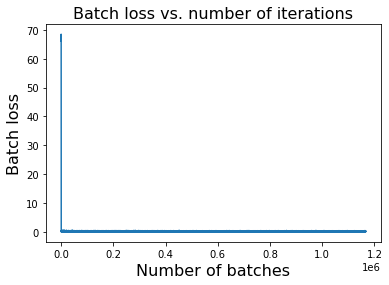

In [69]:
import matplotlib.pyplot as plt
iterations = list(range(1, len(batch_losses) + 1))
plt.plot(iterations, batch_losses)
plt.xlabel('Number of batches', fontsize = 16)
plt.ylabel('Batch loss', fontsize = 16)
plt.title('Batch loss vs. number of iterations', fontsize = 16)

Now that we have a neural network segmentor model that takes as input three-dimensional RGB vectors that define each pixel in an image and outputs a distribution over the possible classes that that pixel could belong to, we can apply it to predict class labels for tiles from the training set, and/or ideally, an unseen validation or test set.

Select and load image mask pairs to run through the NN segmentor network. 

In [70]:
def mine_highest_entropy_tile(image: np.ndarray,
                              mask: np.ndarray,
                              tile_size: int = 512) -> Tuple[float, float, np.ndarray, np.ndarray, List[float]]:
    """
    Mine highest entropy tile from an image and mask pair. The tile will have the
    highest entropy with respect to the distribution of classes present in the
    corresponding mask. The algorithm will repetitively calculate the entropy
    for each tile and update the max_entropy_tile and max_entropy_tile_mask as
    and when a tile with higher entropy is encountered.
    
    Parameters
    -----------
    image: np.ndarray
        The image of arbitrary size
    
    mask: np.ndarray
        The mask with the same dimensionality
        as the image.
    
    tile_size: int
        The size of the square tiles to extract
        from the image. (Default = 512)
    
    Returns
    --------
    Tuple[float, float, np.ndarray, np.ndarray, List[float]]
    
    Returns the following from the tile-wise scan:
    
    max_entropy: float
        The maximum entropy of all the tiles of size tile_size x tile_size
        that are available in the image.
    
    min_entropy: float
        The minimum entropy of all the tiles of size tile_size x tile_size
        that are available in the image.
    
    max_entropy_tile: np.ndarray
        The maximum entropy tile from all the tiles scanned. This is 
        a numpy array of size tile_size x tile_size. 
    
    max_entropy_tile_mask: np.ndarray
        The maximum entropy tile mask scanned from all the tile masks.
        It has the same coordinates as the max_entropy_tile, and is
        of shape tile_size x tile_size. 
    
    tile_class_distribution_entropies: List[float]
        The entropy values of all the tiles scanned. 
    """
    
    max_entropy = -np.inf
    max_entropy_tile = None
    max_entropy_tile_mask = None
    n_tiles_scanned = 0
    available_classes = list(putil.enlist_class_presence(mask))
    tile_class_distribution_entropies = []
    
    R, C, n_channels = image.shape
    for i in range(0, R, tile_size):
        for j in range(0, C, tile_size):
            try:
                tile = image[i: i + tile_size, j: j + tile_size, :]
                if tile.shape == (tile_size, tile_size, n_channels):
                    n_tiles_scanned += 1
                    tile_mask = mask[i: i + tile_size, j: j + tile_size, :]
                    class_distribution = putil.summarize_class_distribution(tile_mask)
                    current_tile_entropy = entropy(list(class_distribution.values()))
                    tile_class_distribution_entropies.append(current_tile_entropy)
                    
                    if current_tile_entropy > max_entropy:
                        max_entropy = current_tile_entropy
                        max_entropy_tile = tile
                        max_entropy_tile_mask = tile_mask
            except IndexError:
                print(f"Skipping tile at position ({i}, {j}) because it is out of bounds.")
    
    min_entropy = min(tile_class_distribution_entropies)
    assert max_entropy == max(tile_class_distribution_entropies)
    
    max_entropy_tile_classes = set(list(putil.enlist_class_presence(max_entropy_tile_mask)))
    
    print(f"Number of {tile_size}-sized tiles scanned: {n_tiles_scanned}")
            
    return max_entropy, min_entropy, max_entropy_tile, max_entropy_tile_mask, tile_class_distribution_entropies

Load and read the first image and mask pair

In [72]:
image = tifffile.imread(os.path.join(ROOT_FOLDER, IMAGE_SUBFOLDER, image_files[0]))
mask = tifffile.imread(os.path.join(ROOT_FOLDER, MASK_SUBFOLDER, mask_files[0]))

In [73]:
print(image.shape)

(25344, 5888, 3)


In [74]:
print(mask.shape)

(25344, 5888, 3)


Extract max entropy image and corresponding tile out of the image.

In [75]:
_, _, max_entropy_tile, max_entropy_tile_mask, _ = mine_highest_entropy_tile(image = image,
                                                                             mask = mask,
                                                                             tile_size = 512)

Number of 512-sized tiles scanned: 539


Print shapes of max entropy tile and max entropy tile masks

In [77]:
print(max_entropy_tile.shape)

(512, 512, 3)


In [78]:
print(max_entropy_tile_mask.shape)

(512, 512, 3)


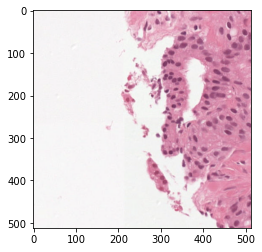

In [79]:
plt.imshow(max_entropy_tile)

Enlist class presence and distribution in the max entropy tile and max entropy tile mask

In [81]:
putil.enlist_class_presence(max_entropy_tile_mask)

array([0, 1, 4], dtype=uint8)

In [83]:
putil.summarize_class_distribution(max_entropy_tile_mask)

{0: 0.26, 1: 0.46, 4: 0.27}

In [91]:
def draw_mask(image: np.ndarray, 
              mask: np.ndarray,
              color_rgb_list: List[int] = [0, 255, 0]):
    
    """
    Function to draw mask on an image based on the
    mask given (mask). The mask will be translucent
    green given the default color in color_rgb_list = [0, 225, 0]
    
    Parameters
    -----------
    image: np.ndarray
        The image over which the mask is to be overlayed
    
    mask: np.ndarray
        The mask that is to be overlayed on the image. 
        This mask must be boolean (containing only True or False)
        
    color_rgb_list: List[int]
        The RGB pixel configuration of the color of the translucent
        mask to overlay on the image. 
        Default = [0, 255, 0] (green)
    
    Returns
    ---------
    np.ndarray
        The image with the colored mask overlaid along the 
        pixel locations which indicate True in the mask. 
    
    """
    
    masked_image = image.copy()
    masked_image = np.where(mask.astype(int),
                            np.array(color_rgb_list, dtype='uint8'),
                            masked_image)

    masked_image = masked_image.astype(np.uint8)

    return cv2.addWeighted(image, 0.3, masked_image, 0.7, 0)

In [92]:
def apply_segment_to_image_by_label(image,
                                    mask,
                                    label_id,
                                    color_lst):
    
    """
    Function to apply segmentation mask to image
    for a specific label_id
    
    Parameters
    -----------
    image: np.ndarray
        The image to which the segmentation mask is to
        be applied for that specific label_id
    
    mask: np.ndarray
        The mask which is to be applied to the image
        where the label_id is present
    
    label_id: int
        The label_id that is to be applied to the
        image from the segmentation mask
    
    color_lst: List[int]
        The color, expressed as list of RGB integer values,
        to be applied to the image where the label_id is
        present in the corresponding segmentation mask
    
    Returns
    --------
    np.ndarray
        The image with the segmentation mask applied
        at the pixel locations where label_id is present
        
    """
    
    avail_labels = list(putil.enlist_class_presence(mask))
    #assert label_id in avail_labels
    
    assert image.shape == mask.shape
    assert image.shape[-1] == 3 and mask.shape[-1] == 3
    
    assert np.sum(mask[:,:,1]) == 0 and np.sum(mask[:,:,2]) == 0
    
    if np.sum(mask[:,:,0]) == 0:
        print("The image is all background")
    
    reduced_mask = mask[:, :, 0]
    assert len(reduced_mask.shape) == 2
    
    assert set(list(np.unique(reduced_mask))) == set(avail_labels)
    
    boolean_label_mask = reduced_mask == label_id
    assert (reduced_mask == label_id).sum() == boolean_label_mask.sum()
    
    n_on_bits_for_label = (reduced_mask == label_id).sum()
    
    boolean_label_mask_3d = np.repeat(boolean_label_mask[:, :, np.newaxis], 3, axis=2)
    
    for i in range(3):
        assert np.sum(boolean_label_mask_3d[:, :, i]) == n_on_bits_for_label
        
    segmented_image = draw_mask(image, boolean_label_mask_3d, color_rgb_list = color_lst)
    
    return segmented_image

In [93]:
def apply_segment_to_image_by_multiple_labels(image: np.ndarray,
                                              mask: np.ndarray,
                                              label_ids: List[int],
                                              color_rgb_pixels: List[list[int,int,int]] = [[0, 255, 0],
                                                                                           [255, 0, 0],
                                                                                           [0, 0, 255],
                                                                                           [255, 255, 0],
                                                                                           [255, 0, 255],
                                                                                           [0, 255, 255],
                                                                                           [255, 165, 0],
                                                                                           [128, 0, 128]],
                                              colors: List[str] = ["green",
                                                                    "red",
                                                                    "blue",
                                                                    "yellow",
                                                                    "magenta",
                                                                     "cyan",
                                                                    "orange",
                                                                     "purple"],
                                              
                                              id_to_class: Dict[int, str] = {0:"background (non tissue) or unknown",
                                                                             1:"stroma (connective tissue, non-epithelium tissue)",
                                                                             2: "healthy (benign) epithelium",
                                                                             3: "cancerous epithelium (Gleason 3)",
                                                                             4: "cancerous epithelium (Gleason 4)",
                                                                             5: "cancerous epithelium (Gleason 5)"},
                                               print_color: bool = False) -> np.ndarray:
    
    for i in range(len(label_ids)):
        image = apply_segment_to_image_by_label(image = image,
                                                mask = mask,
                                                label_id = label_ids[i],
                                                color_lst = color_rgb_pixels[i])
        if print_color:
            print(f"{colors[i]} : {id_to_class[label_ids[i]]}")
    
    return image

In [94]:
gt_segmented_image = apply_segment_to_image_by_multiple_labels(image = max_entropy_tile,
                                                               mask = max_entropy_tile_mask,
                                                               label_ids = [0, 1, 4])

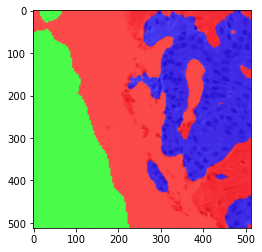

In [95]:
plt.imshow(gt_segmented_image)

Cast the shape and dimensions of the max entropy tile to make it compatible with nn_segmentor

In [100]:
casted_tile = torch.from_numpy(max_entropy_tile.reshape(-1, 3))

In [101]:
print(casted_tile.shape)

torch.Size([262144, 3])


Pass the casted tile through the nn segmentor model

In [103]:
nn_segmenter.eval()
logits = nn_segmenter(casted_tile.to(torch.float32))

Print the shape of the logits tensor

In [104]:
print(logits.shape)

torch.Size([262144, 6])


Now that we have obtained the logits, we will take the maximum along each position (row index) from the tensor in order to assign a class label to each pixel, indicated by the rows in the logits tensor

In [105]:
arg_logits = torch.argmax(logits, dim=1, keepdim=True)

In [107]:
arg_logits.shape

torch.Size([262144, 1])

Cast the arg_logits to numpy array

In [108]:
arg_logits = arg_logits.numpy()

Print the type of arg_logits to ensure correct conversion

In [111]:
type(arg_logits)

numpy.ndarray

Print the shape of arg_logits

In [117]:
arg_logits.shape

(262144, 1)

Print the type of classes found in arg_logits

In [118]:
np.unique(arg_logits)

array([0, 1, 4])

Re-cast the arg_logits into a mask to apply it to the original image

In [119]:
nn_mask = arg_logits.reshape(512, 512)
processed_nn_mask = np.zeros((512, 512, 3))
processed_nn_mask[:, :, 0] = nn_mask

In [120]:
print(processed_nn_mask.shape)

(512, 512, 3)


In [121]:
nn_segmented_image = apply_segment_to_image_by_multiple_labels(image = max_entropy_tile,
                                                               mask = processed_nn_mask,
                                                               label_ids = [0, 1, 4])

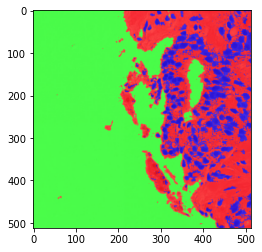

In [122]:
plt.imshow(nn_segmented_image)

Write function to plot the ground truth and neural network predicted segmentation masks for maximum entropy tiles mined from various different images

In [136]:
def plot_gt_nn_segmentation_results(input_image: np.ndarray,
                                    input_mask: np.ndarray,
                                    tile_size: int = 512):
    
    _, _, max_entropy_tile, max_entropy_tile_mask, _ = mine_highest_entropy_tile(image = input_image,
                                                                                 mask = input_mask,
                                                                                 tile_size = tile_size)
    
    label_ids = list(putil.enlist_class_presence(max_entropy_tile_mask))
    
    gt_segmented_image = apply_segment_to_image_by_multiple_labels(image = max_entropy_tile,
                                                                   mask = max_entropy_tile_mask,
                                                                   label_ids = label_ids,
                                                                   print_color = True)
    
    casted_tile = torch.from_numpy(max_entropy_tile.reshape(-1, 3))
    
    nn_segmenter.eval()
    logits = nn_segmenter(casted_tile.to(torch.float32))
    
    arg_logits = torch.argmax(logits, dim=1, keepdim=True)
    
    arg_logits = arg_logits.numpy()
    
    nn_label_ids = list(np.unique(arg_logits))
    
    nn_mask = arg_logits.reshape(tile_size, tile_size)
    processed_nn_mask = np.zeros((tile_size, tile_size, 3))
    processed_nn_mask[:, :, 0] = nn_mask
    
    nn_segmented_image = apply_segment_to_image_by_multiple_labels(image = max_entropy_tile,
                                                                   mask = processed_nn_mask,
                                                                   label_ids = nn_label_ids)
    
    fig, ax = plt.subplots(1, 3, figsize=(12, 6))

    ax[0].imshow(max_entropy_tile)
    ax[0].set_title('Original Image')  
    ax[0].axis('off')  

    ax[1].imshow(gt_segmented_image)
    ax[1].set_title(f'Ground Truth Segmented Image')  
    ax[1].axis('off')  

    ax[2].imshow(nn_segmented_image)
    ax[2].set_title(f'MLP Classifier Segmented Image')  
    ax[2].axis('off')  


    plt.tight_layout()

    plt.show()

Number of 512-sized tiles scanned: 539
green : background (non tissue) or unknown
red : stroma (connective tissue, non-epithelium tissue)
blue : cancerous epithelium (Gleason 4)


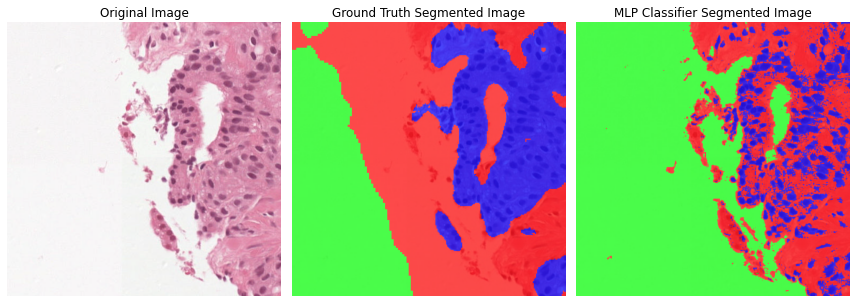

In [137]:
mask_file = mask_files[0]
image_file = image_files[0]
tile_size = 512

input_mask = tifffile.imread(os.path.join(ROOT_FOLDER, MASK_SUBFOLDER, mask_file))
input_image = tifffile.imread(os.path.join(ROOT_FOLDER, IMAGE_SUBFOLDER, image_file))

plot_gt_nn_segmentation_results(input_image = input_image,
                                input_mask = input_mask,
                                tile_size = tile_size)

Number of 512-sized tiles scanned: 704
green : background (non tissue) or unknown
red : stroma (connective tissue, non-epithelium tissue)
blue : healthy (benign) epithelium


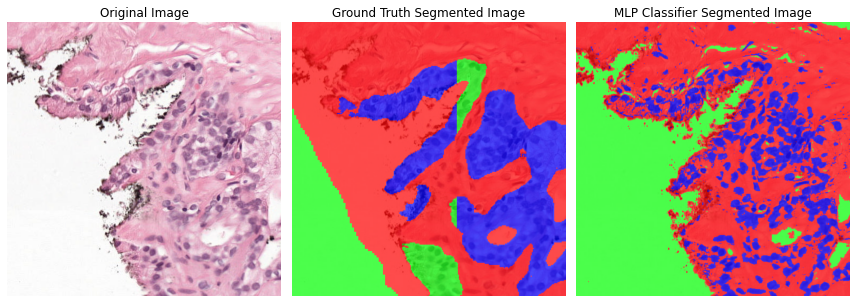

In [138]:
mask_file = mask_files[1]
image_file = image_files[1]
tile_size = 512

input_mask = tifffile.imread(os.path.join(ROOT_FOLDER, MASK_SUBFOLDER, mask_file))
input_image = tifffile.imread(os.path.join(ROOT_FOLDER, IMAGE_SUBFOLDER, image_file))

plot_gt_nn_segmentation_results(input_image = input_image,
                                input_mask = input_mask,
                                tile_size = tile_size)

Number of 512-sized tiles scanned: 260
green : background (non tissue) or unknown
red : stroma (connective tissue, non-epithelium tissue)
blue : healthy (benign) epithelium


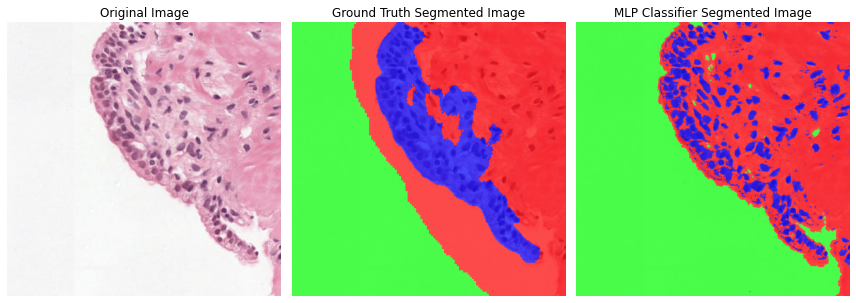

In [127]:
mask_file = mask_files[2]
image_file = image_files[2]
tile_size = 512

input_mask = tifffile.imread(os.path.join(ROOT_FOLDER, MASK_SUBFOLDER, mask_file))
input_image = tifffile.imread(os.path.join(ROOT_FOLDER, IMAGE_SUBFOLDER, image_file))

plot_gt_nn_segmentation_results(input_image = input_image,
                                input_mask = input_mask,
                                tile_size = tile_size)

Number of 512-sized tiles scanned: 60
green : background (non tissue) or unknown
red : stroma (connective tissue, non-epithelium tissue)
blue : cancerous epithelium (Gleason 4)


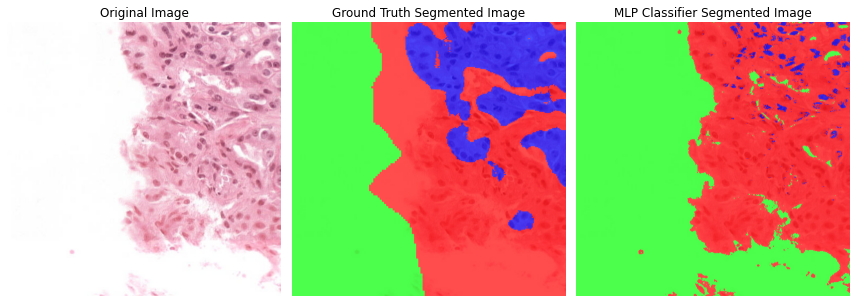

In [128]:
mask_file = mask_files[3]
image_file = image_files[3]
tile_size = 512

input_mask = tifffile.imread(os.path.join(ROOT_FOLDER, MASK_SUBFOLDER, mask_file))
input_image = tifffile.imread(os.path.join(ROOT_FOLDER, IMAGE_SUBFOLDER, image_file))

plot_gt_nn_segmentation_results(input_image = input_image,
                                input_mask = input_mask,
                                tile_size = tile_size)

Number of 512-sized tiles scanned: 846
green : background (non tissue) or unknown
red : stroma (connective tissue, non-epithelium tissue)
blue : healthy (benign) epithelium


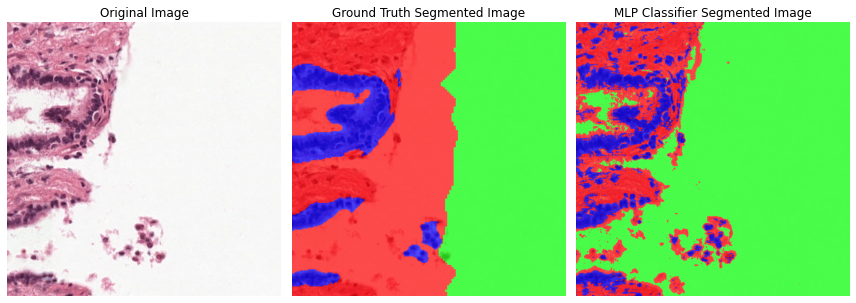

In [129]:
mask_file = mask_files[4]
image_file = image_files[4]
tile_size = 512

input_mask = tifffile.imread(os.path.join(ROOT_FOLDER, MASK_SUBFOLDER, mask_file))
input_image = tifffile.imread(os.path.join(ROOT_FOLDER, IMAGE_SUBFOLDER, image_file))

plot_gt_nn_segmentation_results(input_image = input_image,
                                input_mask = input_mask,
                                tile_size = tile_size)

Number of 512-sized tiles scanned: 667
green : background (non tissue) or unknown
red : stroma (connective tissue, non-epithelium tissue)
blue : cancerous epithelium (Gleason 4)


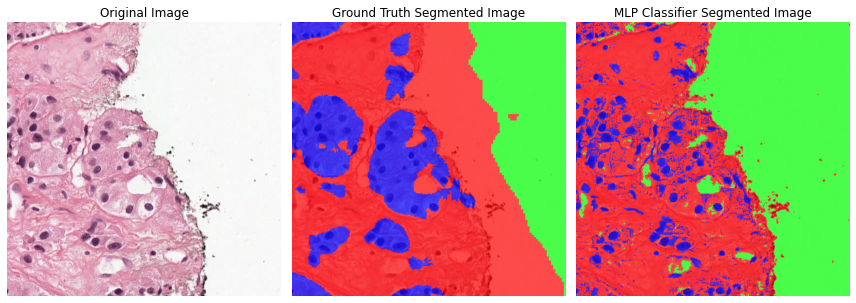

In [130]:
mask_file = mask_files[5]
image_file = image_files[5]
tile_size = 512

input_mask = tifffile.imread(os.path.join(ROOT_FOLDER, MASK_SUBFOLDER, mask_file))
input_image = tifffile.imread(os.path.join(ROOT_FOLDER, IMAGE_SUBFOLDER, image_file))

plot_gt_nn_segmentation_results(input_image = input_image,
                                input_mask = input_mask,
                                tile_size = tile_size)

Number of 512-sized tiles scanned: 782
green : background (non tissue) or unknown
red : stroma (connective tissue, non-epithelium tissue)
blue : healthy (benign) epithelium


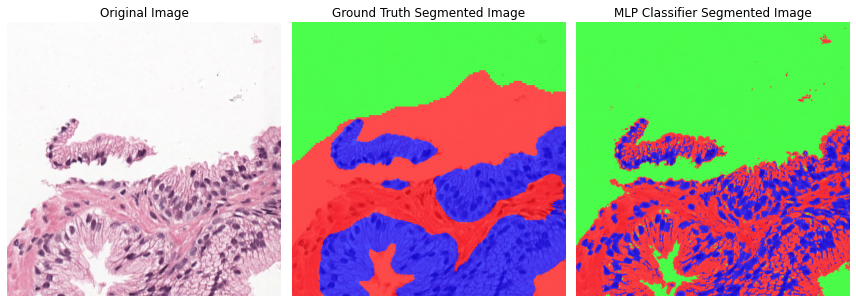

In [131]:
mask_file = mask_files[6]
image_file = image_files[6]
tile_size = 512

input_mask = tifffile.imread(os.path.join(ROOT_FOLDER, MASK_SUBFOLDER, mask_file))
input_image = tifffile.imread(os.path.join(ROOT_FOLDER, IMAGE_SUBFOLDER, image_file))

plot_gt_nn_segmentation_results(input_image = input_image,
                                input_mask = input_mask,
                                tile_size = tile_size)

Number of 512-sized tiles scanned: 1491
green : background (non tissue) or unknown
red : stroma (connective tissue, non-epithelium tissue)
blue : healthy (benign) epithelium
yellow : cancerous epithelium (Gleason 5)


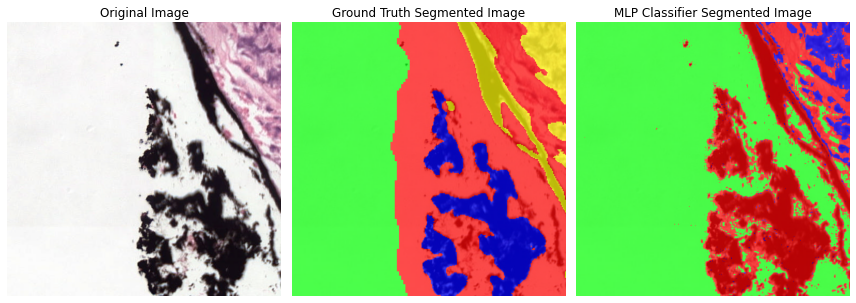

In [132]:
mask_file = mask_files[7]
image_file = image_files[7]
tile_size = 512

input_mask = tifffile.imread(os.path.join(ROOT_FOLDER, MASK_SUBFOLDER, mask_file))
input_image = tifffile.imread(os.path.join(ROOT_FOLDER, IMAGE_SUBFOLDER, image_file))

plot_gt_nn_segmentation_results(input_image = input_image,
                                input_mask = input_mask,
                                tile_size = tile_size)

Number of 512-sized tiles scanned: 352
green : background (non tissue) or unknown
red : stroma (connective tissue, non-epithelium tissue)
blue : healthy (benign) epithelium


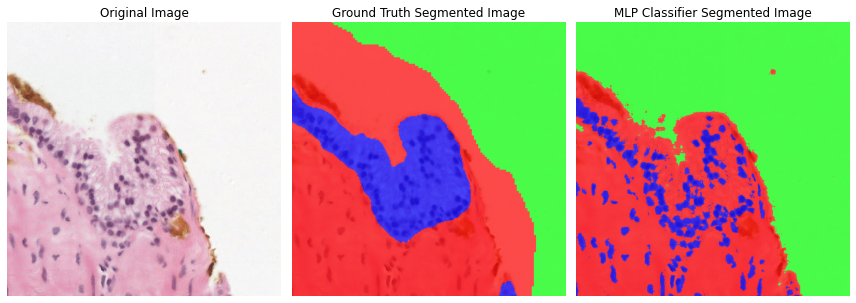

In [133]:
mask_file = mask_files[8]
image_file = image_files[8]
tile_size = 512

input_mask = tifffile.imread(os.path.join(ROOT_FOLDER, MASK_SUBFOLDER, mask_file))
input_image = tifffile.imread(os.path.join(ROOT_FOLDER, IMAGE_SUBFOLDER, image_file))

plot_gt_nn_segmentation_results(input_image = input_image,
                                input_mask = input_mask,
                                tile_size = tile_size)

Number of 512-sized tiles scanned: 1440
green : background (non tissue) or unknown
red : stroma (connective tissue, non-epithelium tissue)
blue : cancerous epithelium (Gleason 4)


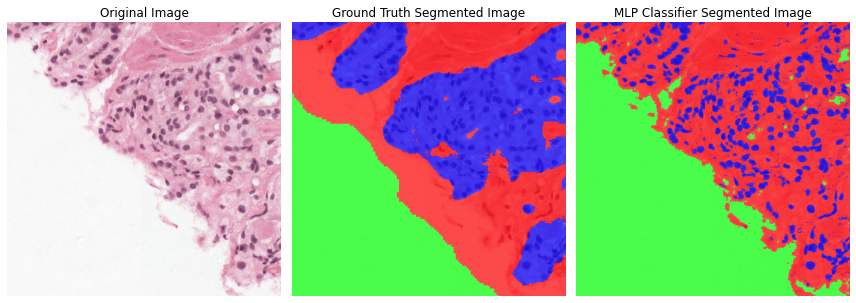

In [134]:
mask_file = mask_files[9]
image_file = image_files[9]
tile_size = 512

input_mask = tifffile.imread(os.path.join(ROOT_FOLDER, MASK_SUBFOLDER, mask_file))
input_image = tifffile.imread(os.path.join(ROOT_FOLDER, IMAGE_SUBFOLDER, image_file))

plot_gt_nn_segmentation_results(input_image = input_image,
                                input_mask = input_mask,
                                tile_size = tile_size)

Number of 224-sized tiles scanned: 2938
green : background (non tissue) or unknown
red : stroma (connective tissue, non-epithelium tissue)
blue : cancerous epithelium (Gleason 4)


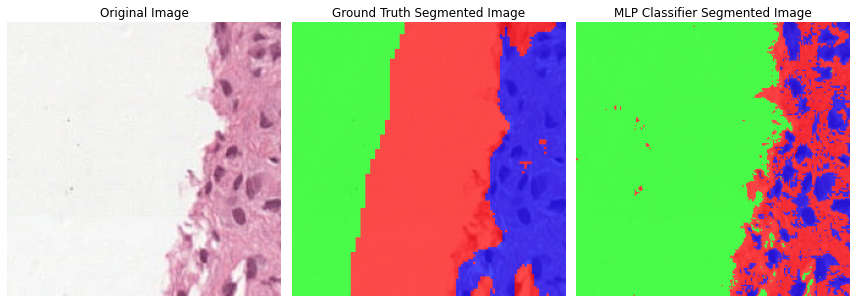

In [139]:
mask_file = mask_files[0]
image_file = image_files[0]
tile_size = 224

input_mask = tifffile.imread(os.path.join(ROOT_FOLDER, MASK_SUBFOLDER, mask_file))
input_image = tifffile.imread(os.path.join(ROOT_FOLDER, IMAGE_SUBFOLDER, image_file))

plot_gt_nn_segmentation_results(input_image = input_image,
                                input_mask = input_mask,
                                tile_size = tile_size)

Number of 224-sized tiles scanned: 3600
green : background (non tissue) or unknown
red : stroma (connective tissue, non-epithelium tissue)
blue : healthy (benign) epithelium


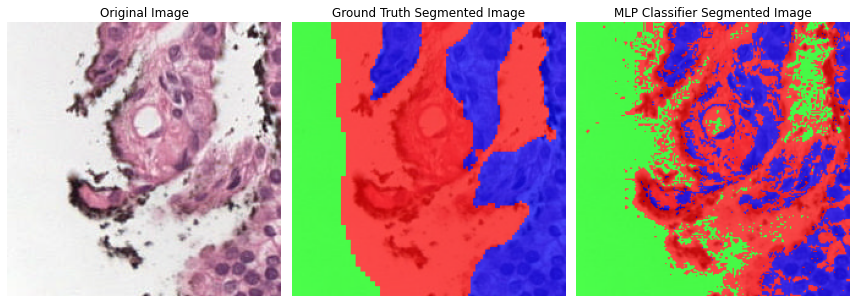

In [140]:
mask_file = mask_files[1]
image_file = image_files[1]
tile_size = 224

input_mask = tifffile.imread(os.path.join(ROOT_FOLDER, MASK_SUBFOLDER, mask_file))
input_image = tifffile.imread(os.path.join(ROOT_FOLDER, IMAGE_SUBFOLDER, image_file))

plot_gt_nn_segmentation_results(input_image = input_image,
                                input_mask = input_mask,
                                tile_size = tile_size)

Number of 224-sized tiles scanned: 1380
green : background (non tissue) or unknown
red : stroma (connective tissue, non-epithelium tissue)
blue : healthy (benign) epithelium


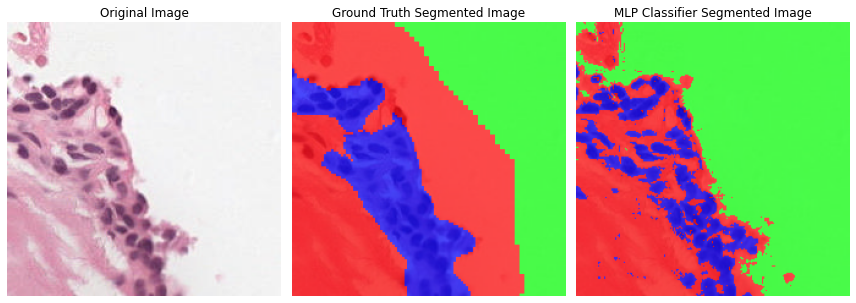

In [141]:
mask_file = mask_files[2]
image_file = image_files[2]
tile_size = 224

input_mask = tifffile.imread(os.path.join(ROOT_FOLDER, MASK_SUBFOLDER, mask_file))
input_image = tifffile.imread(os.path.join(ROOT_FOLDER, IMAGE_SUBFOLDER, image_file))

plot_gt_nn_segmentation_results(input_image = input_image,
                                input_mask = input_mask,
                                tile_size = tile_size)

Number of 224-sized tiles scanned: 306
green : background (non tissue) or unknown
red : stroma (connective tissue, non-epithelium tissue)
blue : cancerous epithelium (Gleason 3)
yellow : cancerous epithelium (Gleason 4)


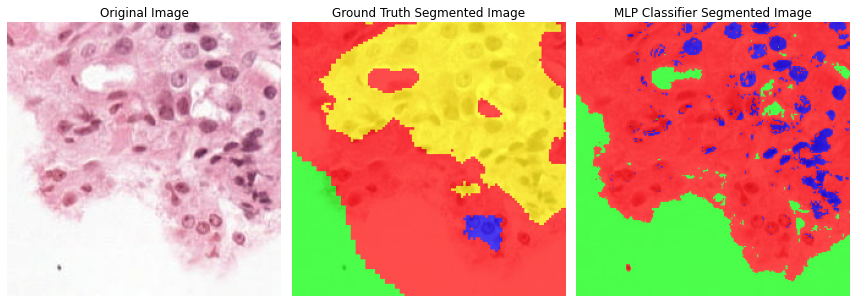

In [142]:
mask_file = mask_files[3]
image_file = image_files[3]
tile_size = 224

input_mask = tifffile.imread(os.path.join(ROOT_FOLDER, MASK_SUBFOLDER, mask_file))
input_image = tifffile.imread(os.path.join(ROOT_FOLDER, IMAGE_SUBFOLDER, image_file))

plot_gt_nn_segmentation_results(input_image = input_image,
                                input_mask = input_mask,
                                tile_size = tile_size)

Number of 224-sized tiles scanned: 4536
green : background (non tissue) or unknown
red : stroma (connective tissue, non-epithelium tissue)
blue : healthy (benign) epithelium


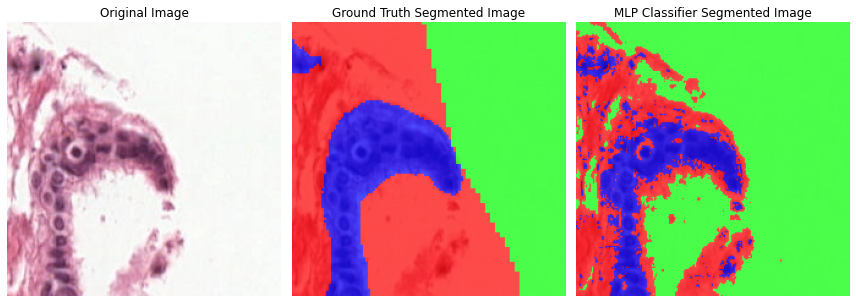

In [143]:
mask_file = mask_files[4]
image_file = image_files[4]
tile_size = 224

input_mask = tifffile.imread(os.path.join(ROOT_FOLDER, MASK_SUBFOLDER, mask_file))
input_image = tifffile.imread(os.path.join(ROOT_FOLDER, IMAGE_SUBFOLDER, image_file))

plot_gt_nn_segmentation_results(input_image = input_image,
                                input_mask = input_mask,
                                tile_size = tile_size)

Number of 224-sized tiles scanned: 3432
green : background (non tissue) or unknown
red : stroma (connective tissue, non-epithelium tissue)
blue : cancerous epithelium (Gleason 4)


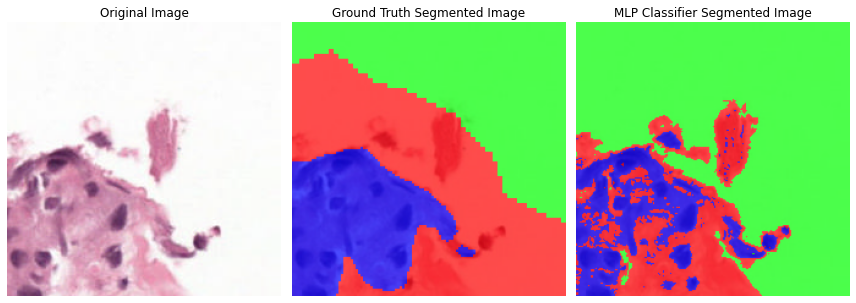

In [144]:
mask_file = mask_files[5]
image_file = image_files[5]
tile_size = 224

input_mask = tifffile.imread(os.path.join(ROOT_FOLDER, MASK_SUBFOLDER, mask_file))
input_image = tifffile.imread(os.path.join(ROOT_FOLDER, IMAGE_SUBFOLDER, image_file))

plot_gt_nn_segmentation_results(input_image = input_image,
                                input_mask = input_mask,
                                tile_size = tile_size)

Number of 224-sized tiles scanned: 4028
green : background (non tissue) or unknown
red : stroma (connective tissue, non-epithelium tissue)
blue : healthy (benign) epithelium


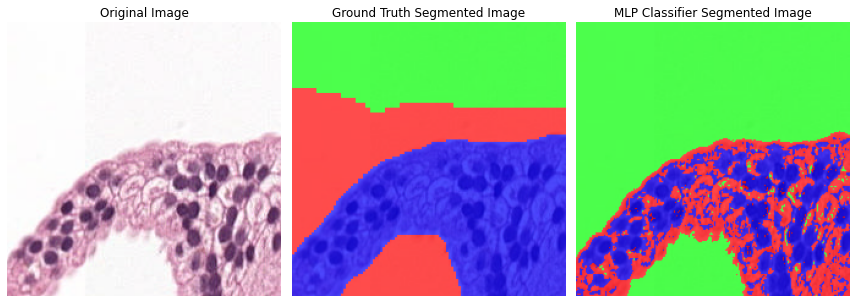

In [145]:
mask_file = mask_files[6]
image_file = image_files[6]
tile_size = 224

input_mask = tifffile.imread(os.path.join(ROOT_FOLDER, MASK_SUBFOLDER, mask_file))
input_image = tifffile.imread(os.path.join(ROOT_FOLDER, IMAGE_SUBFOLDER, image_file))

plot_gt_nn_segmentation_results(input_image = input_image,
                                input_mask = input_mask,
                                tile_size = tile_size)

Number of 224-sized tiles scanned: 7776
green : background (non tissue) or unknown
red : stroma (connective tissue, non-epithelium tissue)
blue : healthy (benign) epithelium
yellow : cancerous epithelium (Gleason 5)


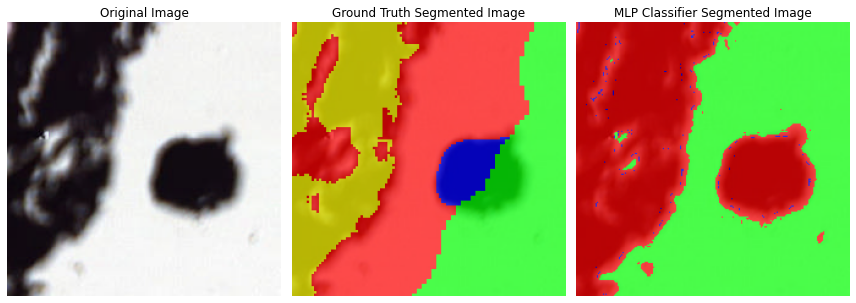

In [146]:
mask_file = mask_files[7]
image_file = image_files[7]
tile_size = 224

input_mask = tifffile.imread(os.path.join(ROOT_FOLDER, MASK_SUBFOLDER, mask_file))
input_image = tifffile.imread(os.path.join(ROOT_FOLDER, IMAGE_SUBFOLDER, image_file))

plot_gt_nn_segmentation_results(input_image = input_image,
                                input_mask = input_mask,
                                tile_size = tile_size)

Number of 224-sized tiles scanned: 1836
green : background (non tissue) or unknown
red : stroma (connective tissue, non-epithelium tissue)
blue : cancerous epithelium (Gleason 3)


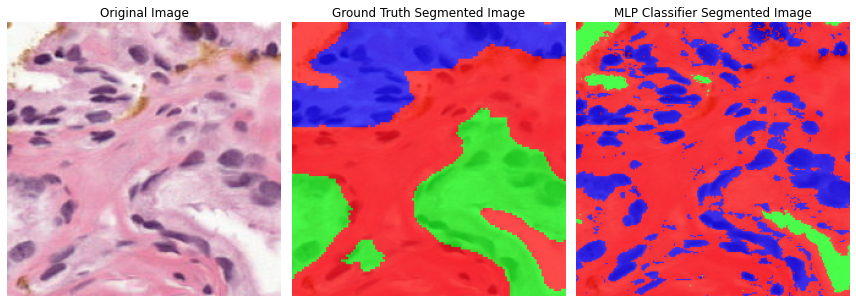

In [147]:
mask_file = mask_files[8]
image_file = image_files[8]
tile_size = 224

input_mask = tifffile.imread(os.path.join(ROOT_FOLDER, MASK_SUBFOLDER, mask_file))
input_image = tifffile.imread(os.path.join(ROOT_FOLDER, IMAGE_SUBFOLDER, image_file))

plot_gt_nn_segmentation_results(input_image = input_image,
                                input_mask = input_mask,
                                tile_size = tile_size)

Number of 224-sized tiles scanned: 7636
green : background (non tissue) or unknown
red : stroma (connective tissue, non-epithelium tissue)
blue : cancerous epithelium (Gleason 4)


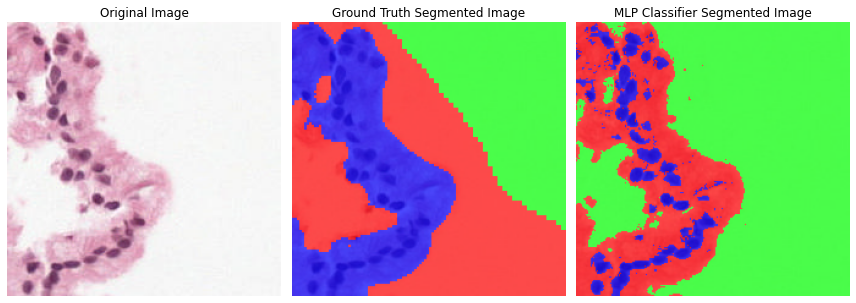

In [148]:
mask_file = mask_files[9]
image_file = image_files[9]
tile_size = 224

input_mask = tifffile.imread(os.path.join(ROOT_FOLDER, MASK_SUBFOLDER, mask_file))
input_image = tifffile.imread(os.path.join(ROOT_FOLDER, IMAGE_SUBFOLDER, image_file))

plot_gt_nn_segmentation_results(input_image = input_image,
                                input_mask = input_mask,
                                tile_size = tile_size)